In [1]:
from enum import unique
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import preprocessing
import statsmodels.api as sm
import matplotlib.pyplot as plt
from matplotlib import style
%matplotlib inline
data_monthly=pd.read_csv('Monthly_Food_Retail_Prices.csv')
data_weekly=pd.read_csv('Weekly_Food_Retail_Prices.csv')
data_monthly_nf=pd.read_csv('Monthly_Non_Food_Retail_Prices.csv')
data_weekly_nf=pd.read_csv('Weekly_Non_Food_Retail_Prices.csv')

<AxesSubplot:>

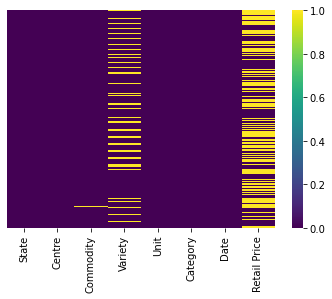

In [4]:
sns.heatmap(data_monthly.isnull(),yticklabels=False,cmap='viridis')

<AxesSubplot:>

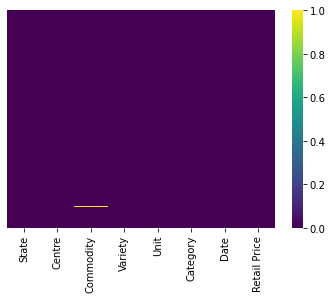

In [58]:
data_monthly["Retail Price"].fillna( method ='ffill', inplace = True)
data_monthly["Variety"].fillna( 'Normal', inplace = True)
data_monthly.dropna()
sns.heatmap(data_monthly.isnull(),yticklabels=False,cmap='viridis')

<AxesSubplot:xlabel='Retail Price', ylabel='State'>

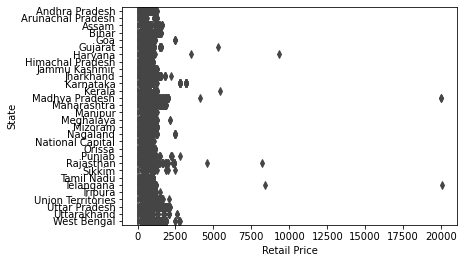

In [52]:
sns.boxplot(x='Retail Price', y='State', data=data_monthly, orient="h")

<h1> Difference in Highest and lowest Prices of Various Food/Non-Food Commodities

In [67]:
dw=data_weekly.dropna()
dw=dw[dw['Retail Price']!=0]
varieties_dw=(dw['Commodity']+"+"+dw['Variety']).unique()
count=(dw['Commodity']+"+"+dw['Variety']).nunique()
print(count)
max_diff=0
min_diff=1e5
for item in varieties_dw:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dw_item=dw[(dw['Commodity']==C) & (dw['Variety']==V)]
    item_max=dw_item['Retail Price'].max()
    item_min=dw_item['Retail Price'].min()
    print(C+" "+V)
    difference=item_max-item_min
    print(" max="+str(item_max)+" "+"min="+str(item_min)+" "+"difference="+str(difference))
    max_diff=max(max_diff,difference)
    min_diff=min(min_diff,difference)
print("max_diff= ",str(max_diff))
print("min_diff= ",str(min_diff))

47
Arhar Split
 max=1200.0 min=3.0 difference=1197.0
Atta FAQ
 max=147.0 min=2.0 difference=145.0
Bajra FAQ
 max=1500.0 min=1.3 difference=1498.7
Banana FAQ
 max=160.0 min=-45.0 difference=205.0
Biscuit Glucose
 max=3011.0 min=2.0 difference=3009.0
Apple Delicious medium size
 max=1600.0 min=4.0 difference=1596.0
Tomato FAQ
 max=800.0 min=1.0 difference=799.0
Turmeric Powdered Agmark
 max=1205.0 min=0.6 difference=1204.4
Urad Split
 max=547.0 min=15.0 difference=532.0
Wheat Desi
 max=125.0 min=2.0 difference=123.0
Wheat Kalyan HYV
 max=130.0 min=1.0 difference=129.0
Coriander Powdered Agmark
 max=300.0 min=3.0 difference=297.0
Cummin Seed Common
 max=20045.0 min=8.0 difference=20037.0
Fish Rohu 1Kg Size
 max=1000.0 min=10.0 difference=990.0
Ghee Desi
 max=8000.0 min=16.0 difference=7984.0
Gram Split
 max=4550.0 min=2.0 difference=4548.0
Gram Whole
 max=368.0 min=10.0 difference=358.0
Fish Cat Fish
 max=1200.0 min=5.0 difference=1195.0
Fish Pomphret
 max=1700.0 min=1.0 difference=1699.0

In [2]:
dm=data_monthly.dropna()
dm=dm[dm['Retail Price']!=0]
varieties_dm=(dm['Commodity']+"+"+dm['Variety']).unique()
count=(dm['Commodity']+"+"+dm['Variety']).nunique()
print(count)
max_diff=0
min_diff=1e5
for item in varieties_dm:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dm_item=dm[(dm['Commodity']==C) & (dm['Variety']==V)]
    item_max=dm_item['Retail Price'].max()
    item_min=dm_item['Retail Price'].min()
    print(" "+C+" "+V)
    difference=item_max-item_min
    print(" max="+str(item_max)+" "+"min="+str(item_min)+" "+"difference="+str(difference))
    max_diff=max(max_diff,difference)
    min_diff=min(min_diff,difference)
print("max_diff= ",str(max_diff))
print("min_diff= ",str(min_diff))

47
 Moong Split
 max=170.0 min=18.0 difference=152.0
 Onion FAQ
 max=160.0 min=2.5 difference=157.5
 Potato FAQ
 max=70.0 min=2.0 difference=68.0
 Ragi FAQ
 max=80.0 min=4.5 difference=75.5
 Red Chillies Powdered Agmark
 max=280.0 min=3.0 difference=277.0
 Rice Common/Coarse
 max=225.0 min=7.0 difference=218.0
 Rice Fine
 max=223.0 min=8.0 difference=215.0
 Salt Loose(common)
 max=350.0 min=0.5 difference=349.5
 Tea Brooke Bond Red Label
 max=1560.0 min=10.0 difference=1550.0
 Tea Ctc(loose)
 max=532.0 min=12.0 difference=520.0
 Rice Superfine
 max=210.0 min=10.0 difference=200.0
 Salt Packet(iodized)
 max=35.0 min=2.0 difference=33.0
 Arhar Split
 max=201.45 min=19.0 difference=182.45
 Atta FAQ
 max=142.0 min=6.0 difference=136.0
 Bajra FAQ
 max=120.0 min=3.5 difference=116.5
 Banana FAQ
 max=145.0 min=4.0 difference=141.0
 Biscuit Glucose
 max=90.0 min=2.0 difference=88.0
 Apple Delicious medium size
 max=400.0 min=4.0 difference=396.0
 Gur Local
 max=5400.0 min=8.0 difference=5392.0

In [68]:
dm_nf=data_monthly_nf.dropna()
dm_nf=dm_nf[dm_nf['Retail Price']!=0]
varieties_dm_nf=(dm_nf['Commodity']+"+"+dm_nf['Variety']).unique()
count=(dm_nf['Commodity']+"+"+dm_nf['Variety']).nunique()
print(count)
max_diff=0
min_diff=1e5
for item in varieties_dm_nf:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dm_nf_item=dm_nf[(dm_nf['Commodity']==C) & (dm_nf['Variety']==V)]
    item_max=dm_nf_item['Retail Price'].max()
    item_min=dm_nf_item['Retail Price'].min()
    print(C+" "+V)
    difference=item_max-item_min
    print(" max="+str(item_max)+" "+"min="+str(item_min)+" "+"difference="+str(difference))
    max_diff=max(max_diff,difference)
    min_diff=min(min_diff,difference)
print("max_diff= ",str(max_diff))
print("min_diff= ",str(min_diff))

21
Gents Dhoti Cotton
 max=800.0 min=10.0 difference=790.0
Ink Chelpark
 max=160.0 min=1.0 difference=159.0
Kettle Aluminium
 max=700.0 min=12.0 difference=688.0
Pant Cloth Terrycot
 max=745.0 min=7.0 difference=738.0
Paper Ruled Card Board Bound
 max=300.0 min=4.0 difference=296.0
Pent Cloth Cotton
 max=1230.0 min=13.0 difference=1217.0
Sandals-Ladies Bata
 max=1200.0 min=56.0 difference=1144.0
Saree Polyester
 max=999.0 min=10.0 difference=989.0
Saree Cotton
 max=1280.0 min=55.0 difference=1225.0
Shirting Terrycot
 max=550.0 min=5.0 difference=545.0
Shirting Cotton
 max=640.0 min=12.0 difference=628.0
Shoes-Gents Bata
 max=1799.0 min=78.0 difference=1721.0
Tawa Local-1Kg
 max=450.0 min=0.25 difference=449.75
Tooth Paste Colgate/Cibaca/Promise
 max=91.0 min=12.0 difference=79.0
Tooth Powder Colgate/Cibaca/Promise
 max=67.0 min=5.0 difference=62.0
Tumbler Steel-Normal Size
 max=380.0 min=7.0 difference=373.0
Bathing Soap Hamam
 max=55.0 min=7.0 difference=48.0
Bathing Soap Lifebuoy
 ma

In [69]:
dw_nf=data_weekly_nf.dropna()
dw_nf=dw_nf[dw_nf['Retail Price']!=0]
varieties_dw_nf=(dw_nf['Commodity']+"+"+dw_nf['Variety']).unique()
count=(dw_nf['Commodity']+"+"+dw_nf['Variety']).nunique()
print(count)
max_diff=0
min_diff=1e5
for item in varieties_dw_nf:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dw_nf_item=dw_nf[(dw_nf['Commodity']==C) & (dw_nf['Variety']==V)]
    item_max=dw_nf_item['Retail Price'].max()
    item_min=dw_nf_item['Retail Price'].min()
    print(C+" "+V)
    difference=item_max-item_min
    print(" max="+str(item_max)+" "+"min="+str(item_min)+" "+"difference="+str(difference))
    max_diff=max(max_diff,difference)
    min_diff=min(min_diff,difference)
print("max_diff= ",str(max_diff))
print("min_diff= ",str(min_diff))

21
Bathing Soap Hamam
 max=55.0 min=7.0 difference=48.0
Bathing Soap Lifebuoy
 max=1717.0 min=5.0 difference=1712.0
Chappal-Ladies Bata
 max=899.0 min=35.0 difference=864.0
Chappal-Rubber Bata
 max=4895.0 min=0.5 difference=4894.5
Detergent Powder Nirma/Any Other
 max=193.0 min=0.5 difference=192.5
Sandals-Ladies Bata
 max=1200.0 min=56.0 difference=1144.0
Saree Polyester
 max=999.0 min=10.0 difference=989.0
Saree Cotton
 max=1280.0 min=55.0 difference=1225.0
Shirting Terrycot
 max=550.0 min=5.0 difference=545.0
Shirting Cotton
 max=640.0 min=12.0 difference=628.0
Shoes-Gents Bata
 max=1799.0 min=78.0 difference=1721.0
Tawa Local-1Kg
 max=450.0 min=0.25 difference=449.75
Gents Dhoti Cotton
 max=800.0 min=10.0 difference=790.0
Ink Chelpark
 max=160.0 min=1.0 difference=159.0
Kettle Aluminium
 max=700.0 min=12.0 difference=688.0
Pant Cloth Terrycot
 max=745.0 min=7.0 difference=738.0
Paper Ruled Card Board Bound
 max=300.0 min=4.0 difference=296.0
Pent Cloth Cotton
 max=1230.0 min=13.0 d

<h1> Plots of Weekly Food Commodities

The Mean Retail Price of Arhar Split is 69.63
Median 71.46
Mode 35.55
Standard Deviation 30.03


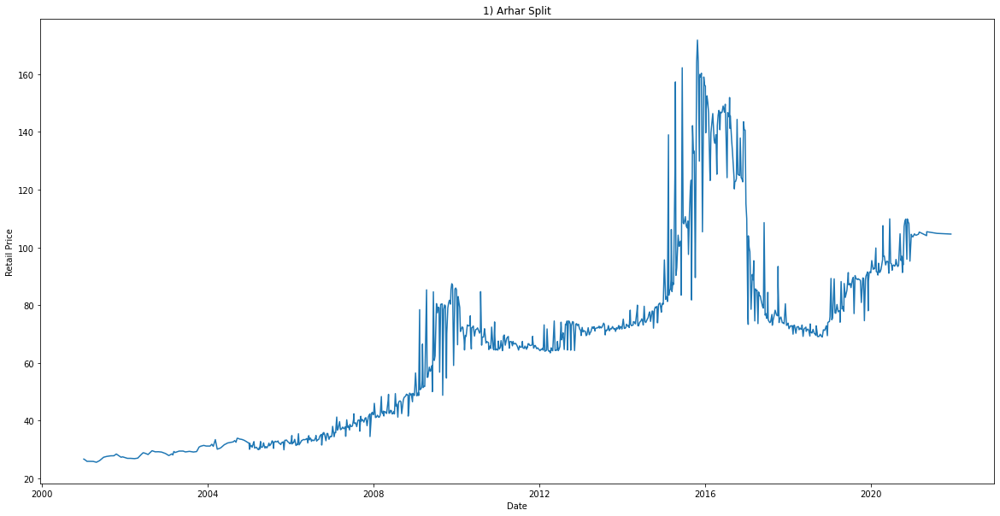

The Mean Retail Price of Atta FAQ is 21.74
Median 20.34
Mode 12.00
Standard Deviation 6.77


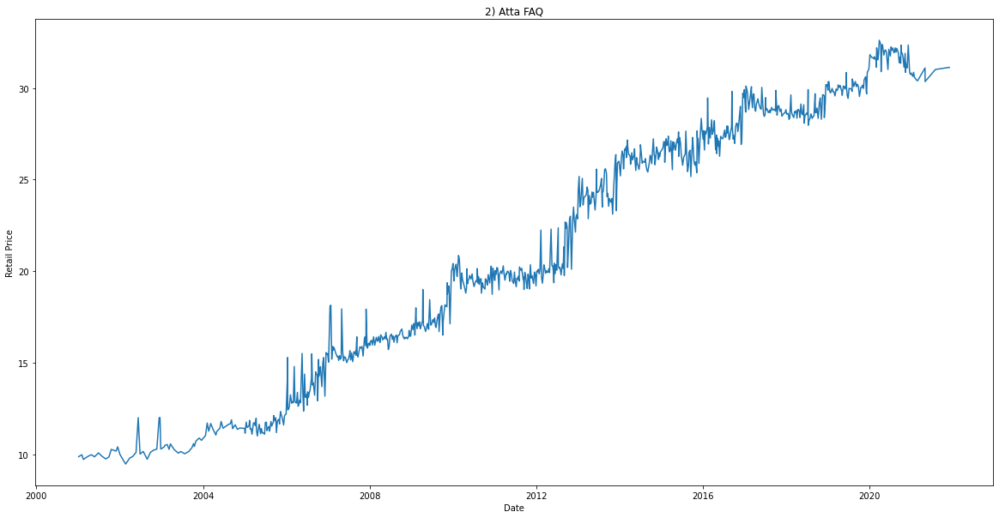

The Mean Retail Price of Bajra FAQ is 17.13
Median 17.19
Mode 21.00
Standard Deviation 6.83


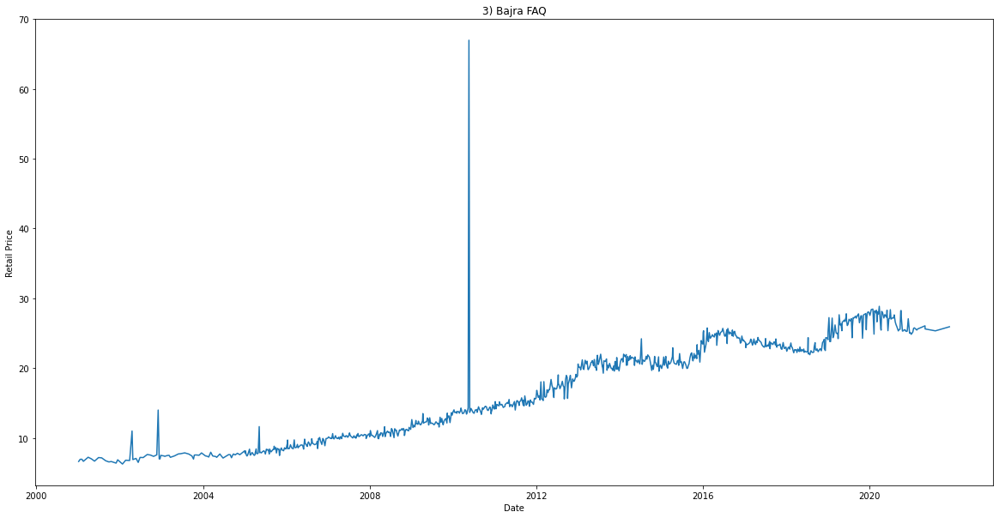

The Mean Retail Price of Banana FAQ is 29.98
Median 30.49
Mode 15.00
Standard Deviation 11.86


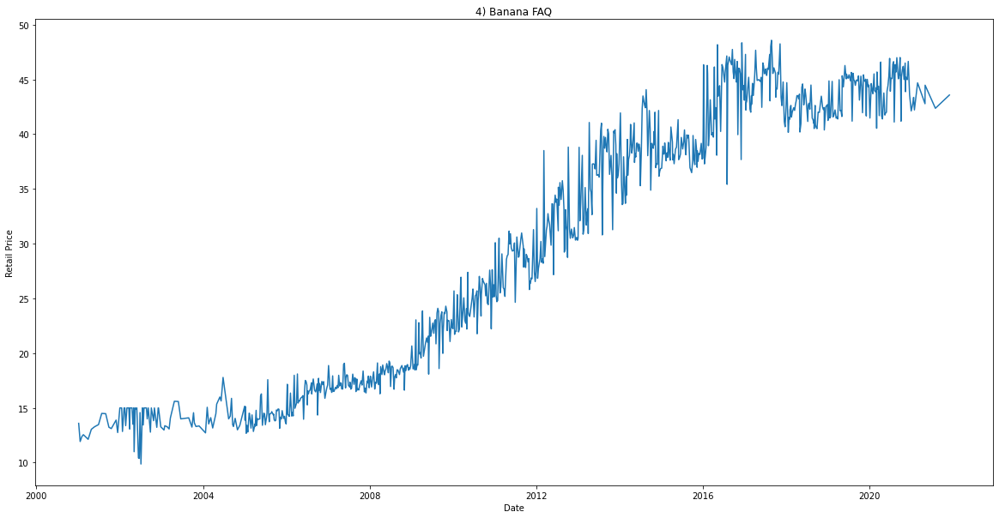

The Mean Retail Price of Biscuit Glucose is 6.34
Median 5.94
Mode 8.03
Standard Deviation 2.09


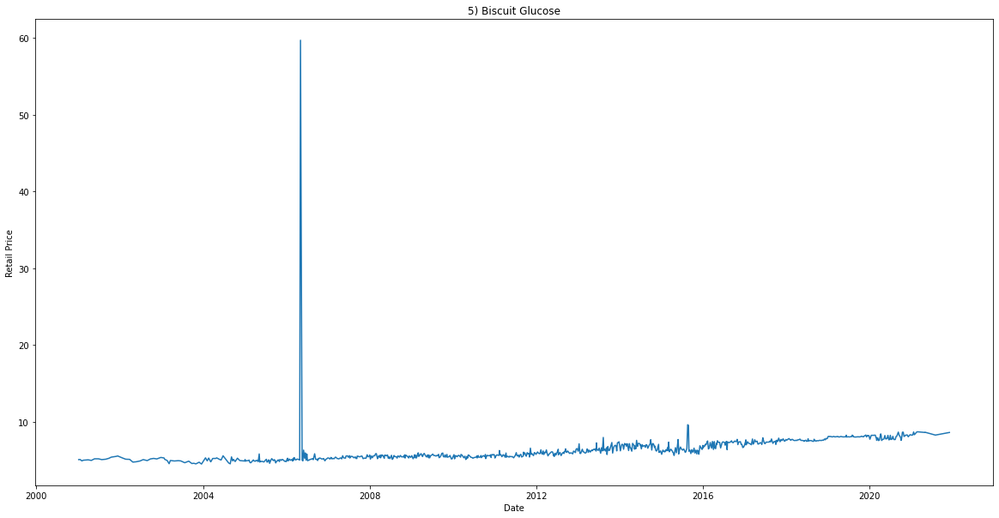

The Mean Retail Price of Apple Delicious medium size is 99.35
Median 101.17
Mode 100.00
Standard Deviation 33.20


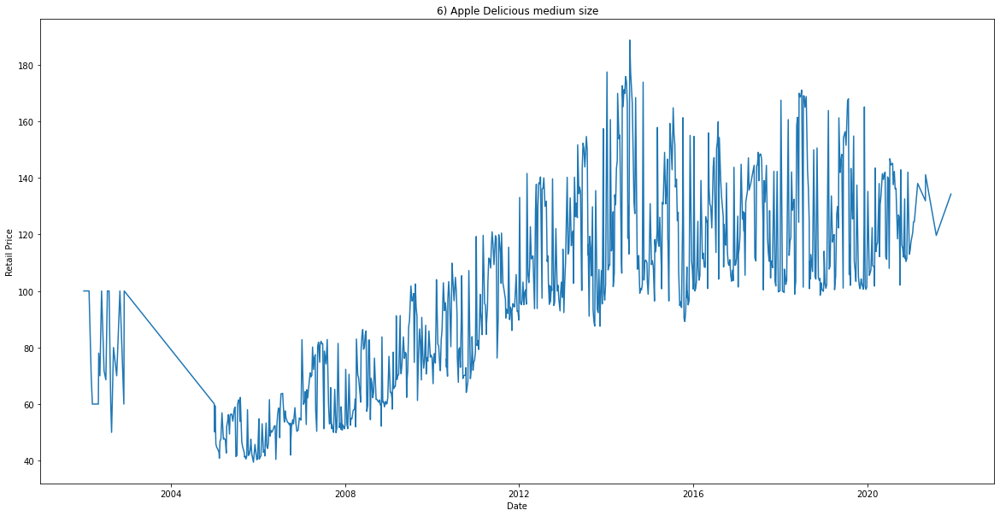

The Mean Retail Price of Tomato FAQ is 22.41
Median 19.95
Mode 10.00
Standard Deviation 11.19


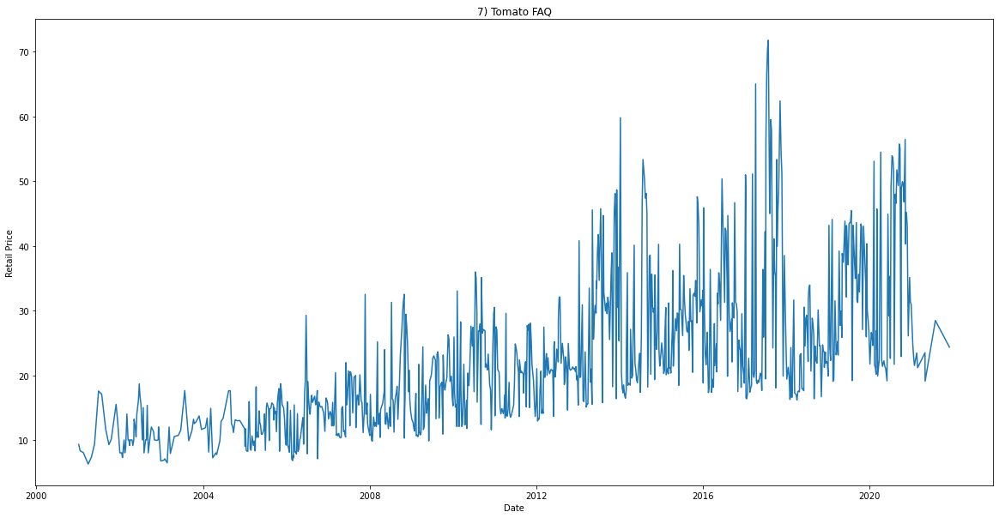

The Mean Retail Price of Turmeric Powdered Agmark is 17.29
Median 19.80
Mode 23.50
Standard Deviation 6.56


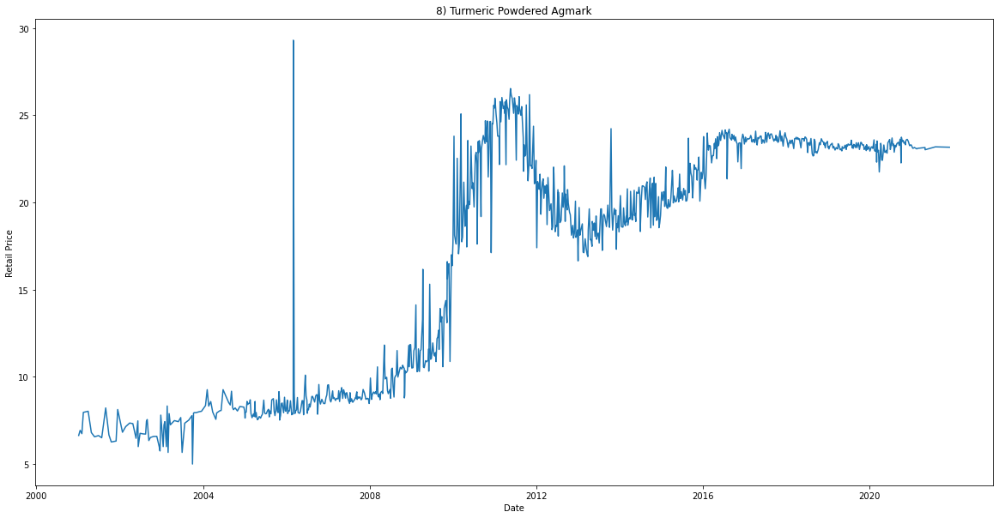

The Mean Retail Price of Urad Split is 72.09
Median 69.13
Mode 76.42
Standard Deviation 31.21


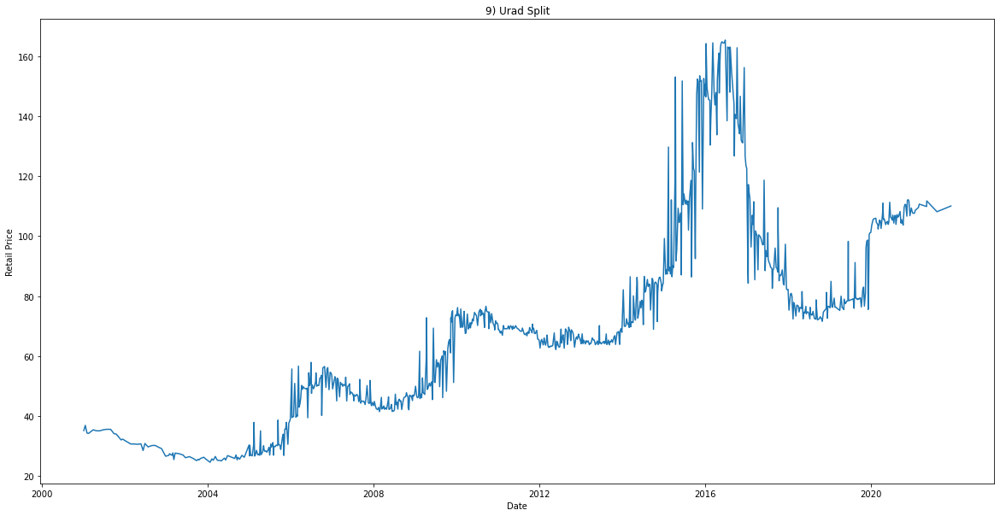

The Mean Retail Price of Wheat Desi is 20.64
Median 21.38
Mode 26.00
Standard Deviation 5.69


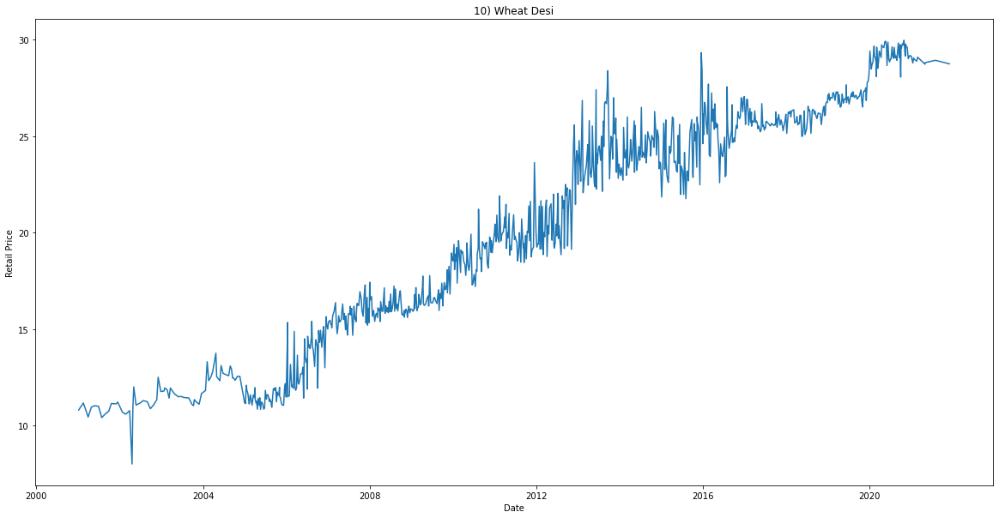

The Mean Retail Price of Wheat Kalyan HYV is 19.47
Median 18.56
Mode 26.78
Standard Deviation 6.53


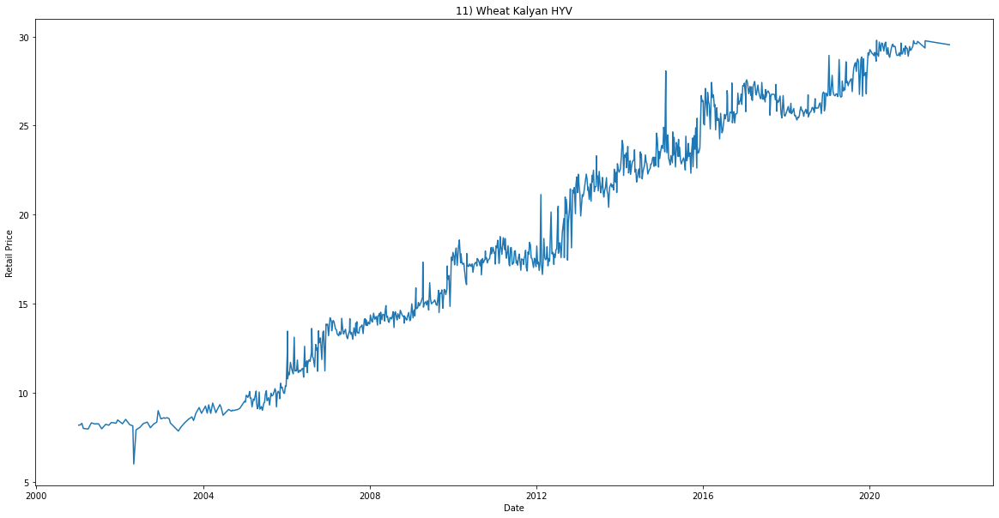

The Mean Retail Price of Coriander Powdered Agmark is 16.65
Median 14.76
Mode 22.34
Standard Deviation 6.29


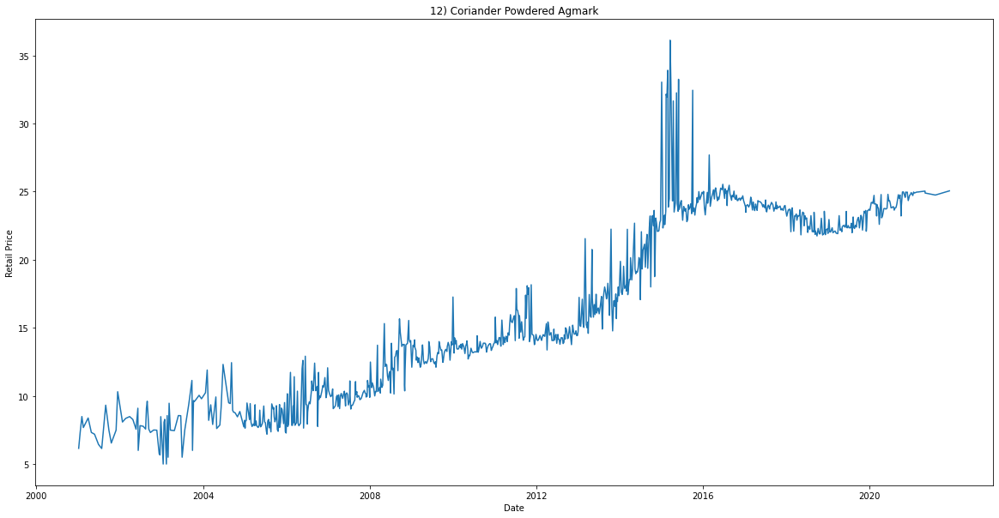

The Mean Retail Price of Cummin Seed Common is 189.39
Median 198.94
Mode 250.00
Standard Deviation 55.79


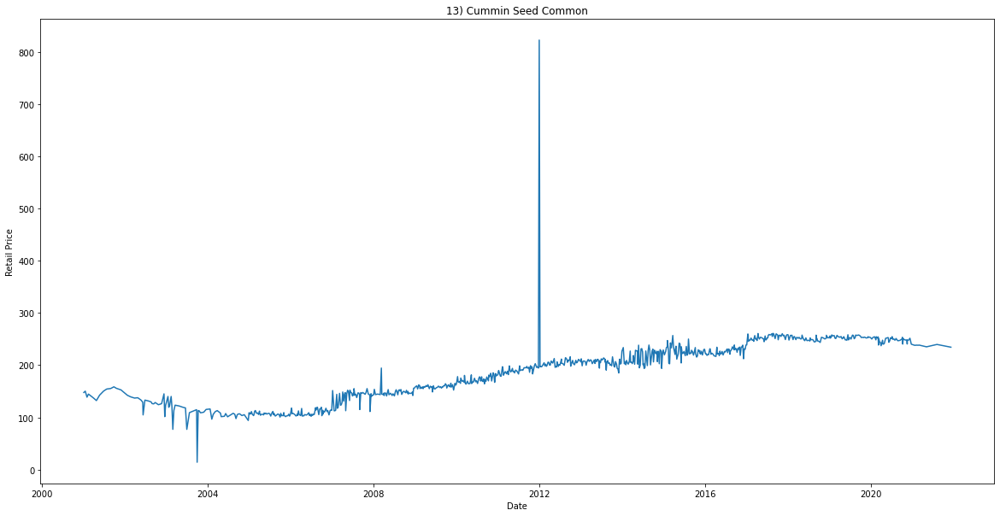

The Mean Retail Price of Fish Rohu 1Kg Size is 129.41
Median 128.21
Mode 135.00
Standard Deviation 50.70


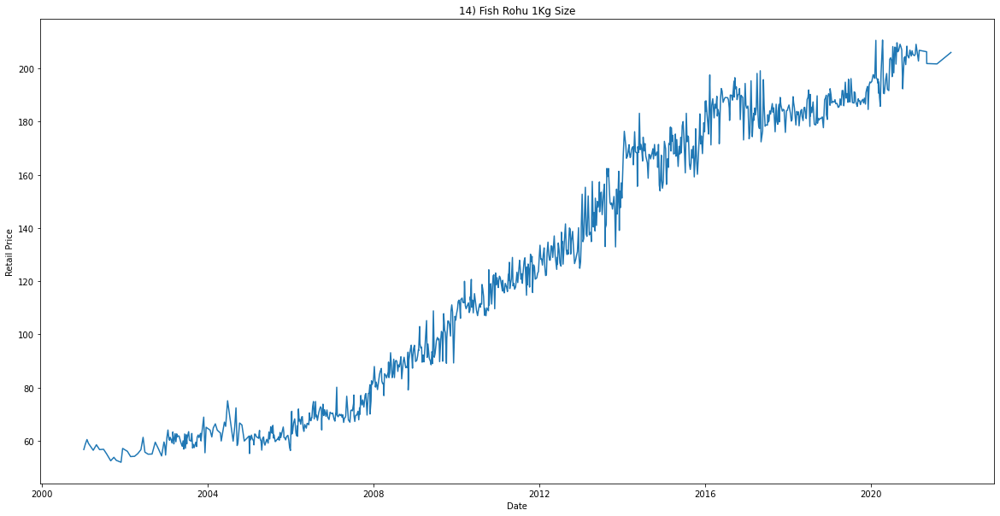

The Mean Retail Price of Ghee Desi is 326.58
Median 335.33
Mode 498.94
Standard Deviation 130.50


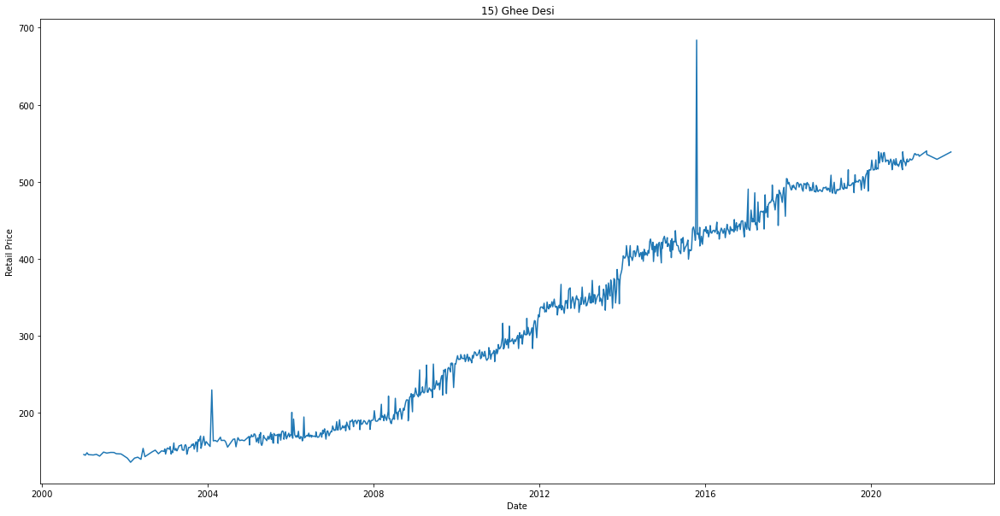

The Mean Retail Price of Gram Split is 53.74
Median 51.74
Mode 39.00
Standard Deviation 23.18


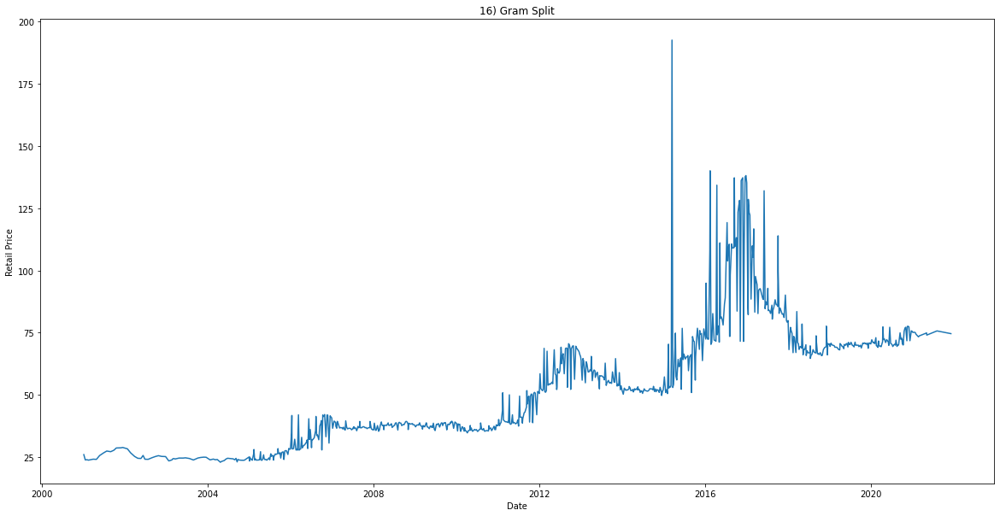

The Mean Retail Price of Gram Whole is 48.73
Median 46.64
Mode 64.00
Standard Deviation 20.13


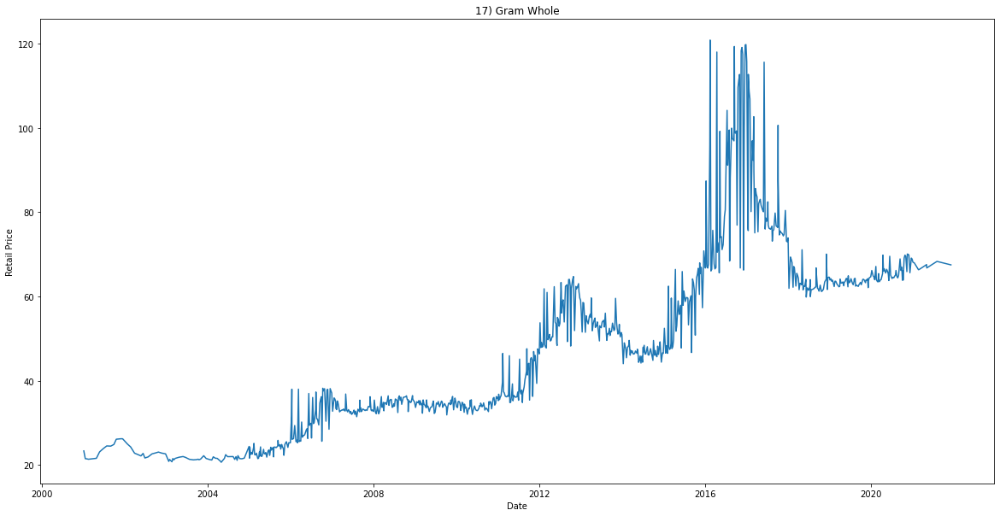

The Mean Retail Price of Fish Cat Fish is 186.42
Median 172.50
Mode 75.00
Standard Deviation 92.04


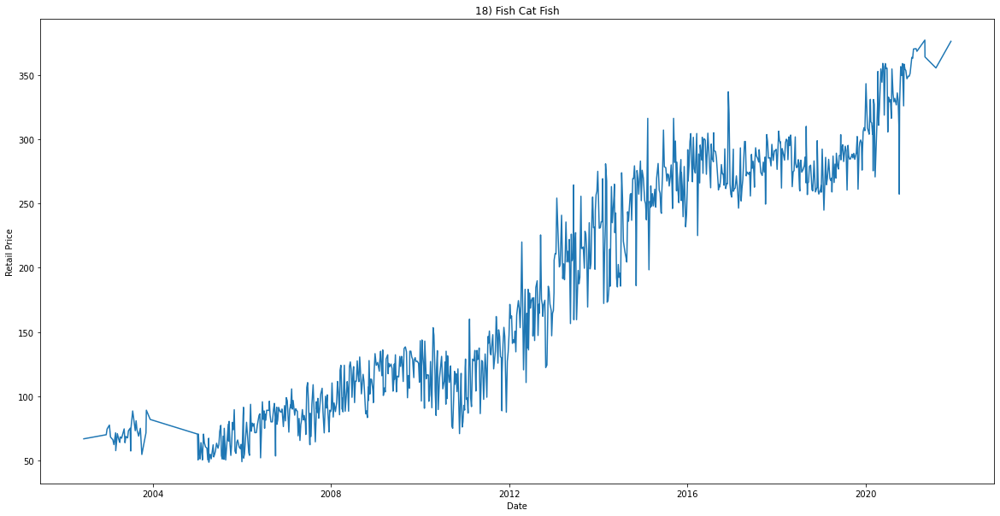

The Mean Retail Price of Fish Pomphret is 254.26
Median 236.56
Mode 135.00
Standard Deviation 133.39


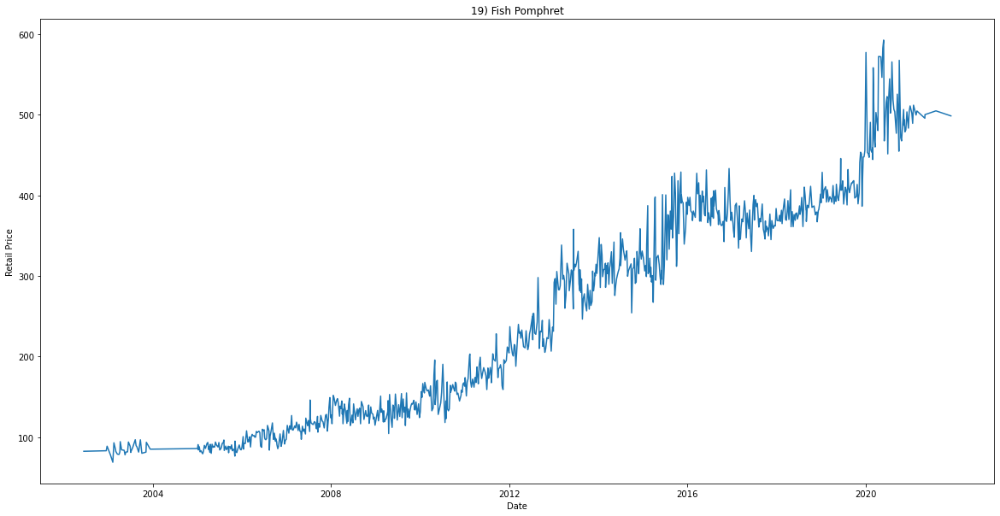

The Mean Retail Price of Moong Split is 72.55
Median 76.95
Mode 28.50
Standard Deviation 26.01


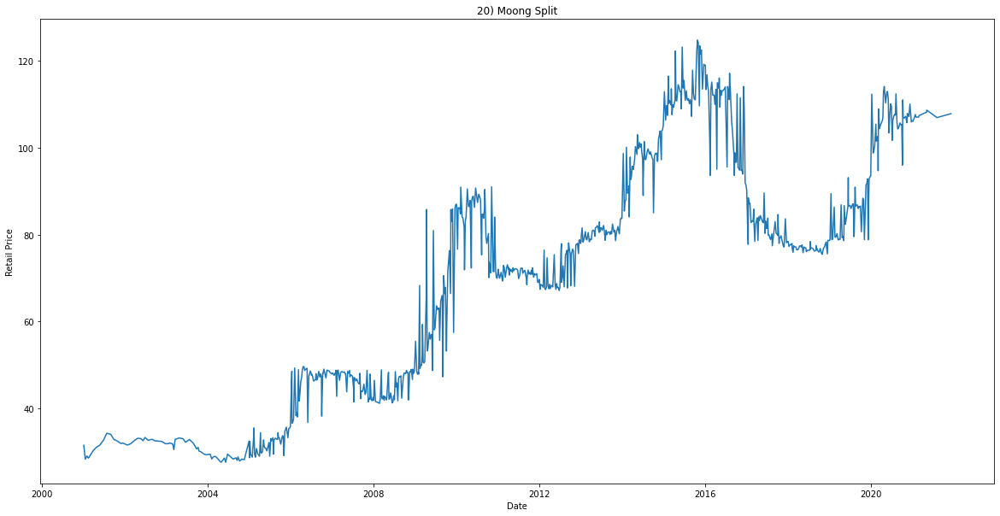

The Mean Retail Price of Onion FAQ is 21.19
Median 17.90
Mode 5.00
Standard Deviation 14.10


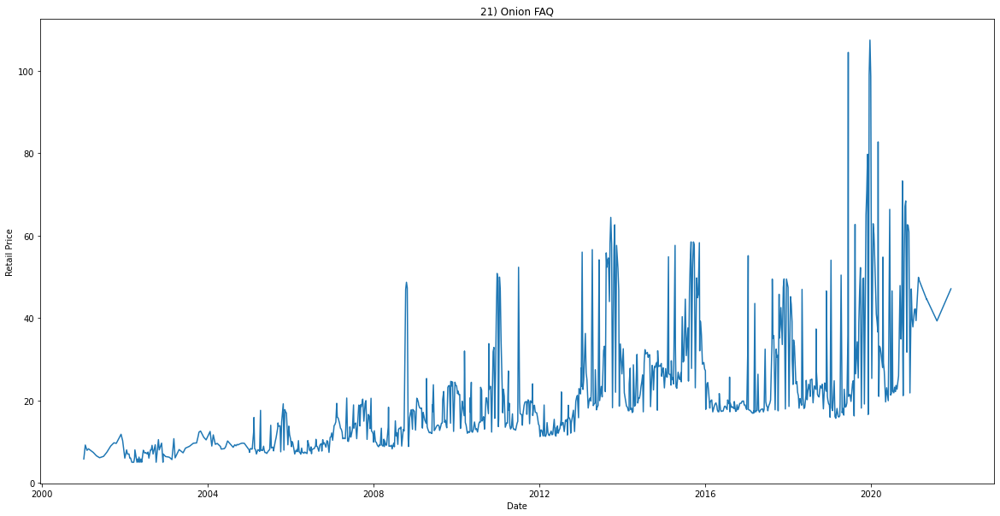

The Mean Retail Price of Potato FAQ is 15.73
Median 14.81
Mode 10.00
Standard Deviation 7.01


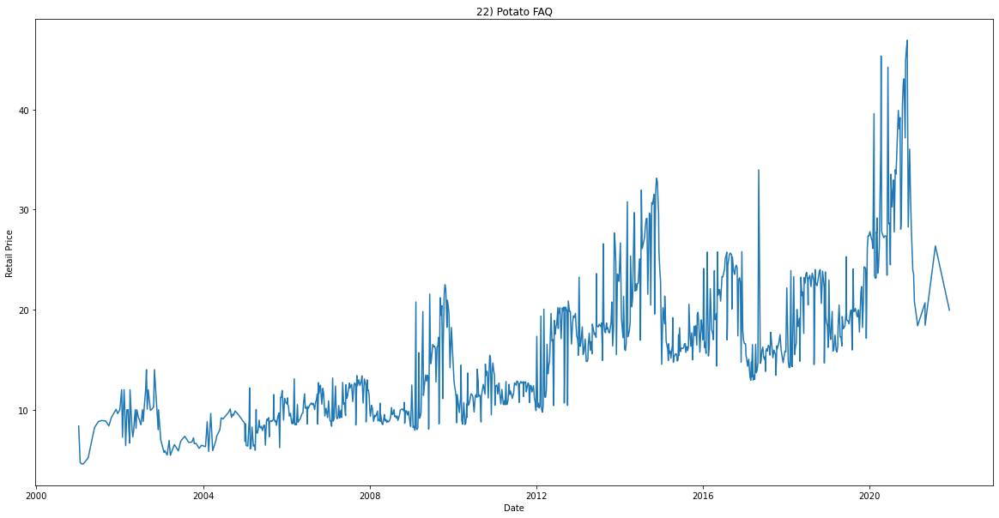

The Mean Retail Price of Ragi FAQ is 23.24
Median 18.35
Mode 16.75
Standard Deviation 10.55


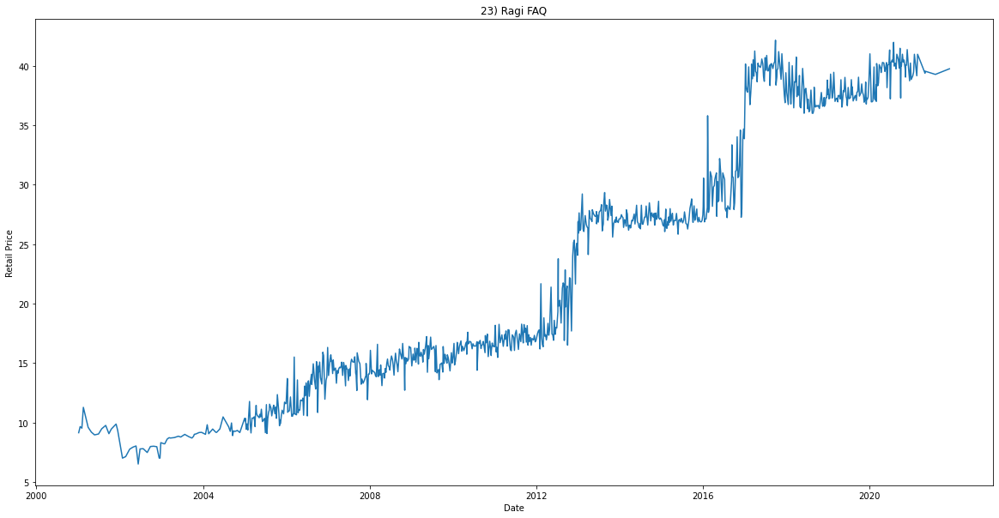

The Mean Retail Price of Red Chillies Powdered Agmark is 18.55
Median 18.90
Mode 6.00
Standard Deviation 6.27


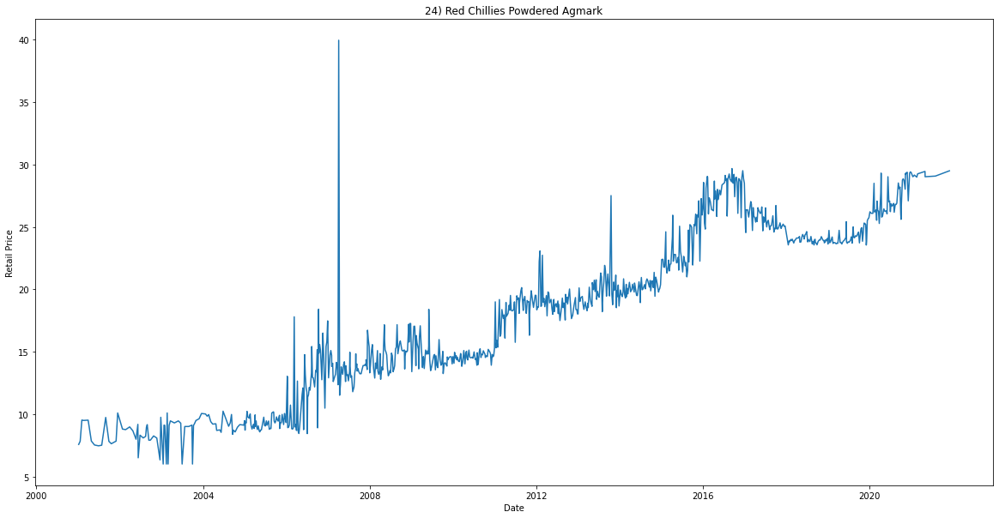

The Mean Retail Price of Rice Common/Coarse is 22.70
Median 22.30
Mode 12.00
Standard Deviation 7.53


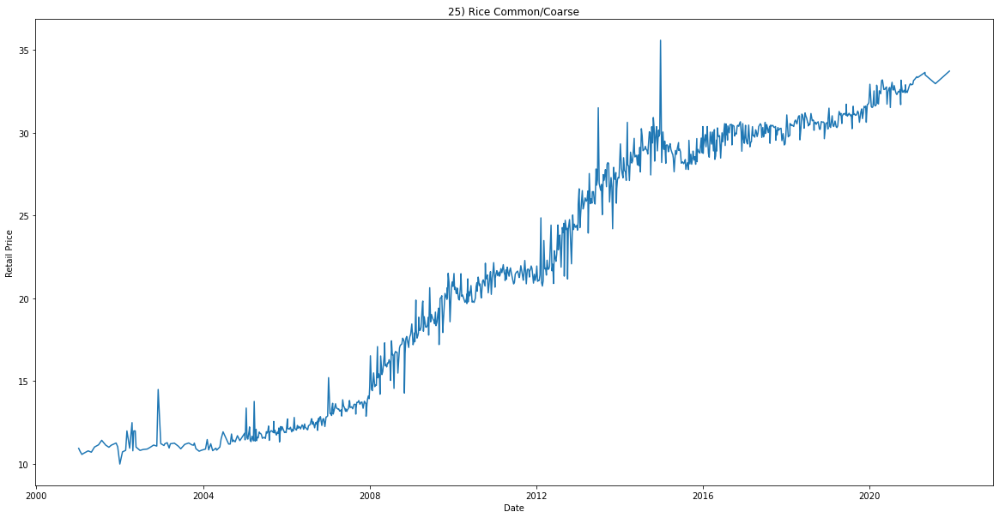

The Mean Retail Price of Rice Fine is 31.81
Median 31.02
Mode 17.72
Standard Deviation 10.38


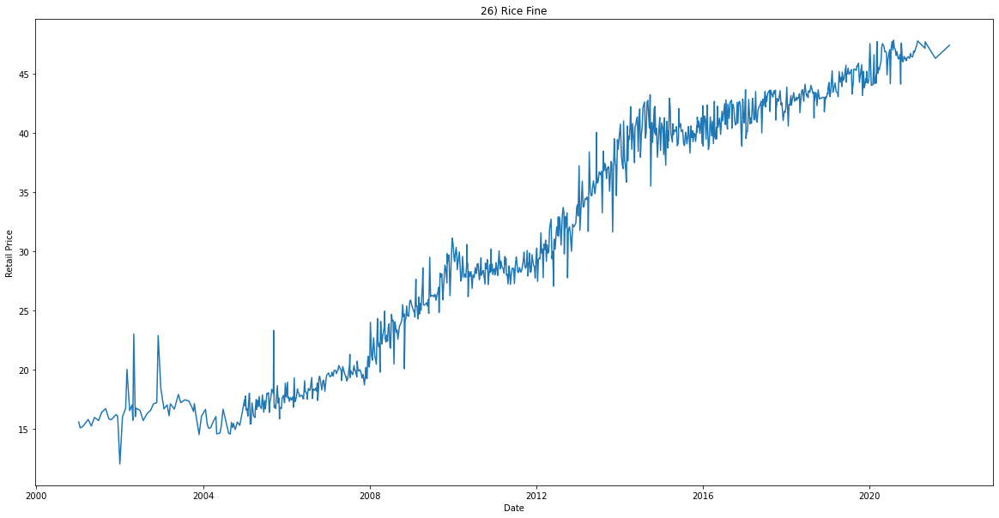

The Mean Retail Price of Salt Loose(common) is 6.95
Median 6.84
Mode 7.00
Standard Deviation 2.55


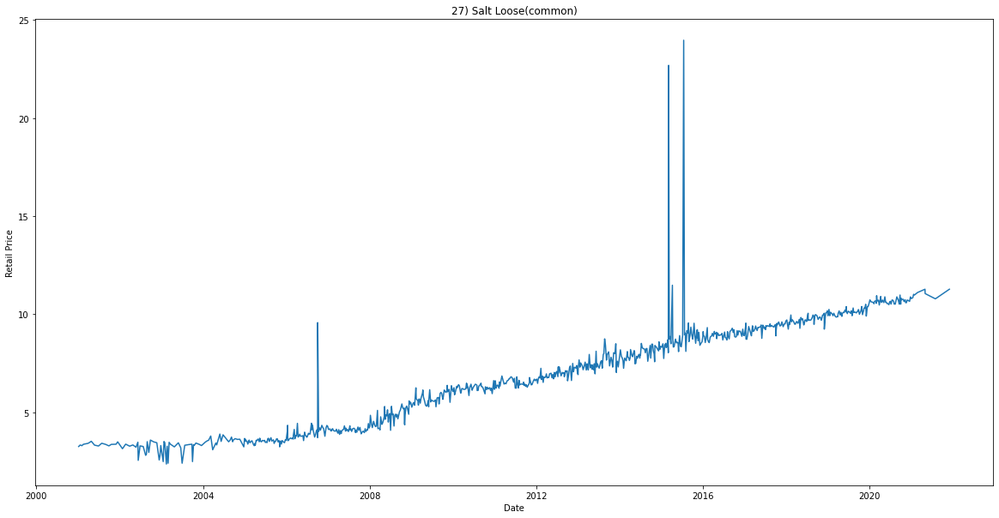

The Mean Retail Price of Tea Brooke Bond Red Label is 77.86
Median 75.35
Mode 45.00
Standard Deviation 22.73


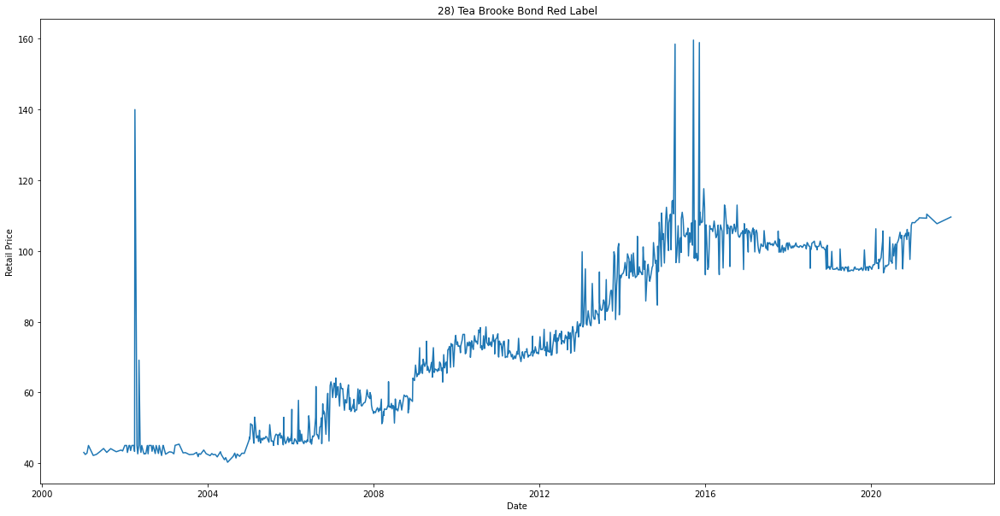

The Mean Retail Price of Tea Ctc(loose) is 186.78
Median 197.47
Mode 90.00
Standard Deviation 47.06


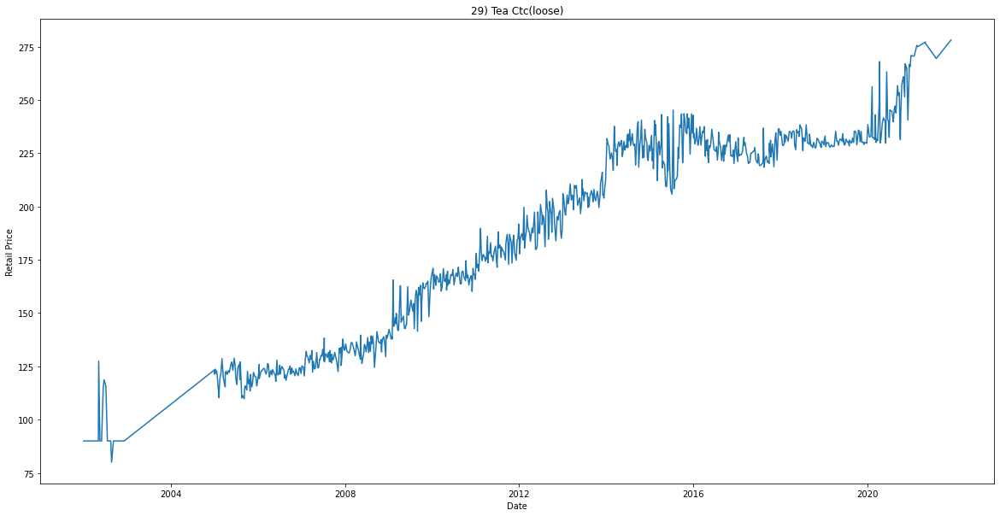

The Mean Retail Price of Rice Superfine is 49.73
Median 49.14
Mode 45.00
Standard Deviation 14.57


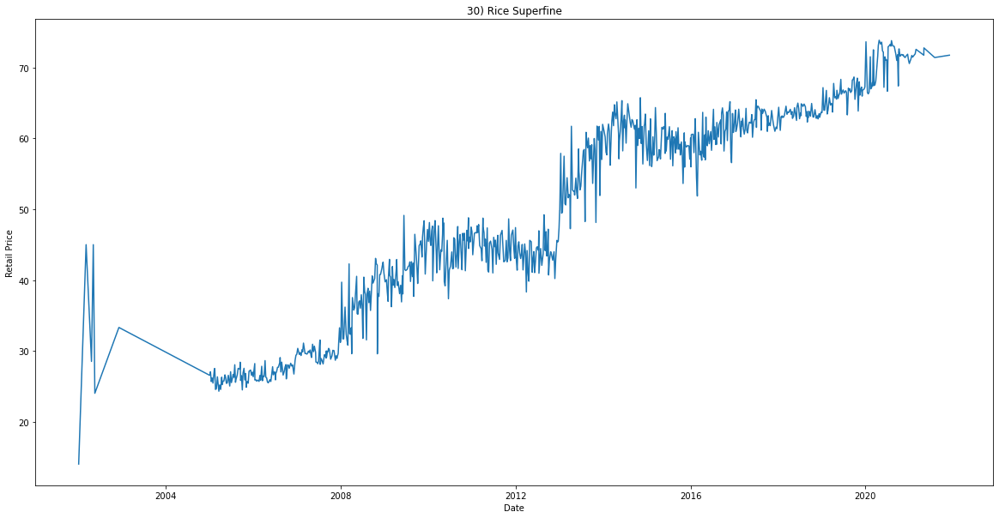

The Mean Retail Price of Salt Packet(iodized) is 13.33
Median 14.07
Mode 15.50
Standard Deviation 3.79


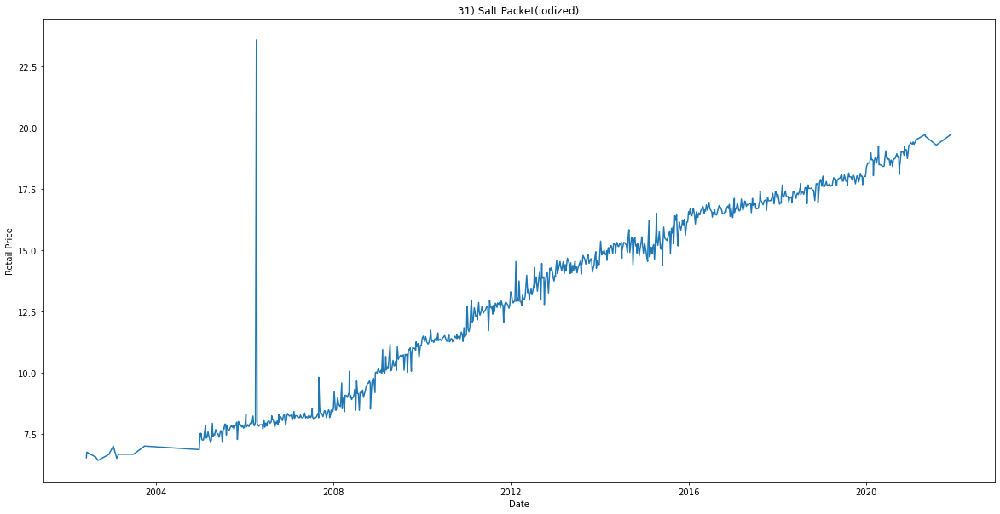

The Mean Retail Price of Black Pepper Whole is 438.70
Median 437.58
Mode 137.82
Standard Deviation 271.03


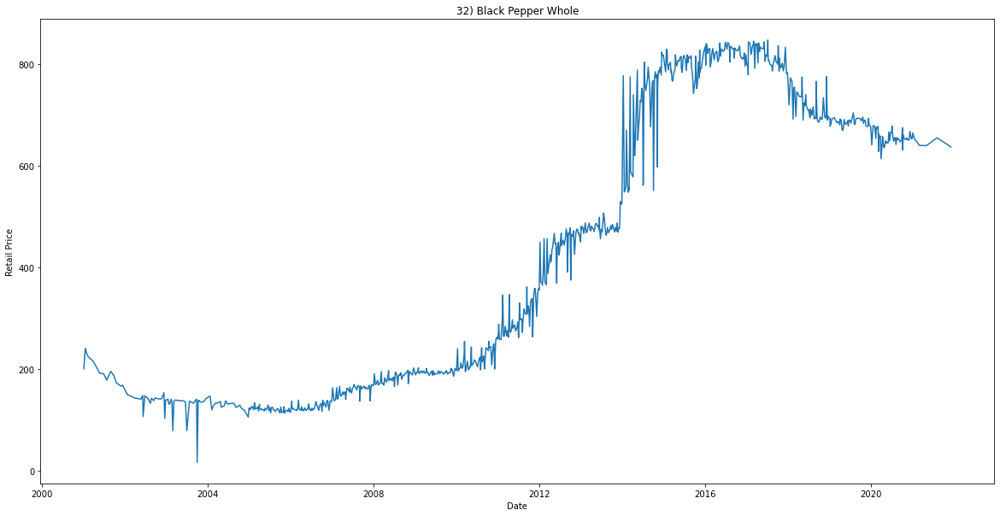

The Mean Retail Price of Bread Local is 18.78
Median 18.16
Mode 27.66
Standard Deviation 6.89


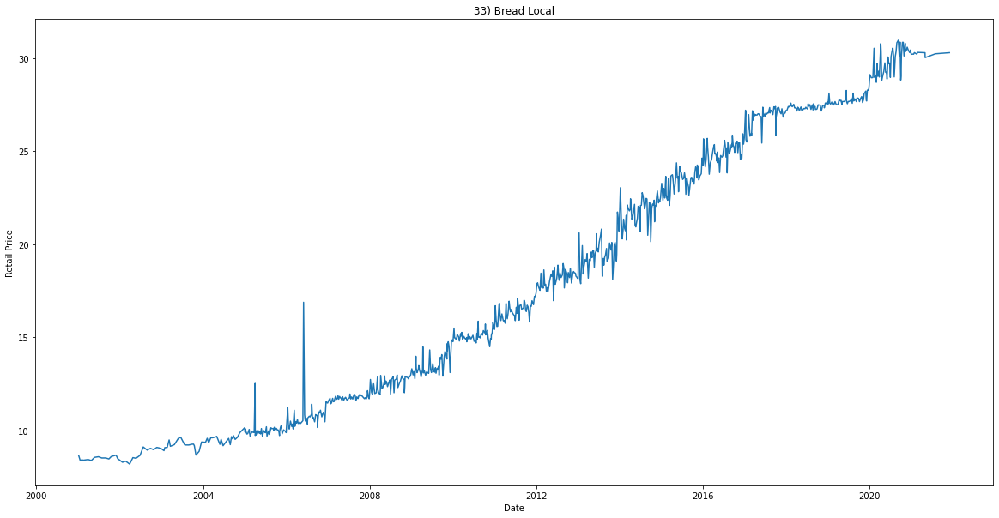

The Mean Retail Price of Brinjal FAQ is 21.67
Median 21.66
Mode 10.00
Standard Deviation 8.57


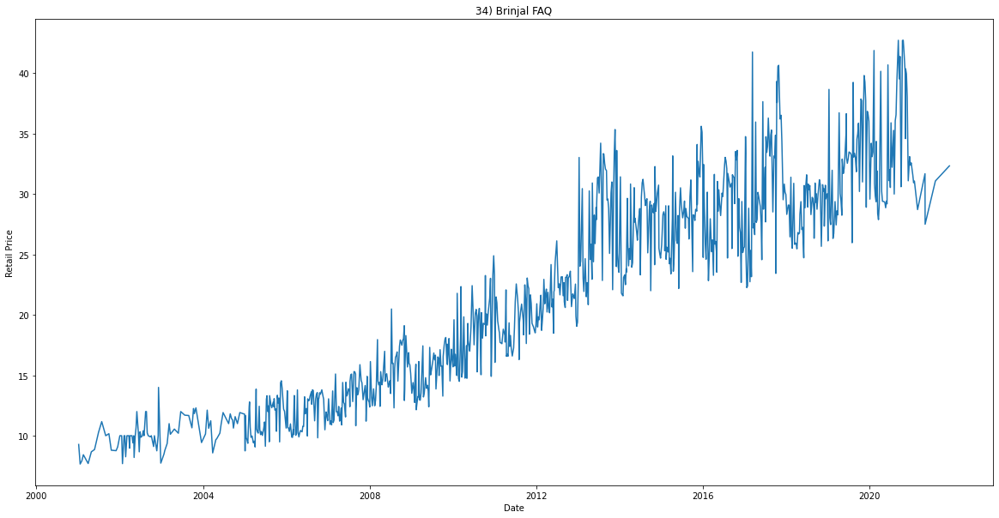

The Mean Retail Price of Butter Amul/Any Other is 32.11
Median 30.77
Mode 22.00
Standard Deviation 10.06


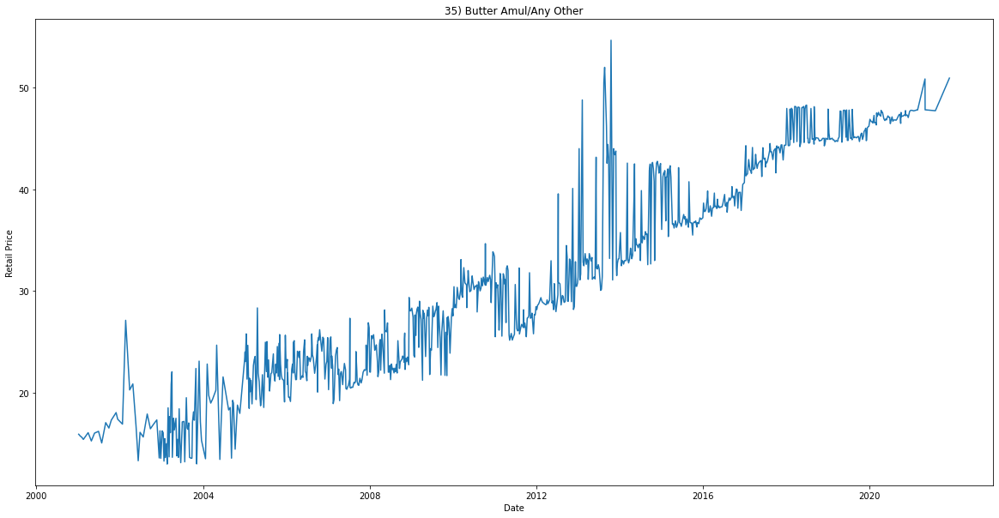

The Mean Retail Price of Chicken Poultry is 126.58
Median 131.62
Mode 71.38
Standard Deviation 43.63


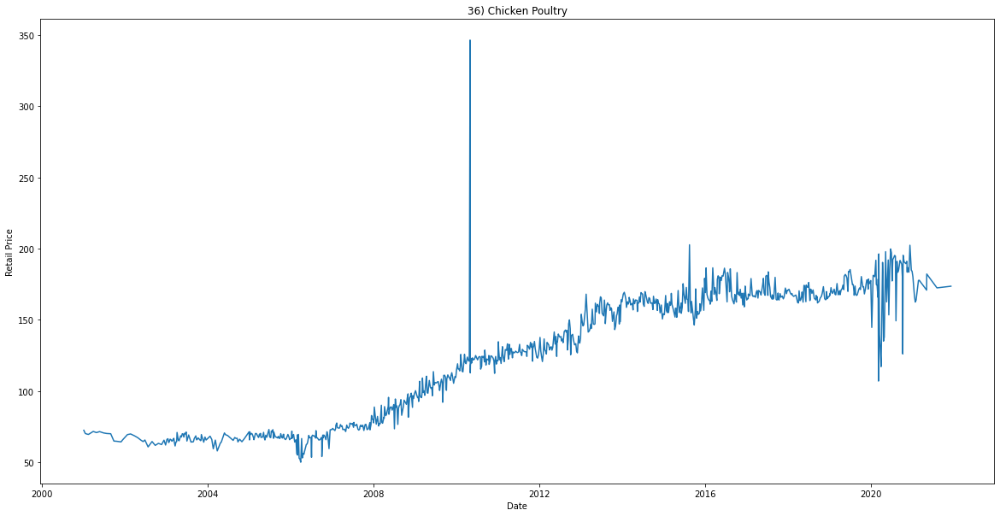

The Mean Retail Price of Coconut Dry is 110.57
Median 99.55
Mode 50.00
Standard Deviation 40.32


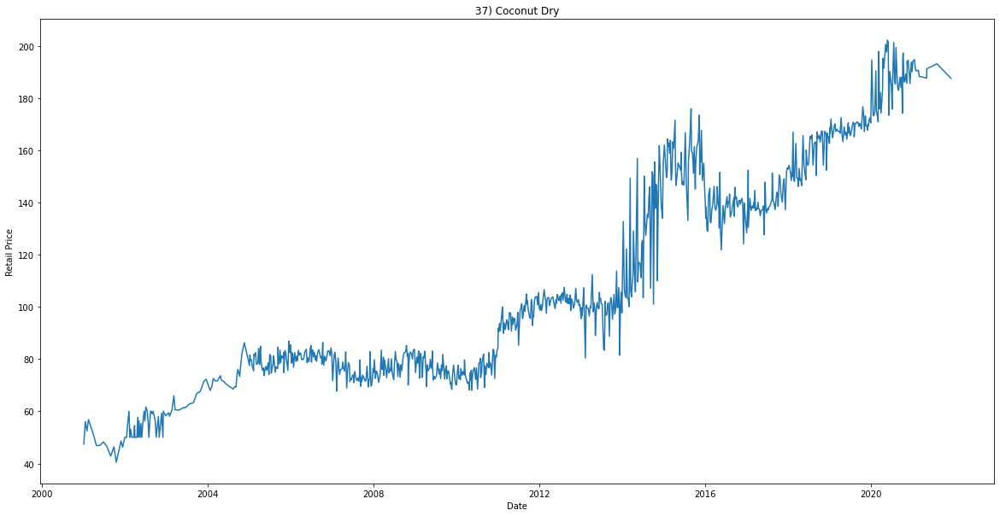

The Mean Retail Price of Coffee Powdered is 499.43
Median 485.71
Mode 150.00
Standard Deviation 255.85


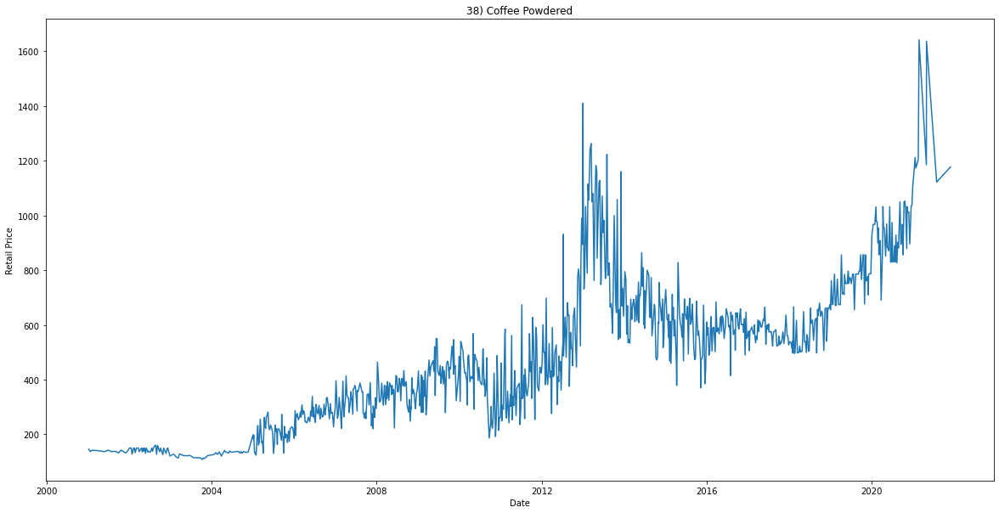

The Mean Retail Price of Coconut Fresh is 21.53
Median 20.85
Mode 5.00
Standard Deviation 6.74


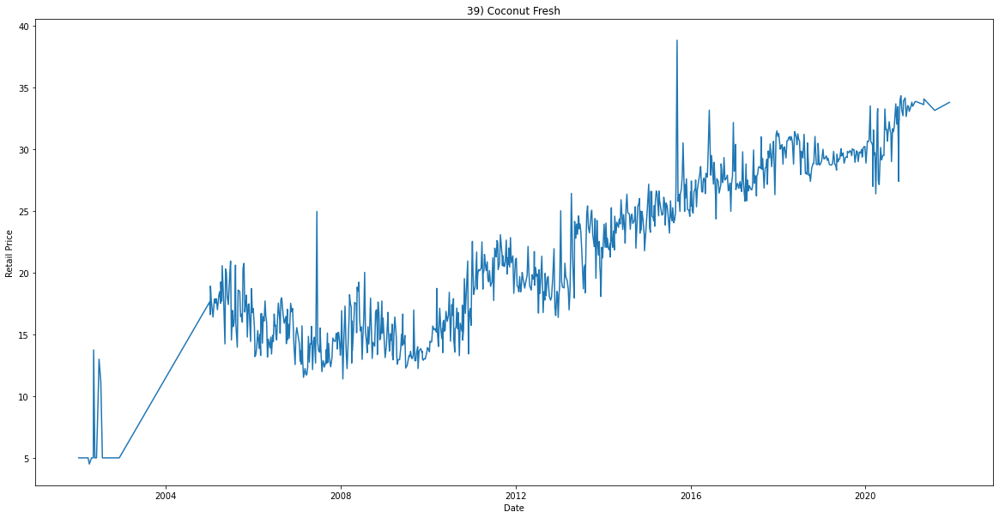

The Mean Retail Price of Coffee Instant is 516.81
Median 544.68
Mode 185.00
Standard Deviation 189.37


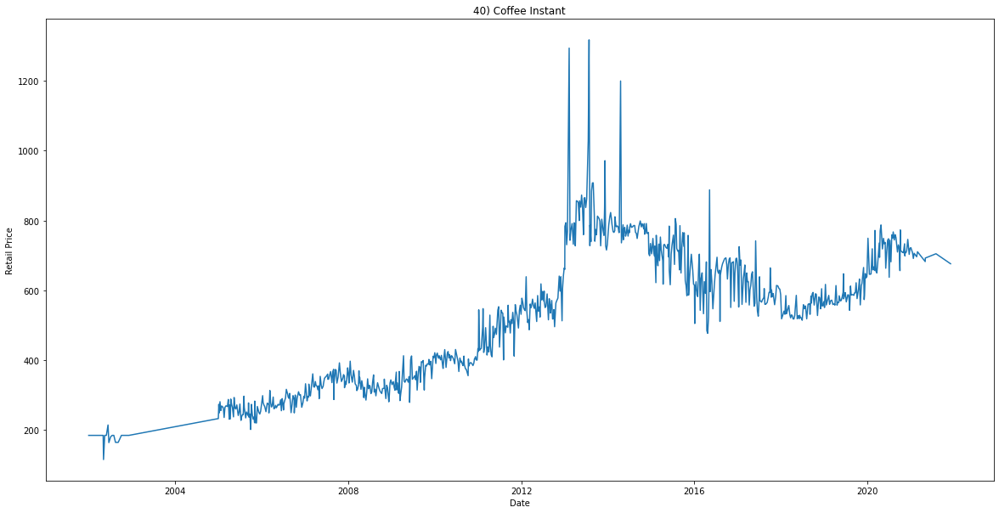

The Mean Retail Price of Gur Local is 36.62
Median 39.82
Mode 20.60
Standard Deviation 13.62


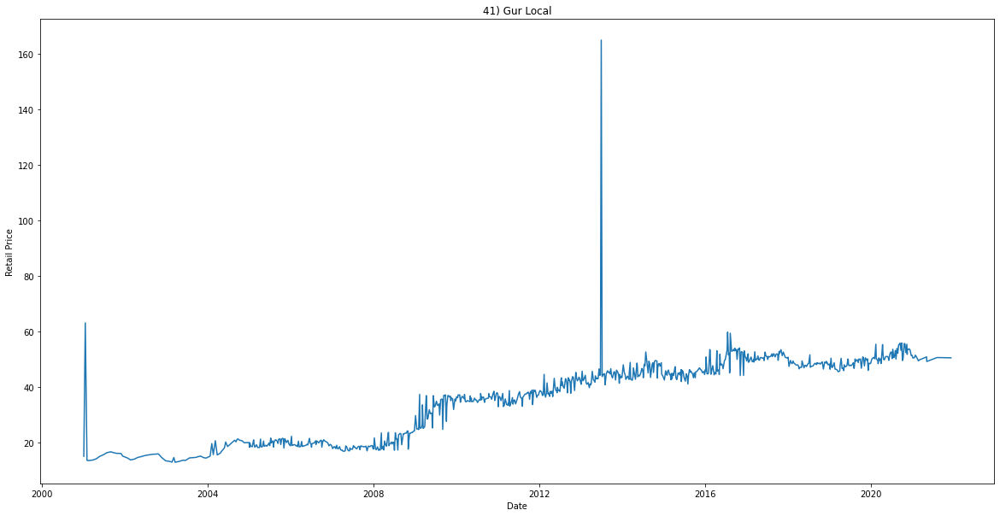

The Mean Retail Price of Jowar White is 20.46
Median 20.64
Mode 27.00
Standard Deviation 8.04


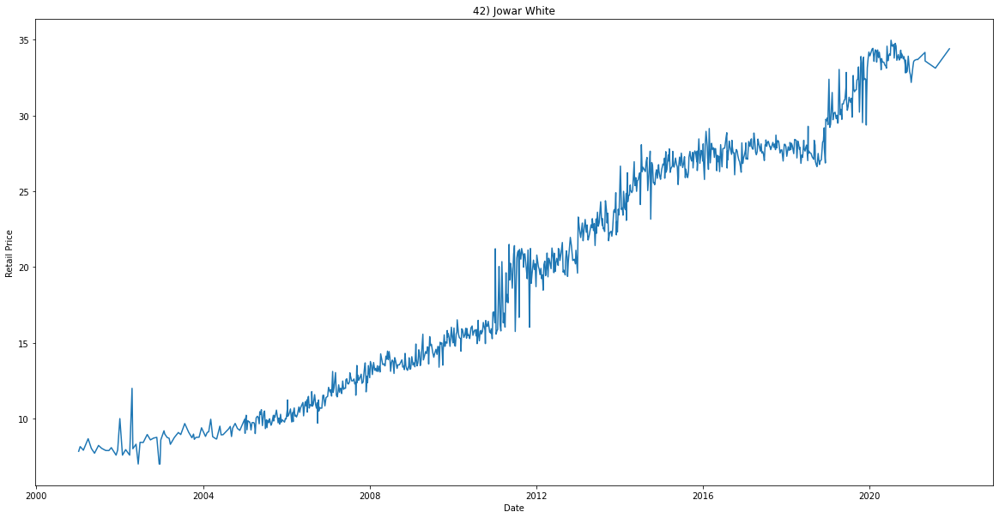

The Mean Retail Price of Maize FAQ is 18.45
Median 18.60
Mode 23.83
Standard Deviation 6.67


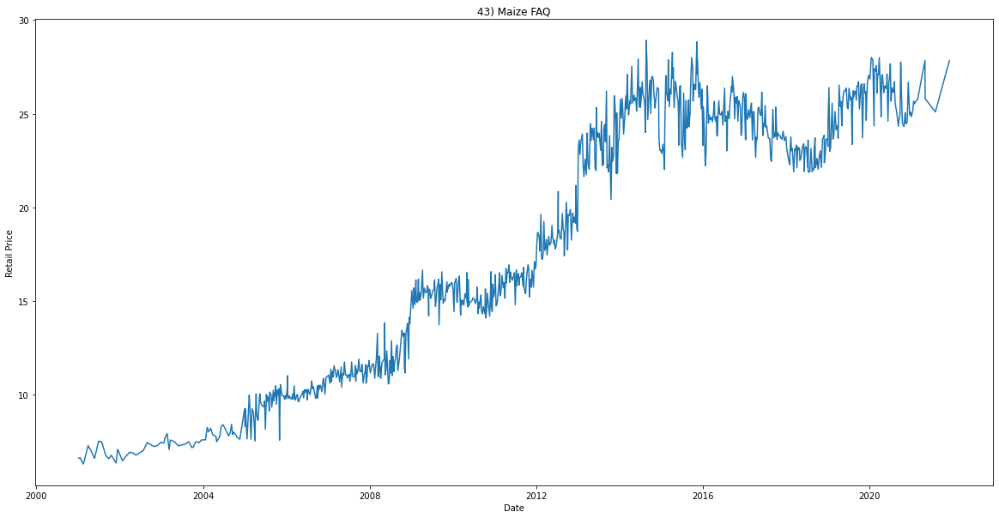

The Mean Retail Price of Masur Split is 57.81
Median 59.19
Mode 52.00
Standard Deviation 19.75


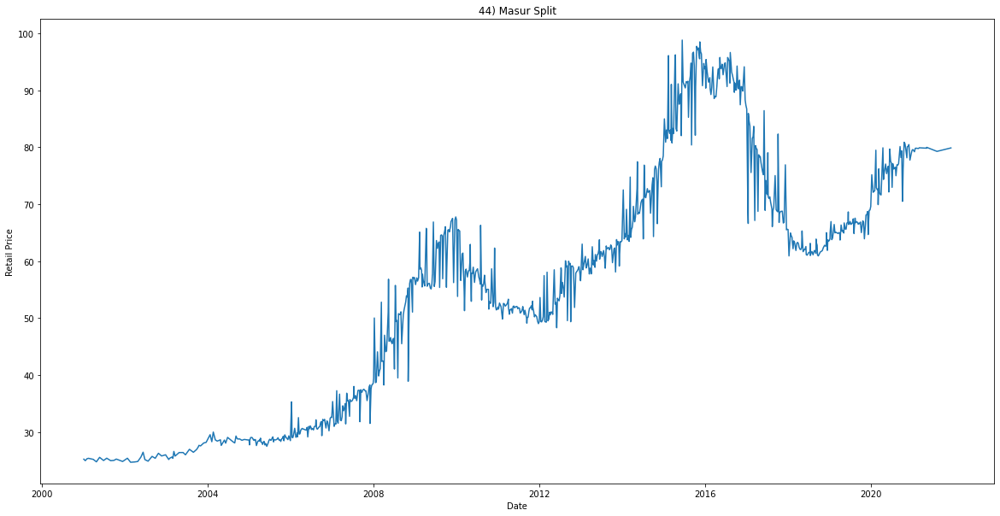

The Mean Retail Price of Meat Mutton is 306.48
Median 295.27
Mode 142.50
Standard Deviation 151.43


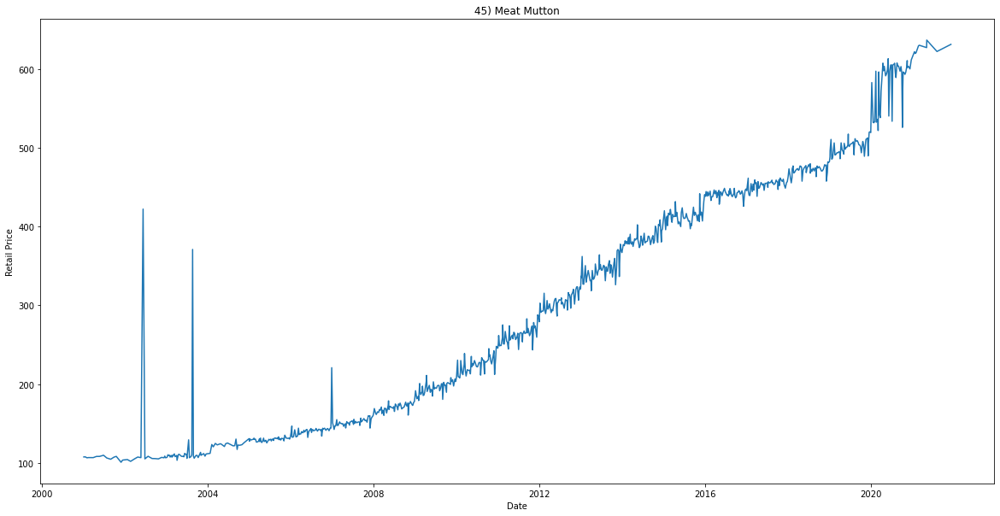

The Mean Retail Price of Milk Cow/Buffalo is 32.11
Median 32.59
Mode 45.52
Standard Deviation 12.59


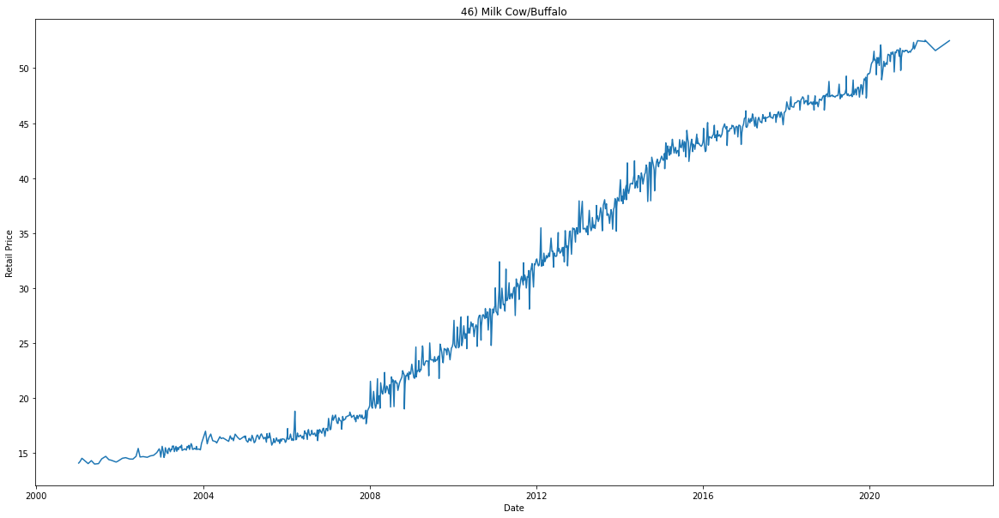

The Mean Retail Price of Milk Dairy is 30.86
Median 31.29
Mode 44.86
Standard Deviation 12.76


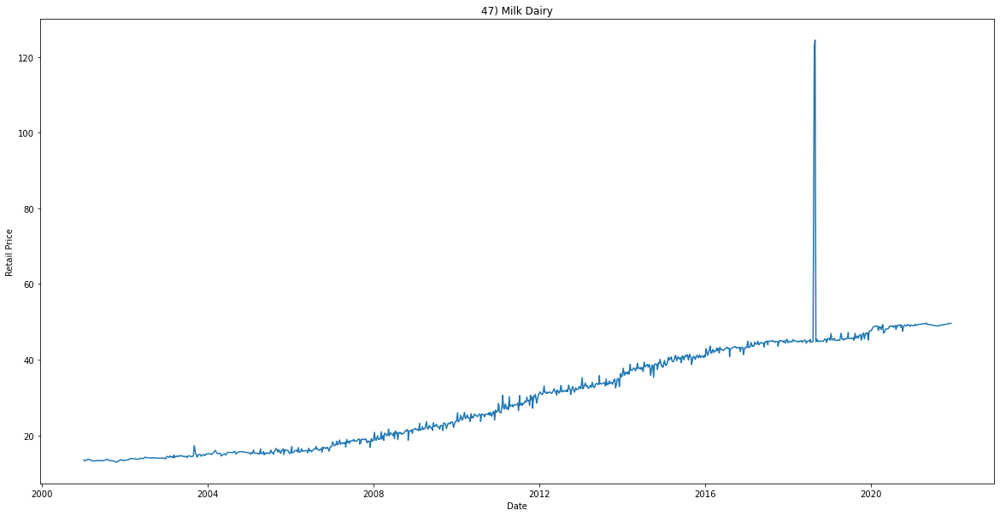

In [6]:
import statistics
varieties_dw=(dw['Commodity']+"+"+dw['Variety']).unique()
i=1
for item in varieties_dw:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dw_item_specific=dw[(dw['Commodity']==C) & (dw['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dw_item_specific['Date']
    item_specific_dp['Retail Price']=dw_item_specific['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    print("The Mean Retail Price of "+C+" "+V+" is "+str("{:.2f}".format(item_specific_sorted['Retail Price'].mean())))
    print("Median "+str("{:.2f}".format(item_specific_sorted['Retail Price'].median())))
    print("Mode "+str("{:.2f}".format(statistics.mode(item_specific_sorted['Retail Price']))))
    print("Standard Deviation "+str("{:.2f}".format(statistics.stdev(item_specific_sorted['Retail Price']))))
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Retail Price")
    plt.plot(item_specific_sorted['Date'], item_specific_sorted['Retail Price'])
    plt.show()

<h1> Plots of Weekly Non-Food Commodities

The Mean Retail Price of Bathing Soap Hamam is 17.46
Median 17.19
Mode 18.00
Standard Deviation 4.33


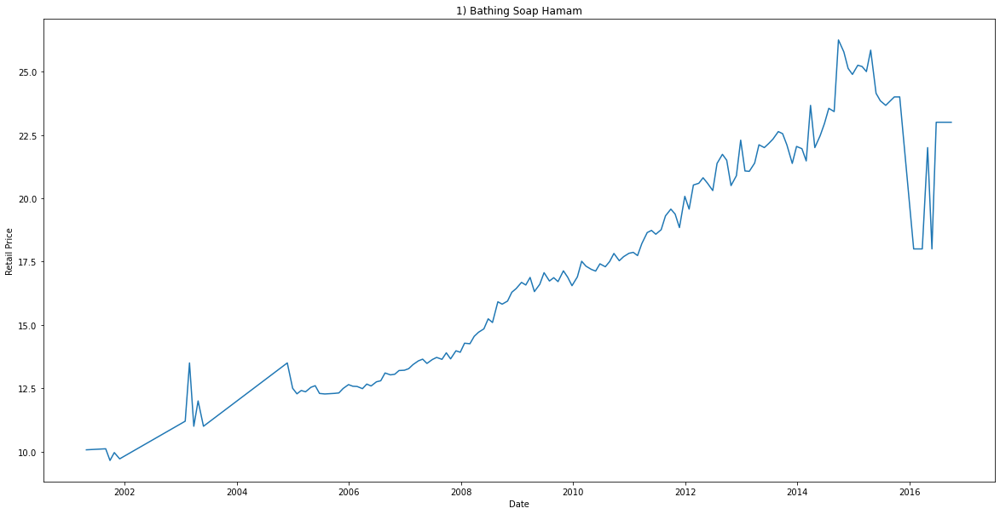

The Mean Retail Price of Bathing Soap Lifebuoy is 14.59
Median 13.76
Mode 10.00
Standard Deviation 5.46


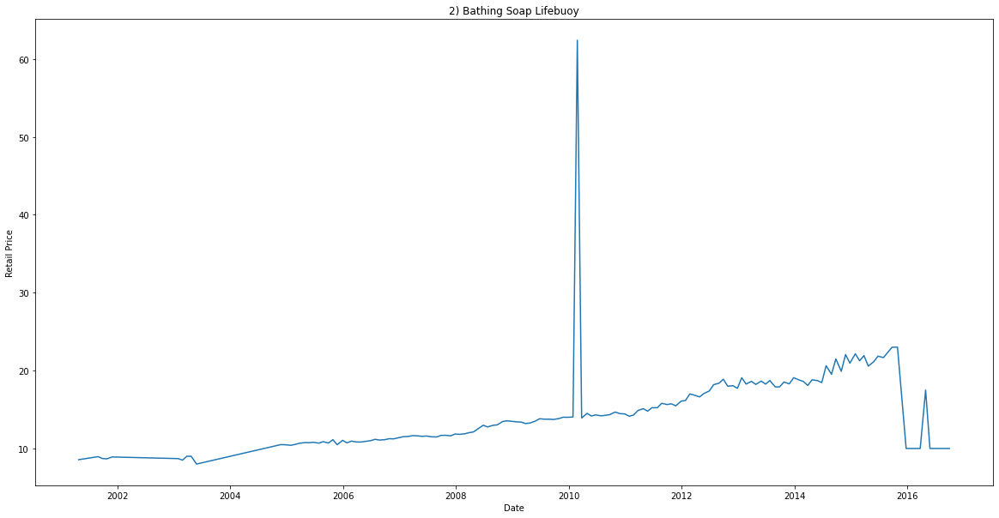

The Mean Retail Price of Chappal-Ladies Bata is 216.86
Median 204.29
Mode 299.00
Standard Deviation 62.99


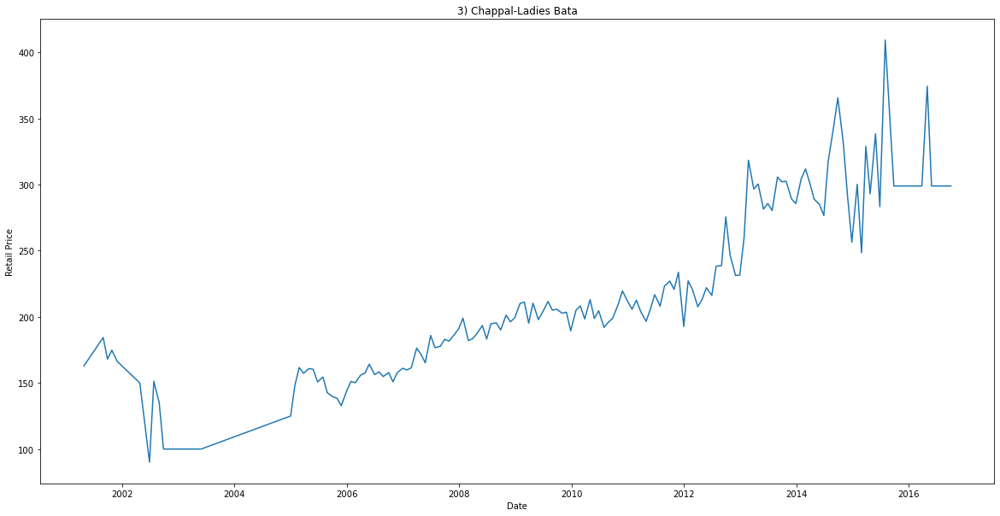

The Mean Retail Price of Chappal-Rubber Bata is 107.29
Median 86.83
Mode 49.95
Standard Deviation 54.04


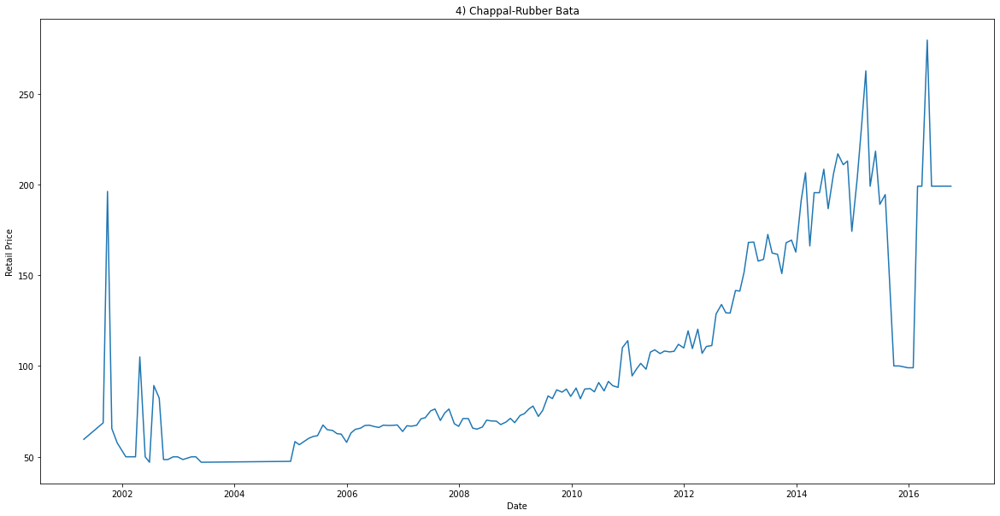

The Mean Retail Price of Detergent Powder Nirma/Any Other is 40.35
Median 41.02
Mode 44.00
Standard Deviation 12.55


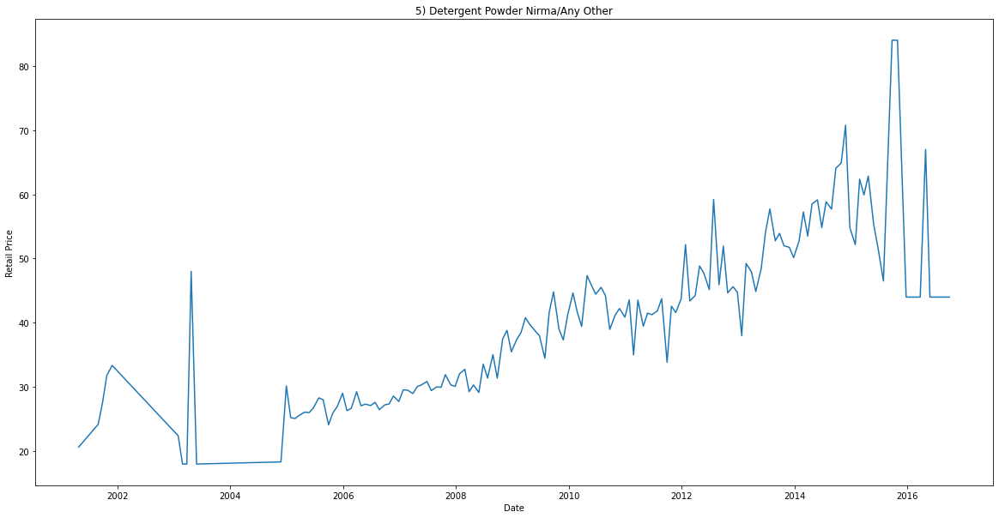

The Mean Retail Price of Sandals-Ladies Bata is 306.07
Median 301.91
Mode 399.00
Standard Deviation 57.71


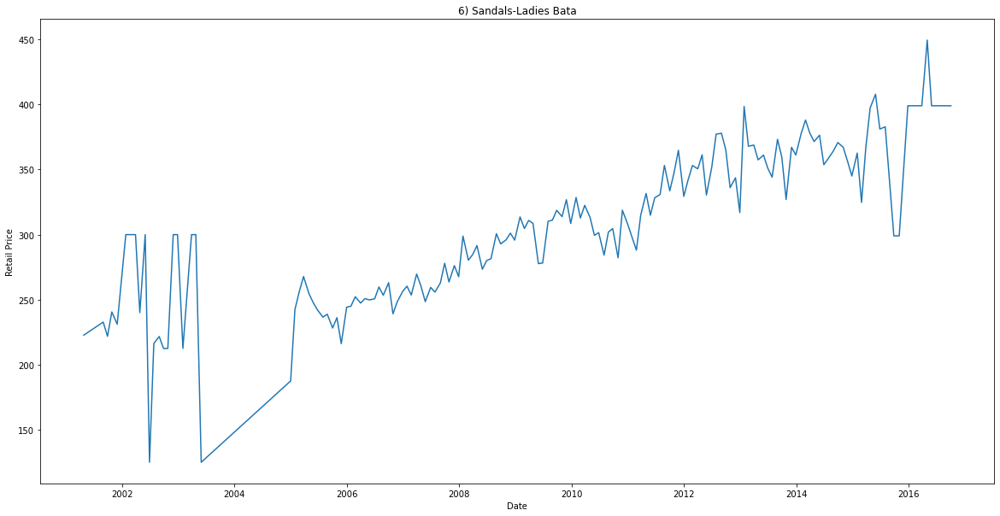

The Mean Retail Price of Saree Polyester is 313.12
Median 282.00
Mode 580.00
Standard Deviation 85.21


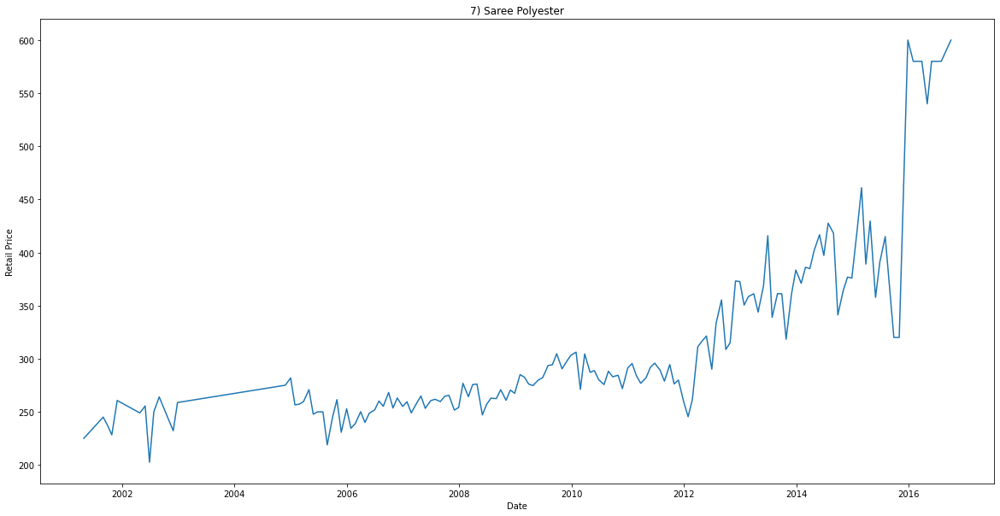

The Mean Retail Price of Saree Cotton is 297.66
Median 249.39
Mode 540.00
Standard Deviation 97.16


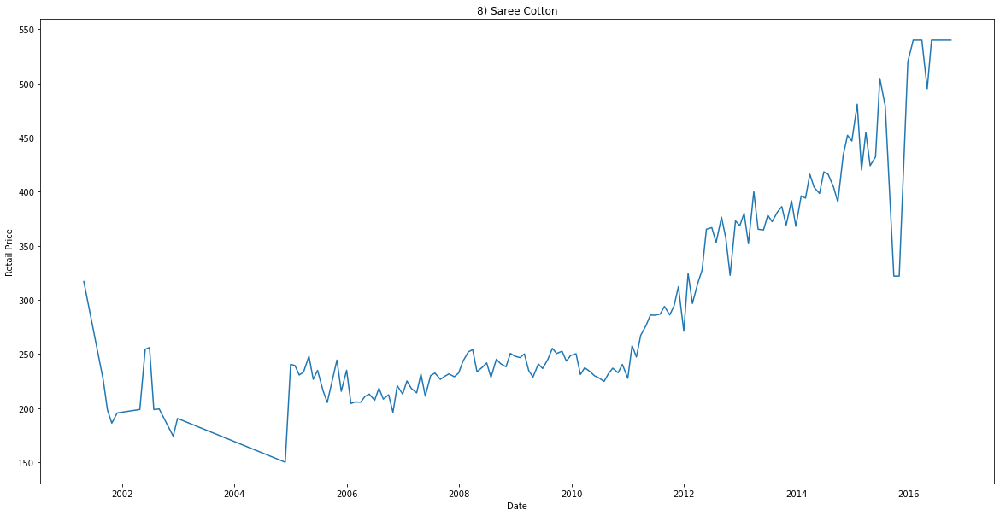

The Mean Retail Price of Shirting Terrycot is 97.12
Median 78.19
Mode 220.00
Standard Deviation 42.31


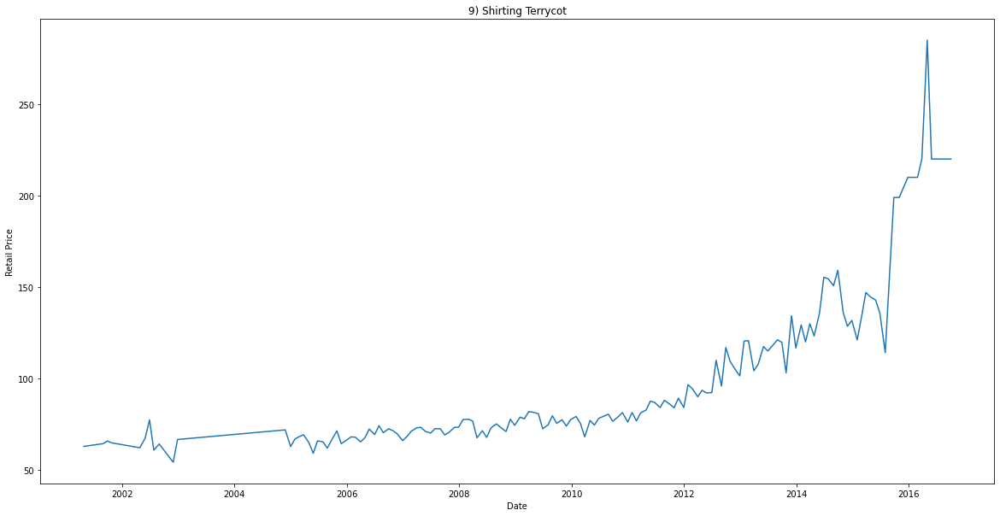

The Mean Retail Price of Shirting Cotton is 95.69
Median 85.22
Mode 140.00
Standard Deviation 37.58


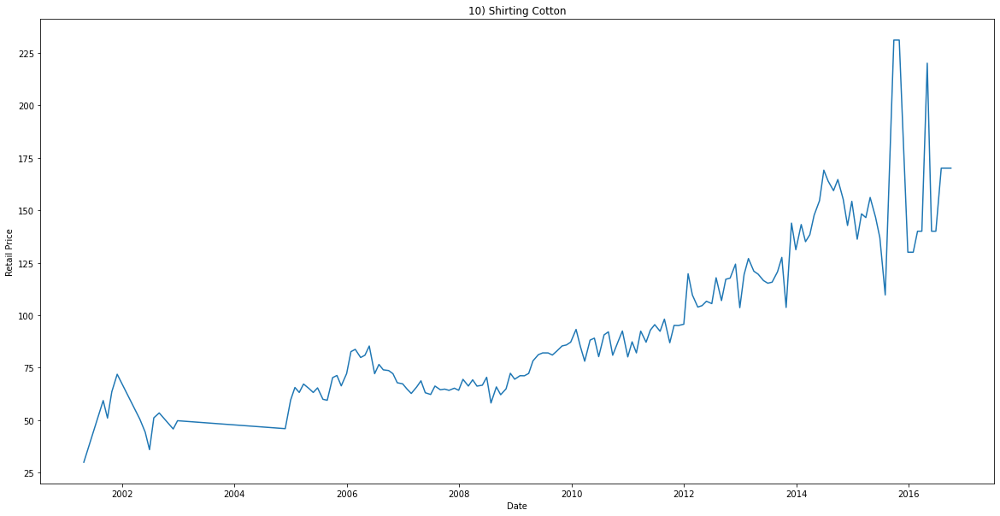

The Mean Retail Price of Shoes-Gents Bata is 756.09
Median 705.59
Mode 1799.00
Standard Deviation 281.42


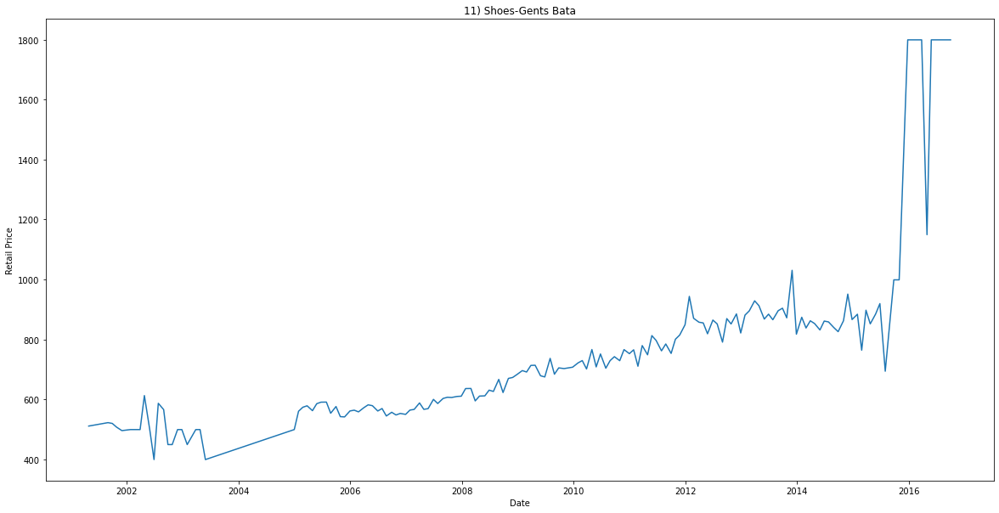

The Mean Retail Price of Tawa Local-1Kg is 99.48
Median 94.42
Mode 220.00
Standard Deviation 45.23


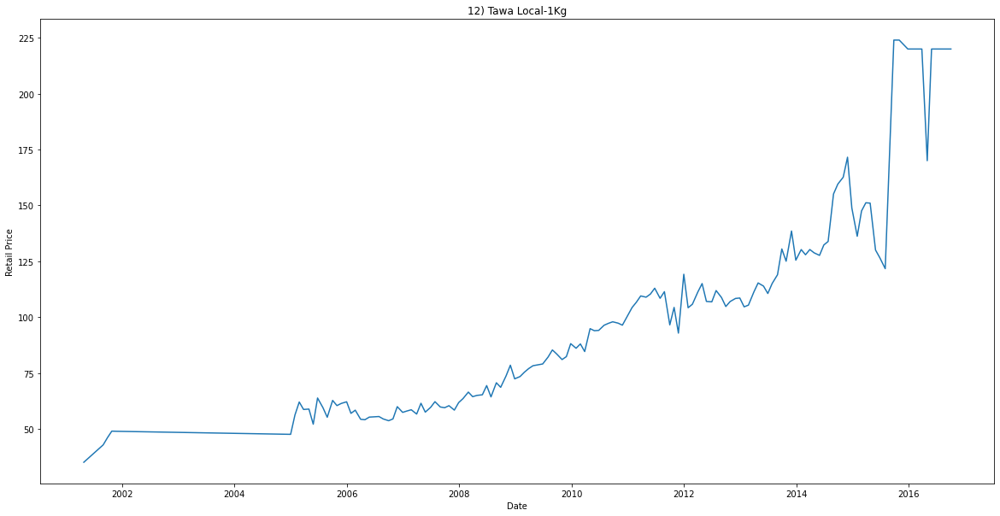

The Mean Retail Price of Gents Dhoti Cotton is 237.62
Median 181.68
Mode 720.00
Standard Deviation 131.57


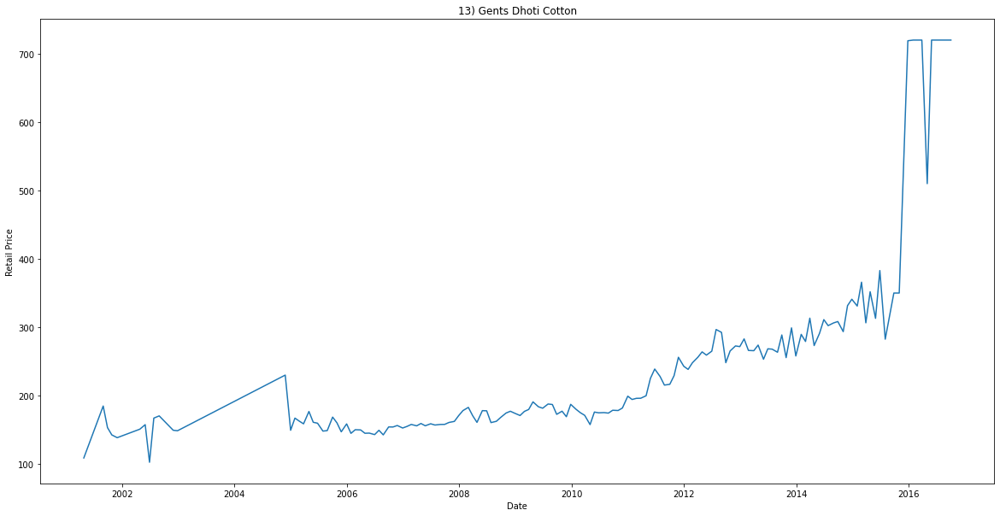

The Mean Retail Price of Ink Chelpark is 15.84
Median 14.80
Mode 15.00
Standard Deviation 3.42


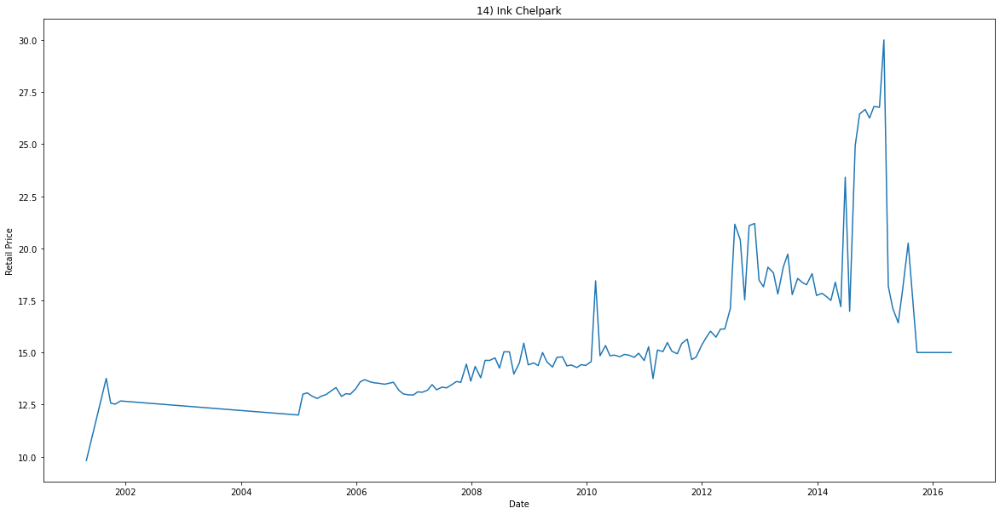

The Mean Retail Price of Kettle Aluminium is 219.93
Median 218.39
Mode 260.00
Standard Deviation 62.88


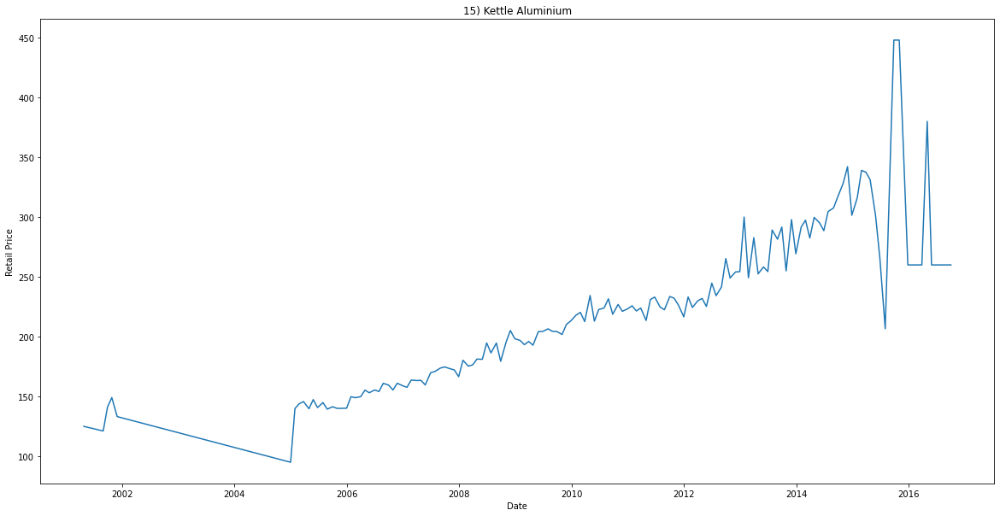

The Mean Retail Price of Pant Cloth Terrycot is 180.23
Median 160.15
Mode 380.00
Standard Deviation 53.78


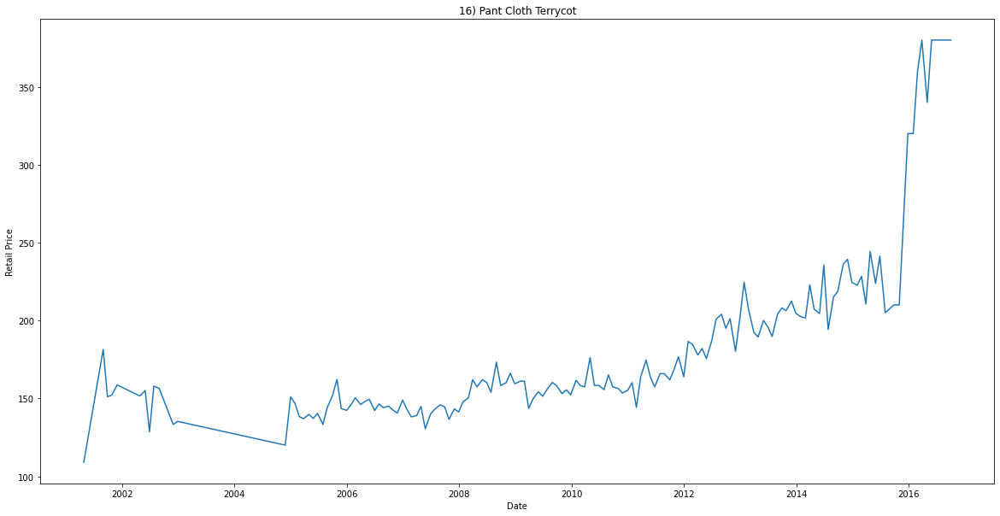

The Mean Retail Price of Paper Ruled Card Board Bound is 27.90
Median 25.66
Mode 38.00
Standard Deviation 8.96


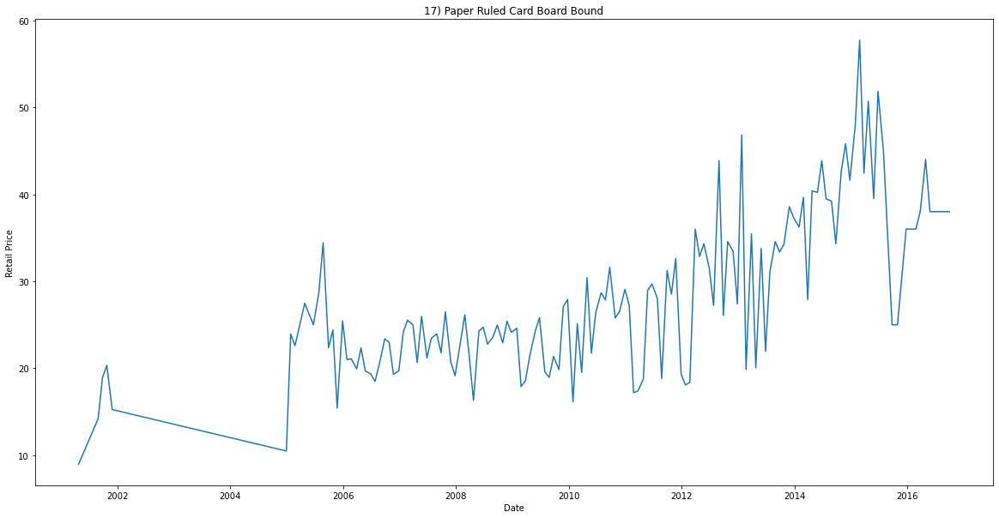

The Mean Retail Price of Pent Cloth Cotton is 202.95
Median 170.70
Mode 350.00
Standard Deviation 68.19


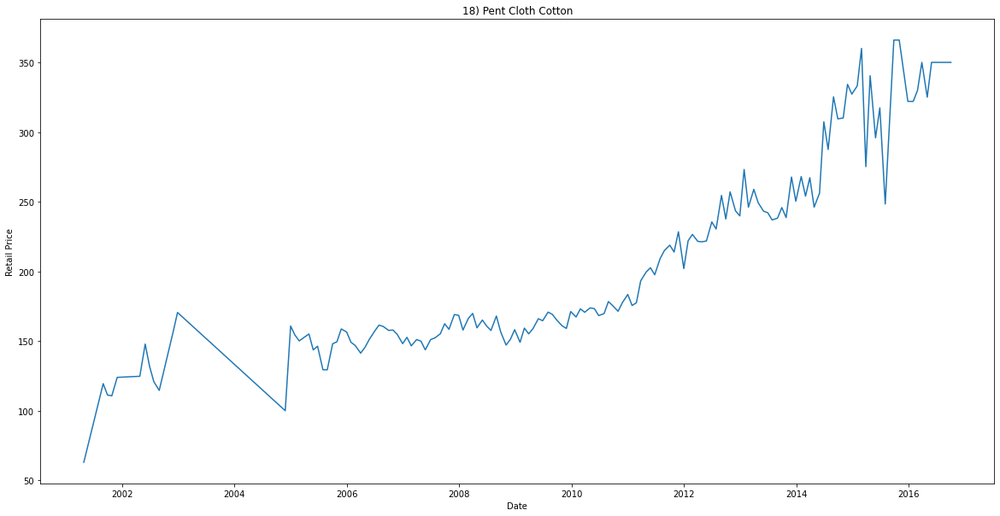

The Mean Retail Price of Tooth Paste Colgate/Cibaca/Promise is 34.79
Median 34.94
Mode 50.00
Standard Deviation 7.31


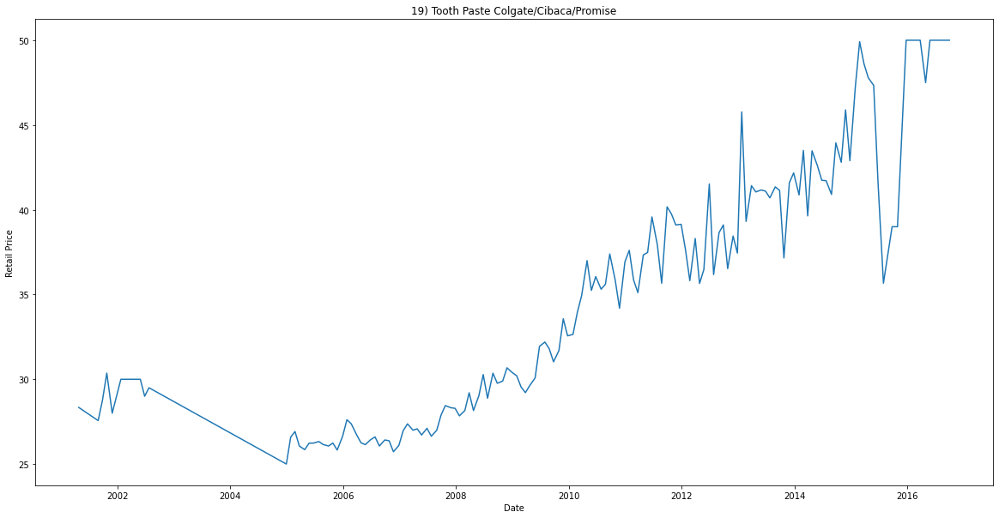

The Mean Retail Price of Tooth Powder Colgate/Cibaca/Promise is 29.70
Median 29.23
Mode 34.00
Standard Deviation 3.57


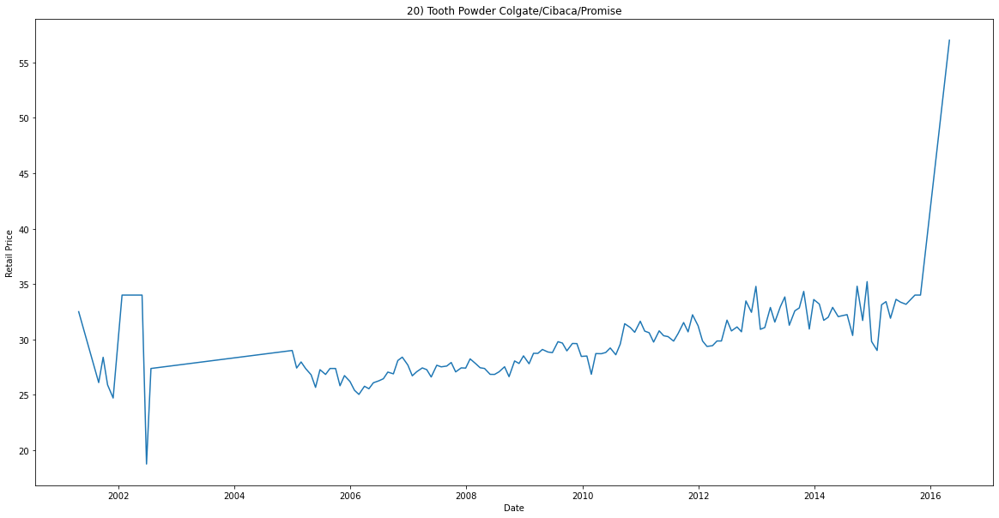

The Mean Retail Price of Tumbler Steel-Normal Size is 110.69
Median 102.59
Mode 240.00
Standard Deviation 45.69


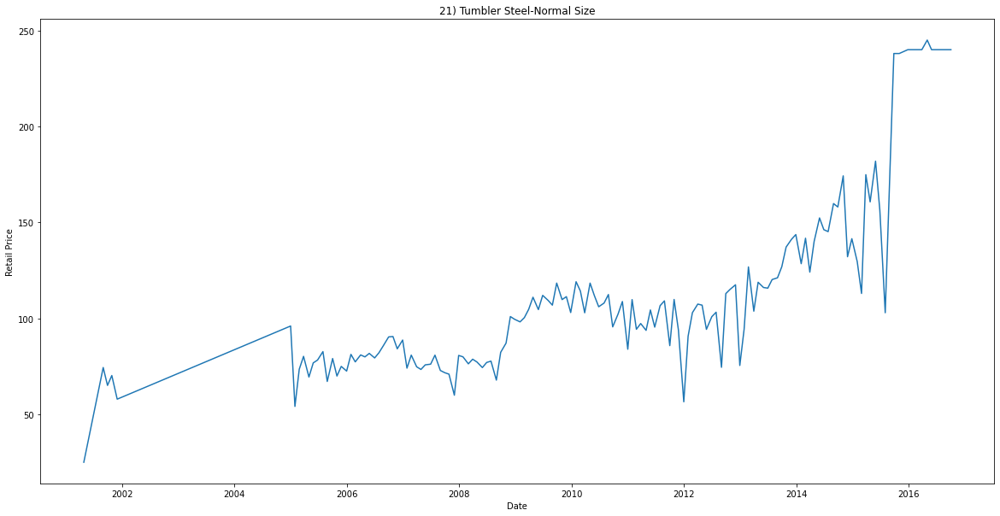

In [7]:
import statistics
varieties_dw_nf=(dw_nf['Commodity']+"+"+dw_nf['Variety']).unique()
i=1
for item in varieties_dw_nf:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dw_nf_item_specific=dw_nf[(dw_nf['Commodity']==C) & (dw_nf['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dw_nf_item_specific['Date']
    item_specific_dp['Retail Price']=dw_nf_item_specific['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    print("The Mean Retail Price of "+C+" "+V+" is "+str("{:.2f}".format(item_specific_sorted['Retail Price'].mean())))
    print("Median "+str("{:.2f}".format(item_specific_sorted['Retail Price'].median())))
    print("Mode "+str("{:.2f}".format(statistics.mode(item_specific_sorted['Retail Price']))))
    print("Standard Deviation "+str("{:.2f}".format(statistics.stdev(item_specific_sorted['Retail Price']))))
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Retail Price")
    plt.plot(item_specific_sorted['Date'], item_specific_sorted['Retail Price'])
    plt.show()

<h1>Plots of Monthly Food Commodities

The Mean Retail Price of Moong Split is 67.00
Median 71.96
Mode 28.50
Standard Deviation 28.04


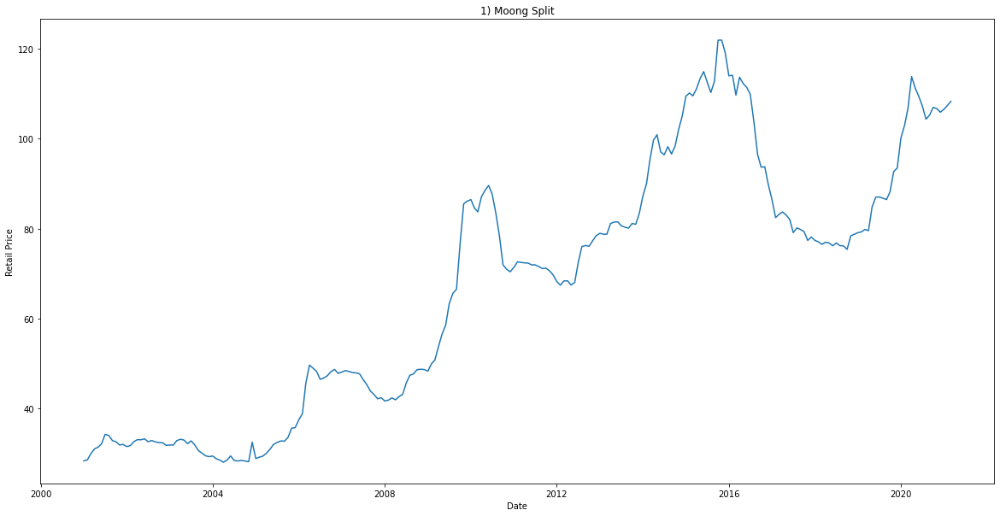

The Mean Retail Price of Onion FAQ is 19.86
Median 17.17
Mode 9.18
Standard Deviation 13.95


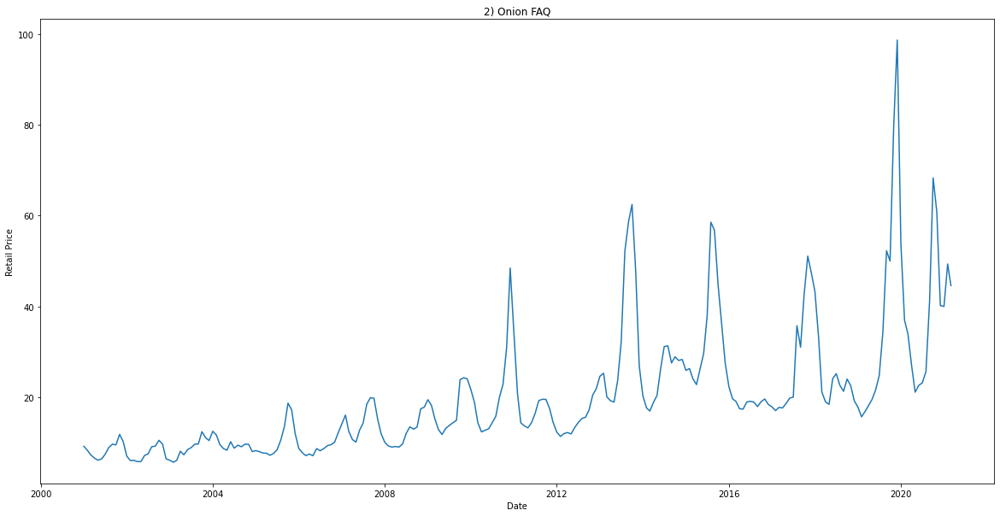

The Mean Retail Price of Potato FAQ is 14.72
Median 12.63
Mode 4.73
Standard Deviation 7.16


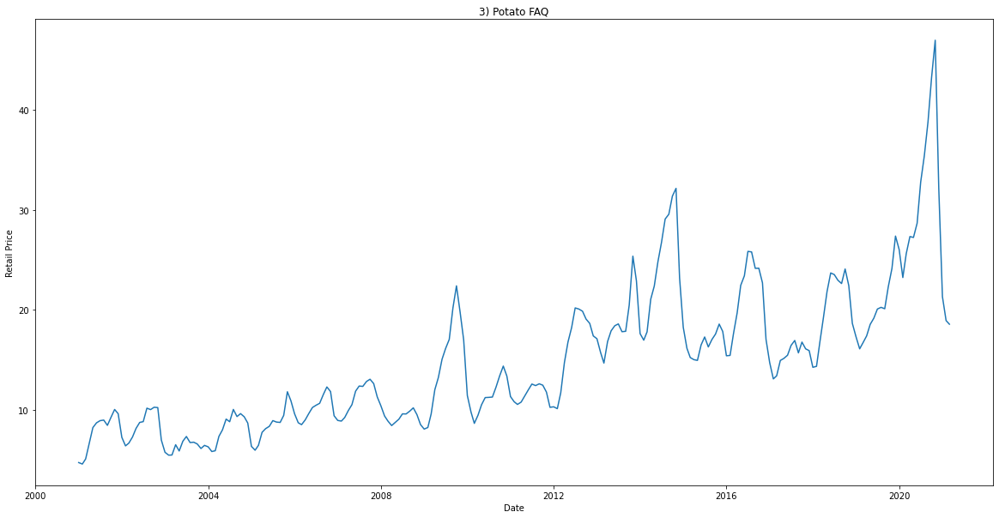

The Mean Retail Price of Ragi FAQ is 21.62
Median 17.00
Mode 8.69
Standard Deviation 11.38


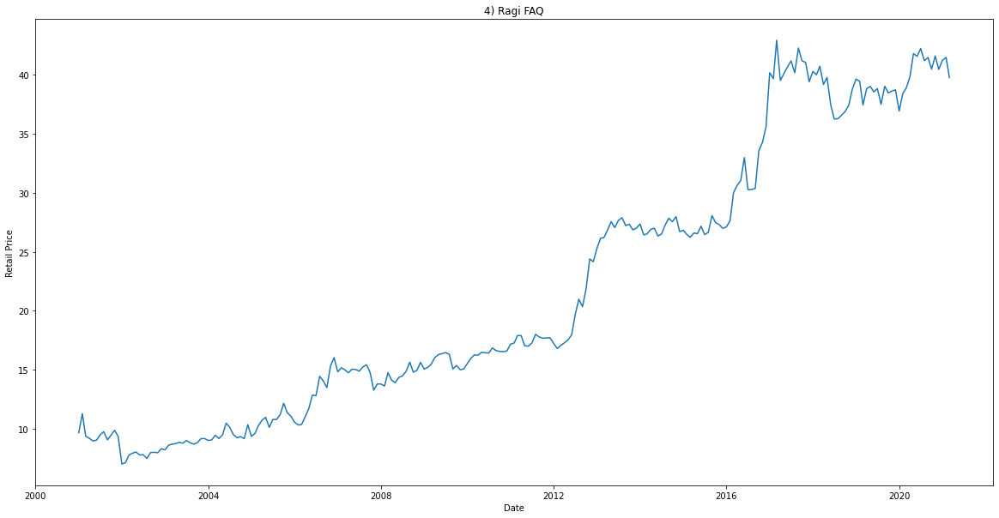

The Mean Retail Price of Red Chillies Powdered Agmark is 17.41
Median 16.96
Mode 7.78
Standard Deviation 6.66


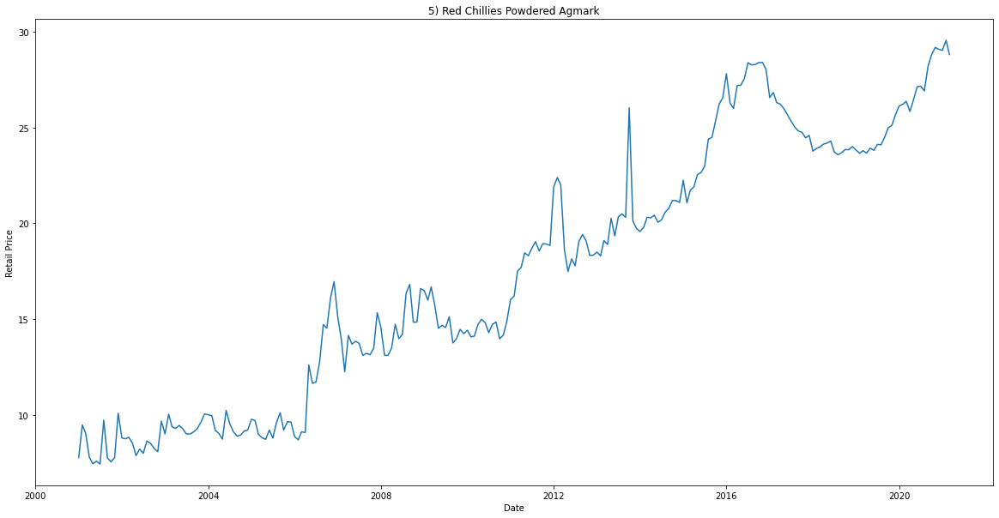

The Mean Retail Price of Rice Common/Coarse is 21.21
Median 21.25
Mode 12.76
Standard Deviation 8.11


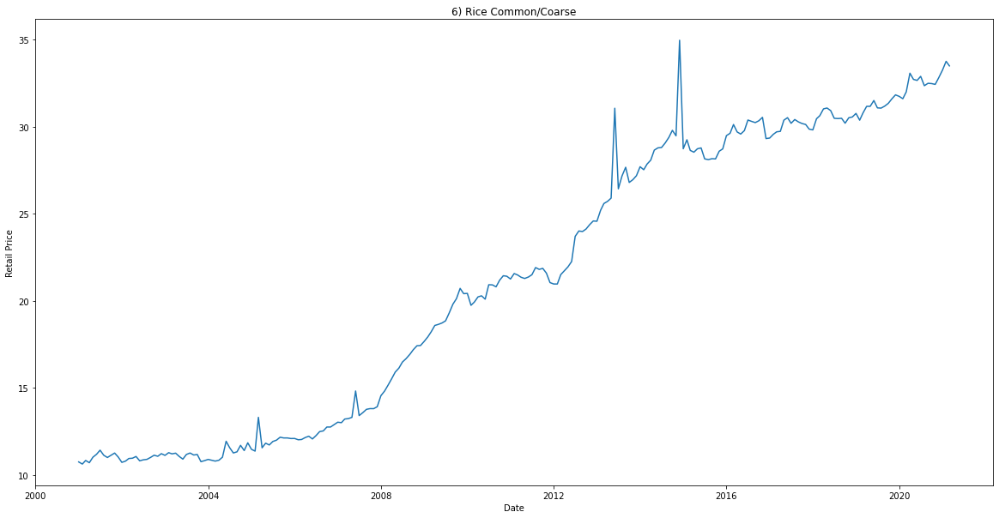

The Mean Retail Price of Rice Fine is 29.93
Median 28.99
Mode 15.06
Standard Deviation 11.16


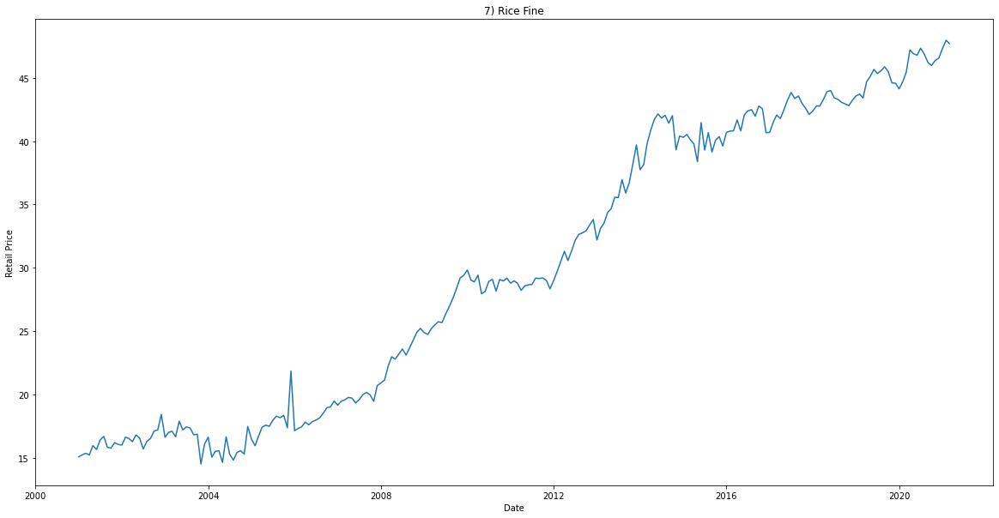

The Mean Retail Price of Salt Loose(common) is 6.57
Median 6.42
Mode 8.57
Standard Deviation 2.76


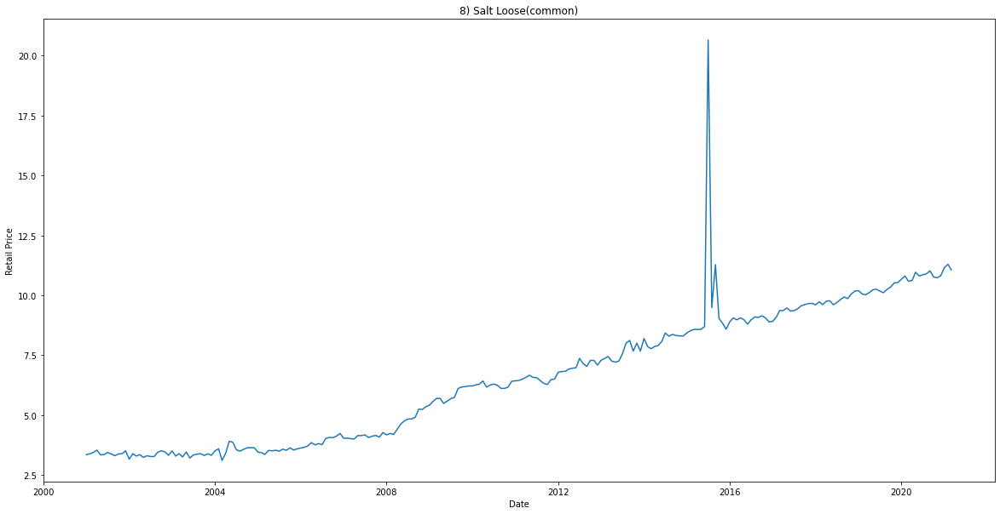

The Mean Retail Price of Tea Brooke Bond Red Label is 73.54
Median 72.50
Mode 42.47
Standard Deviation 24.10


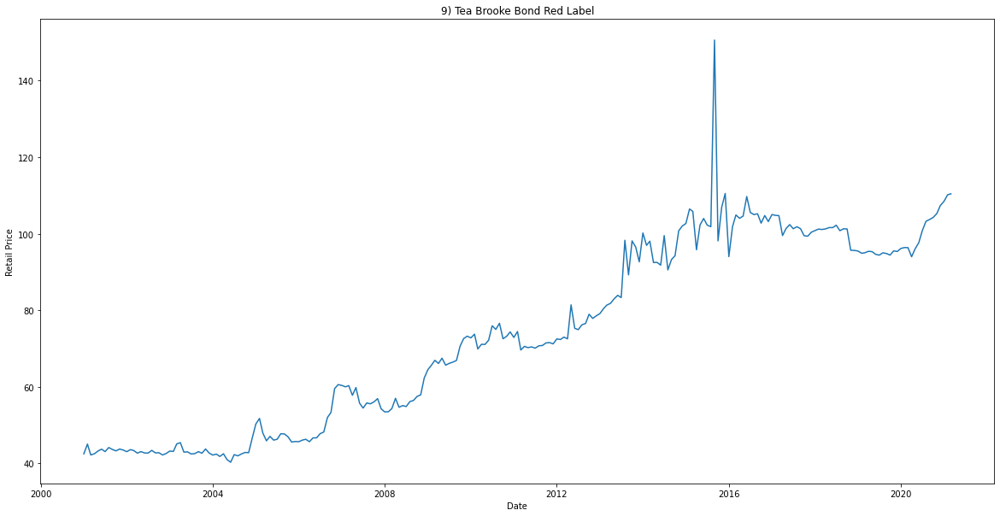

The Mean Retail Price of Tea Ctc(loose) is 185.81
Median 196.50
Mode 90.00
Standard Deviation 48.25


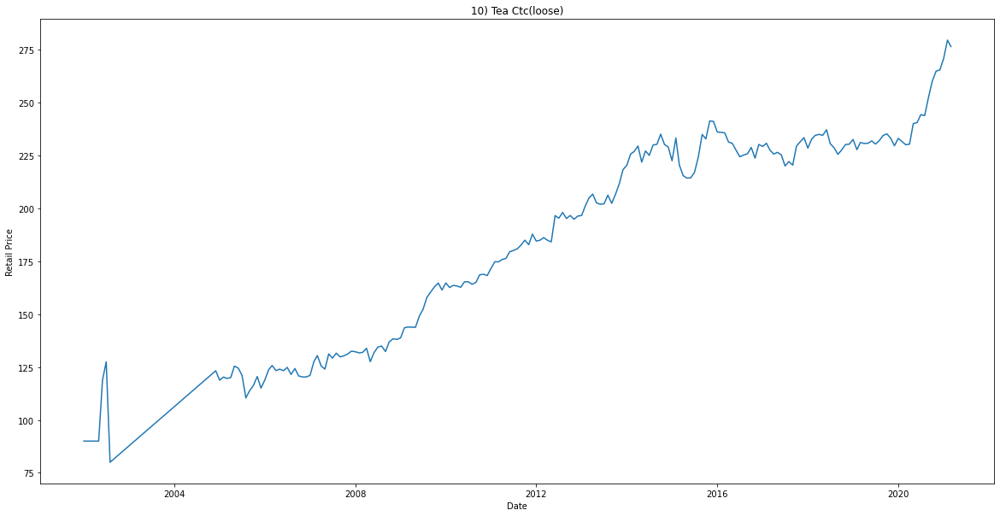

The Mean Retail Price of Rice Superfine is 49.88
Median 47.45
Mode 14.00
Standard Deviation 14.88


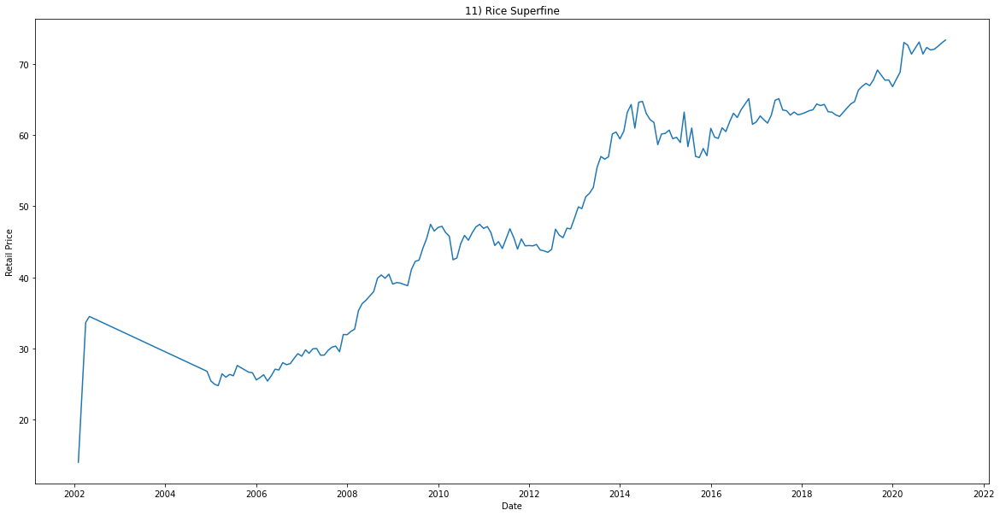

The Mean Retail Price of Salt Packet(iodized) is 13.25
Median 14.06
Mode 6.67
Standard Deviation 3.86


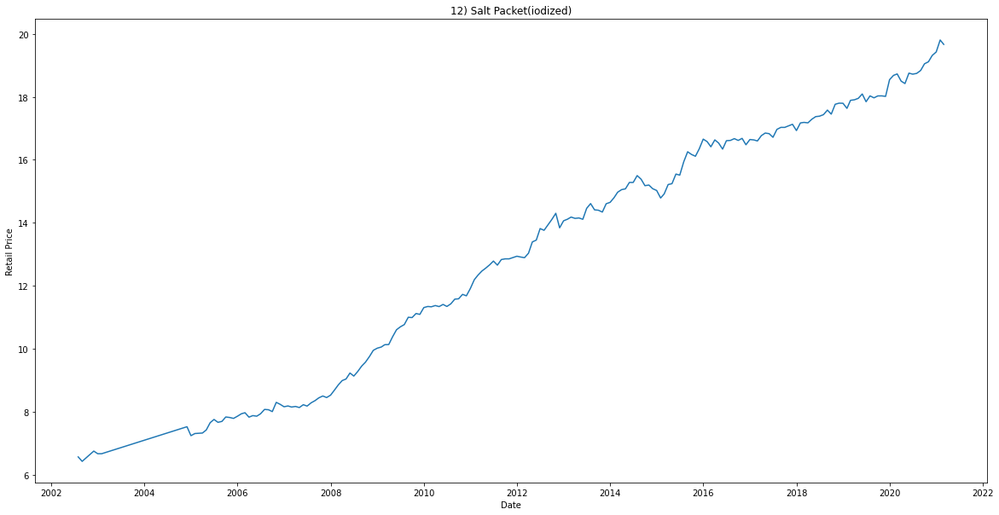

The Mean Retail Price of Arhar Split is 64.17
Median 67.91
Mode 26.22
Standard Deviation 31.21


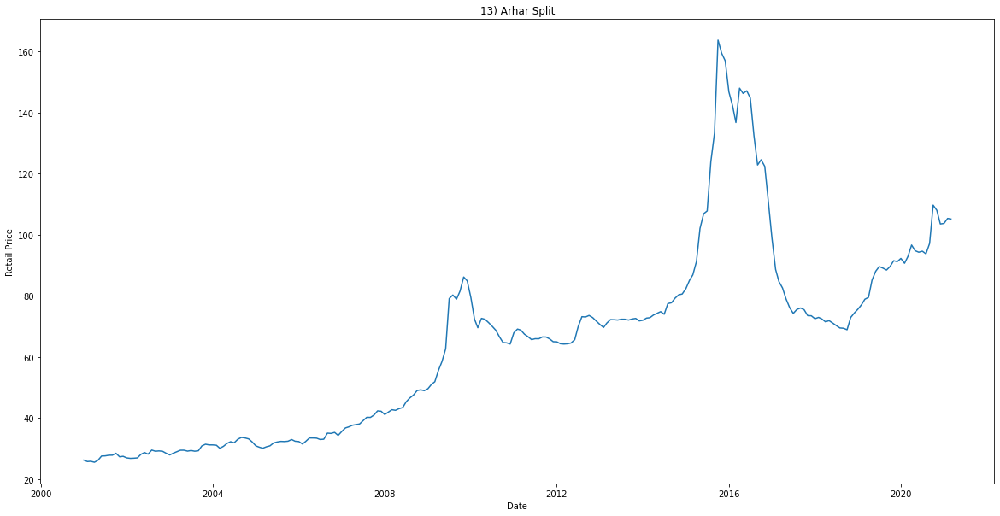

The Mean Retail Price of Atta FAQ is 20.22
Median 19.67
Mode 30.00
Standard Deviation 7.44


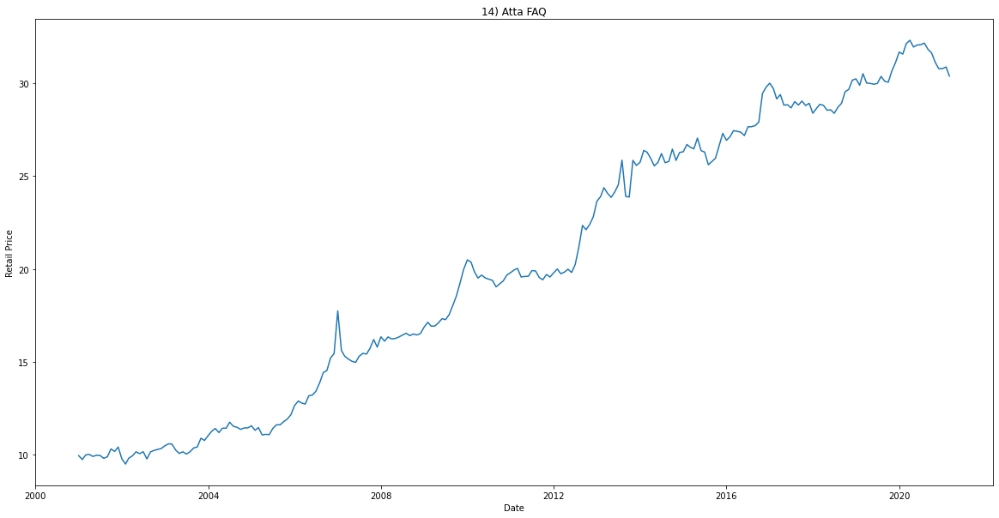

The Mean Retail Price of Bajra FAQ is 15.68
Median 14.26
Mode 24.70
Standard Deviation 7.01


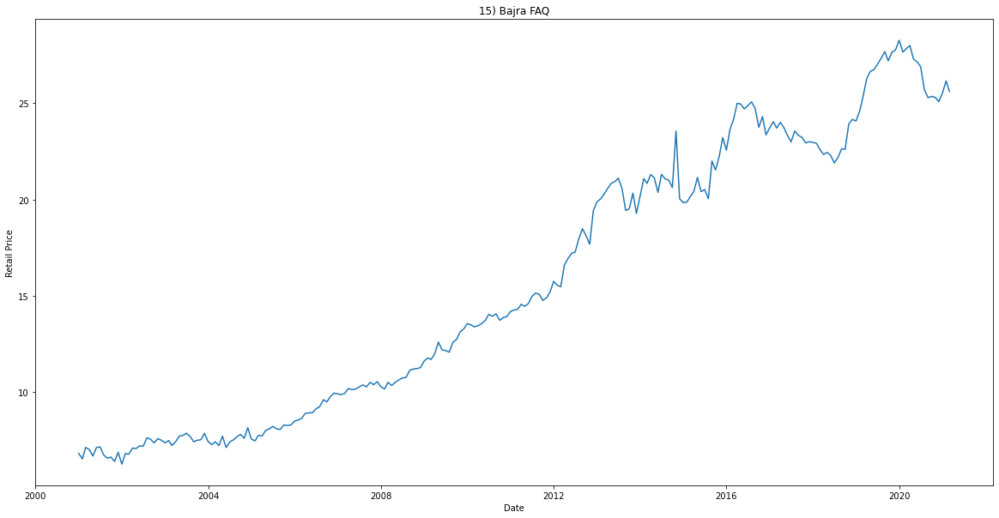

The Mean Retail Price of Banana FAQ is 28.23
Median 25.96
Mode 13.28
Standard Deviation 12.50


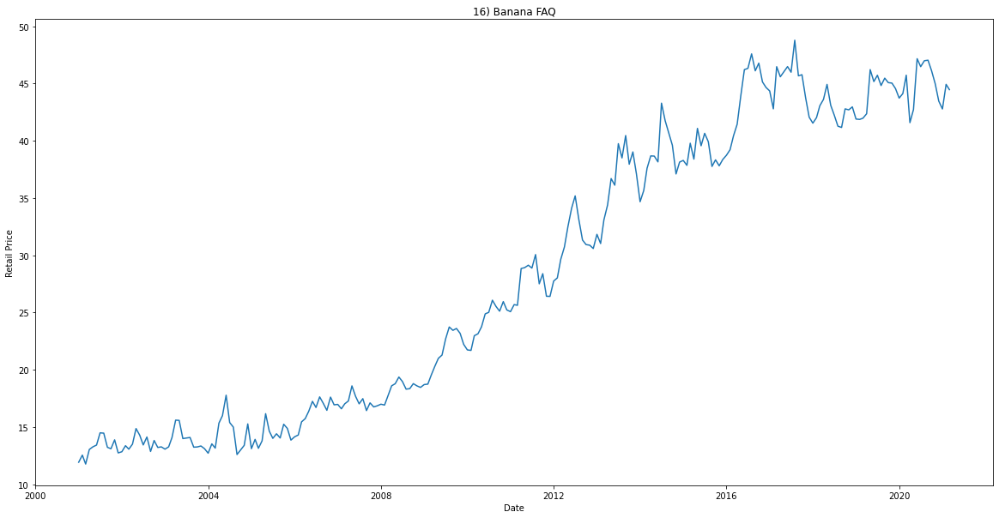

The Mean Retail Price of Biscuit Glucose is 6.16
Median 5.63
Mode 5.25
Standard Deviation 1.16


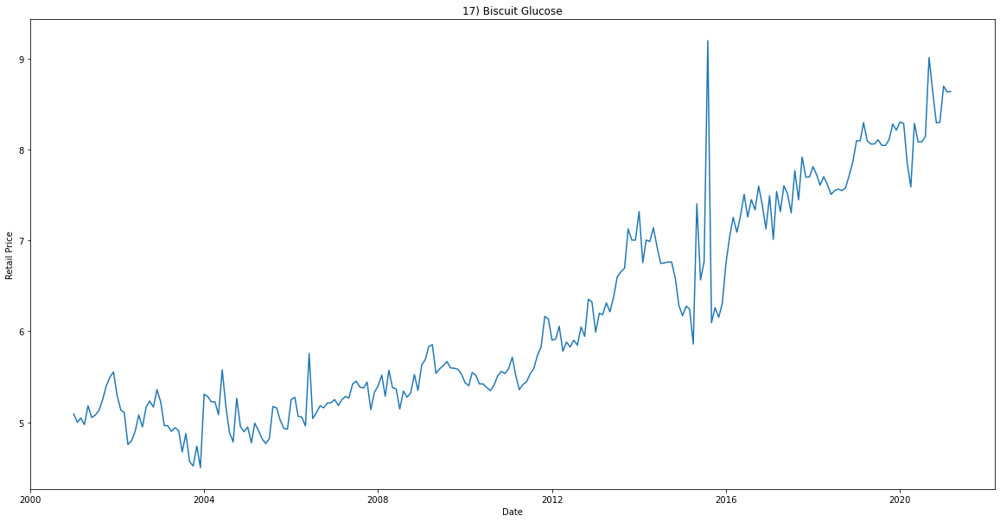

The Mean Retail Price of Apple Delicious medium size is 99.05
Median 101.08
Mode 100.00
Standard Deviation 33.14


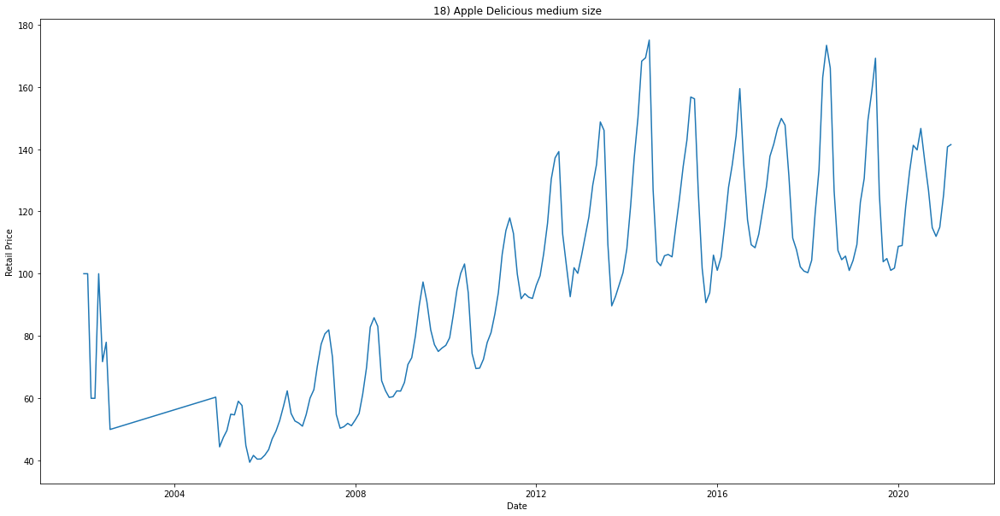

The Mean Retail Price of Gur Local is 34.14
Median 36.19
Mode 63.99
Standard Deviation 16.24


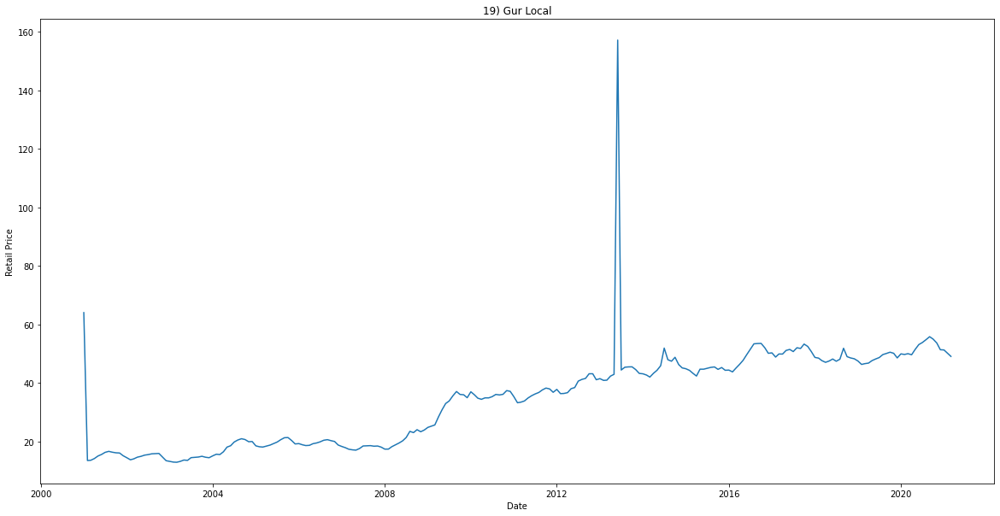

The Mean Retail Price of Jowar White is 18.85
Median 15.85
Mode 9.08
Standard Deviation 8.59


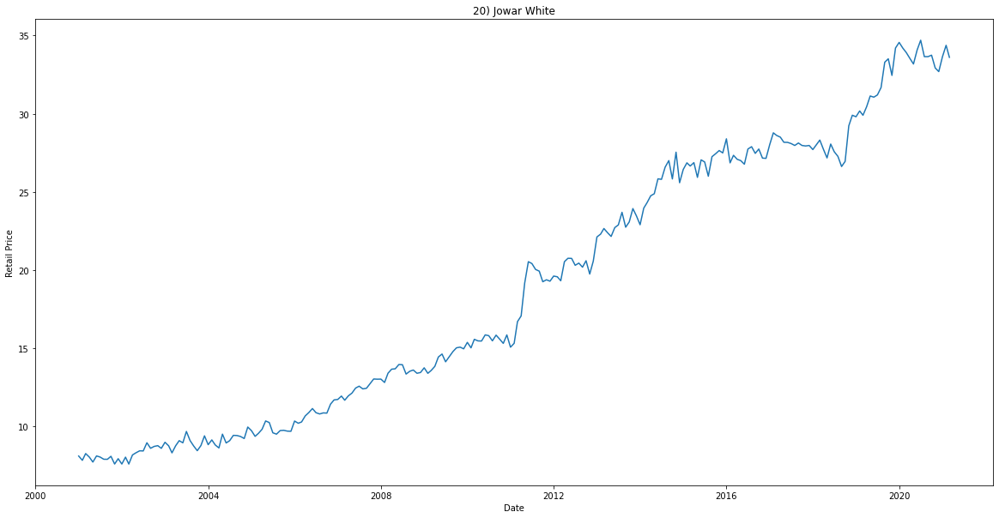

The Mean Retail Price of Maize FAQ is 17.02
Median 15.88
Mode 26.21
Standard Deviation 7.40


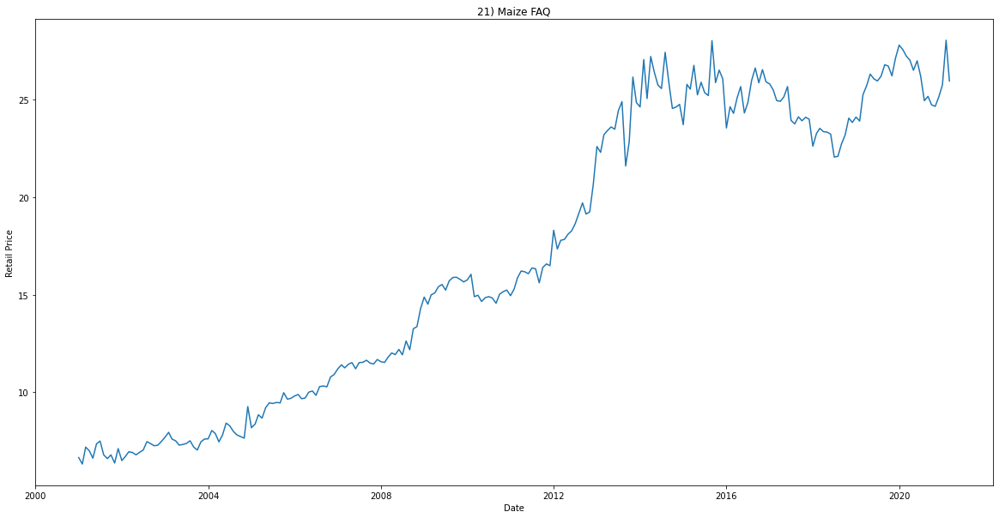

The Mean Retail Price of Masur Split is 53.64
Median 56.58
Mode 25.61
Standard Deviation 21.38


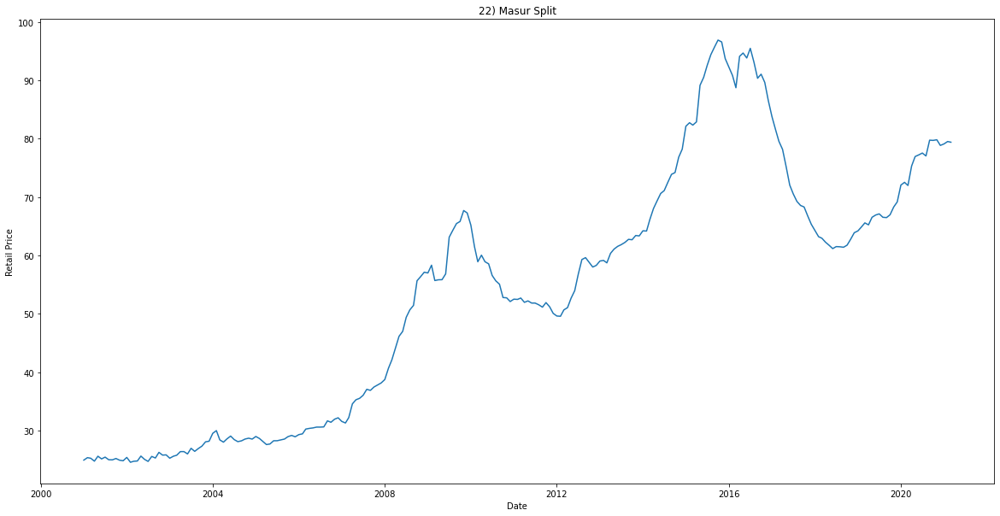

The Mean Retail Price of Meat Mutton is 285.39
Median 249.17
Mode 107.43
Standard Deviation 156.51


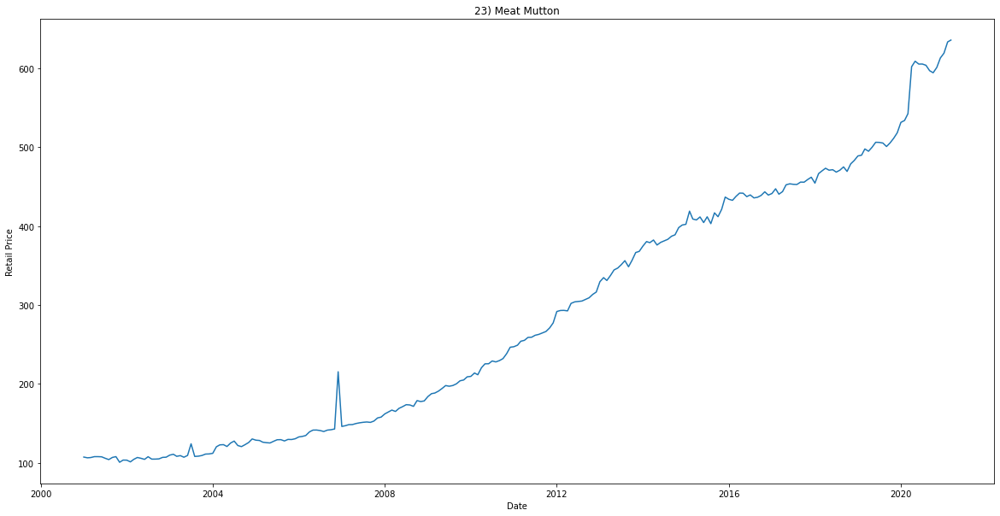

The Mean Retail Price of Milk Cow/Buffalo is 30.28
Median 28.04
Mode 14.71
Standard Deviation 13.11


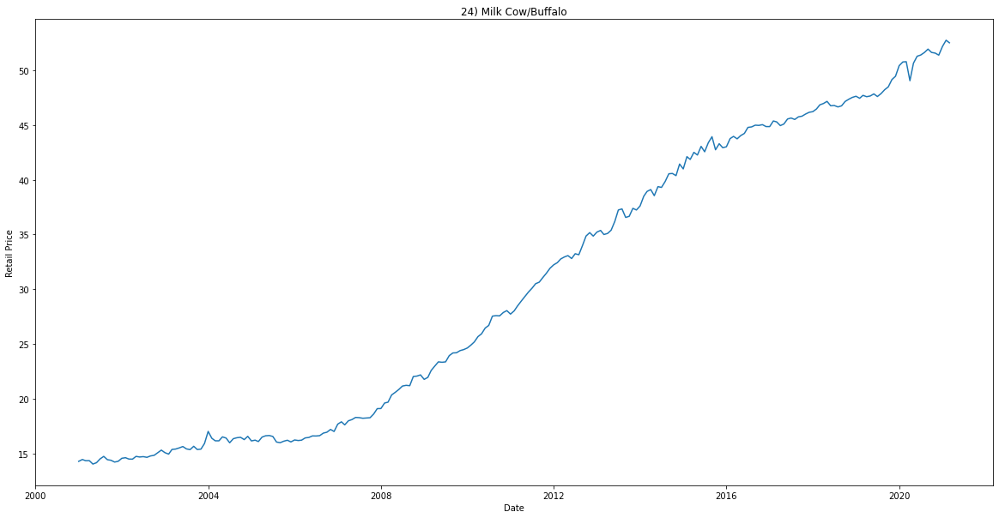

The Mean Retail Price of Milk Dairy is 29.01
Median 27.07
Mode 43.48
Standard Deviation 12.58


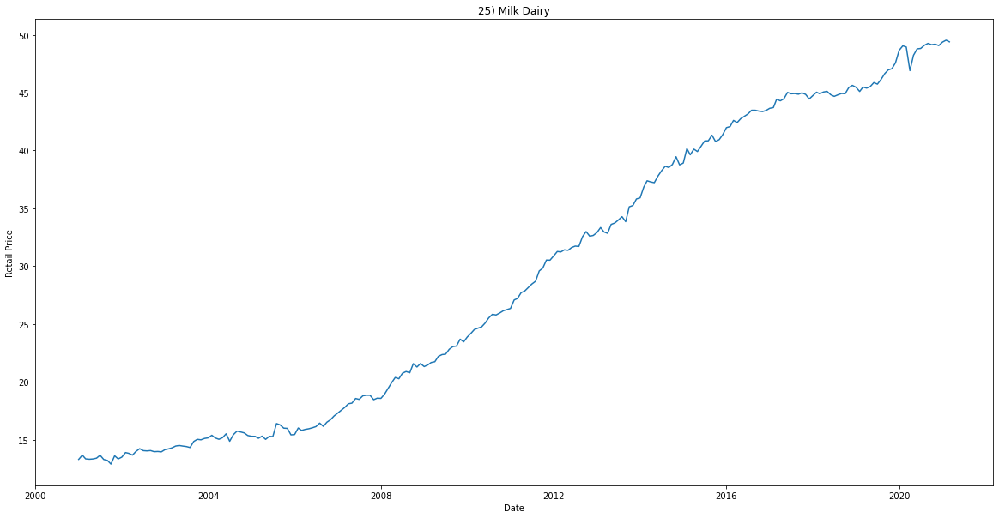

The Mean Retail Price of Coriander Powdered Agmark is 15.68
Median 13.91
Mode 24.93
Standard Deviation 6.49


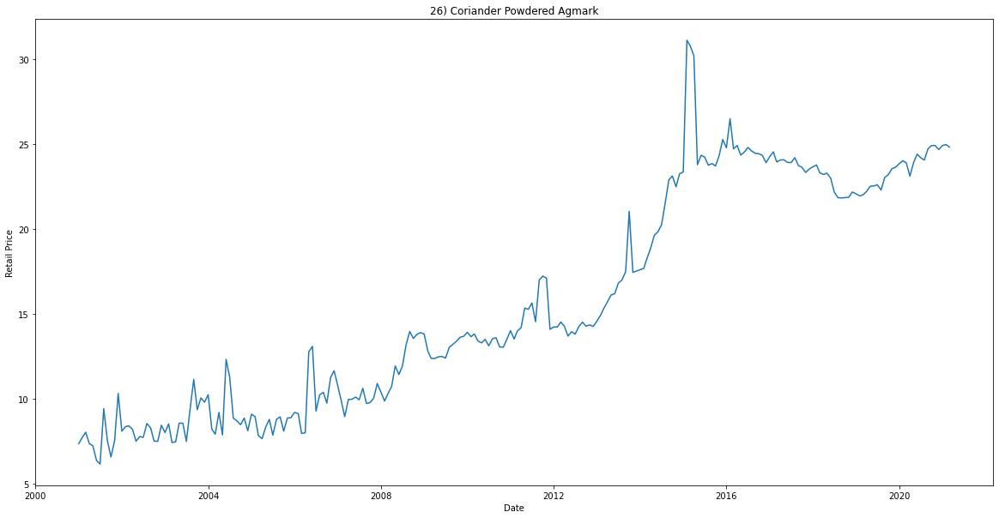

The Mean Retail Price of Cummin Seed Common is 183.37
Median 182.83
Mode 226.87
Standard Deviation 61.80


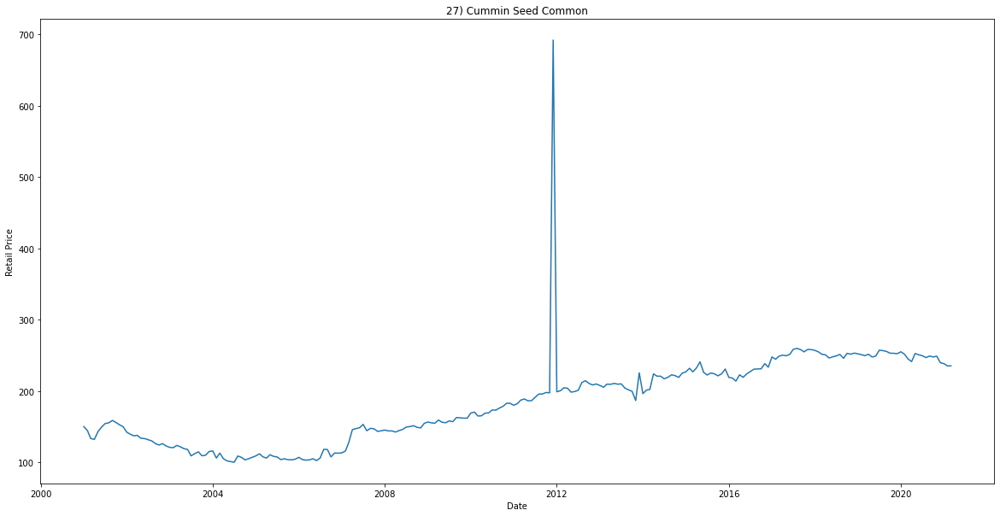

The Mean Retail Price of Fish Rohu 1Kg Size is 121.75
Median 119.25
Mode 63.95
Standard Deviation 53.19


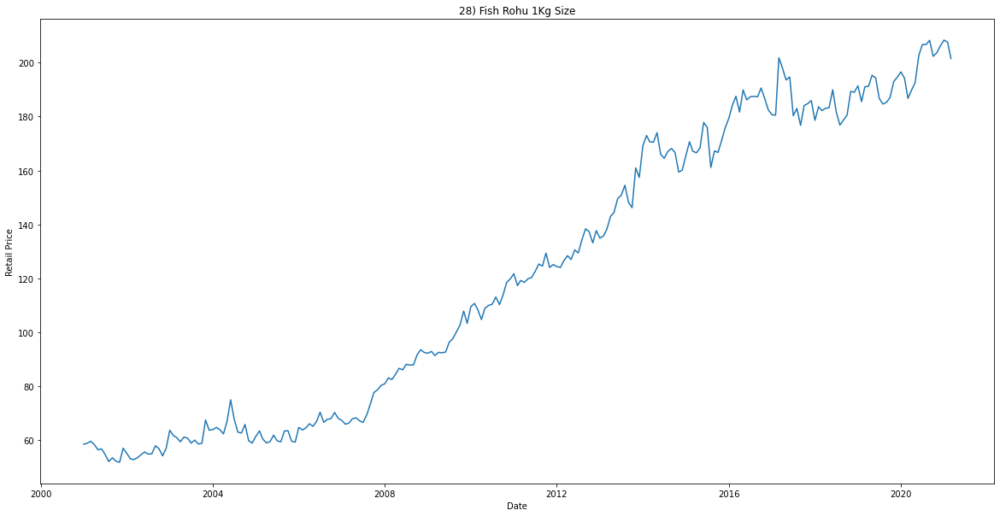

The Mean Retail Price of Ghee Desi is 308.22
Median 284.89
Mode 144.77
Standard Deviation 135.20


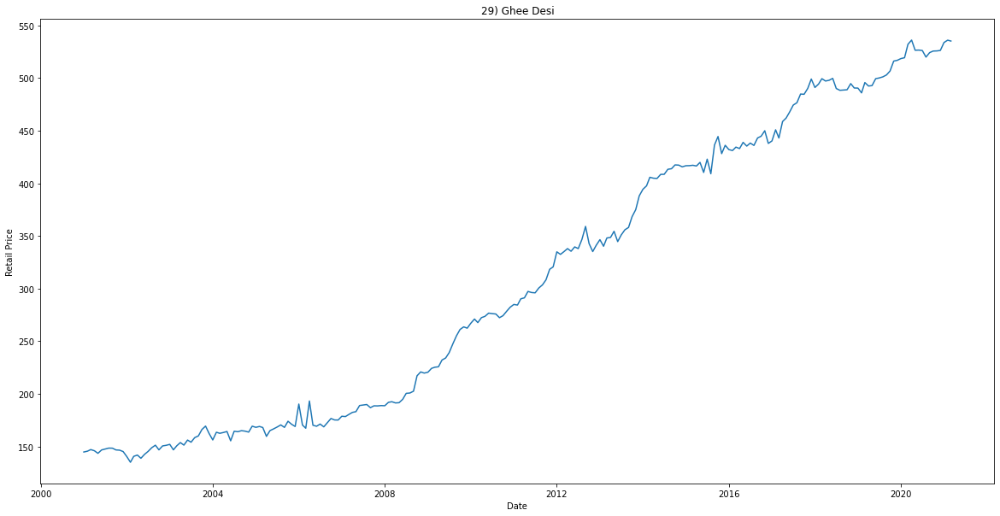

The Mean Retail Price of Gram Split is 50.20
Median 39.18
Mode 25.30
Standard Deviation 24.42


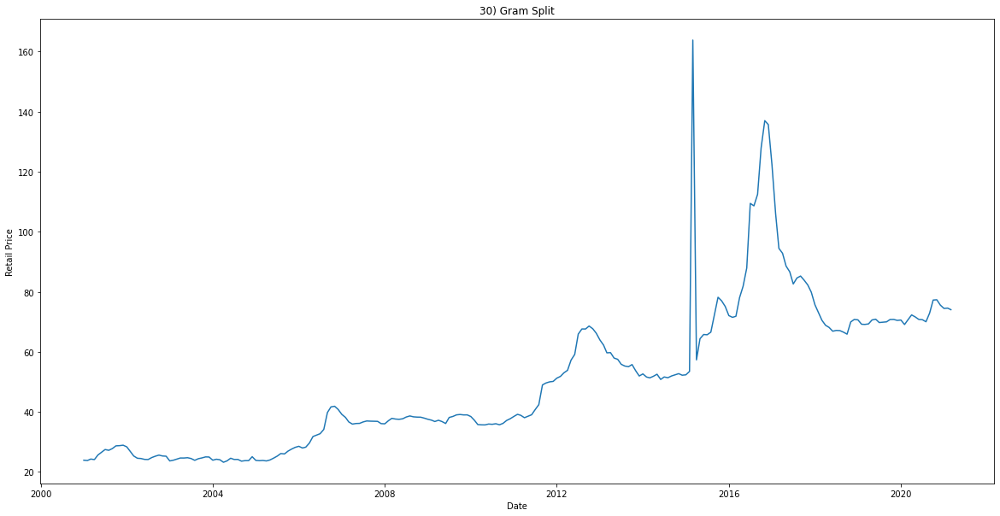

The Mean Retail Price of Gram Whole is 45.27
Median 36.44
Mode 22.67
Standard Deviation 20.77


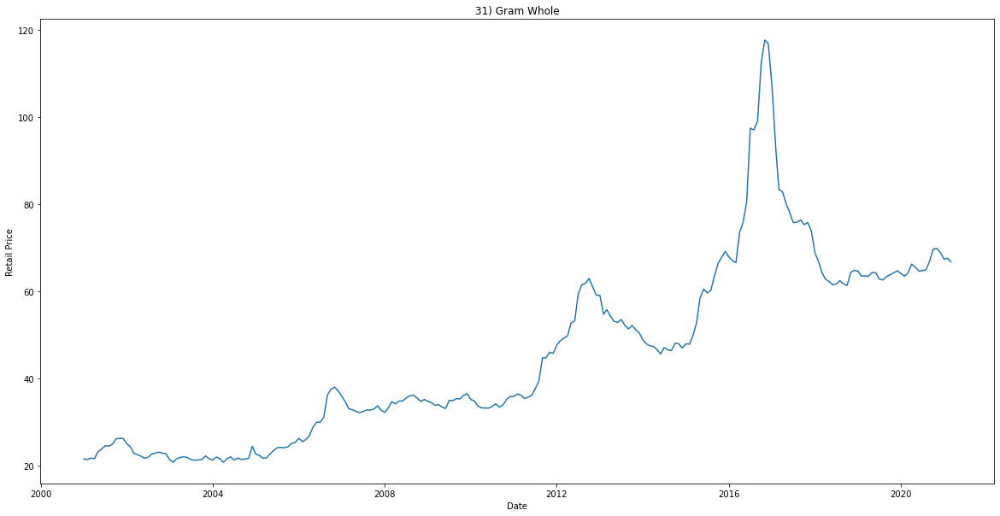

The Mean Retail Price of Fish Cat Fish is 183.88
Median 169.35
Mode 117.69
Standard Deviation 89.06


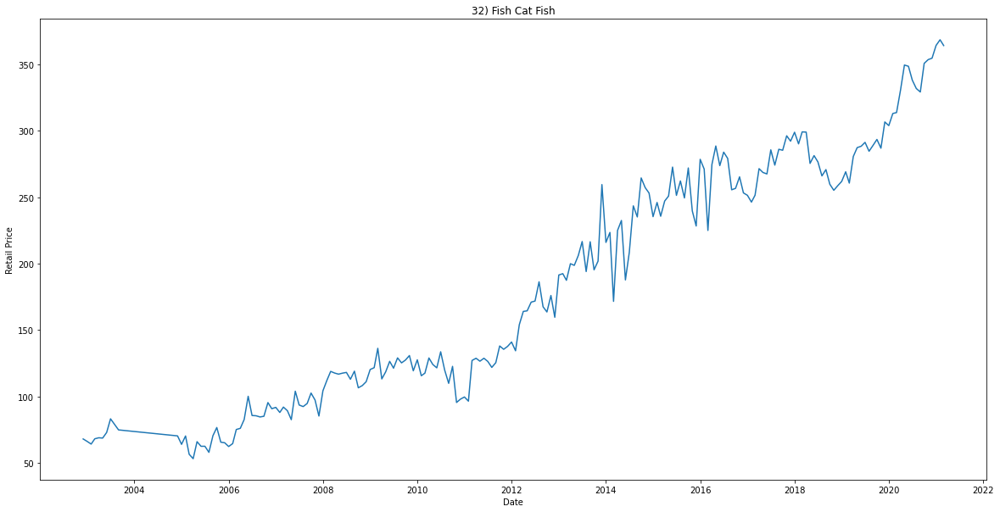

The Mean Retail Price of Fish Pomphret is 250.88
Median 224.83
Mode 131.94
Standard Deviation 133.50


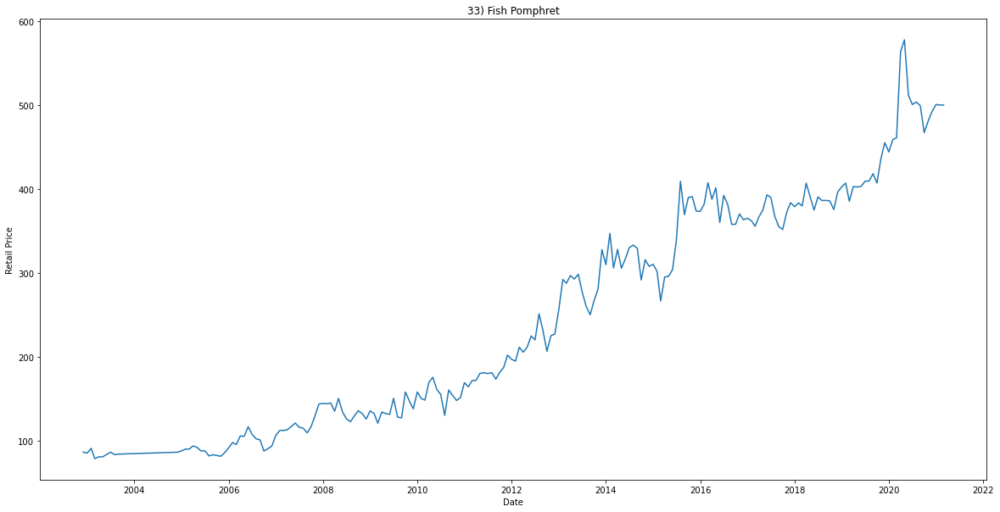

The Mean Retail Price of Black Pepper Whole is 403.03
Median 261.00
Mode 238.78
Standard Deviation 270.98


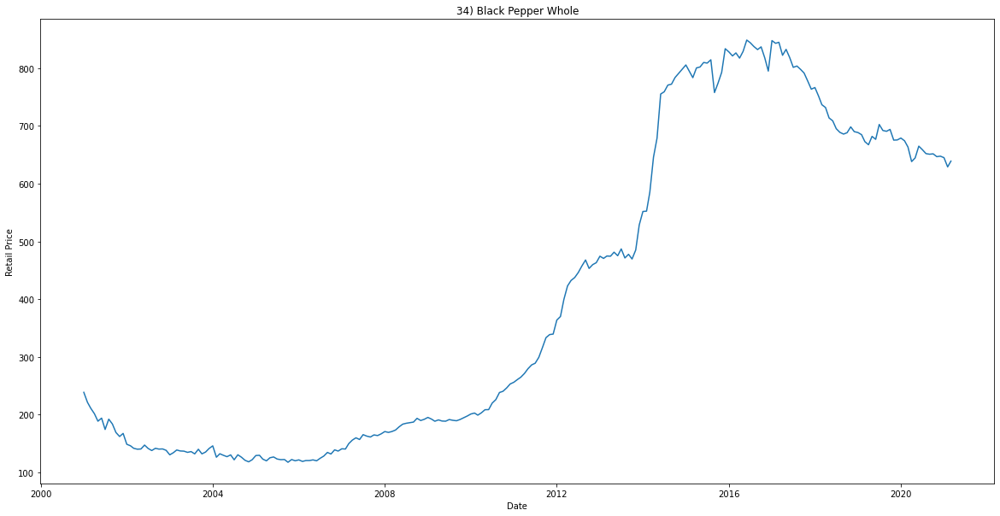

The Mean Retail Price of Bread Local is 17.47
Median 15.94
Mode 9.12
Standard Deviation 7.35


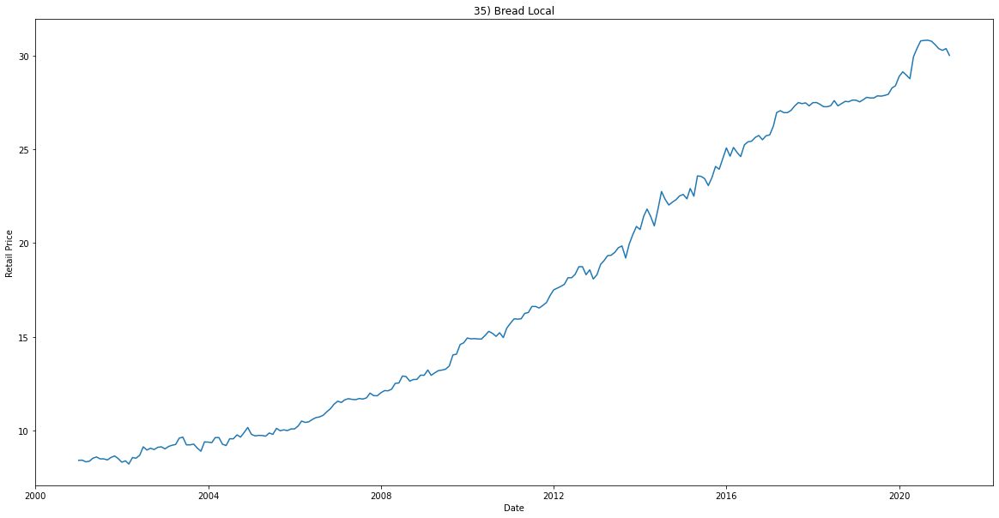

The Mean Retail Price of Brinjal FAQ is 20.34
Median 18.90
Mode 12.00
Standard Deviation 9.03


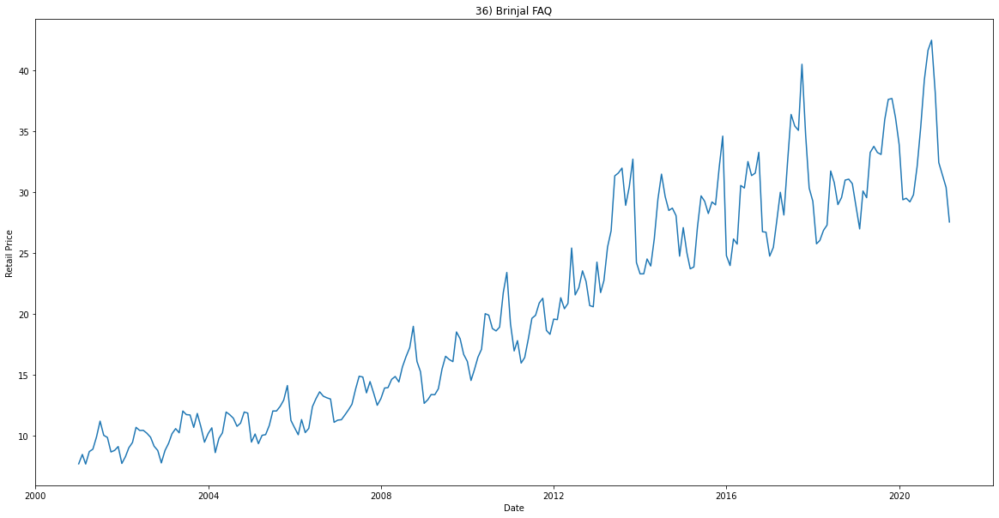

The Mean Retail Price of Butter Amul/Any Other is 30.54
Median 28.68
Mode 26.90
Standard Deviation 10.46


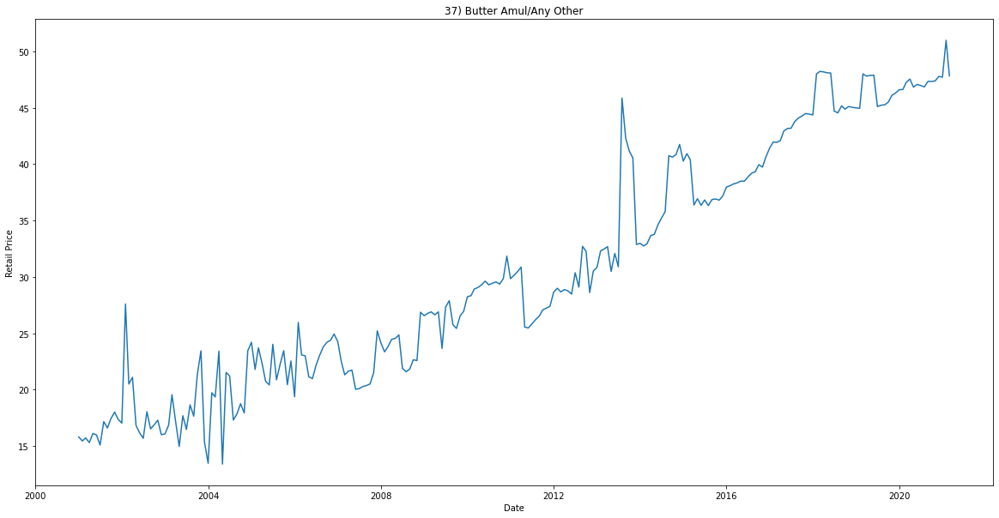

The Mean Retail Price of Chicken Poultry is 120.74
Median 124.17
Mode 166.75
Standard Deviation 46.11


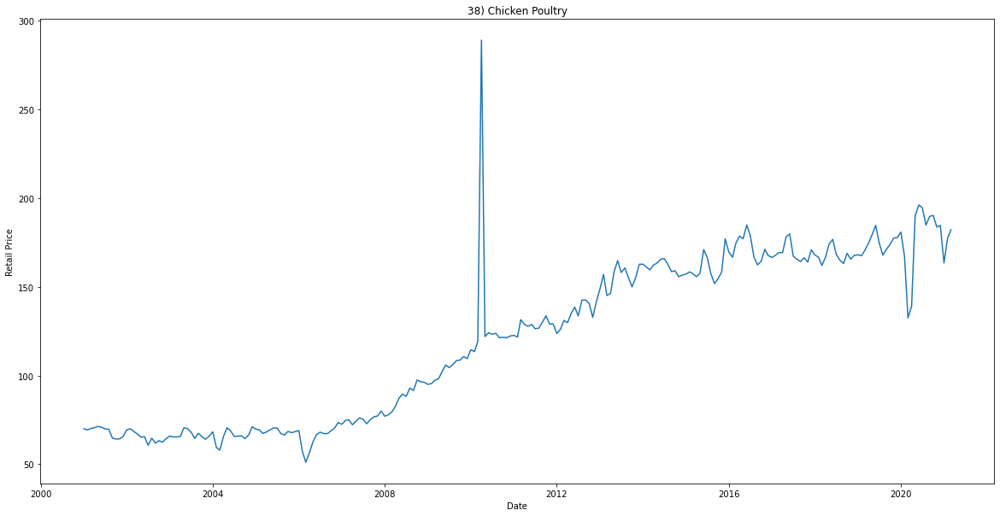

The Mean Retail Price of Coconut Dry is 104.69
Median 89.16
Mode 103.73
Standard Deviation 41.03


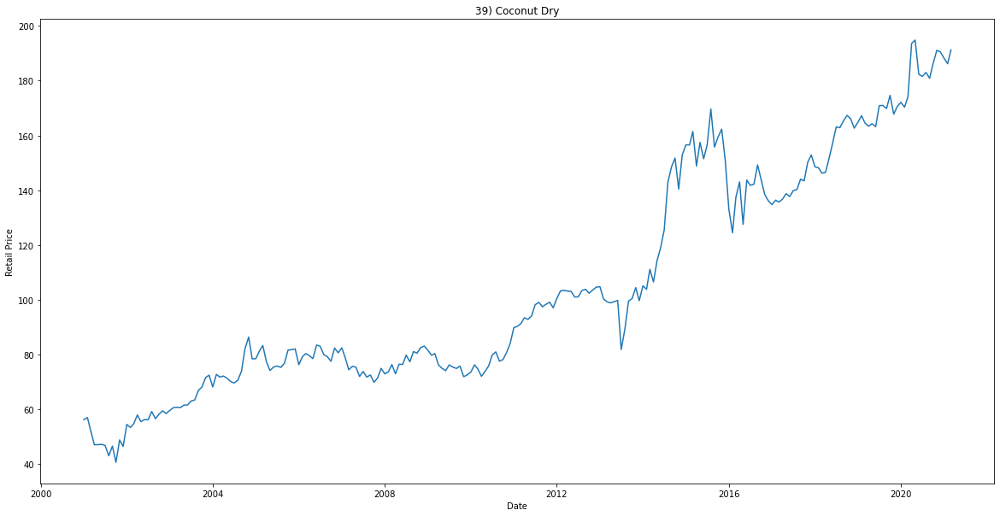

The Mean Retail Price of Coffee Powdered is 474.42
Median 461.67
Mode 142.27
Standard Deviation 275.39


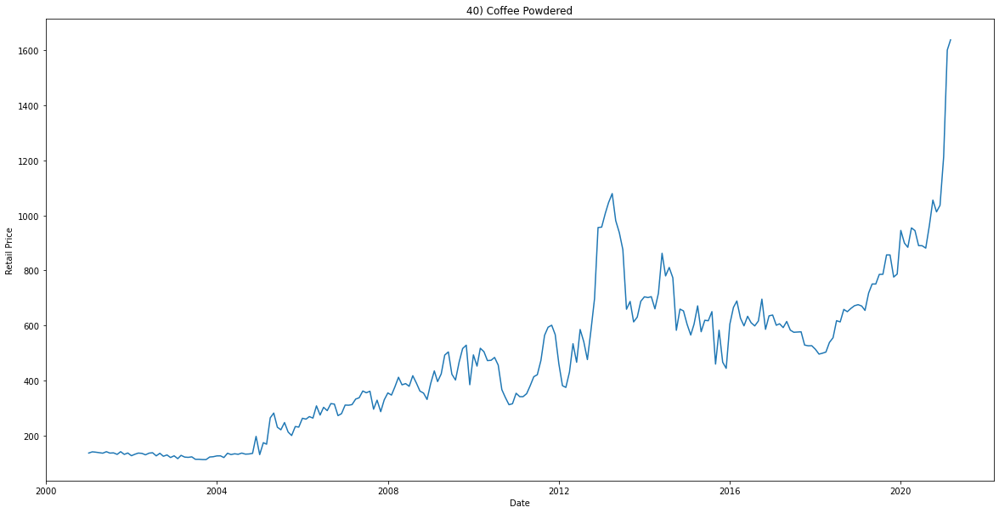

The Mean Retail Price of Coconut Fresh is 21.73
Median 20.98
Mode 5.00
Standard Deviation 6.87


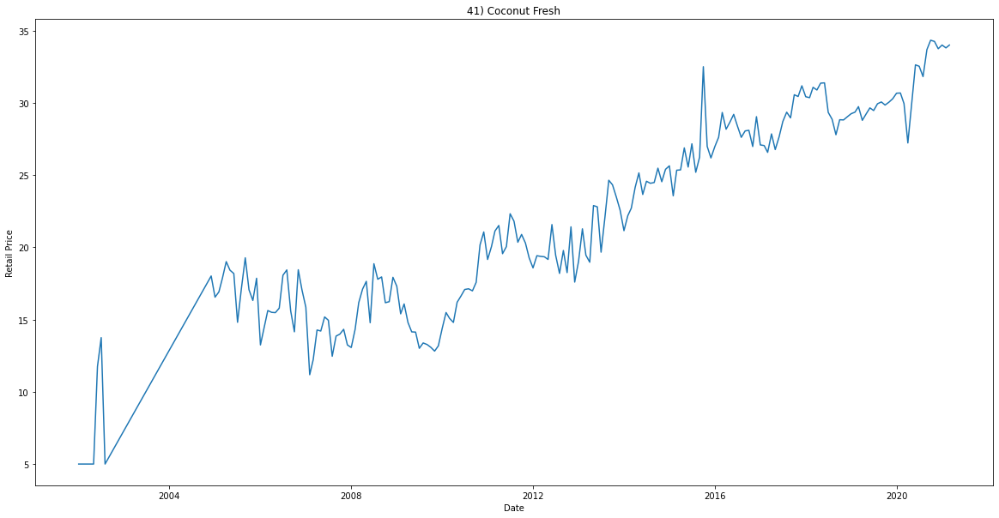

The Mean Retail Price of Coffee Instant is 513.76
Median 538.54
Mode 185.00
Standard Deviation 192.85


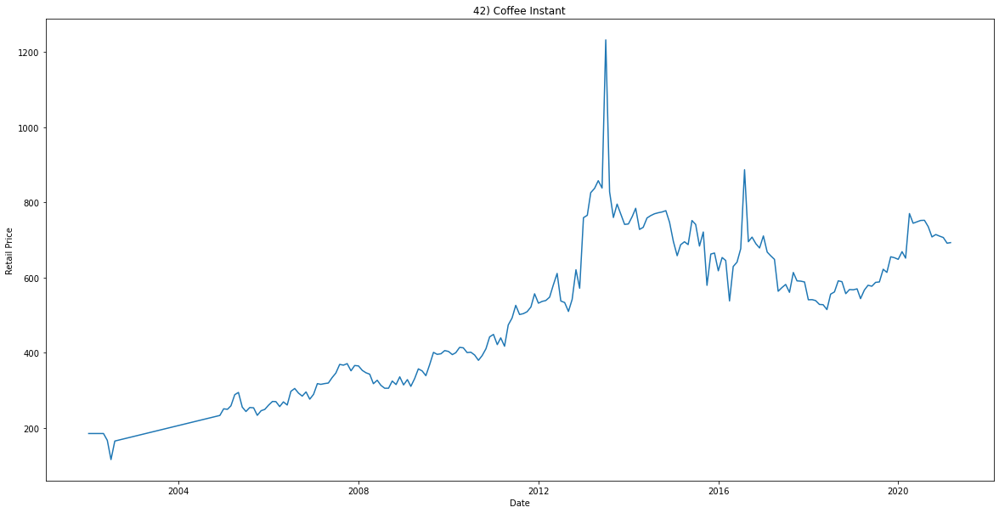

The Mean Retail Price of Tomato FAQ is 21.06
Median 19.04
Mode 14.54
Standard Deviation 11.16


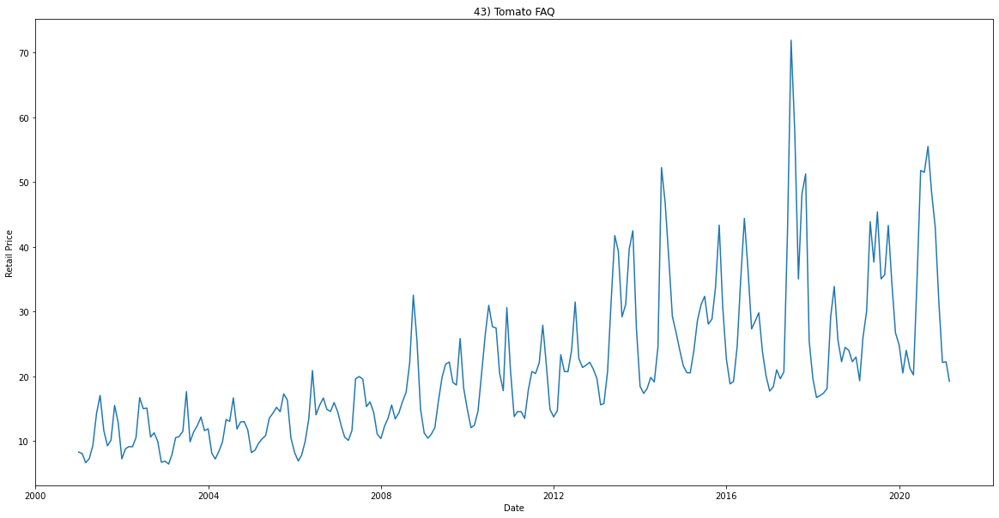

The Mean Retail Price of Turmeric Powdered Agmark is 16.08
Median 18.68
Mode 21.08
Standard Deviation 6.91


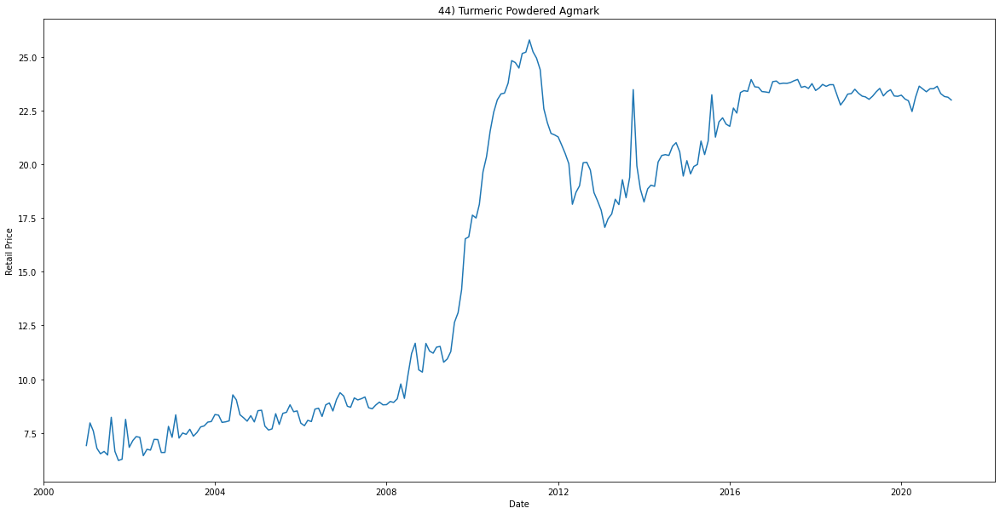

The Mean Retail Price of Urad Split is 66.42
Median 65.93
Mode 69.08
Standard Deviation 32.62


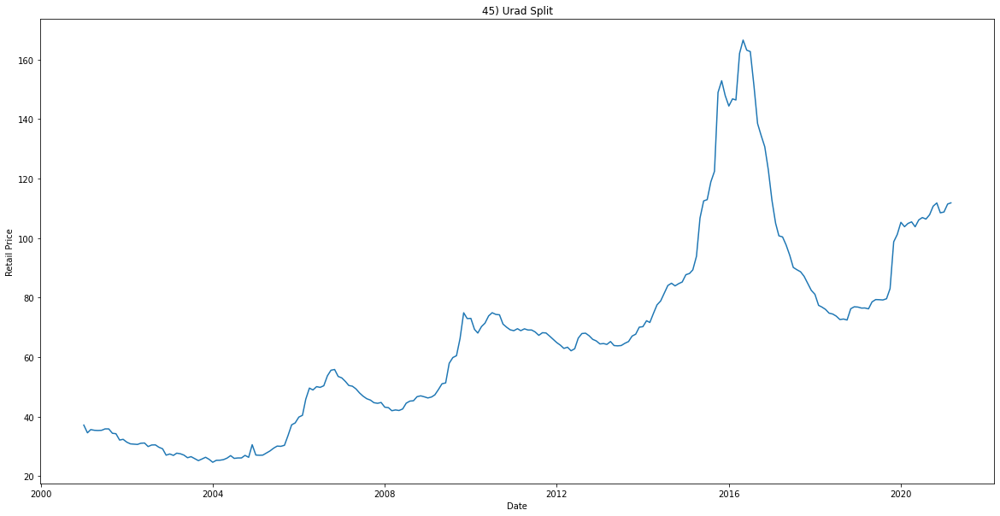

The Mean Retail Price of Wheat Desi is 19.45
Median 19.57
Mode 11.10
Standard Deviation 6.21


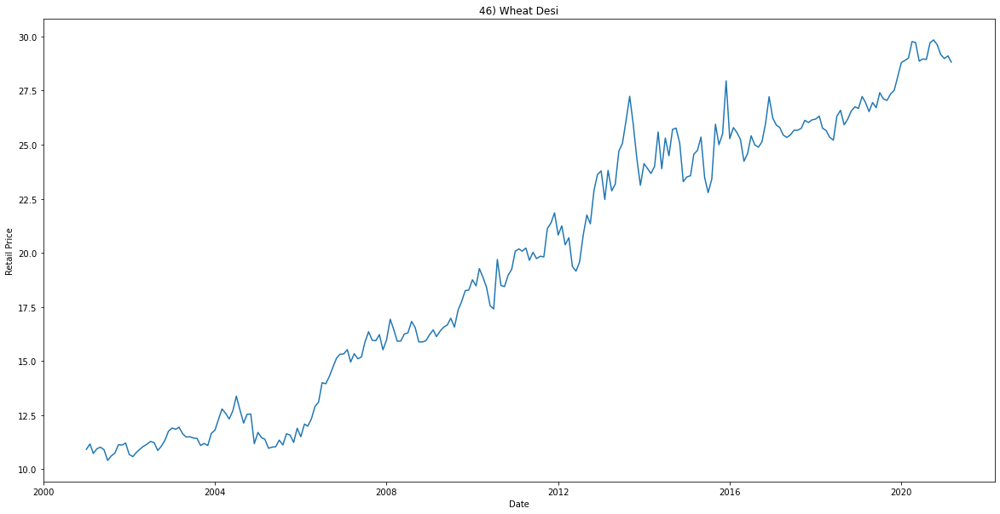

The Mean Retail Price of Wheat Kalyan HYV is 17.95
Median 17.47
Mode 25.98
Standard Deviation 7.13


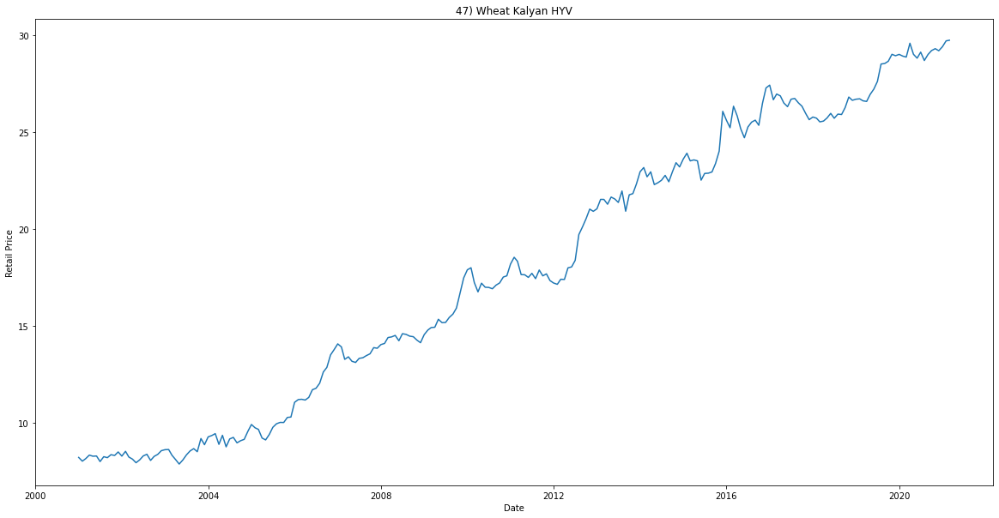

In [8]:
import statistics
varieties_dm=(dm['Commodity']+"+"+dm['Variety']).unique()
i=1
for item in varieties_dm:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dm_item_specific=dm[(dm['Commodity']==C) & (dm['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dm_item_specific['Date']
    item_specific_dp['Retail Price']=dm_item_specific['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    print("The Mean Retail Price of "+C+" "+V+" is "+str("{:.2f}".format(item_specific_sorted['Retail Price'].mean())))
    print("Median "+str("{:.2f}".format(item_specific_sorted['Retail Price'].median())))
    print("Mode "+str("{:.2f}".format(statistics.mode(item_specific_sorted['Retail Price']))))
    print("Standard Deviation "+str("{:.2f}".format(statistics.stdev(item_specific_sorted['Retail Price']))))
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Retail Price")
    plt.plot(item_specific_sorted['Date'], item_specific_sorted['Retail Price'])
    plt.show()

<h1>Plots of Monthly Non-Food Commodities

The Mean Retail Price of Gents Dhoti Cotton is 237.70
Median 181.68
Mode 720.00
Standard Deviation 131.52


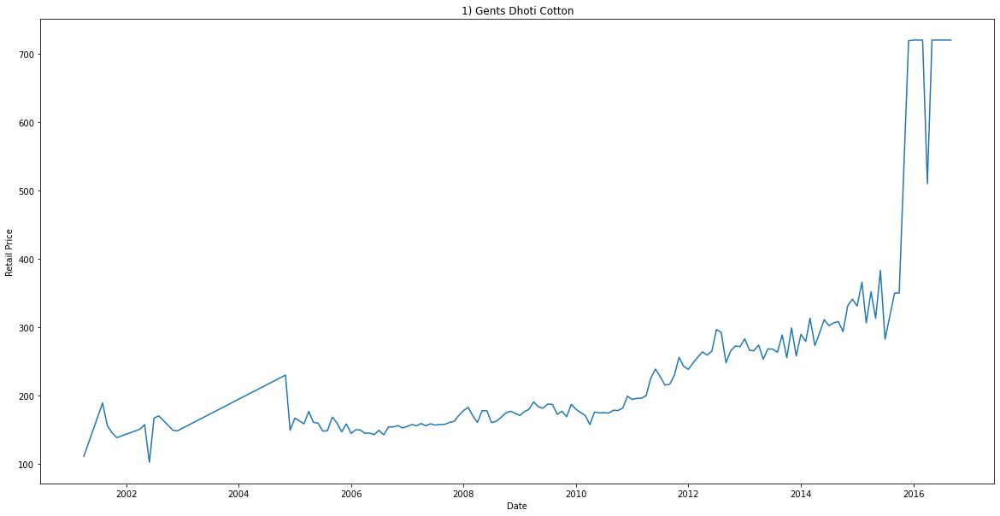

The Mean Retail Price of Ink Chelpark is 15.84
Median 14.80
Mode 15.00
Standard Deviation 3.41


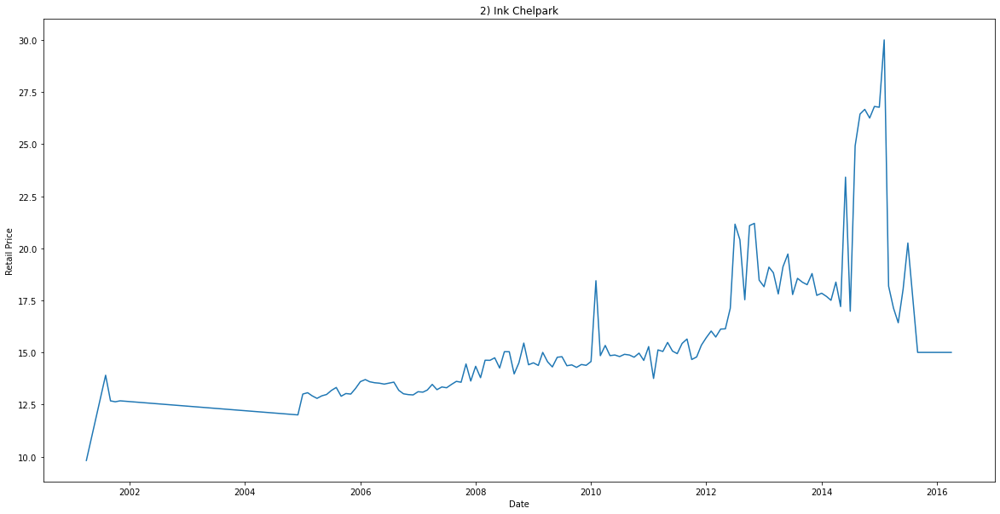

The Mean Retail Price of Kettle Aluminium is 219.92
Median 218.39
Mode 260.00
Standard Deviation 62.89


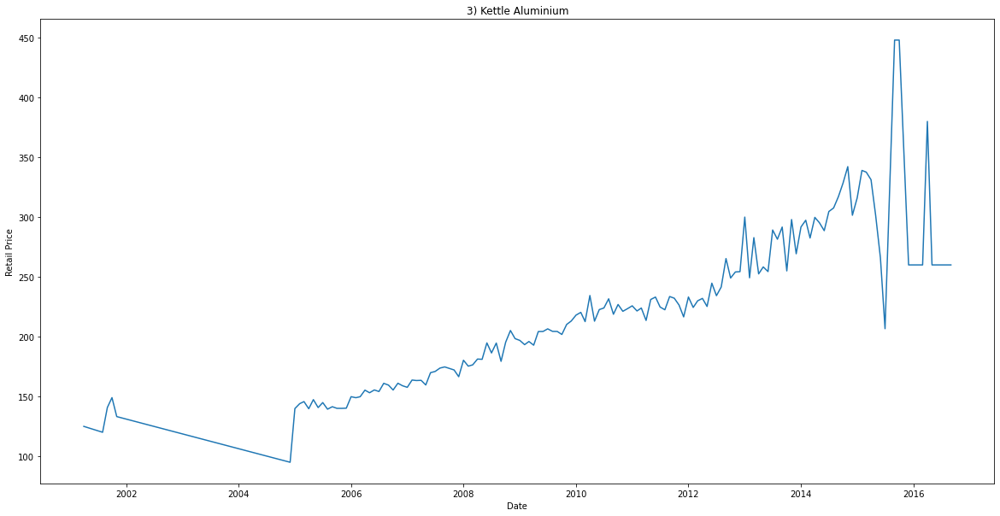

The Mean Retail Price of Pant Cloth Terrycot is 180.30
Median 160.15
Mode 380.00
Standard Deviation 53.75


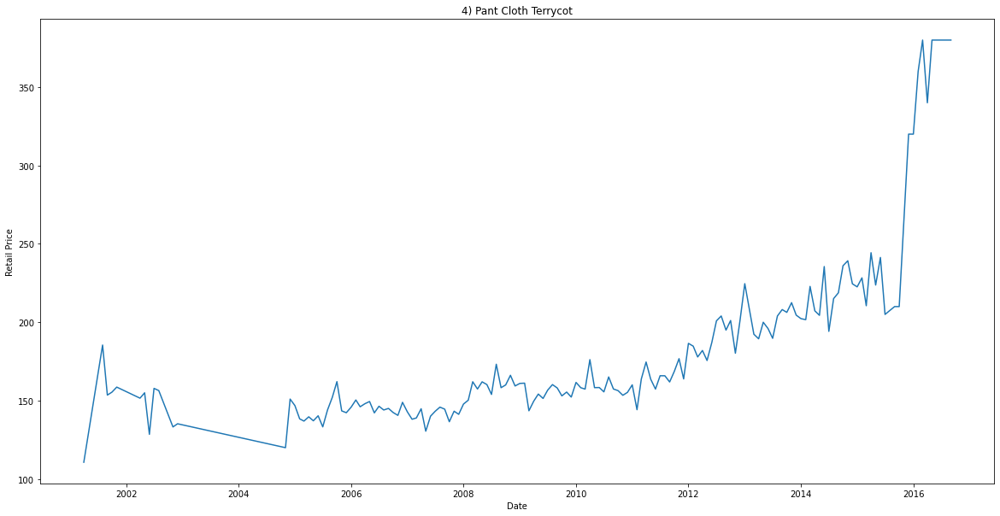

The Mean Retail Price of Paper Ruled Card Board Bound is 27.91
Median 25.66
Mode 38.00
Standard Deviation 8.95


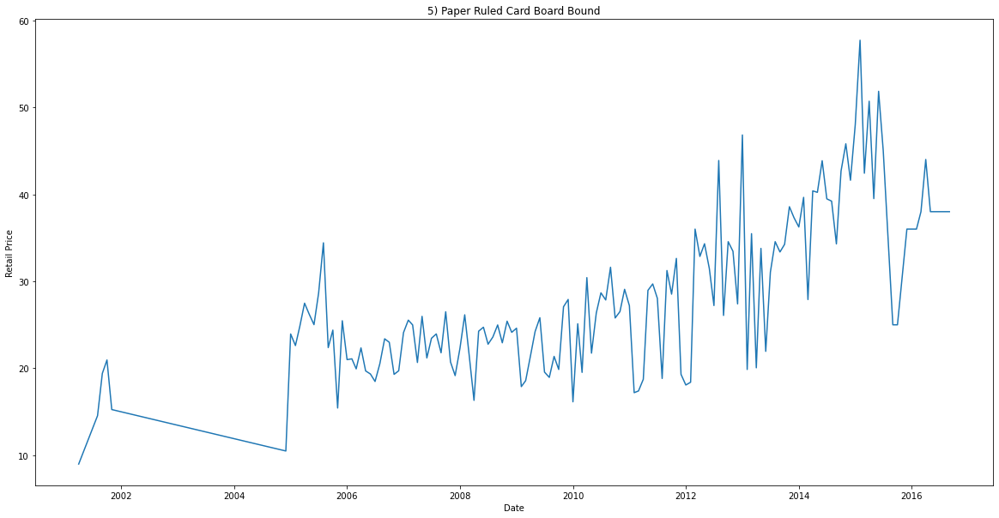

The Mean Retail Price of Pent Cloth Cotton is 203.02
Median 170.70
Mode 350.00
Standard Deviation 68.11


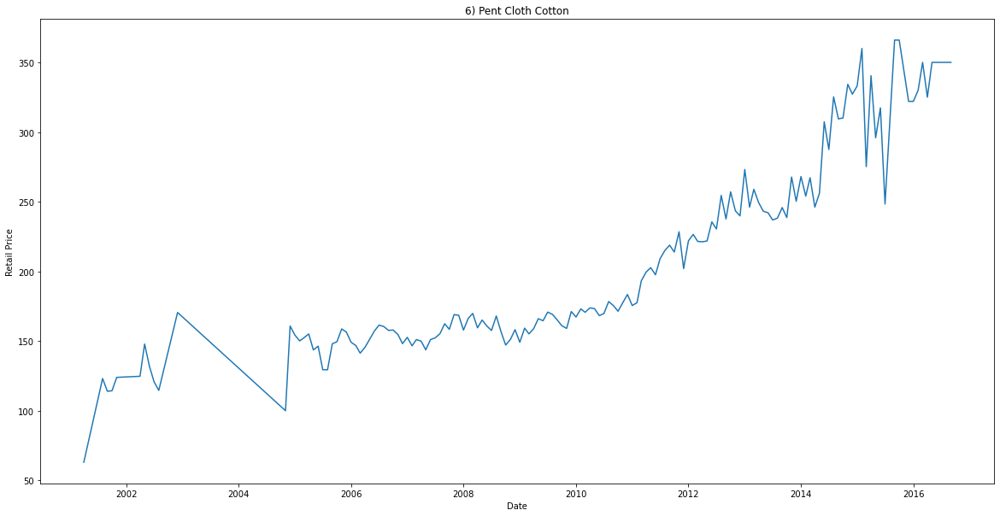

The Mean Retail Price of Sandals-Ladies Bata is 306.13
Median 301.91
Mode 399.00
Standard Deviation 57.63


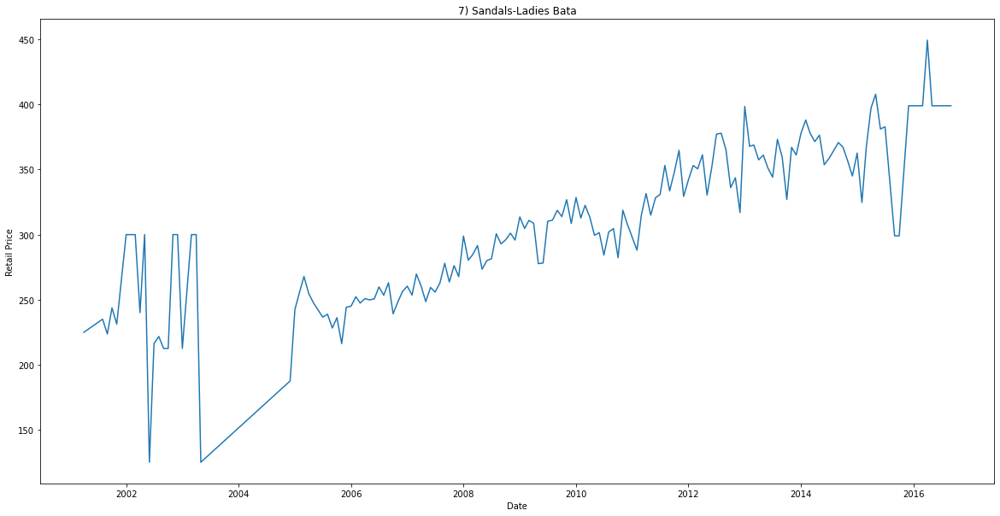

The Mean Retail Price of Saree Polyester is 313.23
Median 282.00
Mode 580.00
Standard Deviation 85.10


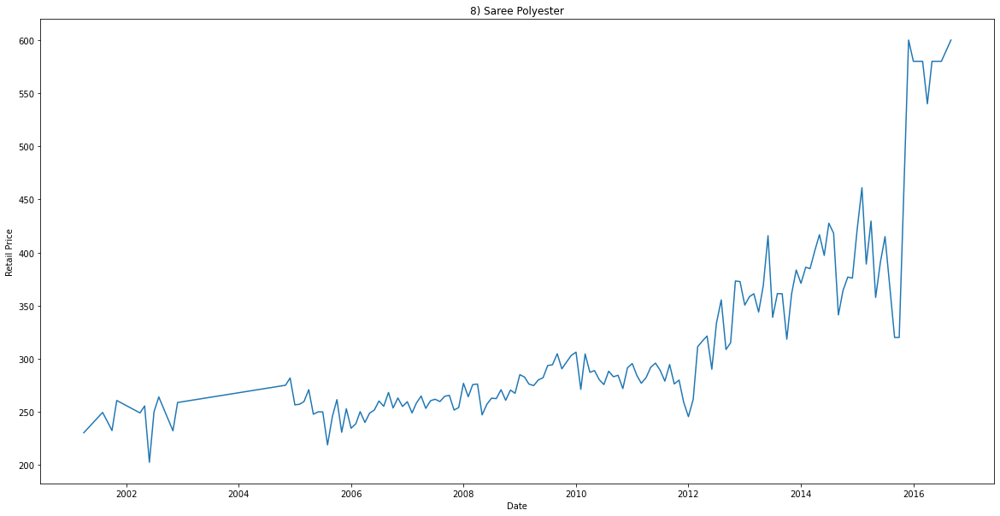

The Mean Retail Price of Saree Cotton is 297.66
Median 249.39
Mode 540.00
Standard Deviation 97.16


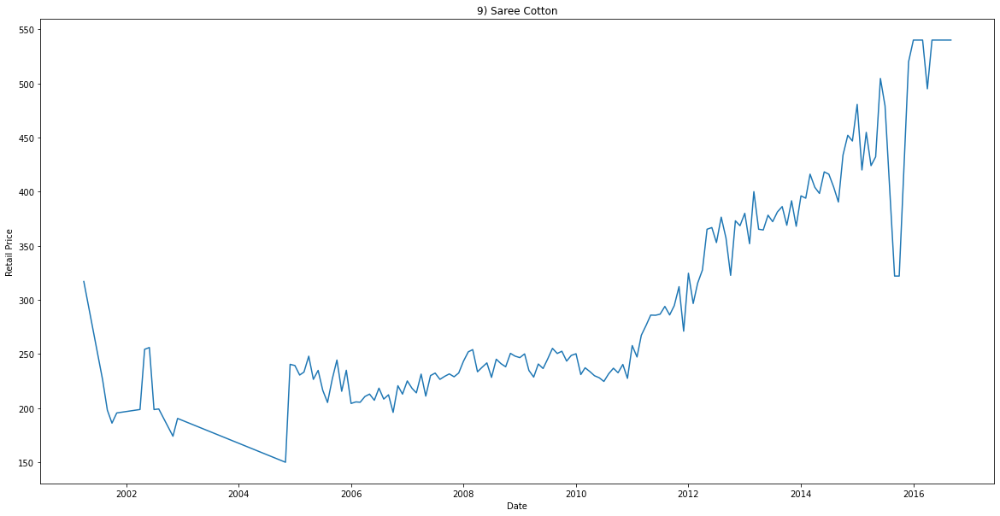

The Mean Retail Price of Shirting Terrycot is 97.14
Median 78.19
Mode 220.00
Standard Deviation 42.30


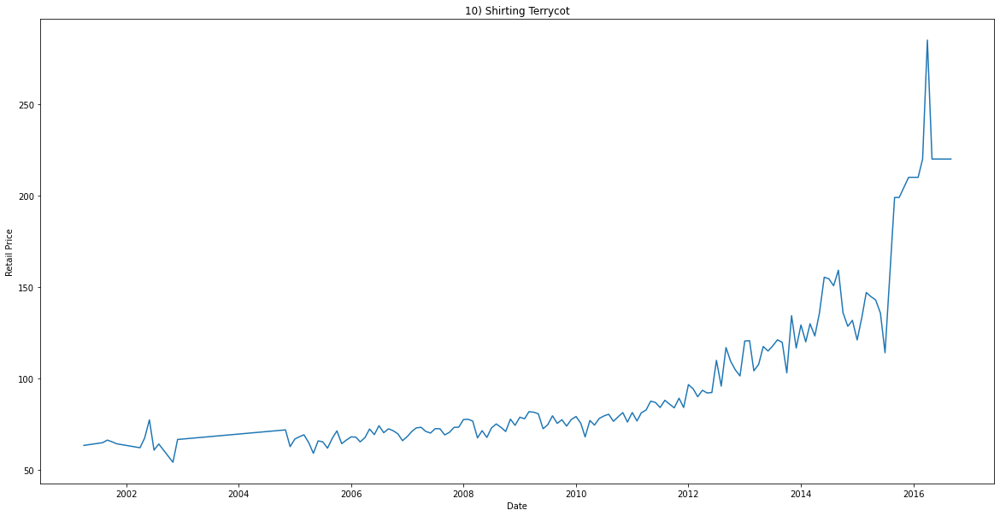

The Mean Retail Price of Shirting Cotton is 95.69
Median 85.22
Mode 140.00
Standard Deviation 37.58


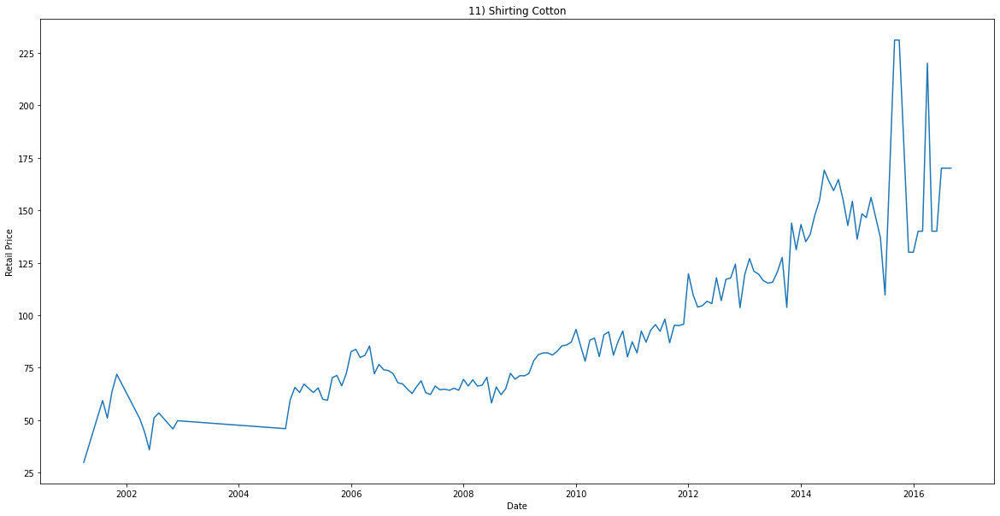

The Mean Retail Price of Shoes-Gents Bata is 756.22
Median 705.59
Mode 1799.00
Standard Deviation 281.31


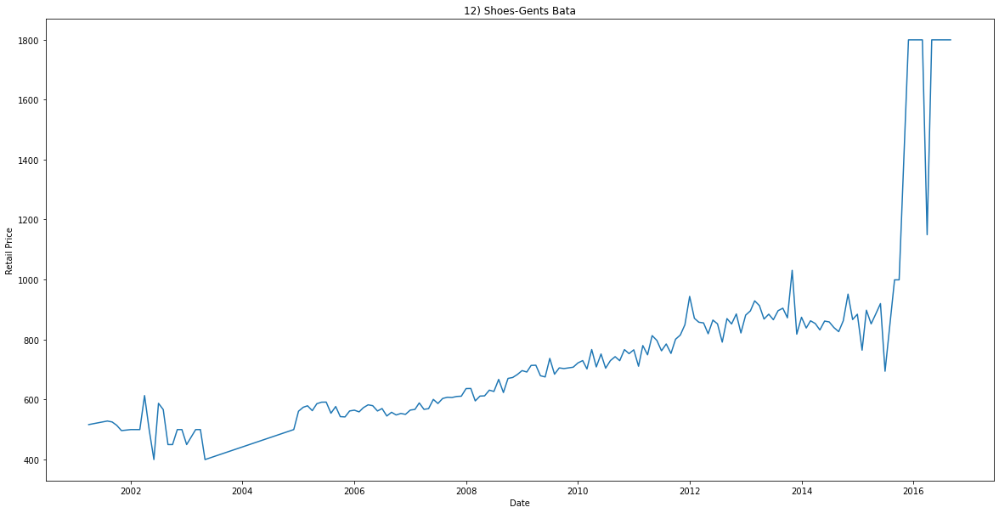

The Mean Retail Price of Tawa Local-1Kg is 99.48
Median 94.42
Mode 220.00
Standard Deviation 45.23


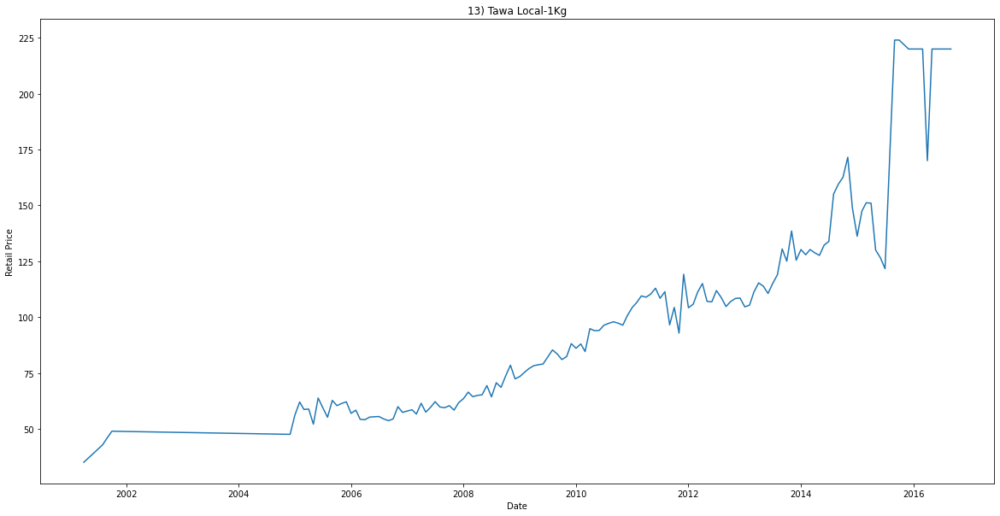

The Mean Retail Price of Tooth Paste Colgate/Cibaca/Promise is 34.80
Median 34.94
Mode 50.00
Standard Deviation 7.30


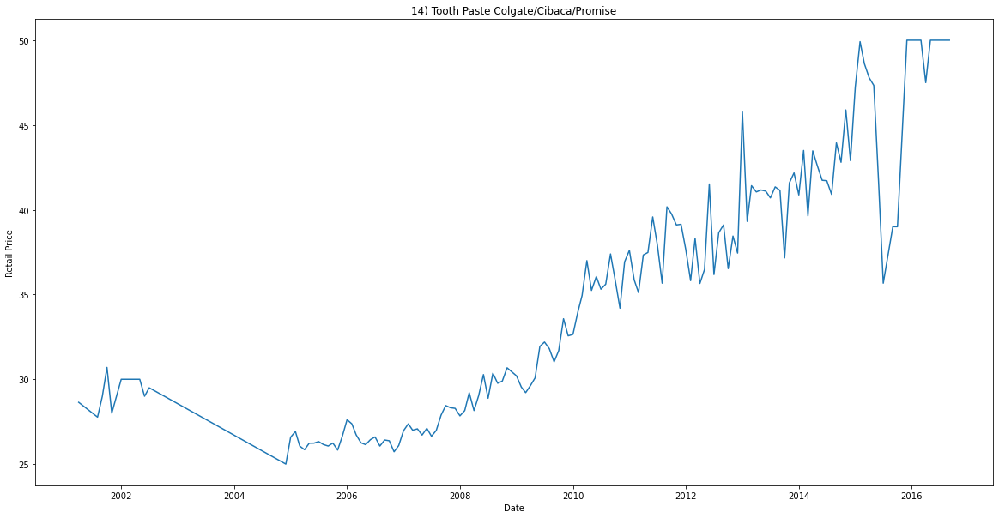

The Mean Retail Price of Tooth Powder Colgate/Cibaca/Promise is 29.69
Median 29.23
Mode 34.00
Standard Deviation 3.57


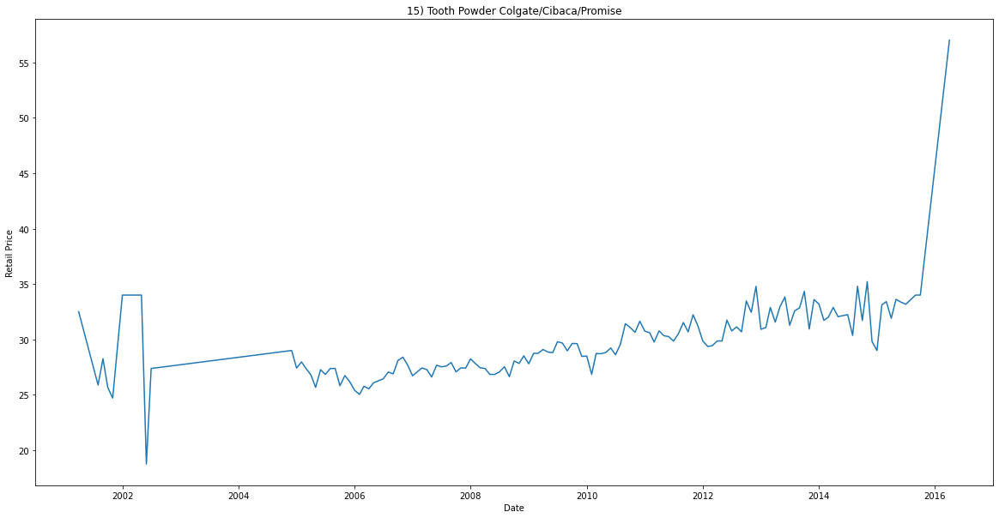

The Mean Retail Price of Tumbler Steel-Normal Size is 110.63
Median 102.59
Mode 240.00
Standard Deviation 45.74


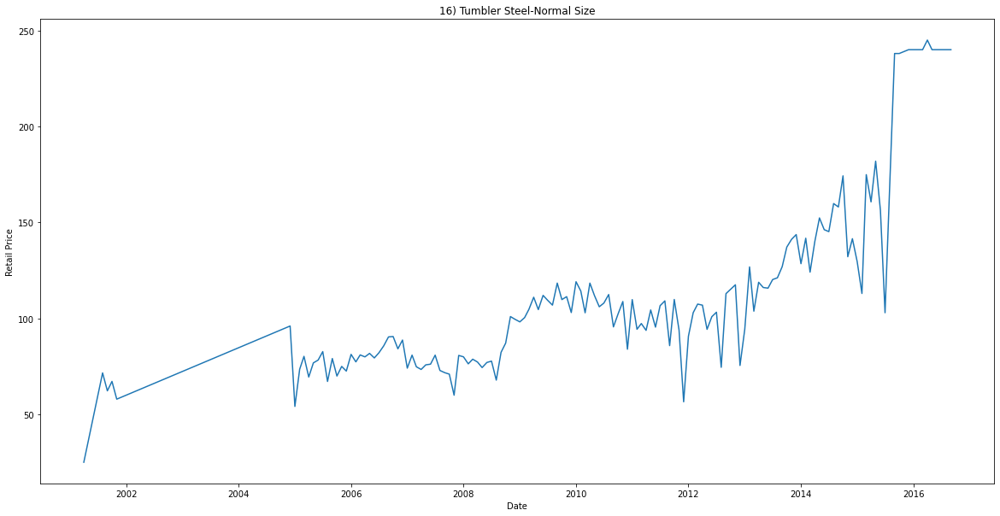

The Mean Retail Price of Bathing Soap Hamam is 17.46
Median 17.19
Mode 18.00
Standard Deviation 4.33


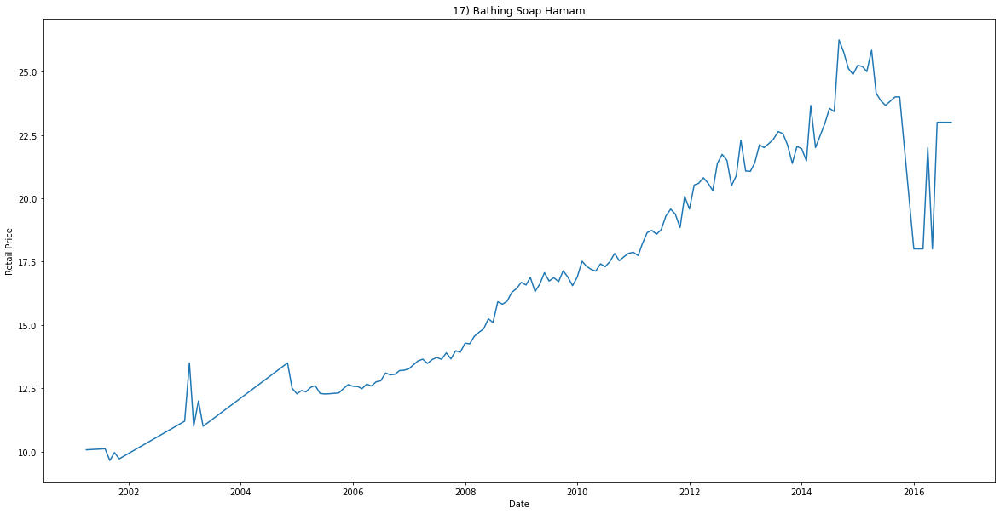

The Mean Retail Price of Bathing Soap Lifebuoy is 14.59
Median 13.76
Mode 10.00
Standard Deviation 5.46


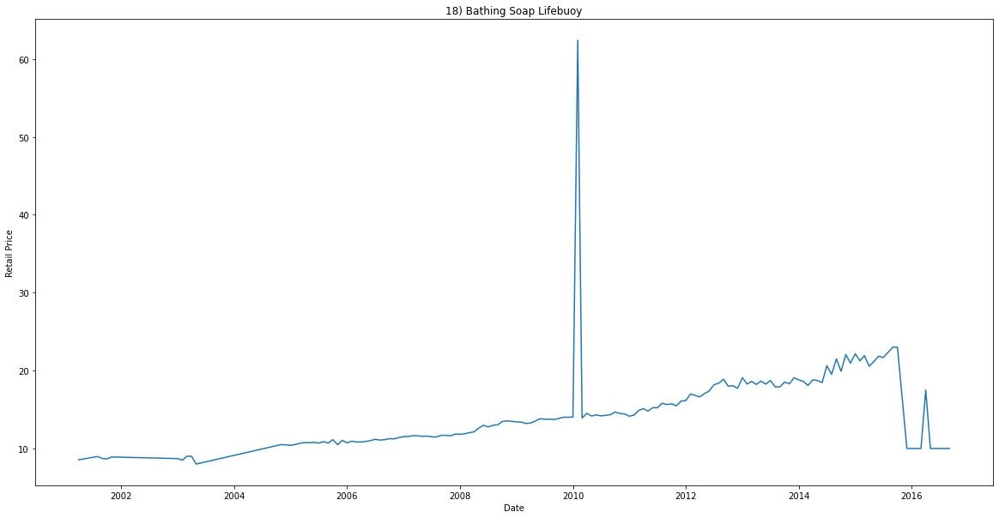

The Mean Retail Price of Chappal-Ladies Bata is 216.89
Median 204.29
Mode 299.00
Standard Deviation 62.97


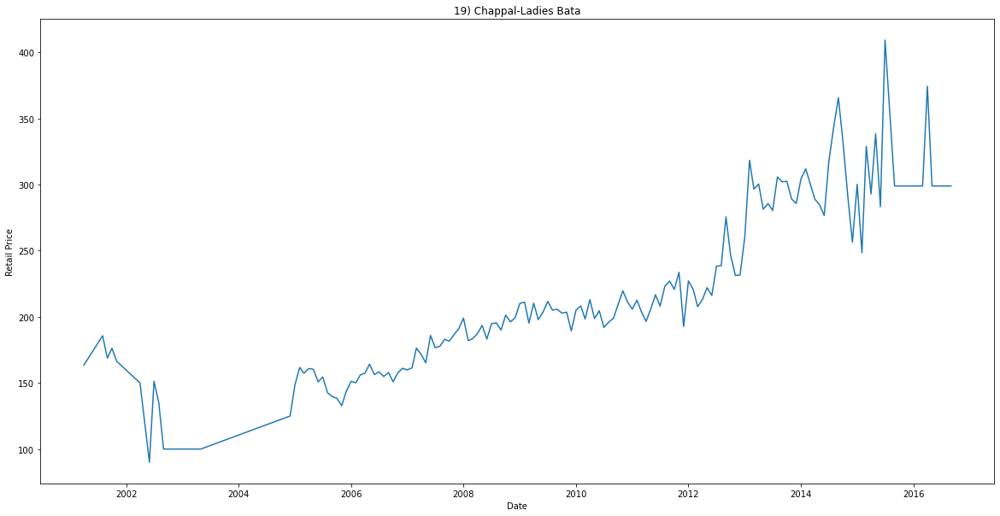

The Mean Retail Price of Chappal-Rubber Bata is 107.27
Median 86.83
Mode 49.95
Standard Deviation 54.08


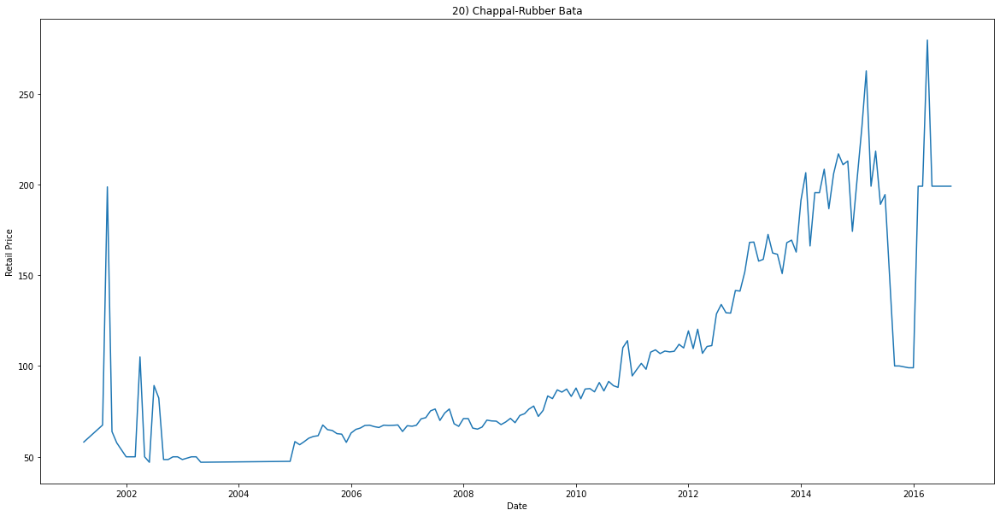

The Mean Retail Price of Detergent Powder Nirma/Any Other is 40.36
Median 41.02
Mode 44.00
Standard Deviation 12.54


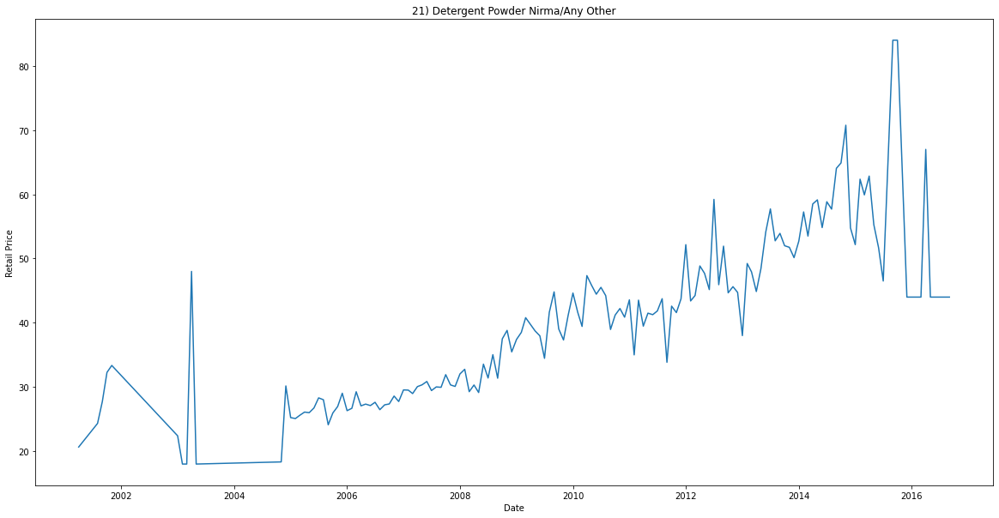

In [9]:
import statistics
varieties_dm_nf=(dm_nf['Commodity']+"+"+dm_nf['Variety']).unique()
i=1
for item in varieties_dm_nf:
    itemName=item.split("+")
    C=itemName[0]
    V=itemName[1]
    dm_nf_item_specific=dm_nf[(dm_nf['Commodity']==C) & (dm_nf['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dm_nf_item_specific['Date']
    item_specific_dp['Retail Price']=dm_nf_item_specific['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    print("The Mean Retail Price of "+C+" "+V+" is "+str("{:.2f}".format(item_specific_sorted['Retail Price'].mean())))
    print("Median "+str("{:.2f}".format(item_specific_sorted['Retail Price'].median())))
    print("Mode "+str("{:.2f}".format(statistics.mode(item_specific_sorted['Retail Price']))))
    print("Standard Deviation "+str("{:.2f}".format(statistics.stdev(item_specific_sorted['Retail Price']))))
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Retail Price")
    plt.plot(item_specific_sorted['Date'], item_specific_sorted['Retail Price'])
    plt.show()

<h1>Hypothesis Testing

Hypothesis testing is a critical tool in inferential statistics, for determing what the value of a population parameter could be. We often draw this conclusion based on a sample data analysis.

The basis of hypothesis testing has two attributes:

Null Hypothesis: 
Alternative Hypothesis: 

The tests we will discuss in this notebook is Difference in Population Proportions.

<h4>Null Hypothesis: </h4>The average Retail Price of Commodity "Arhar Split" is 70.
<h4>Alternate Hypothesis:</h4> The average Retail Price of Arhar Split is greater than 70.

<h5>Research Question</h5>
In previous 20 years, average retail price of commodity - Arhar Split, is Rs 69.47 
Is the Retail Price of Arhar Split is more than Rs 70 per Kg?

Population: Retail Prices of Arhar Split over a period of 20 years from 2001 to 2021.
Parameter of Interest: µ, Population mean Retail Price of Arhar Split.

Null Hypothesis: µ=70
Alternative Hypthosis: µ > 70

<h4>Data:</h4> 
A Sample of Retail Prices of Arhar Split containing 50 Records were analysed.

In [10]:
dm_item_specific=dm[(dm['Commodity']=='Arhar') & (dm['Variety']=='Split')]
column_names = ["Date", "Retail Price"]
item_Arhar_Split=pd.DataFrame(columns=column_names)
item_Arhar_Split['Date']=dm_item_specific['Date']
item_Arhar_Split['Retail Price']=dm_item_specific['Retail Price']
from datetime import datetime
item_Arhar_Split_grouped=(item_Arhar_Split.groupby('Date').mean())['Retail Price'].reset_index()
item_Arhar_Split_grouped['Date'] = pd.to_datetime(item_Arhar_Split_grouped['Date'])
item_Arhar_Split_sorted = item_Arhar_Split_grouped.sort_values(by='Date', ascending=True)
Arhar_Split_Sample=item_Arhar_Split_sorted.sample(n=50).reset_index()
Popmean=(item_Arhar_Split_sorted['Retail Price'].mean())
print("Population Mean= ",str("{:.2f}".format(Popmean)))
print("Sample Mean= "+str("{:.2f}".format(Arhar_Split_Sample['Retail Price'].mean())))
print(Arhar_Split_Sample.head())
import scipy.stats as stats
import math
sm.stats.ztest(Arhar_Split_Sample['Retail Price'],value=70,alternative="larger")

Population Mean=  64.17
Sample Mean= 67.87
   index       Date  Retail Price
0    172 2010-05-01     72.339286
1    152 2011-03-01     68.800000
2     71 2012-02-01     64.326087
3     57 2018-12-01     74.378788
4    221 2019-10-01     89.632353


(-0.5167125195224348, 0.6973215723797276)

Since the p-value is higher than standard confidence level of 0.05, we fail to reject the Null Hypothesis.

<h4>Null Hypothesis: </h4>The average Retail Price of Commodity "Ragi FAQ" is 20.
<h4>Alternate Hypothesis:</h4> The average Retail Price of Ragi FAQ is greater than 20.
<h5>Research Question</h5>
In previous 20 years, average retail price of commodity - Ragi FAQ, is Rs 21.62 
Is the Retail Price of Ragi FAQ is more than Rs 20 per Kg?

Population: Retail Prices of Ragi FAQ over a period of 20 years from 2001 to 2021.
Parameter of Interest: µ, Population mean Retail Price of Ragi FAQ.

Null Hypothesis: µ=20
Alternative Hypthosis: µ > 20

<h4>Data:</h4> 
A Sample of Retail Prices of Ragi FAQ containing 50 Records were analysed.

In [75]:
dm_item_specific=dm[(dm['Commodity']=='Ragi') & (dm['Variety']=='FAQ')]
column_names = ["Date", "Retail Price"]
item_Ragi_FAQ=pd.DataFrame(columns=column_names)
item_Ragi_FAQ['Date']=dm_item_specific['Date']
item_Ragi_FAQ['Retail Price']=dm_item_specific['Retail Price']
from datetime import datetime
item_Ragi_FAQ_grouped=(item_Ragi_FAQ.groupby('Date').mean())['Retail Price'].reset_index()
item_Ragi_FAQ_grouped['Date'] = pd.to_datetime(item_Ragi_FAQ_grouped['Date'])
item_Ragi_FAQ_sorted = item_Ragi_FAQ_grouped.sort_values(by='Date', ascending=True)
Ragi_FAQ_Sample=item_Ragi_FAQ_sorted.sample(n=50).reset_index()
Popmean=(item_Ragi_FAQ_sorted['Retail Price'].mean())
print("Population Mean= ",str("{:.2f}".format(Popmean)))
print("Sample Mean= "+str("{:.2f}".format(Ragi_FAQ_Sample['Retail Price'].mean())))
print(Ragi_FAQ_Sample.head())
import scipy.stats as stats
import math
sm.stats.ztest(Ragi_FAQ_Sample['Retail Price'],value=20,alternative="larger")

Population Mean=  21.62
Sample Mean= 20.71
   index       Date  Retail Price
0    104 2003-07-01      8.995000
1     75 2016-02-01     27.640909
2     73 2014-02-01     26.421053
3     90 2010-01-01     15.527778
4    222 2020-10-01     40.482759


(0.45340972703470284, 0.3251268667581748)

Since the p-value is lower than standard confidence level of 0.05, we reject the Null Hypothesis, that the Retail Price of Ragi FAQ is 20.

<h1>Price Prediction Model<h1>
<h3>Monthly Food Commodities<h3>

Accuracy :  0.6380660159970613
     Retail Price       Date  Prediction Price
220     75.390625 2018-10-01         84.017586
200     78.393939 2018-11-01         85.053613
57      78.761194 2018-12-01         85.164376
99      79.106061 2019-01-01         85.265225
78      79.307692 2019-02-01         85.322770
160     79.833333 2019-03-01         85.467862
18      79.564179 2019-04-01         85.394457
181     84.788209 2019-05-01         86.485711
140     87.006418 2019-06-01         86.736375
120     87.059701 2019-07-01         86.740837
38      86.803030 2019-08-01         86.718669
241     86.477612 2019-09-01         86.688125
221     88.231884 2019-10-01         86.820509
201     92.712121 2019-11-01         86.799332
58      93.500000 2019-12-01         86.742308
100    100.171429 2020-01-01         85.623059
79     102.985714 2020-02-01         84.811168
161    106.758065 2020-03-01         83.409120
19     113.851064 2020-04-01         79.809761
182    111.350877 2020-05-01 

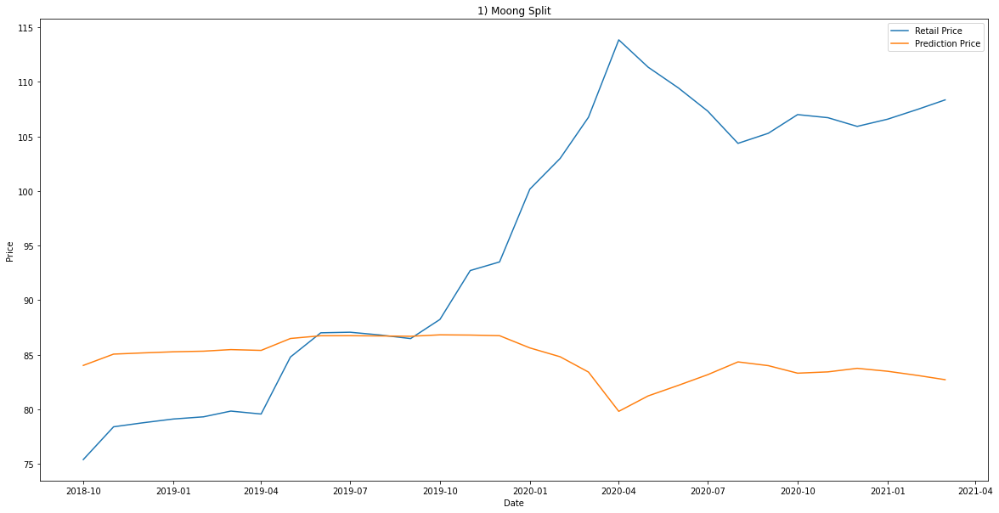

Accuracy :  0.08084480670185745
     Retail Price       Date  Prediction Price
220     23.984375 2018-10-01         19.507756
200     22.515152 2018-11-01         19.041348
57      19.194030 2018-12-01         17.937024
99      17.803030 2019-01-01         17.454028
78      15.661538 2019-02-01         16.687014
160     16.757576 2019-03-01         17.083117
18      18.119403 2019-04-01         17.564938
181     19.492537 2019-05-01         18.039105
140     21.626866 2019-06-01         18.752757
120     24.761194 2019-07-01         19.748838
38      34.303030 2019-08-01         22.395156
241     52.250000 2019-09-01         25.763779
221     49.971429 2019-10-01         25.453860
201     79.686567 2019-11-01         26.806138
58      98.656716 2019-12-01         24.696056
100     53.788732 2020-01-01         25.953612
79      36.943662 2020-02-01         23.023512
161     33.888889 2020-03-01         22.292492
19      26.936170 2020-04-01         20.403433
182     21.089286 2020-05-01

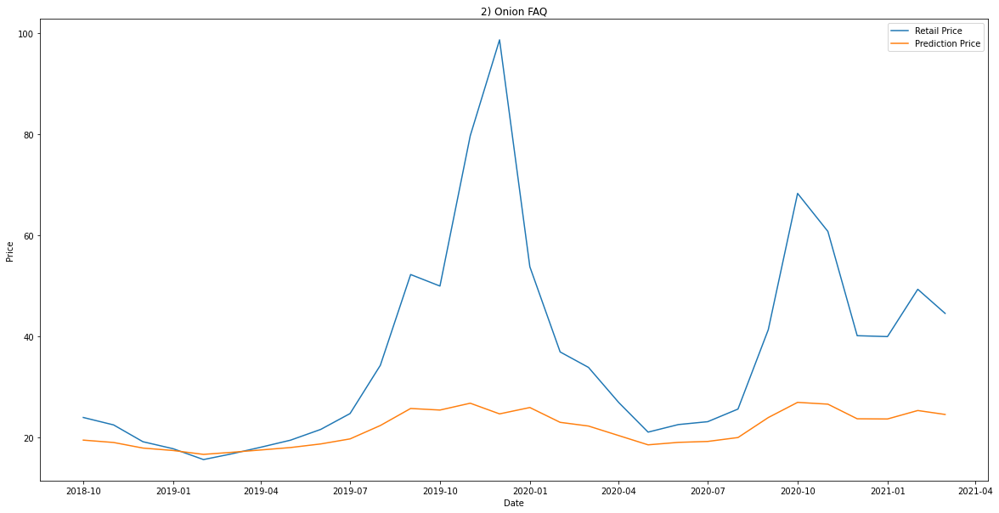

Accuracy :  0.23704308890885173
     Retail Price       Date  Prediction Price
220     24.093750 2018-10-01         20.302966
200     22.424242 2018-11-01         19.390935
57      18.656716 2018-12-01         17.315367
99      17.318182 2019-01-01         16.572399
78      16.107692 2019-02-01         15.898102
160     16.712121 2019-03-01         16.235077
18      17.402985 2019-04-01         16.619553
181     18.552239 2019-05-01         17.257478
140     19.179104 2019-06-01         17.604552
120     20.089552 2019-07-01         18.107501
38      20.257576 2019-08-01         18.200173
241     20.117647 2019-09-01         18.123000
221     22.314286 2019-10-01         19.330696
201     24.149254 2019-11-01         20.333203
58      27.388060 2019-12-01         22.087937
100     26.042254 2020-01-01         21.361136
79      23.239437 2020-02-01         19.836875
161     25.634921 2020-03-01         21.140496
19      27.340426 2020-04-01         22.062270
182     27.250000 2020-05-01

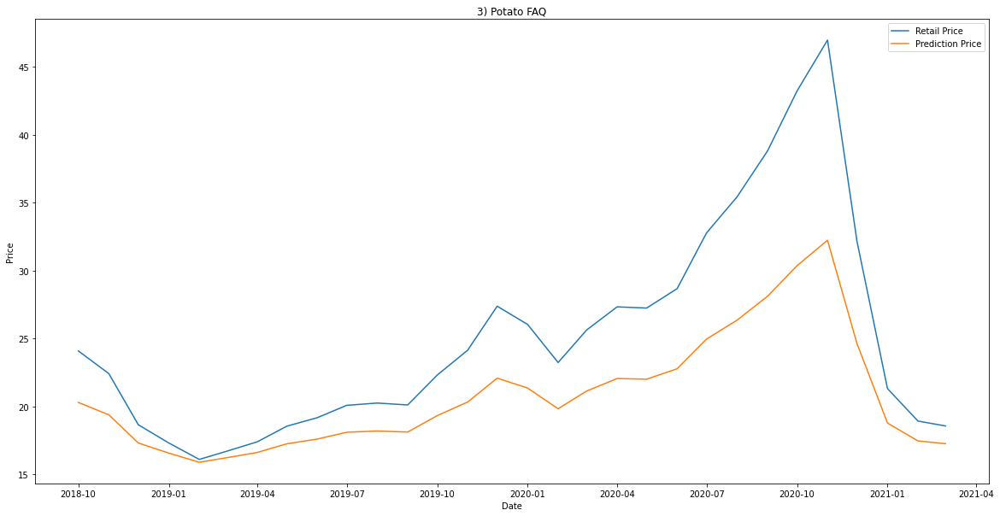

Accuracy :  0.7825487537983272
     Retail Price       Date  Prediction Price
220     36.884615 2018-10-01         39.951845
200     37.428571 2018-11-01         40.465890
57      38.785714 2018-12-01         41.742095
99      39.642857 2019-01-01         42.543428
78      39.444444 2019-02-01         42.358260
160     37.444444 2019-03-01         40.480869
18      38.823448 2019-04-01         41.777449
181     39.019310 2019-05-01         41.960844
140     38.549333 2019-06-01         41.520464
120     38.827586 2019-07-01         41.781326
38      37.500000 2019-08-01         40.533284
241     39.034483 2019-09-01         41.975042
221     38.466667 2019-10-01         41.442890
201     38.620690 2019-11-01         41.587397
58      38.724138 2019-12-01         41.684388
100     36.931034 2020-01-01         39.995768
79      38.413793 2020-02-01         41.393256
161     38.884615 2020-03-01         41.834743
19      39.826087 2020-04-01         42.714253
182     41.800000 2020-05-01 

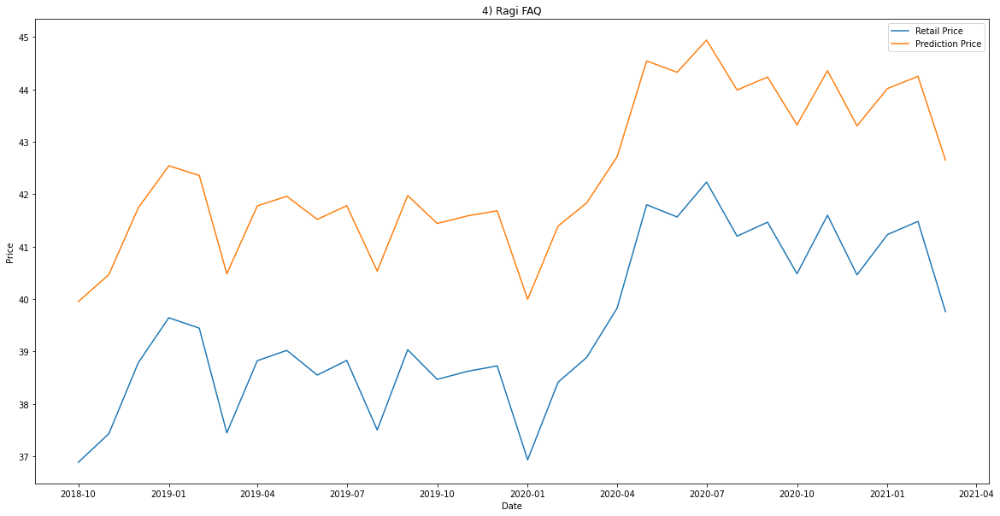

Accuracy :  0.814044093946551
     Retail Price       Date  Prediction Price
220     23.847458 2018-10-01         25.172005
200     23.836066 2018-11-01         25.162331
57      24.000000 2018-12-01         25.301532
99      23.819672 2019-01-01         25.148408
78      23.650000 2019-02-01         25.004279
160     23.786885 2019-03-01         25.120561
18      23.661290 2019-04-01         25.013871
181     23.919355 2019-05-01         25.233060
140     23.806452 2019-06-01         25.137179
120     24.112903 2019-07-01         25.397374
38      24.096774 2019-08-01         25.383684
241     24.500000 2019-09-01         25.725802
221     24.984615 2019-10-01         26.136588
201     25.112903 2019-11-01         26.245260
58      25.666667 2019-12-01         26.714003
100     26.121212 2020-01-01         27.098336
79      26.212121 2020-02-01         27.175156
161     26.364407 2020-03-01         27.303805
19      25.833333 2020-04-01         26.854970
182     26.432692 2020-05-01  

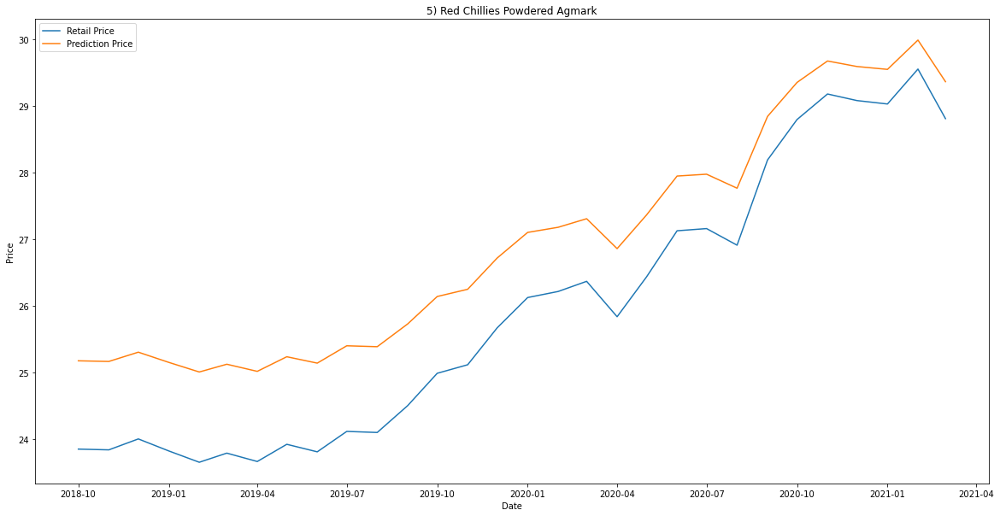

Accuracy :  0.922842380827907
     Retail Price       Date  Prediction Price
220     30.195312 2018-10-01         32.296708
200     30.507576 2018-11-01         32.586552
57      30.552239 2018-12-01         32.627982
99      30.757576 2019-01-01         32.818373
78      30.369231 2019-02-01         32.458179
160     30.780303 2019-03-01         32.839438
18      31.162537 2019-04-01         33.193452
181     31.162537 2019-05-01         33.193452
140     31.498358 2019-06-01         33.504080
120     31.074627 2019-07-01         33.112074
38      31.060606 2019-08-01         33.099093
241     31.176471 2019-09-01         33.206347
221     31.333333 2019-10-01         33.351482
201     31.597015 2019-11-01         33.595265
58      31.820896 2019-12-01         33.802069
100     31.735714 2020-01-01         33.723405
79      31.600000 2020-02-01         33.598023
161     31.992063 2020-03-01         33.960068
19      33.065217 2020-04-01         34.948409
182     32.709091 2020-05-01  

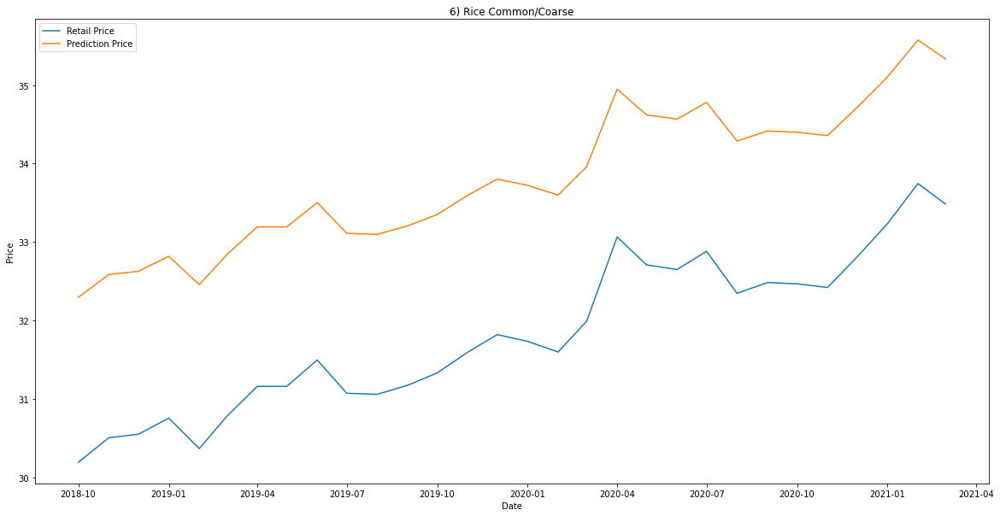

Accuracy :  0.80530278169721
     Retail Price       Date  Prediction Price
220     42.945312 2018-10-01         46.331547
200     42.810606 2018-11-01         46.205189
57      43.223881 2018-12-01         46.592612
99      43.575758 2019-01-01         46.921918
78      43.723077 2019-02-01         47.059635
160     43.416667 2019-03-01         46.773096
18      44.707313 2019-04-01         47.977377
181     45.109552 2019-05-01         48.351263
140     45.669254 2019-06-01         48.870365
120     45.343284 2019-07-01         48.568202
38      45.575758 2019-08-01         48.783744
241     45.880597 2019-09-01         49.066029
221     45.485294 2019-10-01         48.699897
201     44.600000 2019-11-01         47.877512
58      44.584615 2019-12-01         47.863191
100     44.130435 2020-01-01         47.439966
79      44.717391 2020-02-01         47.986753
161     45.459677 2020-03-01         48.676147
19      47.212766 2020-04-01         50.294928
182     46.909091 2020-05-01   

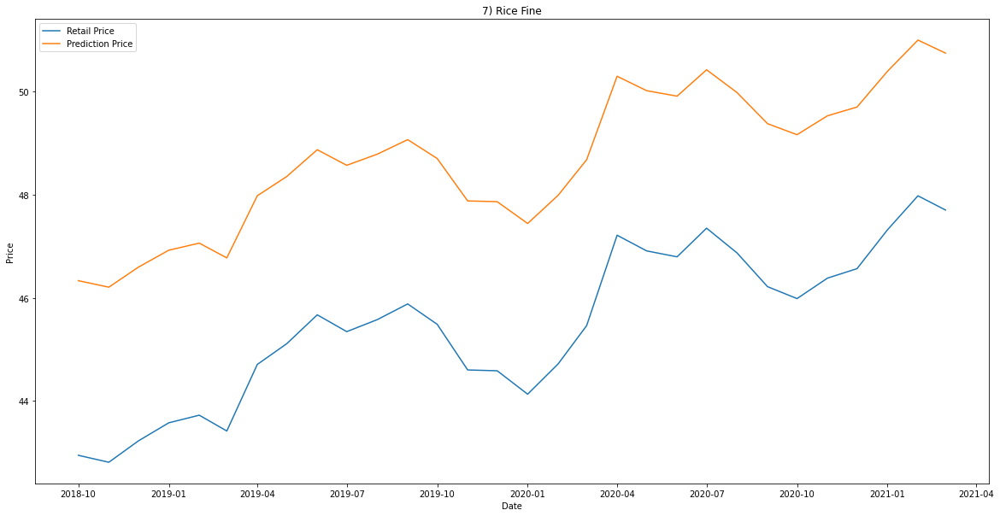

Accuracy :  0.9647924387412092
     Retail Price       Date  Prediction Price
220      9.857143 2018-10-01         10.979325
200     10.052632 2018-11-01         11.181569
57      10.172414 2018-12-01         11.305480
99      10.189655 2019-01-01         11.323315
78      10.052632 2019-02-01         11.181569
160     10.017241 2019-03-01         11.144957
18      10.101695 2019-04-01         11.232324
181     10.220339 2019-05-01         11.355055
140     10.254237 2019-06-01         11.390119
120     10.172414 2019-07-01         11.305480
38      10.105263 2019-08-01         11.236016
241     10.241379 2019-09-01         11.376819
221     10.338983 2019-10-01         11.477777
201     10.508772 2019-11-01         11.653389
58      10.526316 2019-12-01         11.671534
100     10.666667 2020-01-01         11.816684
79      10.800000 2020-02-01         11.954567
161     10.584906 2020-03-01         11.732129
19      10.609756 2020-04-01         11.757829
182     10.958333 2020-05-01 

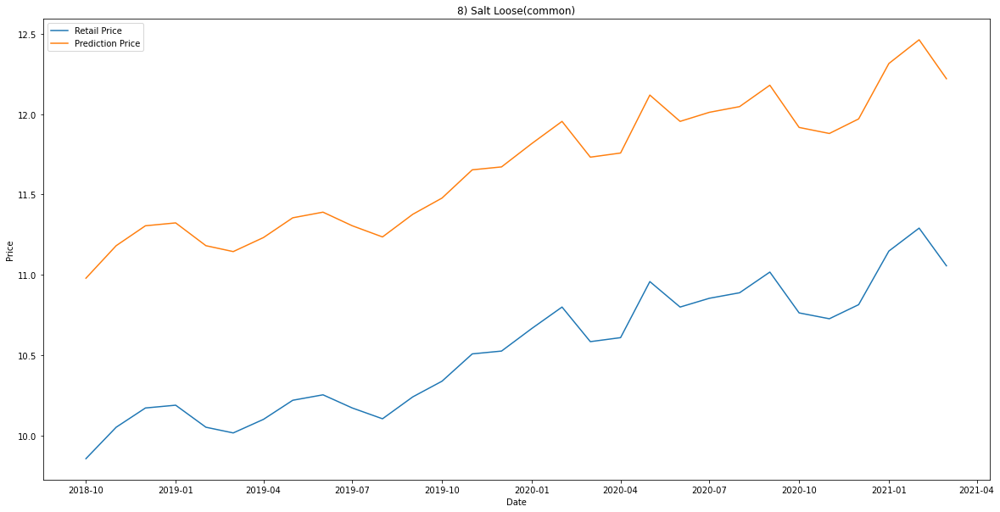

Accuracy :  0.776716274250671
     Retail Price       Date  Prediction Price
220    101.237288 2018-10-01        101.680813
200     95.672131 2018-11-01         98.998261
57      95.622951 2018-12-01         98.972242
99      95.483333 2019-01-01         98.898158
78      94.881356 2019-02-01         98.575006
160     95.016667 2019-03-01         98.648170
18      95.393443 2019-04-01         98.850288
181     95.306452 2019-05-01         98.803833
140     94.606557 2019-06-01         98.425477
120     94.393443 2019-07-01         98.308646
38      95.000000 2019-08-01         98.639175
241     94.813559 2019-09-01         98.538232
221     94.400000 2019-10-01         98.312252
201     95.508772 2019-11-01         98.911681
58      95.350877 2019-12-01         98.827573
100     96.137931 2020-01-01         99.242685
79      96.379310 2020-02-01         99.367919
161     96.351852 2020-03-01         99.353722
19      93.975610 2020-04-01         98.077386
182     96.045455 2020-05-01  

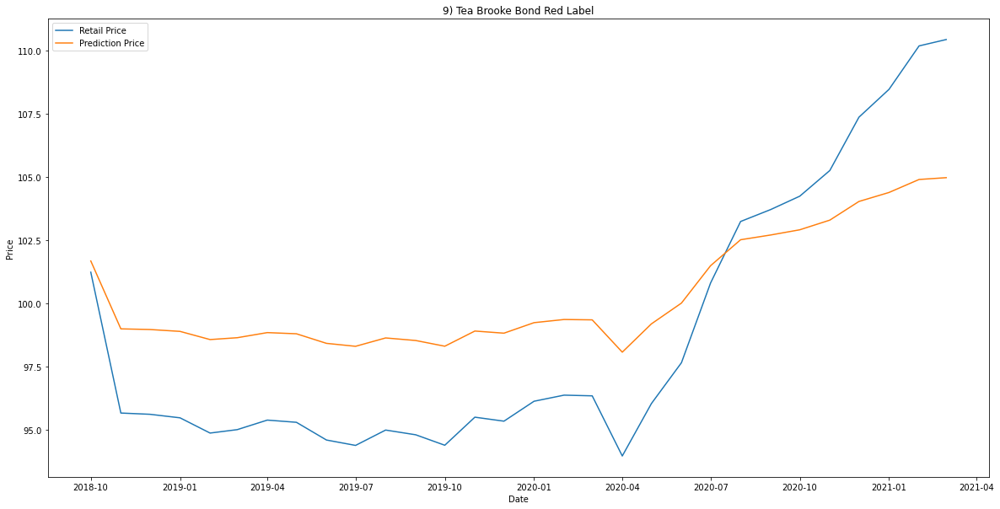

Accuracy :  0.9316202252712539
     Retail Price       Date  Prediction Price
185    227.636364 2018-10-01        233.154569
169    230.192982 2018-11-01        233.573233
48     230.362069 2018-12-01        233.598071
84     232.614035 2019-01-01        233.895181
66     227.785714 2019-02-01        233.181251
136    231.157895 2019-03-01        233.710228
15     230.706897 2019-04-01        233.647630
154    230.810345 2019-05-01        233.662211
119    231.898305 2019-06-01        233.807546
102    230.440678 2019-07-01        233.609498
32     232.086207 2019-08-01        233.831165
202    234.516667 2019-09-01        234.097396
186    235.262295 2019-10-01        234.164466
170    233.137931 2019-11-01        233.955318
49     229.631579 2019-12-01        233.488229
85     233.135593 2020-01-01        233.955058
67     231.610169 2020-02-01        233.770479
137    230.094340 2020-03-01        233.558579
16     230.375000 2020-04-01        233.599956
155    240.106383 2020-05-01 

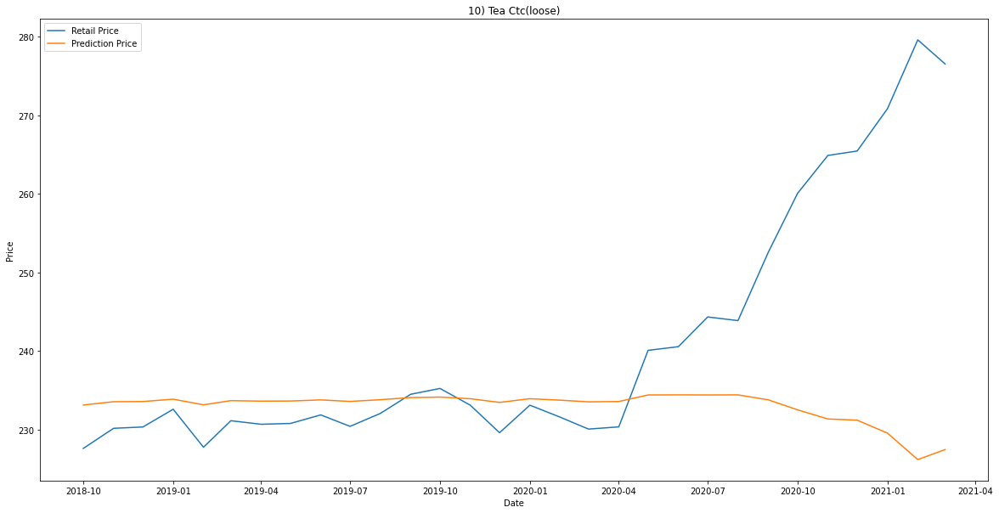

Accuracy :  0.7914817888184351
     Retail Price       Date  Prediction Price
180     62.830645 2018-10-01         66.100998
164     62.617188 2018-11-01         65.941036
47      63.215385 2018-12-01         66.389190
82      63.828125 2019-01-01         66.847825
65      64.412698 2019-02-01         67.284977
131     64.695312 2019-03-01         67.496177
15      66.311077 2019-04-01         68.701809
149     66.846000 2019-05-01         69.100239
115     67.264923 2019-06-01         69.412014
99      66.953846 2019-07-01         69.180523
31      67.796875 2019-08-01         69.807580
197     69.151515 2019-09-01         70.813207
181     68.432836 2019-10-01         70.279998
165     67.718750 2019-11-01         69.749508
48      67.746875 2019-12-01         69.770415
83      66.805970 2020-01-01         69.070436
66      67.880597 2020-02-01         69.869803
132     68.825000 2020-03-01         70.571043
16      73.022727 2020-04-01         73.672720
150     72.653846 2020-05-01 

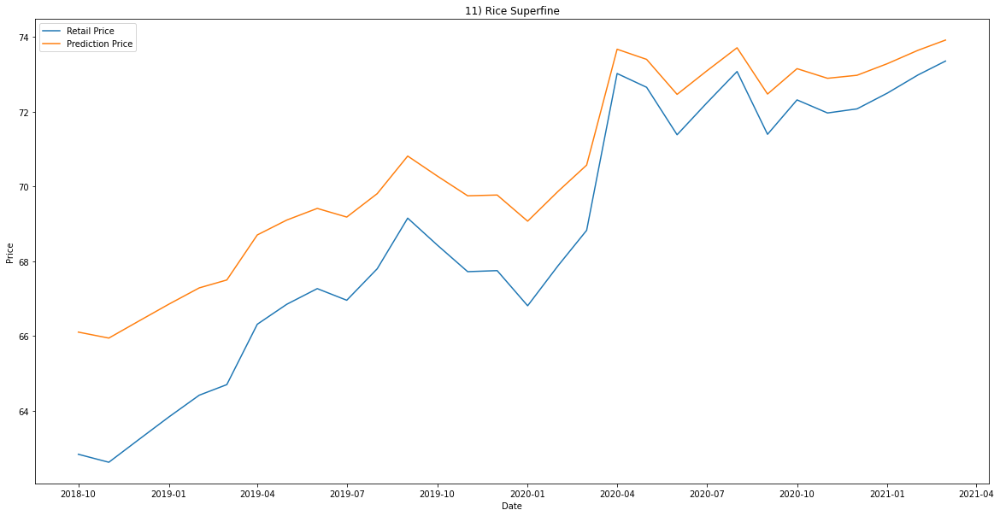

Accuracy :  0.980998769110209
     Retail Price       Date  Prediction Price
181     17.451613 2018-10-01         18.819145
165     17.765625 2018-11-01         19.088470
48      17.800000 2018-12-01         19.117949
84      17.796875 2019-01-01         19.115269
66      17.634921 2019-02-01         18.976372
133     17.890625 2019-03-01         19.195666
14      17.907692 2019-04-01         19.210302
150     17.953846 2019-05-01         19.249879
117     18.092308 2019-06-01         19.368604
101     17.846154 2019-07-01         19.157530
31      18.031250 2019-08-01         19.316251
199     17.969231 2019-09-01         19.263071
182     18.030303 2019-10-01         19.315439
166     18.031746 2019-11-01         19.316677
49      18.015873 2019-12-01         19.303066
85      18.545455 2020-01-01         19.757084
67      18.681818 2020-02-01         19.873964
134     18.728814 2020-03-01         19.914242
15      18.500000 2020-04-01         19.718121
151     18.423077 2020-05-01  

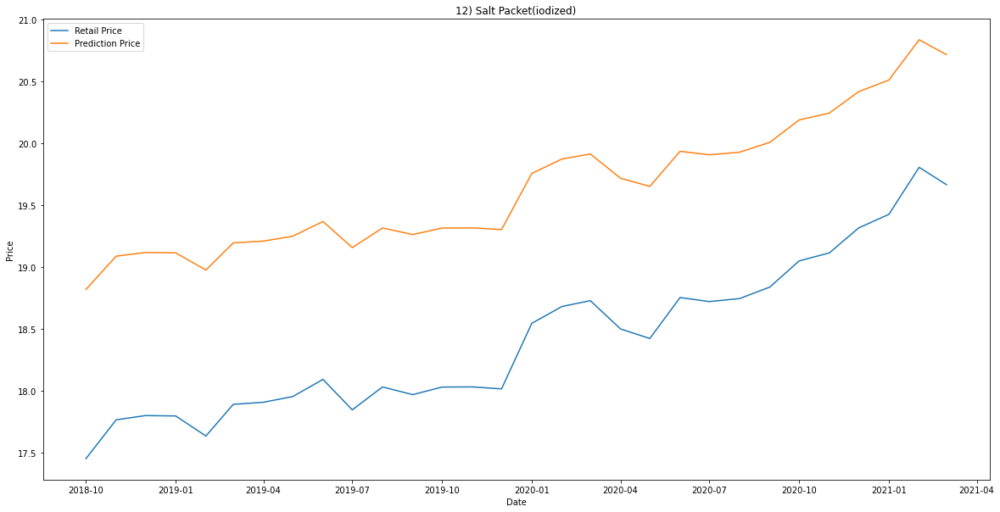

Accuracy :  0.6815952302938969
     Retail Price       Date  Prediction Price
220     68.919355 2018-10-01         79.603818
200     72.953846 2018-11-01         82.211916
57      74.378788 2018-12-01         83.053976
99      75.646154 2019-01-01         83.768145
78      77.125000 2019-02-01         84.560046
160     78.907692 2019-03-01         85.455263
18      79.519091 2019-04-01         85.747328
181     85.176515 2019-05-01         88.087024
140     88.067273 2019-06-01         89.029657
120     89.606061 2019-07-01         89.461726
38      89.107692 2019-08-01         89.327091
241     88.469697 2019-09-01         89.147326
221     89.632353 2019-10-01         89.468688
201     91.523077 2019-11-01         89.932315
58      91.215385 2019-12-01         89.861838
100     92.275362 2020-01-01         90.096491
79      90.681159 2020-02-01         89.734883
161     92.918033 2020-03-01         90.227603
19      96.652174 2020-04-01         90.823009
182     94.796296 2020-05-01 

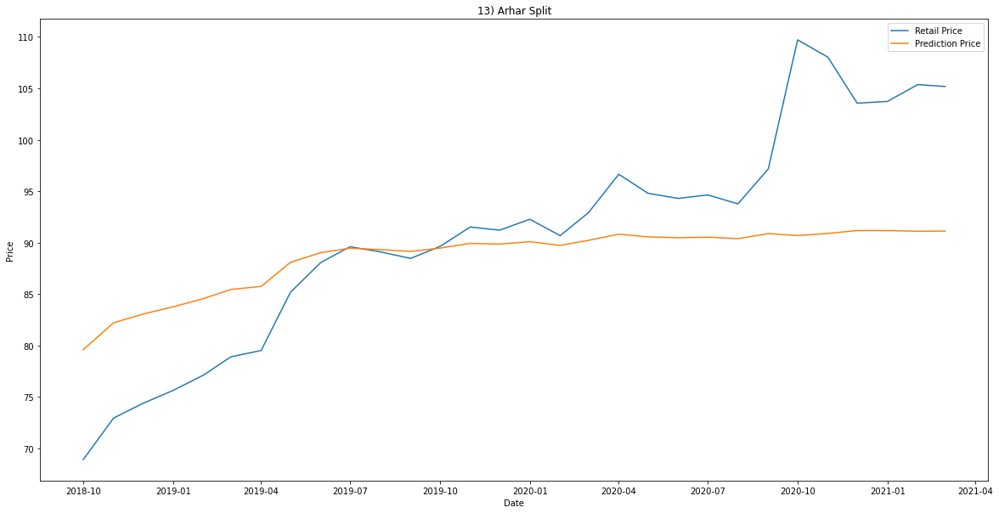

Accuracy :  0.9560175643766443
     Retail Price       Date  Prediction Price
220     29.550000 2018-10-01         31.988539
200     29.677419 2018-11-01         32.108645
57      30.174603 2018-12-01         32.577010
99      30.241935 2019-01-01         32.640404
78      29.901639 2019-02-01         32.319924
160     30.524590 2019-03-01         32.906438
18      30.016129 2019-04-01         32.427770
181     30.000000 2019-05-01         32.412579
140     29.952381 2019-06-01         32.367724
120     30.000000 2019-07-01         32.412579
38      30.377049 2019-08-01         32.767591
241     30.112903 2019-09-01         32.518911
221     30.063492 2019-10-01         32.472378
201     30.683333 2019-11-01         33.055781
58      31.116667 2019-12-01         33.463215
100     31.687500 2020-01-01         33.999388
79      31.578125 2020-02-01         33.896702
161     32.140351 2020-03-01         34.424298
19      32.325581 2020-04-01         34.597985
182     31.960784 2020-05-01 

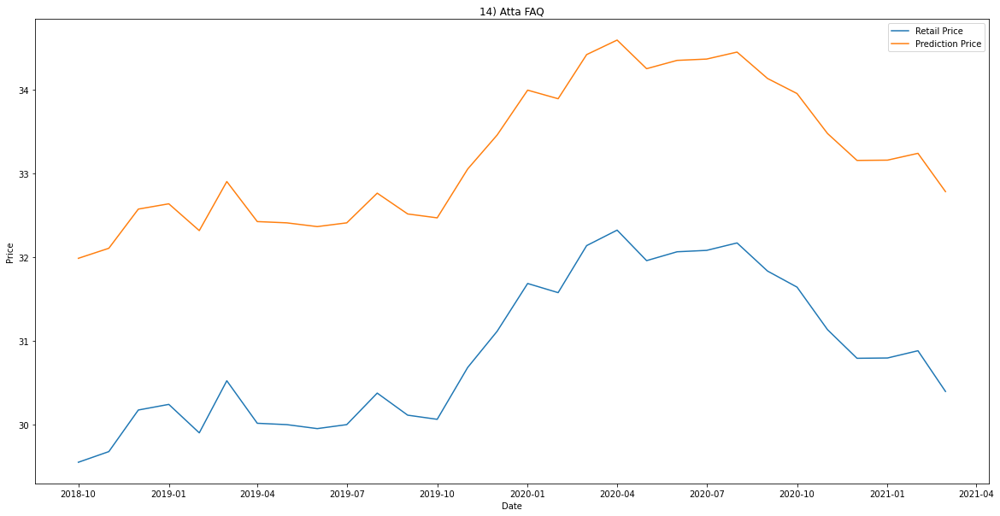

Accuracy :  0.9380015242828857
     Retail Price       Date  Prediction Price
220     22.609756 2018-10-01         25.752008
200     23.928571 2018-11-01         27.124704
57      24.162791 2018-12-01         27.368110
99      24.079545 2019-01-01         27.281613
78      24.593023 2019-02-01         27.814912
160     25.325581 2019-03-01         28.574758
18      26.270465 2019-04-01         29.553084
181     26.651818 2019-05-01         29.947364
140     26.742727 2019-06-01         30.041306
120     27.023256 2019-07-01         30.331073
38      27.325581 2019-08-01         30.643151
241     27.681818 2019-09-01         31.010605
221     27.204545 2019-10-01         30.518236
201     27.651163 2019-11-01         30.978996
58      27.767442 2019-12-01         31.098881
100     28.275000 2020-01-01         31.621802
79      27.659091 2020-02-01         30.987171
161     27.837838 2020-03-01         31.171444
19      28.000000 2020-04-01         31.338554
182     27.300000 2020-05-01 

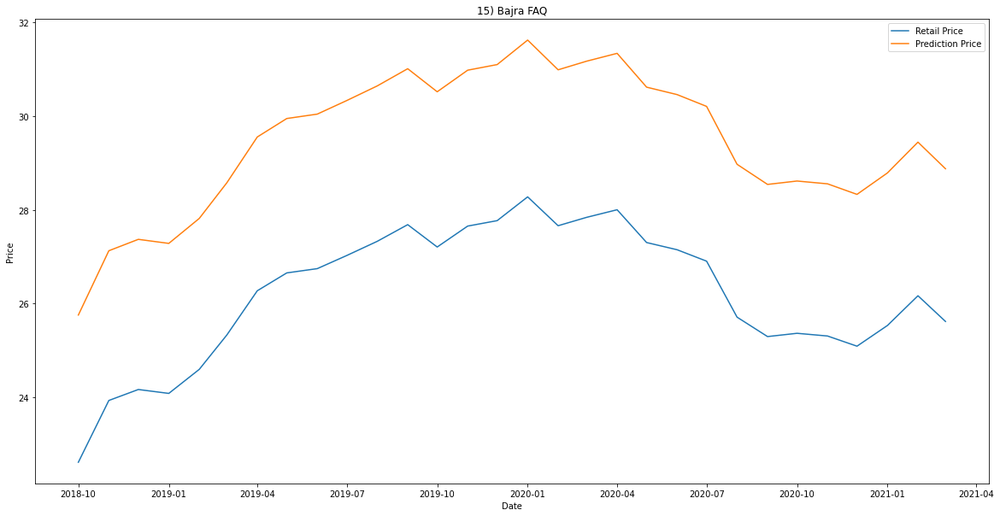

Accuracy :  0.8788214459119832
     Retail Price       Date  Prediction Price
220     42.781250 2018-10-01         45.974830
200     42.696970 2018-11-01         45.901799
57      42.955224 2018-12-01         46.125408
99      41.893939 2019-01-01         45.203215
78      41.861538 2019-02-01         45.174924
160     41.969697 2019-03-01         45.269331
18      42.358209 2019-04-01         45.607705
181     46.208955 2019-05-01         48.898218
140     45.164179 2019-06-01         48.016881
120     45.716418 2019-07-01         48.483799
38      44.818182 2019-08-01         47.723123
241     45.462687 2019-09-01         48.269566
221     45.073529 2019-10-01         47.940009
201     45.030769 2019-11-01         47.903725
58      44.553846 2019-12-01         47.498067
100     43.720588 2020-01-01         46.785065
79      44.117647 2020-02-01         47.125494
161     45.721311 2020-03-01         48.487926
19      41.577778 2020-04-01         44.926816
182     42.716981 2020-05-01 

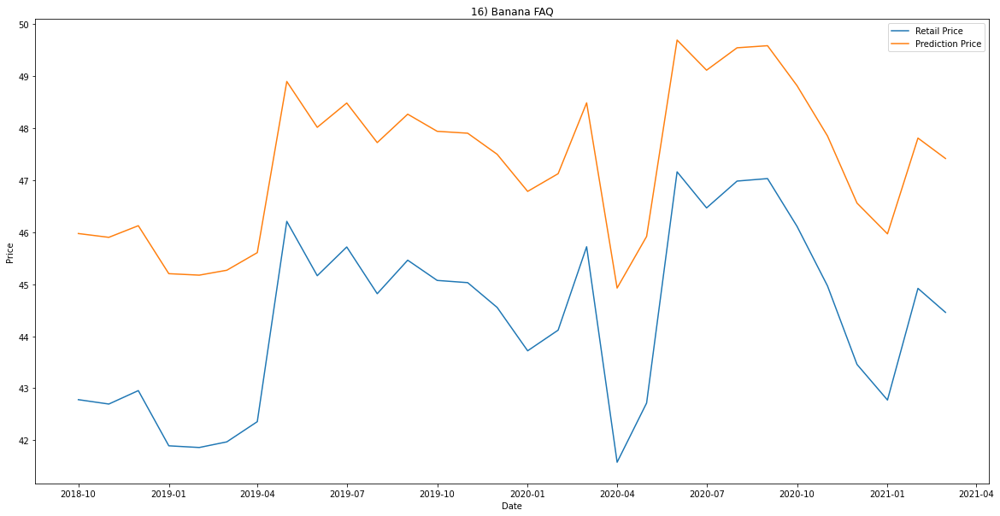

Accuracy :  0.8798766120344895
     Retail Price       Date  Prediction Price
220      7.583333 2018-10-01          7.958867
200      7.721311 2018-11-01          8.095207
57       7.868852 2018-12-01          8.240994
99       8.100000 2019-01-01          8.469390
78       8.100000 2019-02-01          8.469390
160      8.300000 2019-03-01          8.667004
18       8.098361 2019-04-01          8.467770
181      8.064516 2019-05-01          8.434329
140      8.064516 2019-06-01          8.434329
120      8.111111 2019-07-01          8.480369
38       8.049180 2019-08-01          8.419176
241      8.048387 2019-09-01          8.418392
221      8.111111 2019-10-01          8.480369
201      8.283333 2019-11-01          8.650536
58       8.216667 2019-12-01          8.584665
100      8.306452 2020-01-01          8.673379
79       8.290323 2020-02-01          8.657442
161      7.862069 2020-03-01          8.234292
19       7.590909 2020-04-01          7.966353
182      8.291667 2020-05-01 

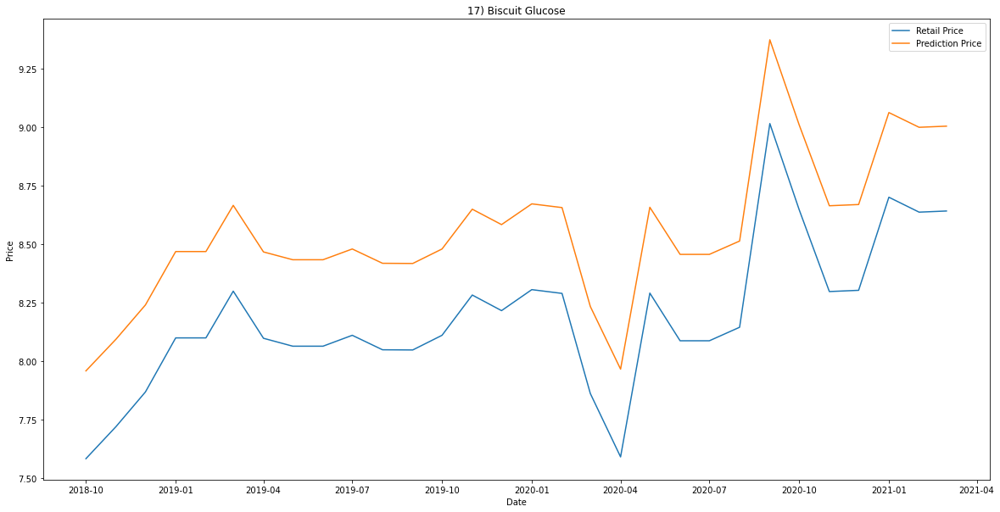

Accuracy :  0.3956659450919707
     Retail Price       Date  Prediction Price
185    104.500000 2018-10-01        116.952251
169    105.651515 2018-11-01        117.303611
48     101.044776 2018-12-01        115.783599
84     104.242424 2019-01-01        116.871047
66     109.353846 2019-02-01        118.303938
136    122.954545 2019-03-01        120.283373
15     130.582090 2019-04-01        120.232086
154    149.253731 2019-05-01        116.658890
119    158.417910 2019-06-01        113.173568
102    169.179104 2019-07-01        107.700085
32     125.651515 2019-08-01        120.360090
202    103.850746 2019-09-01        116.745739
186    104.867647 2019-10-01        117.066503
170    101.076923 2019-11-01        115.795261
49     101.800000 2019-12-01        116.053671
85     108.764706 2020-01-01        118.157971
67     109.044118 2020-02-01        118.227822
137    121.590164 2020-03-01        120.204879
16     132.733333 2020-04-01        120.068135
155    141.226415 2020-05-01 

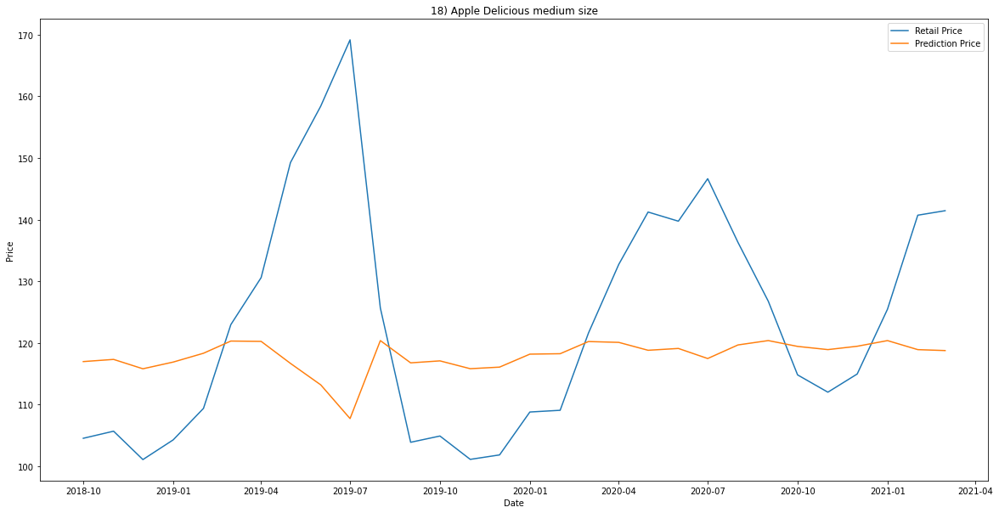

Accuracy :  0.8484886749407794
     Retail Price       Date  Prediction Price
220     48.936508 2018-10-01         50.580116
200     48.484375 2018-11-01         50.275843
57      48.215385 2018-12-01         50.093552
99      47.454545 2019-01-01         49.572821
78      46.276923 2019-02-01         48.751966
160     46.545455 2019-03-01         48.940731
18      46.731343 2019-04-01         49.070854
181     47.587761 2019-05-01         49.664542
140     48.147463 2019-06-01         50.047372
120     48.626866 2019-07-01         50.372024
38      49.651515 2019-08-01         51.055825
241     50.044118 2019-09-01         51.314177
221     50.463768 2019-10-01         51.588086
201     50.083333 2019-11-01         51.339872
58      48.507576 2019-12-01         50.291522
100     49.885714 2020-01-01         51.210184
79      49.685714 2020-02-01         51.078411
161     49.959677 2020-03-01         51.258783
19      49.586957 2020-04-01         51.013149
182     51.400000 2020-05-01 

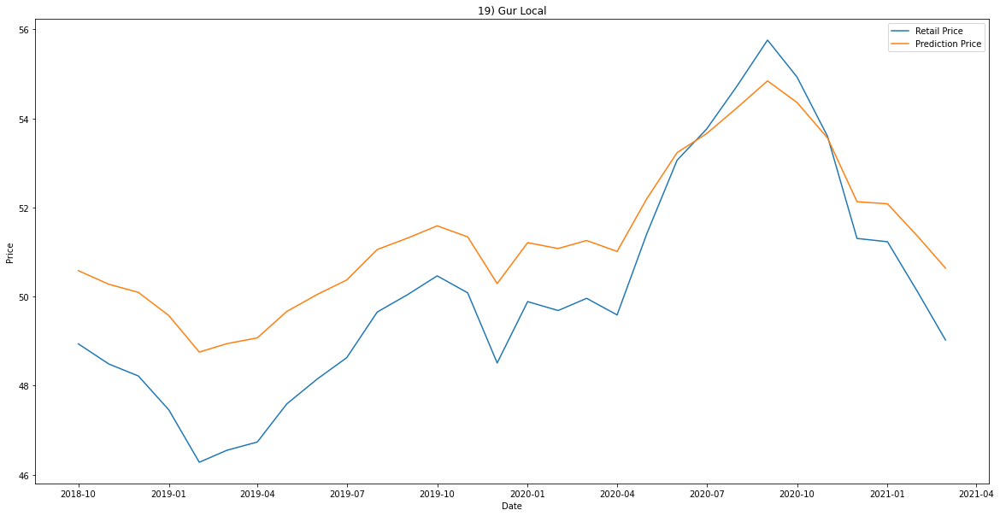

Accuracy :  0.9615626530228045
     Retail Price       Date  Prediction Price
220     26.947368 2018-10-01         31.224248
200     29.225000 2018-11-01         33.675488
57      29.902439 2018-12-01         34.401832
99      29.804878 2019-01-01         34.297307
78      30.175000 2019-02-01         34.693707
160     29.900000 2019-03-01         34.399219
18      30.448780 2019-04-01         34.986677
181     31.131707 2019-05-01         35.716540
140     31.058537 2019-06-01         35.638404
120     31.200000 2019-07-01         35.789452
38      31.675000 2019-08-01         36.296212
241     33.292683 2019-09-01         38.017080
221     33.512195 2019-10-01         38.249991
201     32.450000 2019-11-01         37.121615
58      34.200000 2019-12-01         38.978830
100     34.560976 2020-01-01         39.360761
79      34.195122 2020-02-01         38.973666
161     33.914286 2020-03-01         38.676246
19      33.533333 2020-04-01         38.272412
182     33.179487 2020-05-01 

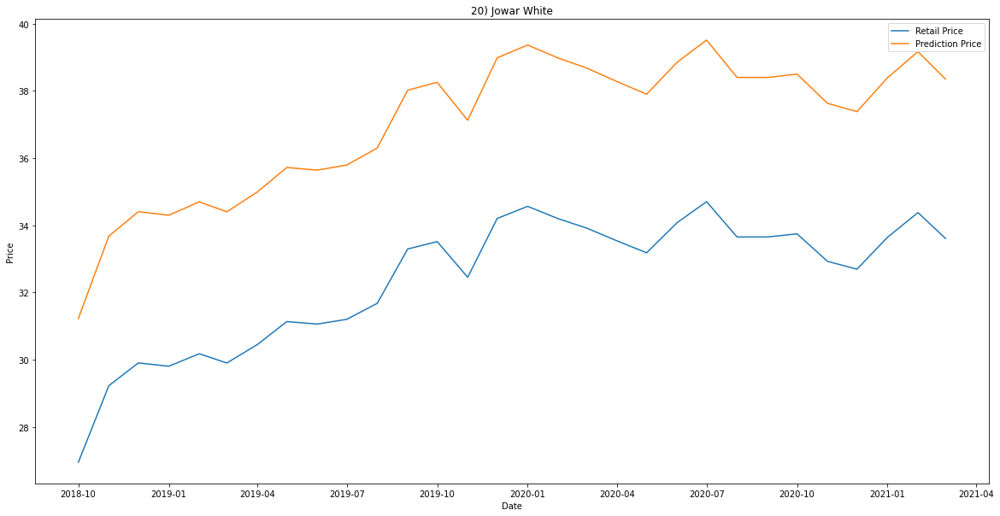

Accuracy :  0.9132244820476249
     Retail Price       Date  Prediction Price
220     23.188679 2018-10-01         24.687556
200     24.054545 2018-11-01         25.450631
57      23.836364 2018-12-01         25.258566
99      24.111111 2019-01-01         25.500401
78      23.905660 2019-02-01         25.319584
160     25.259259 2019-03-01         26.508486
18      25.722222 2019-04-01         26.913807
181     26.314815 2019-05-01         27.431628
140     26.074074 2019-06-01         27.221398
120     25.962963 2019-07-01         27.124306
38      26.207547 2019-08-01         27.337978
241     26.796296 2019-09-01         27.851534
221     26.727273 2019-10-01         27.791383
201     26.226415 2019-11-01         27.354453
58      27.132075 2019-12-01         28.143930
100     27.803571 2020-01-01         28.727573
79      27.571429 2020-02-01         28.525967
161     27.244898 2020-03-01         28.242094
19      27.027027 2020-04-01         28.052493
182     26.511111 2020-05-01 

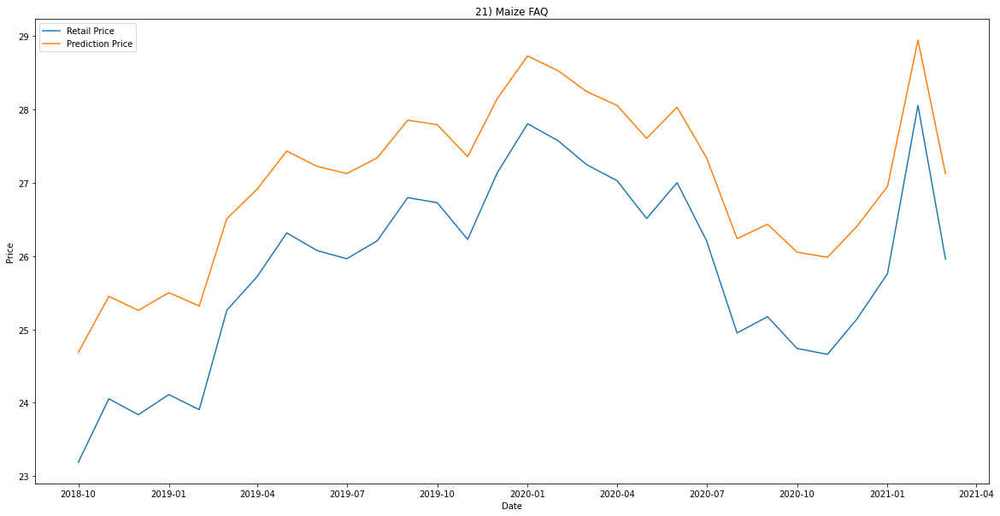

Accuracy :  0.6513116359894362
     Retail Price       Date  Prediction Price
220     61.774194 2018-10-01         65.397051
200     62.812500 2018-11-01         65.839875
57      63.907692 2018-12-01         66.278130
99      64.218750 2019-01-01         66.397204
78      64.920635 2019-02-01         66.657105
160     65.593750 2019-03-01         66.894919
18      65.260000 2019-04-01         66.778404
181     66.555846 2019-05-01         67.215386
140     66.943438 2019-06-01         67.338021
120     67.140625 2019-07-01         67.398986
38      66.555556 2019-08-01         67.215292
241     66.500000 2019-09-01         67.197409
221     66.984848 2019-10-01         67.350904
201     68.317460 2019-11-01         67.742832
58      69.190476 2019-12-01         67.975770
100     72.073529 2020-01-01         68.611029
79      72.544118 2020-02-01         68.695192
161     72.000000 2020-03-01         68.597384
19      75.340426 2020-04-01         69.082304
182     76.964286 2020-05-01 

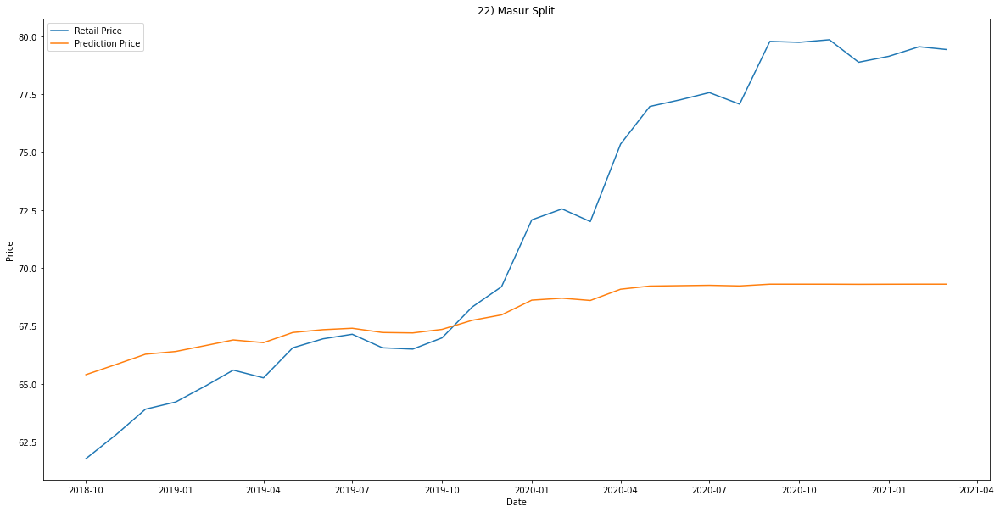

Accuracy :  0.9607348882851138
     Retail Price       Date  Prediction Price
220    469.333333 2018-10-01        540.879264
200    478.951613 2018-11-01        555.998437
57     483.253968 2018-12-01        563.034421
99     488.951613 2019-01-01        572.597902
78     489.918033 2019-02-01        574.246797
160    497.822581 2019-03-01        588.008748
18     494.920635 2019-04-01        582.900856
181    499.920635 2019-05-01        591.739979
140    506.269841 2019-06-01        603.216142
120    506.111111 2019-07-01        602.926014
38     505.317460 2019-08-01        601.477772
241    500.909091 2019-09-01        593.508683
221    505.447761 2019-10-01        601.715267
201    511.384615 2019-11-01        612.647203
58     518.276923 2019-12-01        625.586625
100    531.492537 2020-01-01        650.985420
79     533.880597 2020-02-01        655.637156
161    542.500000 2020-03-01        672.526593
19     602.000000 2020-04-01        785.508667
182    608.977273 2020-05-01 

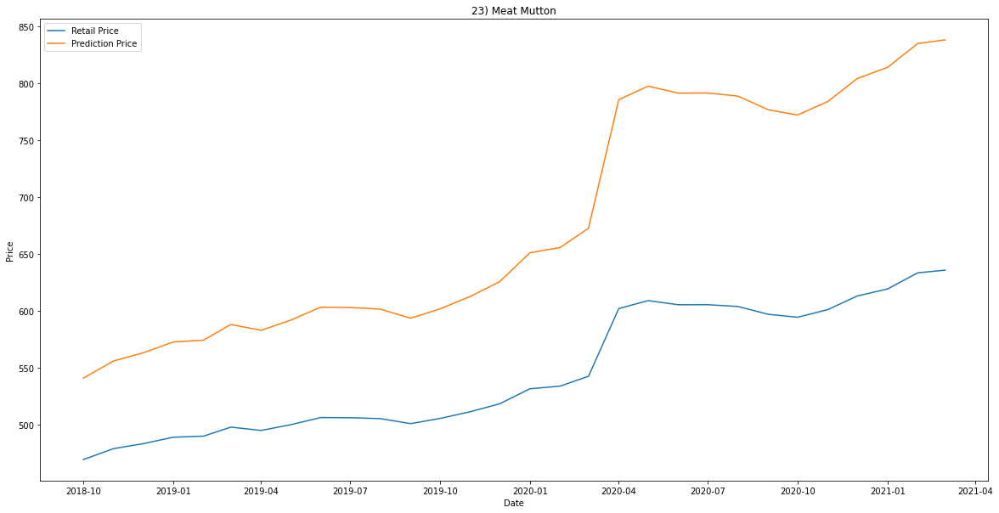

Accuracy :  0.9558137245118319
     Retail Price       Date  Prediction Price
220     47.166667 2018-10-01         52.076307
200     47.370968 2018-11-01         52.255892
57      47.539683 2018-12-01         52.403946
99      47.645161 2019-01-01         52.496393
78      47.459016 2019-02-01         52.333187
160     47.725806 2019-03-01         52.567014
18      47.603175 2019-04-01         52.459604
181     47.666667 2019-05-01         52.515230
140     47.857143 2019-06-01         52.681915
120     47.619048 2019-07-01         52.473514
38      47.887097 2019-08-01         52.708101
241     48.246154 2019-09-01         53.021436
221     48.500000 2019-10-01         53.242335
201     49.171875 2019-11-01         53.824513
58      49.468750 2019-12-01         54.080598
100     50.441176 2020-01-01         54.914437
79      50.779412 2020-02-01         55.202674
161     50.803279 2020-03-01         55.222978
19      49.065217 2020-04-01         53.732337
182     50.666667 2020-05-01 

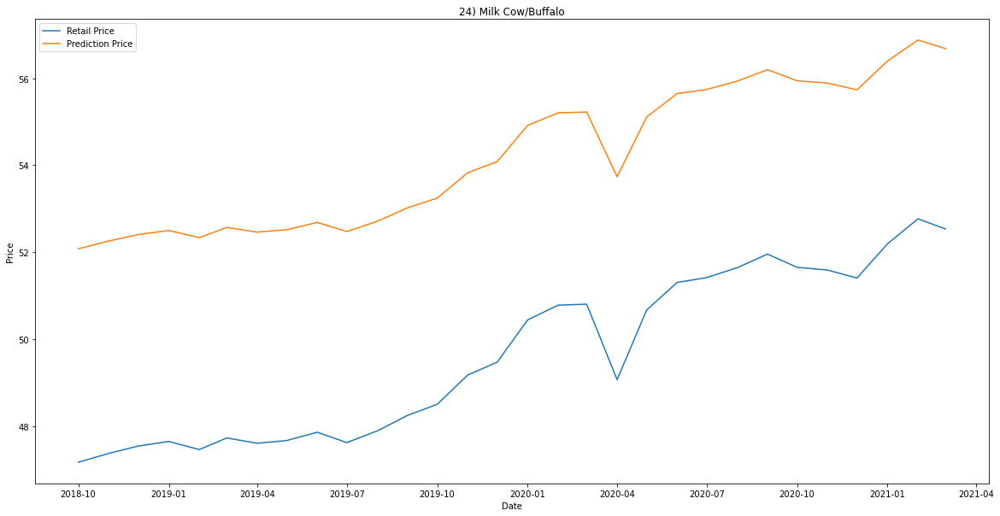

Accuracy :  0.9623475253600148
     Retail Price       Date  Prediction Price
220     44.905172 2018-10-01         49.371533
200     45.441667 2018-11-01         49.831278
57      45.631148 2018-12-01         49.993032
99      45.466667 2019-01-01         49.852638
78      45.101695 2019-02-01         49.540242
160     45.483333 2019-03-01         49.866875
18      45.393443 2019-04-01         49.790058
181     45.524590 2019-05-01         49.902107
140     45.870968 2019-06-01         50.197295
120     45.737705 2019-07-01         50.083855
38      46.147541 2019-08-01         50.432216
241     46.645161 2019-09-01         50.853151
221     46.968254 2019-10-01         51.125251
201     47.075000 2019-11-01         51.214942
58      47.583333 2019-12-01         51.640632
100     48.661290 2020-01-01         52.535540
79      49.048387 2020-02-01         52.854309
161     48.945455 2020-03-01         52.769680
19      46.902439 2020-04-01         51.069901
182     48.224490 2020-05-01 

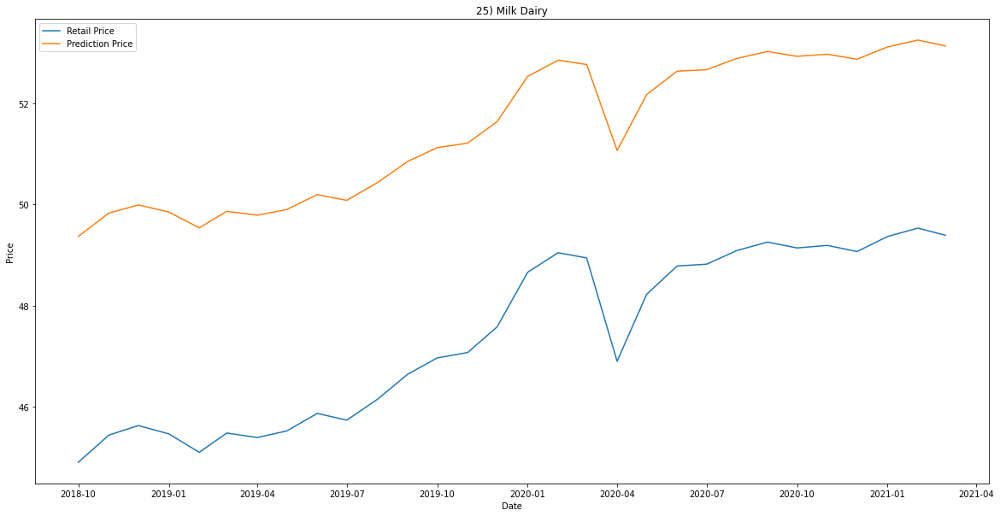

Accuracy :  0.5072628497783553
     Retail Price       Date  Prediction Price
220     21.854545 2018-10-01         22.180057
200     21.879310 2018-11-01         22.200630
57      22.186441 2018-12-01         22.455677
99      22.086207 2019-01-01         22.372460
78      21.956140 2019-02-01         22.264447
160     22.017544 2019-03-01         22.315443
18      22.224138 2019-04-01         22.486969
181     22.525862 2019-05-01         22.737339
140     22.543103 2019-06-01         22.751640
120     22.612069 2019-07-01         22.808842
38      22.301724 2019-08-01         22.551366
241     23.040984 2019-09-01         23.164397
221     23.209677 2019-10-01         23.304145
201     23.559322 2019-11-01         23.593624
58      23.644068 2019-12-01         23.663753
100     23.852459 2020-01-01         23.836142
79      24.032787 2020-02-01         23.985249
161     23.909091 2020-03-01         23.882975
19      23.121951 2020-04-01         23.231478
182     23.895833 2020-05-01 

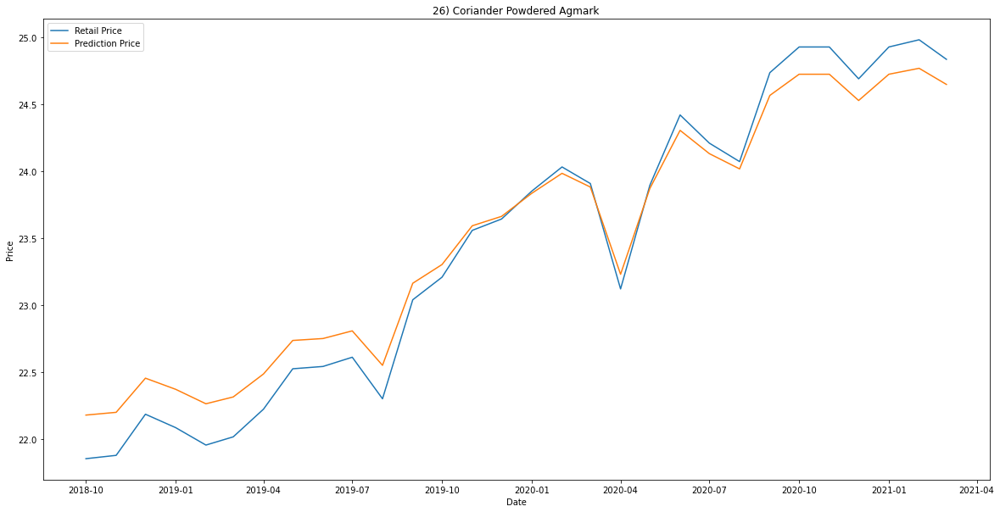

Accuracy :  0.805464621632998
     Retail Price       Date  Prediction Price
220    252.814815 2018-10-01        254.047486
200    251.600000 2018-11-01        253.583738
57     253.142857 2018-12-01        254.170724
99     252.107143 2019-01-01        253.778746
78     250.909091 2019-02-01        253.314823
160    249.517857 2019-03-01        252.761998
18     251.543860 2019-04-01        253.562027
181    247.684211 2019-05-01        252.010334
140    248.912281 2019-06-01        252.516647
120    257.105263 2019-07-01        255.592218
38     256.636364 2019-08-01        255.430486
241    255.454545 2019-09-01        255.015122
221    252.982456 2019-10-01        254.110571
201    252.870370 2019-11-01        254.068416
58     252.314815 2019-12-01        253.858018
100    255.000000 2020-01-01        254.852422
79     251.517857 2020-02-01        253.551962
161    245.000000 2020-03-01        250.863039
19     241.250000 2020-04-01        249.167657
182    252.558140 2020-05-01  

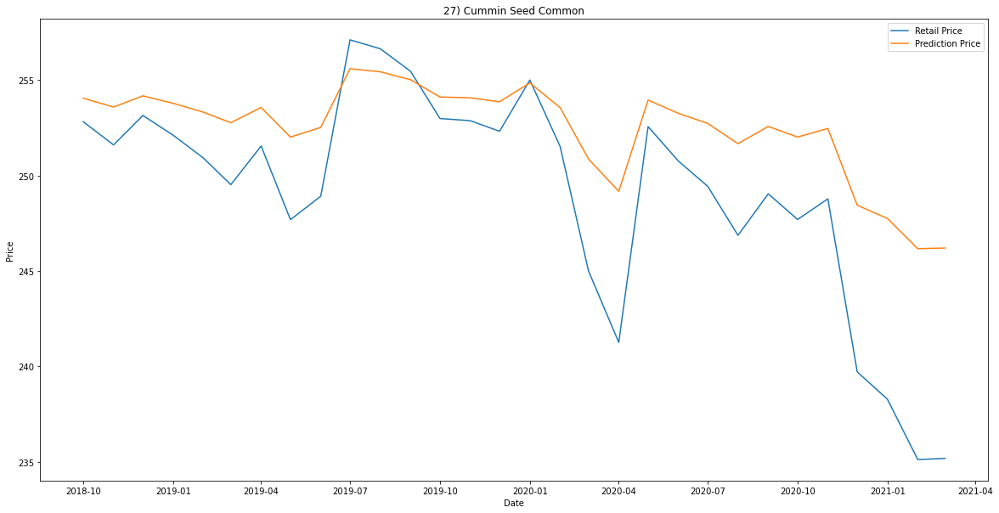

Accuracy :  0.9690535460823858
     Retail Price       Date  Prediction Price
220    180.535714 2018-10-01        190.211893
200    189.322034 2018-11-01        191.738910
57     188.983051 2018-12-01        191.698560
99     191.379310 2019-01-01        191.952052
78     185.491228 2019-02-01        191.196458
160    191.034483 2019-03-01        191.920123
18     191.186441 2019-04-01        191.934382
181    195.288136 2019-05-01        192.207591
140    194.310678 2019-06-01        192.161977
120    186.724138 2019-07-01        191.391775
38     184.636364 2019-08-01        191.049445
241    185.263158 2019-09-01        191.158165
221    187.068966 2019-10-01        191.442875
201    192.946429 2019-11-01        192.077951
58     194.517857 2019-12-01        192.172661
100    196.551724 2020-01-01        192.248563
79     194.152542 2020-02-01        192.153454
161    186.727273 2020-03-01        191.392246
19     189.848485 2020-04-01        191.798638
182    192.560976 2020-05-01 

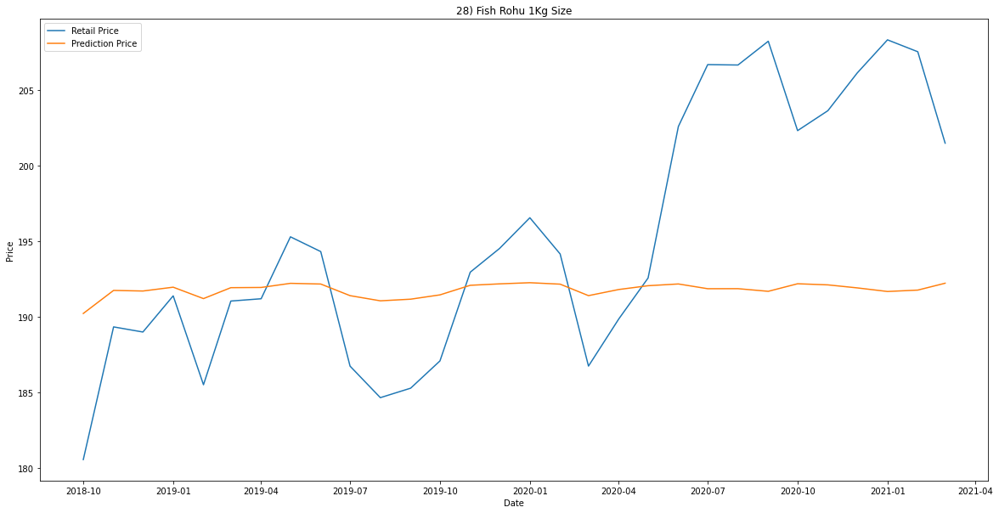

Accuracy :  0.9432471960465492
     Retail Price       Date  Prediction Price
220    488.793103 2018-10-01        525.472042
200    494.633333 2018-11-01        528.893067
57     490.459016 2018-12-01        526.458651
99     490.383333 2019-01-01        526.414012
78     485.847458 2019-02-01        523.707373
160    495.633333 2019-03-01        529.467978
18     492.344262 2019-04-01        527.564903
181    492.737705 2019-05-01        527.794374
140    499.336066 2019-06-01        531.567691
120    500.000000 2019-07-01        531.939238
38     501.065574 2019-08-01        532.532322
241    502.890625 2019-09-01        533.538743
221    506.615385 2019-10-01        535.554948
201    516.015873 2019-11-01        540.403240
58     516.746032 2019-12-01        540.764610
100    518.400000 2020-01-01        541.574715
79     519.215385 2020-02-01        541.969708
161    531.965517 2020-03-01        547.749288
19     535.977778 2020-04-01        549.404482
182    526.333333 2020-05-01 

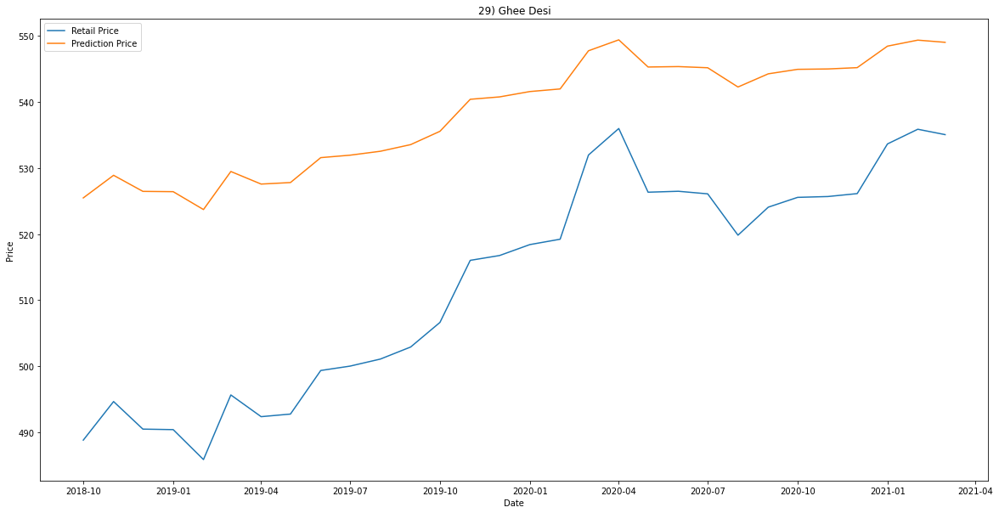

Accuracy :  0.5717991087703007
     Retail Price       Date  Prediction Price
220     65.885246 2018-10-01         64.294245
200     69.952381 2018-11-01         66.277857
57      70.781250 2018-12-01         66.657821
99      70.650794 2019-01-01         66.598565
78      69.190476 2019-02-01         65.921324
160     69.126984 2019-03-01         65.891299
18      69.298438 2019-04-01         65.972267
181     70.616719 2019-05-01         66.583053
140     70.866719 2019-06-01         66.696532
120     69.750000 2019-07-01         66.183832
38      69.873016 2019-08-01         66.241043
241     69.984375 2019-09-01         66.292677
221     70.757576 2019-10-01         66.647083
201     70.793651 2019-11-01         66.663443
58      70.468254 2019-12-01         66.515308
100     70.595455 2020-01-01         66.573367
79      69.089552 2020-02-01         65.873575
161     70.666667 2020-03-01         66.605785
19      72.297872 2020-04-01         67.331699
182     71.642857 2020-05-01 

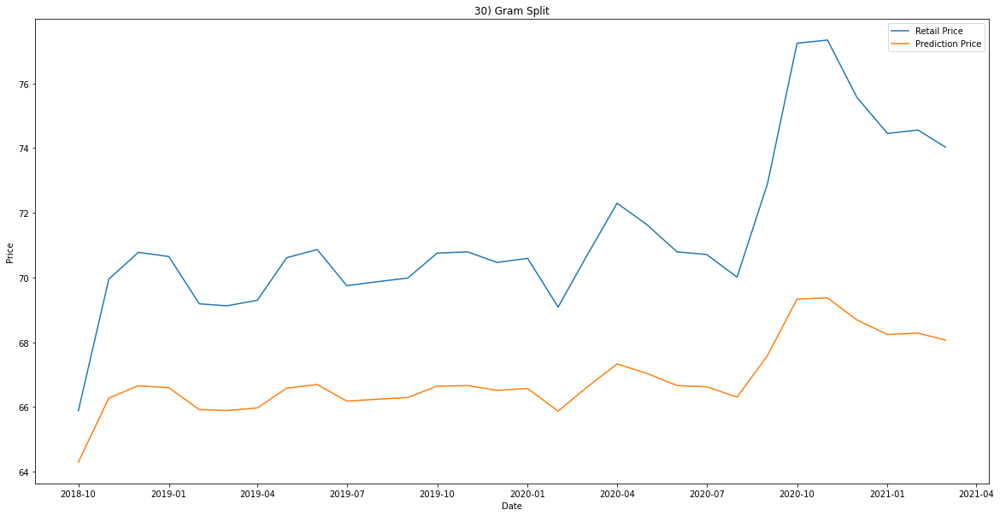

Accuracy :  0.6064861261754857
     Retail Price       Date  Prediction Price
220     61.311475 2018-10-01         60.301028
200     64.333333 2018-11-01         61.677618
57      64.796875 2018-12-01         61.876901
99      64.617188 2019-01-01         61.800027
78      63.439683 2019-02-01         61.284497
160     63.515625 2019-03-01         61.318361
18      63.457231 2019-04-01         61.292329
181     64.294062 2019-05-01         61.660589
140     64.247187 2019-06-01         61.640234
120     62.796875 2019-07-01         60.994460
38      62.587302 2019-08-01         60.898587
241     63.353846 2019-09-01         61.246119
221     63.795455 2019-10-01         61.442410
201     64.225806 2019-11-01         61.630938
58      64.682540 2019-12-01         61.828041
100     64.061538 2020-01-01         61.559298
79      63.454545 2020-02-01         61.291131
161     64.169492 2020-03-01         61.606423
19      66.190476 2020-04-01         62.456957
182     65.568627 2020-05-01 

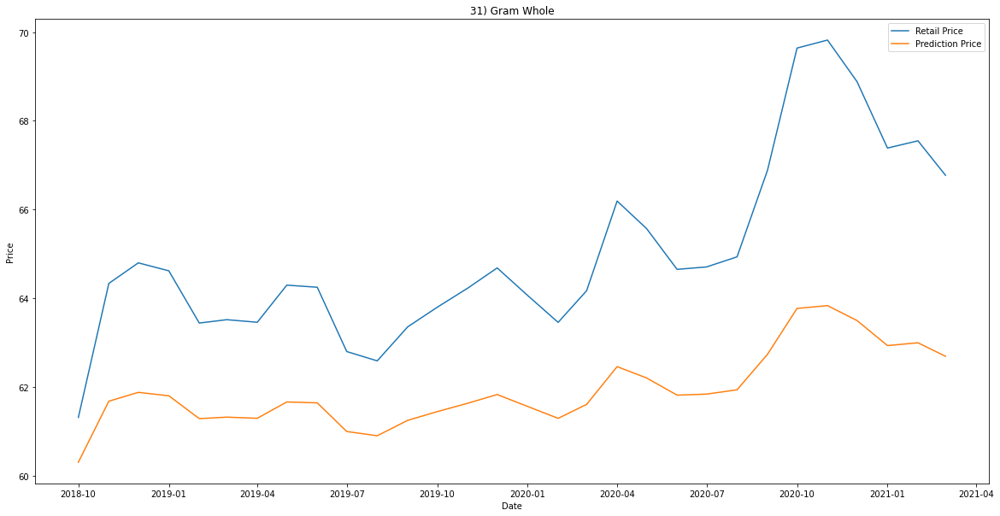

Accuracy :  0.8282571076610853
     Retail Price       Date  Prediction Price
186    259.782609 2018-10-01        296.507632
170    255.200000 2018-11-01        294.676556
49     258.600000 2018-12-01        296.051333
85     261.875000 2019-01-01        297.287451
67     269.130435 2019-02-01        299.721984
137    260.625000 2019-03-01        296.825805
15     280.625000 2019-04-01        302.742626
155    287.291667 2019-05-01        304.040625
120    288.333333 2019-06-01        304.214224
103    291.250000 2019-07-01        304.659063
32     284.565217 2019-08-01        303.549118
204    289.000000 2019-09-01        304.321243
187    293.461538 2019-10-01        304.956303
171    286.851852 2019-11-01        303.964982
50     306.600000 2019-12-01        306.035070
86     303.846154 2020-01-01        305.903833
68     312.962963 2020-02-01        306.154244
138    313.653846 2020-03-01        306.152088
16     330.714286 2020-04-01        305.219062
156    349.411765 2020-05-01 

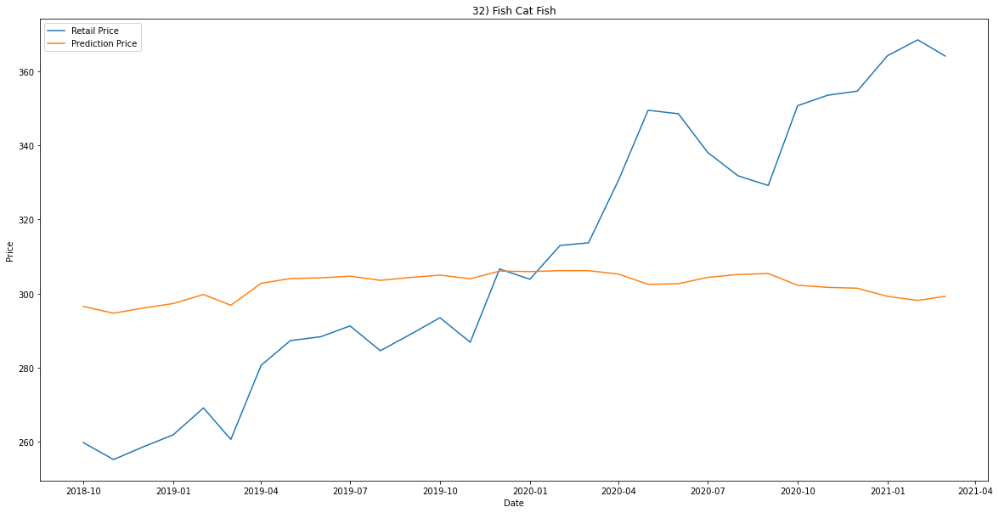

Accuracy :  0.9188341952652562
     Retail Price       Date  Prediction Price
186    385.657895 2018-10-01        411.020600
170    375.365854 2018-11-01        408.897199
49     396.219512 2018-12-01        412.846024
85     402.500000 2019-01-01        413.775713
67     406.923077 2019-02-01        414.365214
137    385.250000 2019-03-01        410.943143
15     402.750000 2019-04-01        413.810442
155    402.307692 2019-05-01        413.748883
120    403.000000 2019-06-01        413.844999
103    409.230769 2019-07-01        414.652211
32     409.305556 2019-08-01        414.661281
204    418.108108 2019-09-01        415.630656
187    406.973684 2019-10-01        414.371657
171    436.081081 2019-11-01        417.047659
50     455.142857 2019-12-01        417.808528
86     444.027778 2020-01-01        417.453042
68     458.750000 2020-02-01        417.872601
138    461.060606 2020-03-01        417.900689
16     563.529412 2020-04-01        408.801243
156    577.826087 2020-05-01 

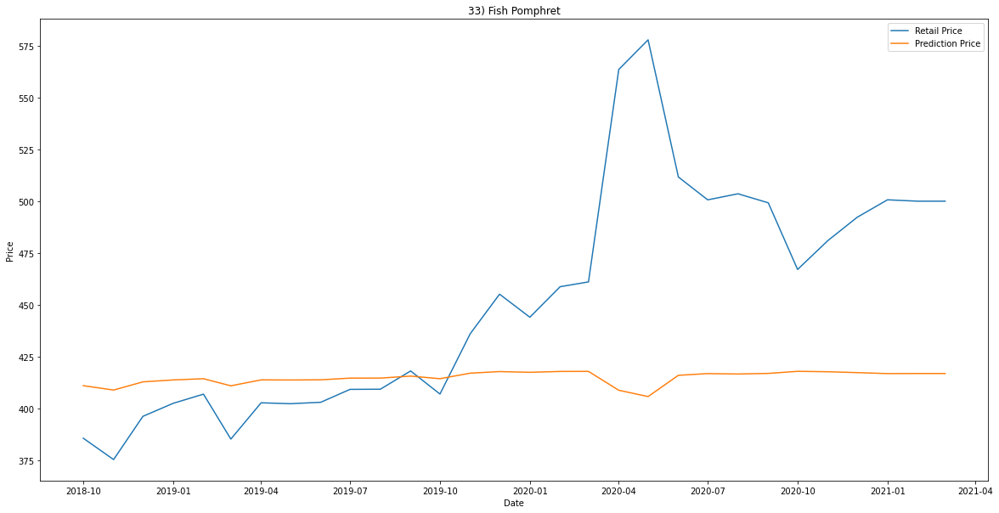

Accuracy :  0.9629213061421936
     Retail Price       Date  Prediction Price
220    688.305085 2018-10-01        749.942005
200    698.416667 2018-11-01        746.571579
57     690.163934 2018-12-01        749.317630
99     688.666667 2019-01-01        749.820365
78     684.916667 2019-02-01        751.086495
160    672.868852 2019-03-01        755.231722
18     667.500000 2019-04-01        757.122098
181    681.935484 2019-05-01        752.100697
140    676.854839 2019-06-01        753.846164
120    702.580645 2019-07-01        745.199481
38     692.177419 2019-08-01        748.643910
241    690.769231 2019-09-01        749.114818
221    694.015152 2019-10-01        748.031218
201    675.476190 2019-11-01        754.323727
58     675.761905 2019-12-01        754.224613
100    679.076923 2020-01-01        753.080020
79     674.307692 2020-02-01        754.729863
161    663.559322 2020-03-01        758.528169
19     638.295455 2020-04-01        767.941372
182    644.607843 2020-05-01 

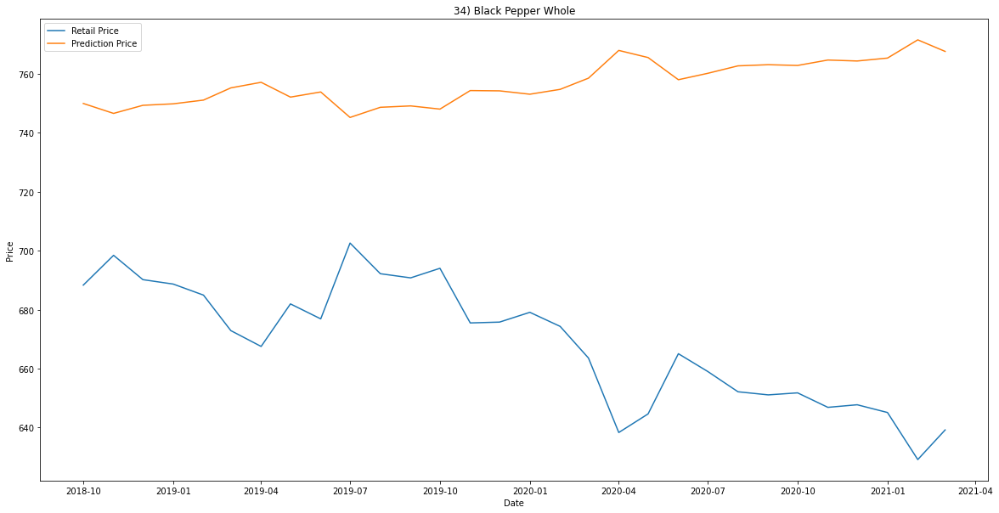

Accuracy :  0.9707662830115332
     Retail Price       Date  Prediction Price
220     27.559322 2018-10-01         31.829883
200     27.540984 2018-11-01         31.809887
57      27.629032 2018-12-01         31.905883
99      27.622951 2019-01-01         31.899253
78      27.533333 2019-02-01         31.801545
160     27.639344 2019-03-01         31.917124
18      27.774194 2019-04-01         32.064086
181     27.741935 2019-05-01         32.028936
140     27.741935 2019-06-01         32.028936
120     27.854839 2019-07-01         32.151946
38      27.838710 2019-08-01         32.134376
241     27.876923 2019-09-01         32.176001
221     27.939394 2019-10-01         32.244040
201     28.269841 2019-11-01         32.603708
58      28.396825 2019-12-01         32.741818
100     28.892308 2020-01-01         33.280163
79      29.138462 2020-02-01         33.547285
161     28.965517 2020-03-01         33.359632
19      28.772727 2020-04-01         33.150319
182     29.941176 2020-05-01 

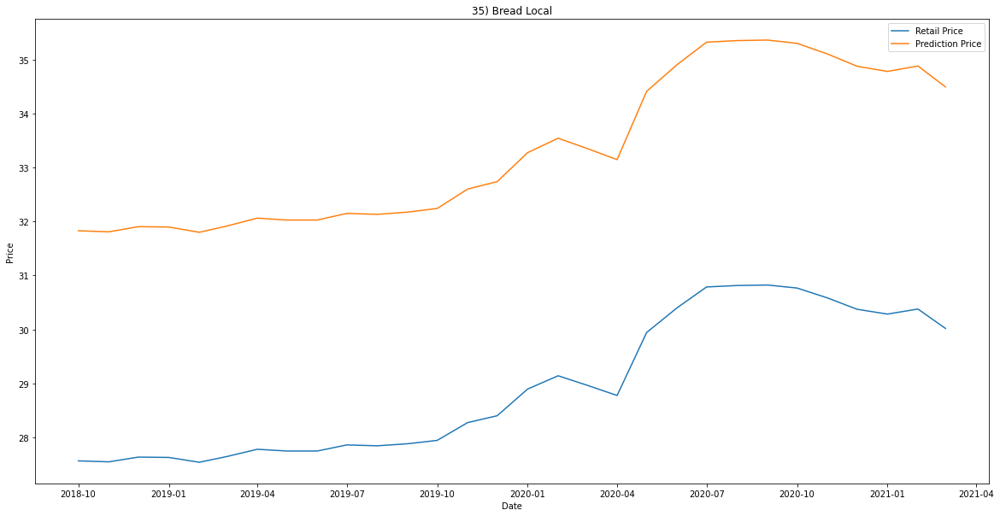

Accuracy :  0.6922585705222074
     Retail Price       Date  Prediction Price
220     30.984375 2018-10-01         32.328310
200     31.060606 2018-11-01         32.394617
57      30.686567 2018-12-01         32.069064
99      28.833333 2019-01-01         30.448535
78      26.969231 2019-02-01         28.806113
160     30.090909 2019-03-01         31.549561
18      29.537313 2019-04-01         31.065583
181     33.253731 2019-05-01         34.292979
140     33.761194 2019-06-01         34.729652
120     33.253731 2019-07-01         34.292979
38      33.092308 2019-08-01         34.153868
241     35.954545 2019-09-01         36.605620
221     37.617647 2019-10-01         38.015478
201     37.692308 2019-11-01         38.078511
58      36.123077 2019-12-01         36.748989
100     33.911765 2020-01-01         34.859029
79      29.367647 2020-02-01         30.917031
161     29.491803 2020-03-01         31.025747
19      29.195652 2020-04-01         30.766335
182     29.777778 2020-05-01 

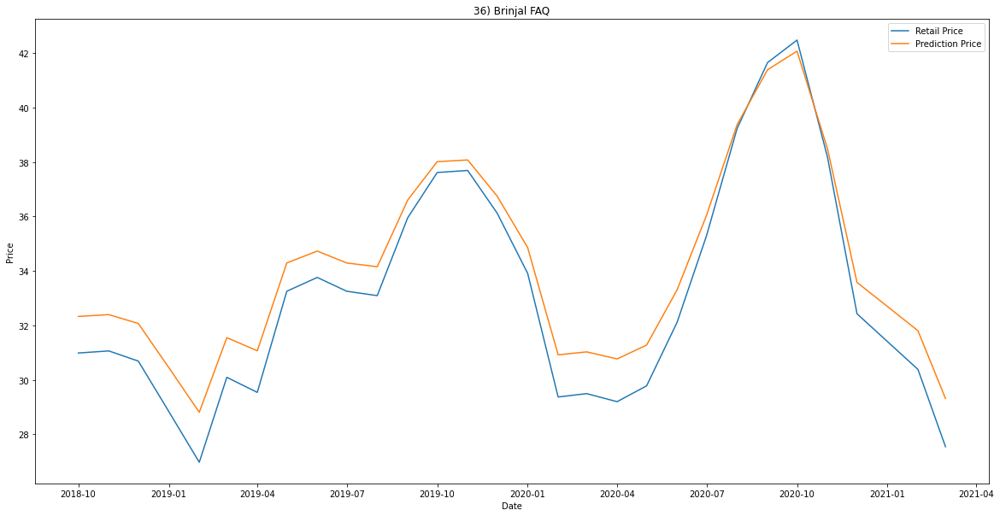

Accuracy :  0.7565778209999939
     Retail Price       Date  Prediction Price
220     44.881818 2018-10-01         48.093905
200     45.114035 2018-11-01         48.311162
57      45.043103 2018-12-01         48.244814
99      44.991228 2019-01-01         48.196283
78      44.956140 2019-02-01         48.163453
160     48.008621 2019-03-01         51.008067
18      47.805085 2019-04-01         50.819125
181     47.872881 2019-05-01         50.882072
140     47.891667 2019-06-01         50.899512
120     45.110169 2019-07-01         48.307547
38      45.228814 2019-08-01         48.418499
241     45.266129 2019-09-01         48.453388
221     45.500000 2019-10-01         48.671974
201     46.108333 2019-11-01         49.239919
58      46.308333 2019-12-01         49.426441
100     46.604839 2020-01-01         49.702780
79      46.620968 2020-02-01         49.717806
161     47.258929 2020-03-01         50.311602
19      47.546512 2020-04-01         50.578937
182     46.830000 2020-05-01 

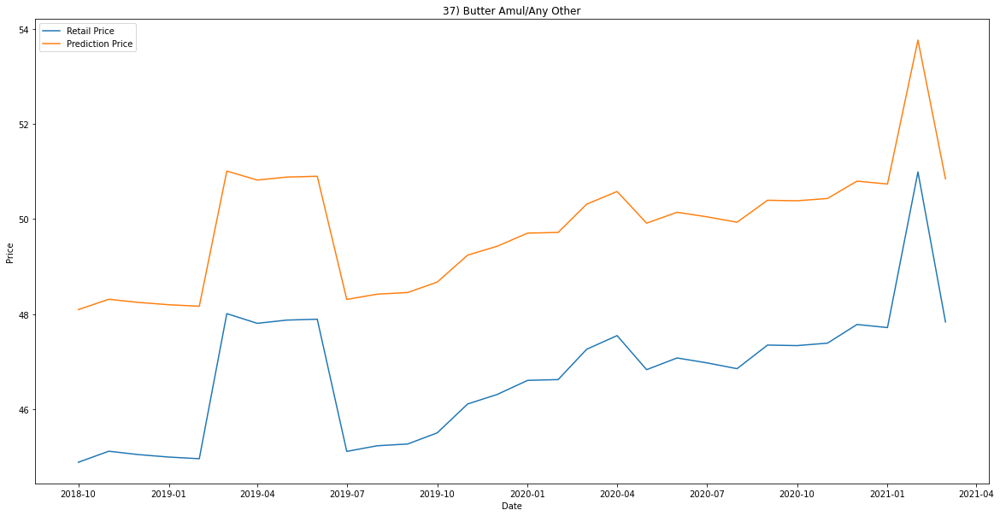

Accuracy :  0.39366613864978683
     Retail Price       Date  Prediction Price
220    168.950000 2018-10-01        173.187506
200    165.629032 2018-11-01        172.284181
57     167.793651 2018-12-01        172.889570
99     168.080645 2019-01-01        172.965165
78     167.622951 2019-02-01        172.844090
160    170.645161 2019-03-01        173.592400
18     174.603175 2019-04-01        174.391501
181    179.349206 2019-05-01        175.083366
140    184.682540 2019-06-01        175.521367
120    174.698413 2019-07-01        174.408225
38     167.920635 2019-08-01        172.923152
241    171.333333 2019-09-01        173.746004
221    173.895522 2019-10-01        174.263572
201    177.569231 2019-11-01        174.857592
58     177.723077 2019-12-01        174.878695
100    180.925373 2020-01-01        175.249836
79     167.059701 2020-02-01        172.691281
161    132.516667 2020-03-01        155.036113
19     139.055556 2020-04-01        159.650429
182    189.931818 2020-05-01

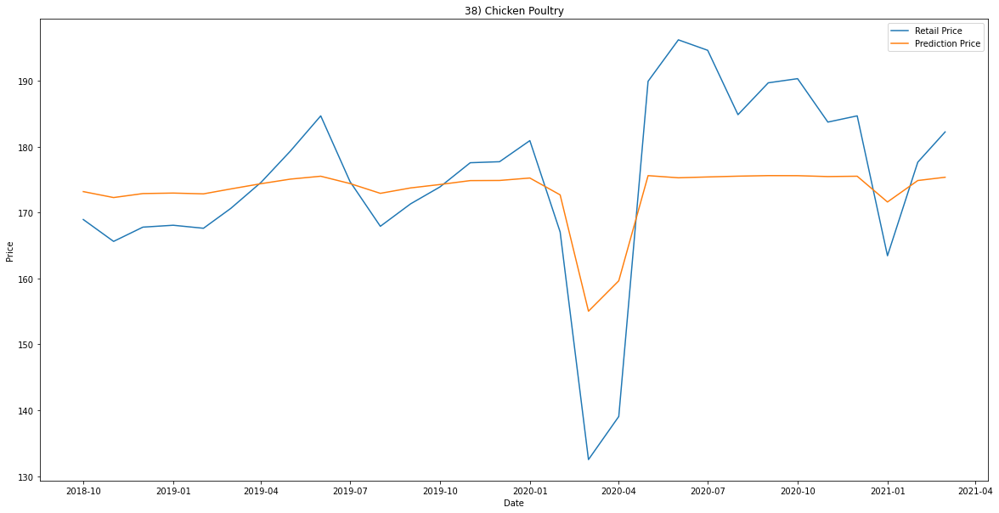

Accuracy :  0.8337804268640377
     Retail Price       Date  Prediction Price
220    167.352941 2018-10-01        192.835493
200    166.019608 2018-11-01        191.434529
57     162.660377 2018-12-01        187.874627
99     164.807692 2019-01-01        190.155130
78     167.230769 2019-02-01        192.707417
160    164.596154 2019-03-01        189.931236
18     163.351852 2019-04-01        188.610856
181    164.277778 2019-05-01        189.593946
140    163.185185 2019-06-01        188.433563
120    170.870370 2019-07-01        196.496769
38     170.980769 2019-08-01        196.610846
241    169.796296 2019-09-01        195.384213
221    174.654545 2019-10-01        200.376720
201    167.773585 2019-11-01        193.276008
58     170.547170 2019-12-01        196.162502
100    172.107143 2020-01-01        197.771754
79     170.321429 2020-02-01        195.928768
161    174.153846 2020-03-01        199.866996
19     193.631579 2020-04-01        218.777065
182    194.866667 2020-05-01 

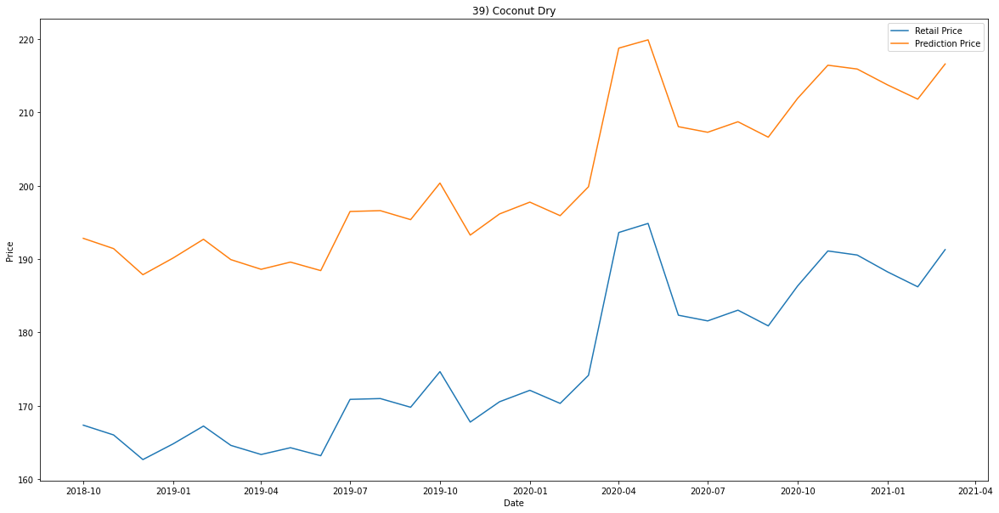

Accuracy :  0.5784278247909203
     Retail Price       Date  Prediction Price
220    650.500000 2018-10-01        653.387227
200    662.500000 2018-11-01        648.578988
57     672.166667 2018-12-01        644.477546
99     676.000000 2019-01-01        642.812847
78     671.000000 2019-02-01        644.980560
160    655.161290 2019-03-01        651.564734
18     718.218750 2019-04-01        624.483264
181    751.031250 2019-05-01        612.532039
140    750.875000 2019-06-01        612.580476
120    785.833333 2019-07-01        604.248742
38     786.266667 2019-08-01        604.178737
241    856.600000 2019-09-01        602.978325
221    856.466667 2019-10-01        602.964921
201    776.214286 2019-11-01        606.017560
58     787.178571 2019-12-01        604.034151
100    945.533333 2020-01-01        613.846638
79     899.448276 2020-02-01        608.624756
161    884.222222 2020-03-01        606.432541
19     954.727273 2020-04-01        614.276829
182    944.769231 2020-05-01 

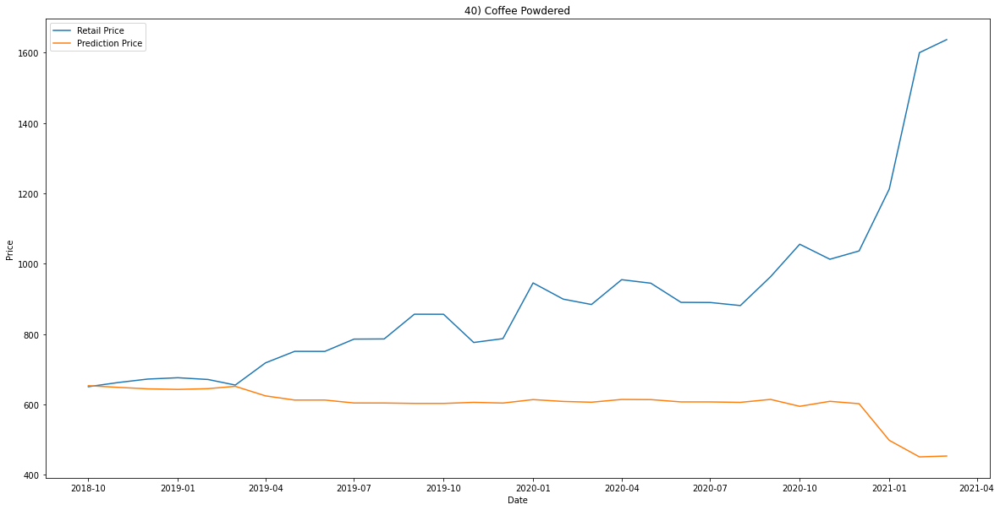

Accuracy :  0.7628371789131576
     Retail Price       Date  Prediction Price
185     28.830508 2018-10-01         30.889472
169     28.816667 2018-11-01         30.877391
48      29.032787 2018-12-01         31.066021
84      29.245902 2019-01-01         31.252033
66      29.355932 2019-02-01         31.348072
136     29.737705 2019-03-01         31.681309
15      28.790323 2019-04-01         30.854398
154     29.222222 2019-05-01         31.231365
119     29.650794 2019-06-01         31.605446
102     29.467742 2019-07-01         31.445666
32      29.936508 2019-08-01         31.854843
202     30.060606 2019-09-01         31.963169
186     29.848485 2019-10-01         31.778008
170     30.046875 2019-11-01         31.951183
49      30.281250 2019-12-01         32.155773
85      30.666667 2020-01-01         32.492215
67      30.681818 2020-02-01         32.505441
137     29.949153 2020-03-01         31.865881
16      27.222222 2020-04-01         29.485984
155     29.849057 2020-05-01 

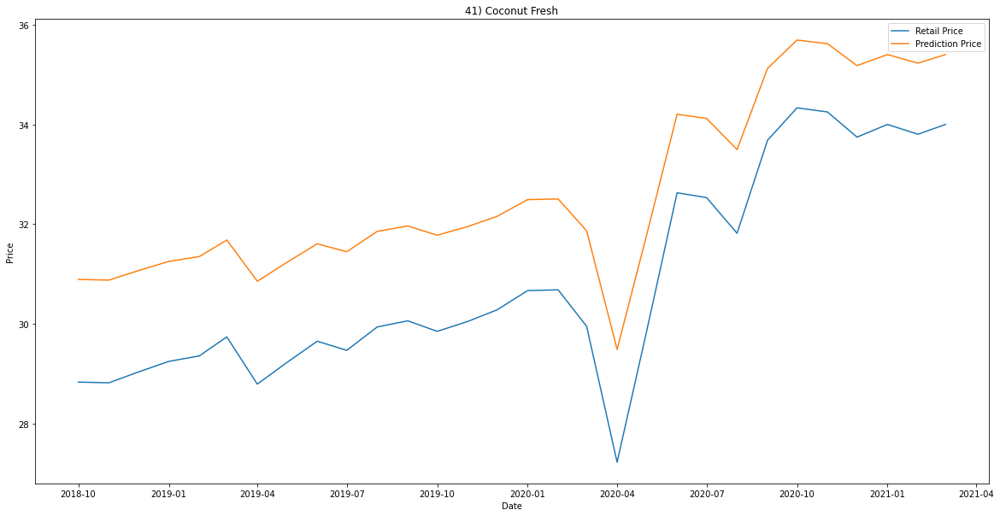

Accuracy :  0.8629578414805119
     Retail Price       Date  Prediction Price
185    588.740000 2018-10-01        675.340695
169    556.840000 2018-11-01        701.180700
48     567.784314 2018-12-01        693.383632
84     567.196078 2019-01-01        693.835745
66     569.647059 2019-02-01        691.929205
136    543.596154 2019-03-01        708.630779
15     566.452830 2019-04-01        694.401959
154    579.188679 2019-05-01        683.983852
119    576.641509 2019-06-01        686.180266
102    586.865385 2019-07-01        677.082226
32     588.040000 2019-08-01        675.993304
202    621.803922 2019-09-01        642.885411
186    613.403846 2019-10-01        651.231732
170    654.960000 2019-11-01        612.614313
49     652.460000 2019-12-01        614.647408
85     648.137255 2020-01-01        618.283154
67     668.529412 2020-02-01        602.591489
137    651.326531 2020-03-01        615.586373
16     769.864865 2020-04-01        602.064870
155    744.102564 2020-05-01 

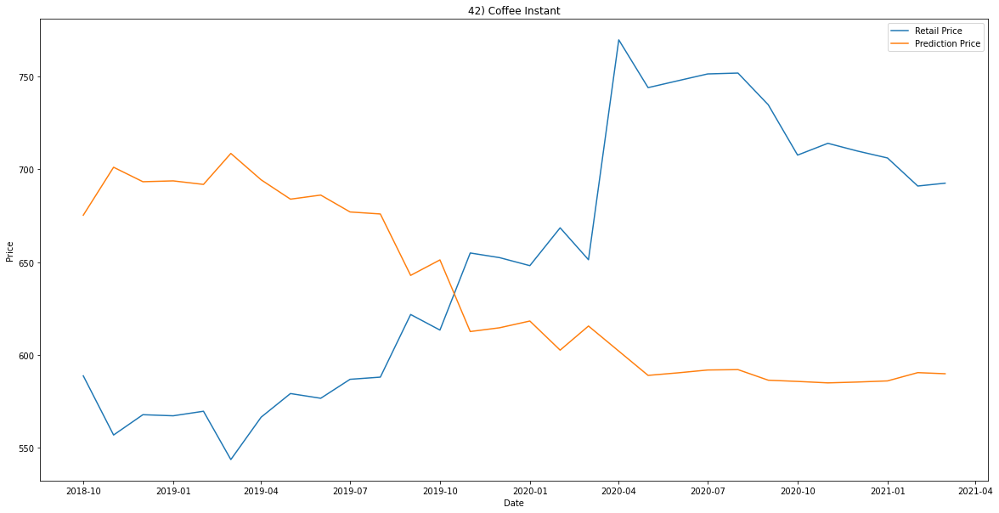

Accuracy :  -0.16760513875210514
     Retail Price       Date  Prediction Price
220     24.468750 2018-10-01         20.374637
200     24.000000 2018-11-01         20.275377
57      22.253731 2018-12-01         19.897260
99      22.969697 2019-01-01         20.053874
78      19.307692 2019-02-01         19.229735
160     25.969697 2019-03-01         20.686076
18      30.059701 2019-04-01         21.484985
181     43.865672 2019-05-01         23.636164
140     37.626866 2019-06-01         22.769106
120     45.373134 2019-07-01         23.819492
38      35.030303 2019-08-01         22.357049
241     35.686567 2019-09-01         22.464023
221     43.289855 2019-10-01         23.563442
201     34.166667 2019-11-01         22.213363
58      26.696970 2019-12-01         20.833467
100     24.814286 2020-01-01         20.447198
79      20.514286 2020-02-01         19.507610
161     24.000000 2020-03-01         20.275377
19      21.234043 2020-04-01         19.670411
182     20.214286 2020-05-0

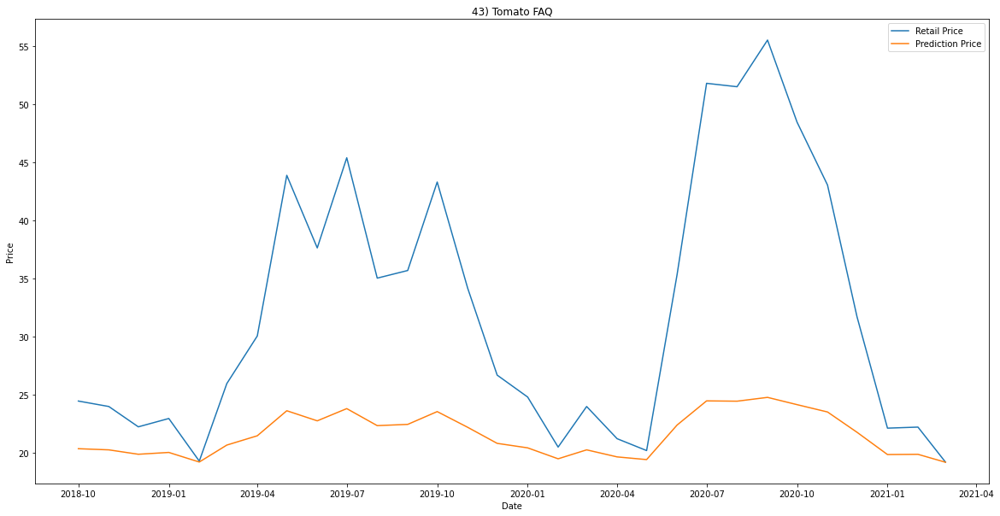

Accuracy :  0.0870425011308874
     Retail Price       Date  Prediction Price
220     23.266667 2018-10-01         23.259947
200     23.290323 2018-11-01         23.280749
57      23.492063 2018-12-01         23.458104
99      23.306452 2019-01-01         23.294931
78      23.172131 2019-02-01         23.176804
160     23.137097 2019-03-01         23.145986
18      23.023810 2019-04-01         23.046318
181     23.169355 2019-05-01         23.174362
140     23.373016 2019-06-01         23.353457
120     23.531746 2019-07-01         23.492979
38      23.182540 2019-08-01         23.185959
241     23.371212 2019-09-01         23.351871
221     23.470149 2019-10-01         23.438843
201     23.179688 2019-11-01         23.183450
58      23.164062 2019-12-01         23.169706
100     23.216418 2020-01-01         23.215756
79      23.037313 2020-02-01         23.058200
161     22.958333 2020-03-01         22.988700
19      22.455556 2020-04-01         22.545966
182     23.125000 2020-05-01 

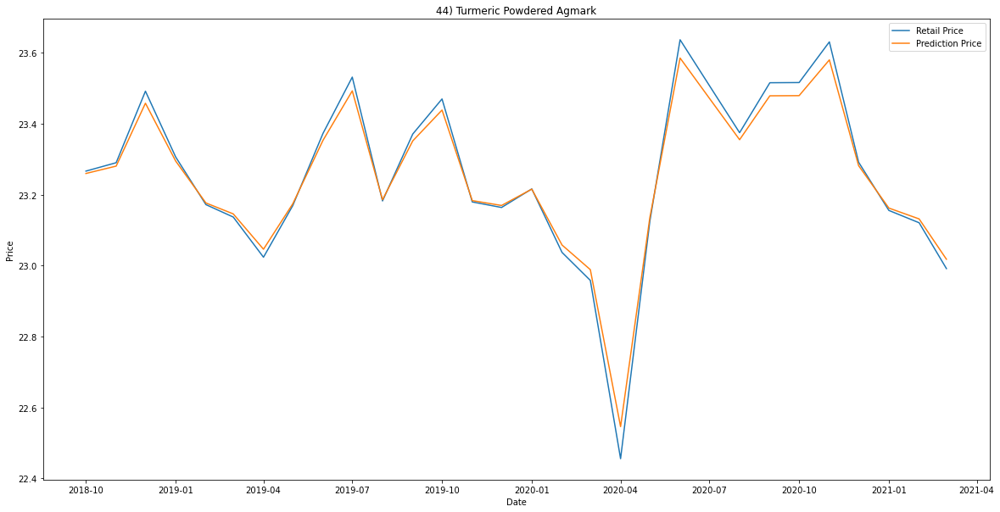

Accuracy :  0.6207653860907222
     Retail Price       Date  Prediction Price
220     72.428571 2018-10-01         80.793510
200     76.215385 2018-11-01         82.605934
57      76.878788 2018-12-01         82.902243
99      76.784615 2019-01-01         82.860566
78      76.437500 2019-02-01         82.705847
160     76.476923 2019-03-01         82.723506
18      76.184697 2019-04-01         82.592074
181     78.525152 2019-05-01         83.610191
140     79.302727 2019-06-01         83.930955
120     79.261538 2019-07-01         83.914183
38      79.169231 2019-08-01         83.876506
241     79.575758 2019-09-01         84.041513
221     82.985075 2019-10-01         85.331206
201     98.723077 2019-11-01         89.095686
58     101.169231 2019-12-01         89.357543
100    105.275362 2020-01-01         89.602417
79     103.797101 2020-02-01         89.542316
161    104.885246 2020-03-01         89.589617
19     105.422222 2020-04-01         89.606667
182    103.773585 2020-05-01 

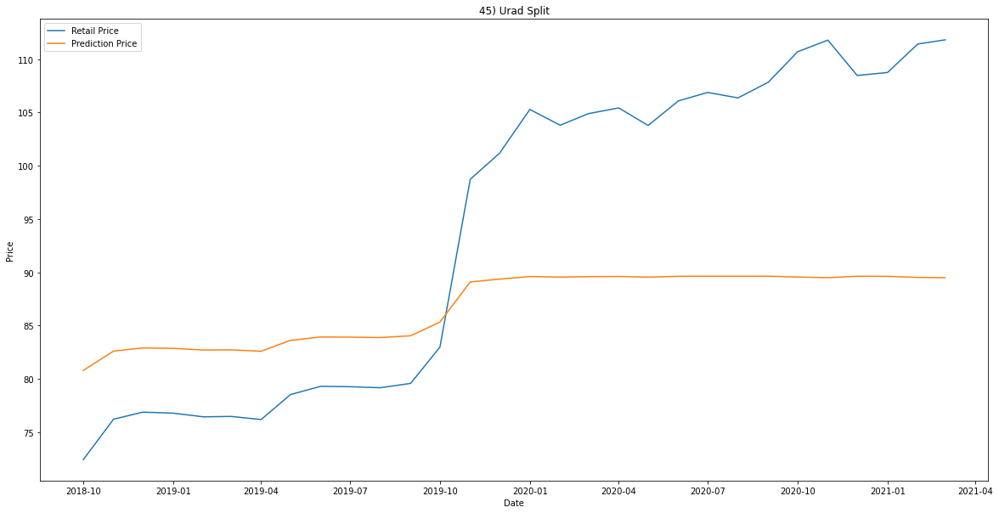

Accuracy :  0.9171403810599429
     Retail Price       Date  Prediction Price
220     26.176471 2018-10-01         28.325646
200     26.557692 2018-11-01         28.692267
57      26.750000 2018-12-01         28.877129
99      26.675472 2019-01-01         28.805493
78      27.225000 2019-02-01         29.333501
160     26.956604 2019-03-01         29.075672
18      26.527778 2019-04-01         28.663506
181     26.946296 2019-05-01         29.065768
140     26.707407 2019-06-01         28.836190
120     27.403704 2019-07-01         29.505109
38      27.112963 2019-08-01         29.225889
241     27.045455 2019-09-01         29.161037
221     27.341818 2019-10-01         29.445687
201     27.509804 2019-11-01         29.606973
58      28.134615 2019-12-01         30.206489
100     28.794643 2020-01-01         30.839132
79      28.890909 2020-02-01         30.931346
161     29.000000 2020-03-01         31.035827
19      29.763158 2020-04-01         31.766197
182     29.720930 2020-05-01 

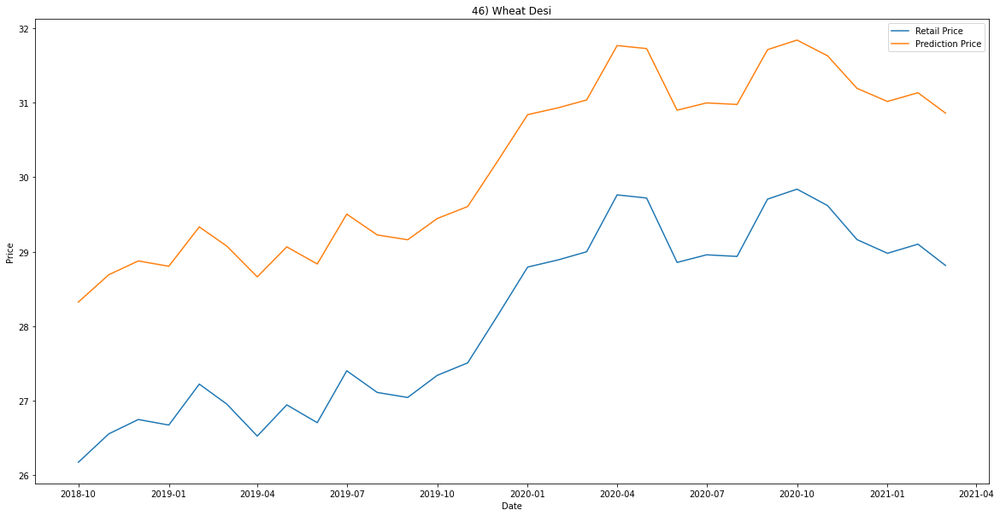

Accuracy :  0.9357166122149331
     Retail Price       Date  Prediction Price
220     26.274510 2018-10-01         29.227433
200     26.823529 2018-11-01         29.774589
57      26.653846 2018-12-01         29.605538
99      26.711538 2019-01-01         29.663021
78      26.730769 2019-02-01         29.682181
160     26.627451 2019-03-01         29.579236
18      26.596154 2019-04-01         29.548049
181     26.961538 2019-05-01         29.912047
140     27.235294 2019-06-01         30.184612
120     27.627451 2019-07-01         30.574830
38      28.529412 2019-08-01         31.471280
241     28.557692 2019-09-01         31.499364
221     28.673077 2019-10-01         31.613930
201     29.032692 2019-11-01         31.970835
58      28.958824 2019-12-01         31.897543
100     29.028302 2020-01-01         31.966479
79      28.937736 2020-02-01         31.876618
161     28.888889 2020-03-01         31.828144
19      29.605263 2020-04-01         32.538590
182     29.032609 2020-05-01 

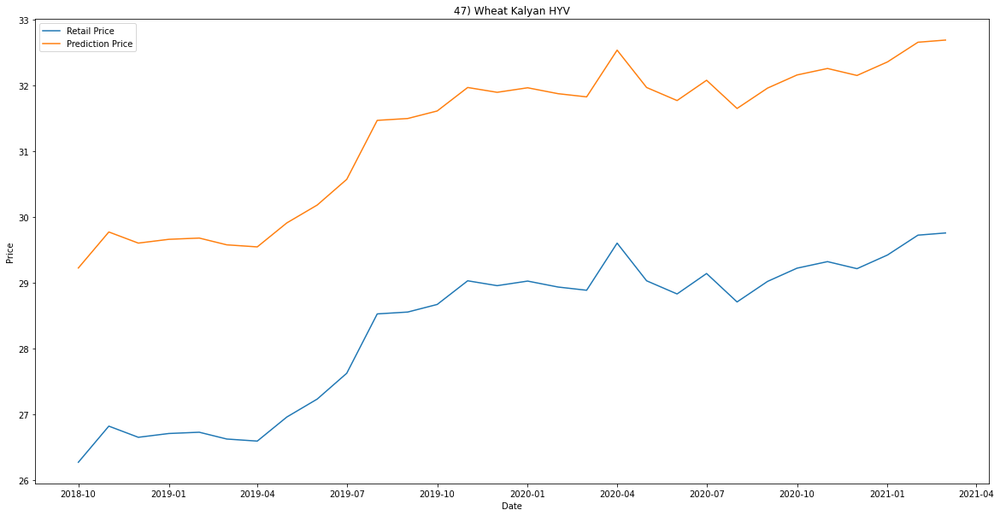

In [65]:
varieties_dm=(dm['Commodity']+"+"+dm['Variety']).unique()  #looping through all the varieties
i=1
for item in varieties_dm:
    itemName=item.split("+")
    C=itemName[0]                                        #extracting the name of commodity and variety
    V=itemName[1]
    dm_item=dm[(dm['Commodity']==C) & (dm['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dm_item['Date']
    item_specific_dp['Retail Price']=dm_item['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    column_names = ["Date","Retail Price"]
    dm_data=pd.DataFrame(columns=columns)
    dm_data['Date']=item_specific_sorted['Date']
    dm_data['Retail Price']=item_specific_sorted['Retail Price']
    dm_data['Prediction Prices']=dm_data[['Retail Price']].shift(-30)
    X=(dm_data.drop(['Date','Prediction Prices'],axis=1))
    X=X[:-30]
    y=(dm_data['Prediction Prices'])
    y=y[:-30]
    #splitting data into 80% training and 20% testing
    from sklearn.model_selection import train_test_split
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.09)
    #prediction days array is last 30 rows data from original data set
    prediction_days_array=(dm_data.drop(['Date','Prediction Prices'],axis=1)).tail(30)
    from sklearn.svm import SVR
    #create and train the support vector machine (regression) using radial basis function
    svr_rbf=SVR(kernel='rbf',C=1e3,gamma=0.00001)
    svr_rbf.fit(x_train,y_train)
    #test the model
    svr_rbf_confidence=svr_rbf.score(x_test,y_test)
    print("Accuracy : ",svr_rbf_confidence)
    svm_prediction=svr_rbf.predict(x_test)
    svm_prediction=svr_rbf.predict(prediction_days_array)
    column_names = ["Date","Retail Price","Prediction Price"]
    data=pd.DataFrame(columns=columns)
    data['Date']=item_specific_sorted['Date'].tail(30)
    data['Retail Price']=item_specific_sorted['Retail Price'].tail(30)
    data['Prediction Price']=svm_prediction
    print(data)
    #plotting the prediction prices and actual price
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.plot(data['Date'], data['Retail Price'])
    plt.plot(data['Date'], data['Prediction Price'])
    plt.legend(["Retail Price","Prediction Price"])
    plt.show()

<h3>Weekly Food Commodities<h3>

Accuracy :  0.856524914695177
     Retail Price       Date  Prediction Price
389    105.816667 2020-08-14        105.560072
595    104.344262 2020-08-21        104.257045
813    104.580645 2020-08-28        104.466773
253    105.734375 2020-09-10        105.487458
508    105.290323 2020-09-18        105.095195
722    105.369231 2020-09-25        105.164954
261     96.014706 2020-10-01         96.742407
269    111.045455 2020-10-04        110.120688
277    107.155172 2020-10-07        106.737585
452    106.815385 2020-10-16        106.439307
660    107.092308 2020-10-23        106.682433
880    107.225806 2020-10-30        106.799535
309    105.781250 2020-11-09        105.528823
317    106.444444 2020-11-12        106.113183
371    107.937500 2020-11-13        107.422663
575    107.515625 2020-11-20        107.053522
792    107.230769 2020-11-27        106.803886
330    110.078125 2020-12-06        109.285043
516    105.968254 2020-12-18        105.693765
731    106.238095 2020-12-25  

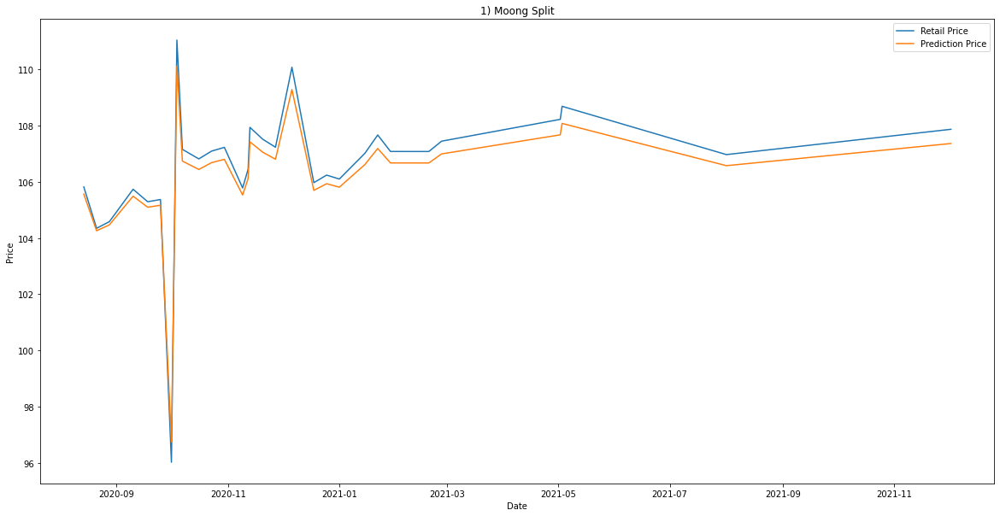

Accuracy :  0.08810418197852965
     Retail Price       Date  Prediction Price
401     22.716667 2020-08-14         19.990290
615     24.427419 2020-08-21         20.772403
835     25.951613 2020-08-28         21.438678
260     47.859375 2020-09-10         27.816473
525     34.888889 2020-09-18         24.763796
744     41.734375 2020-09-25         26.636457
268     73.231884 2020-10-01         27.797716
276     31.113636 2020-10-04         23.480665
285     21.155172 2020-10-07         19.244826
467     53.430769 2020-10-16         28.485223
682     67.076923 2020-10-23         28.516060
902     68.396825 2020-10-30         28.399811
318     31.703125 2020-11-09         23.692738
326     49.312500 2020-11-12         28.027949
382     62.623077 2020-11-13         28.754347
594     62.461538 2020-11-20         28.758500
814     60.840909 2020-11-27         28.782680
340     21.812500 2020-12-06         19.562306
533     47.046875 2020-12-18         27.686801
753     39.812500 2020-12-25

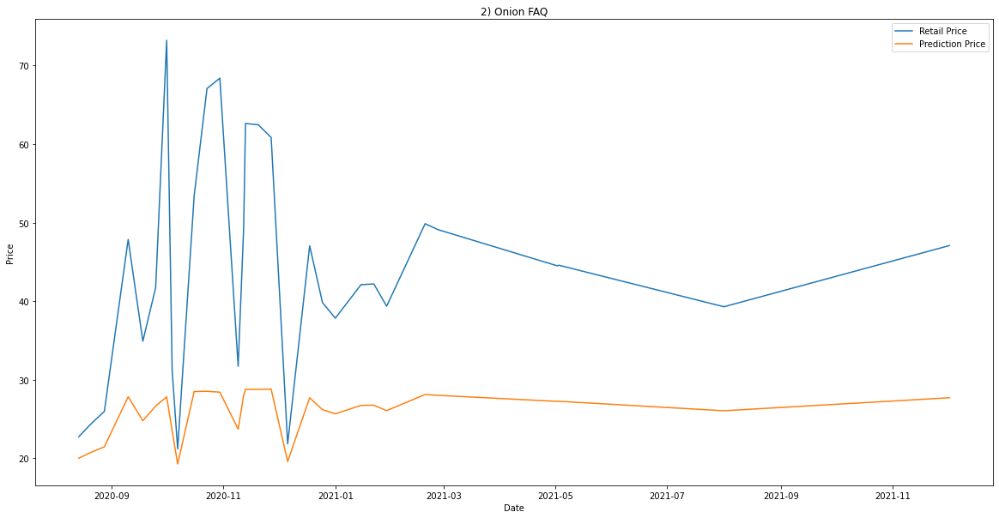

Accuracy :  0.559188116177197
     Retail Price       Date  Prediction Price
401     33.983333 2020-08-14         28.887713
615     33.548387 2020-08-21         28.585351
835     35.758065 2020-08-28         30.115546
260     39.921875 2020-09-10         32.957951
525     38.047619 2020-09-18         31.685259
744     39.203125 2020-09-25         32.471219
268     28.050725 2020-10-01         24.716089
276     28.454545 2020-10-04         25.003213
285     29.689655 2020-10-07         25.878585
467     40.400000 2020-10-16         33.280811
682     42.600000 2020-10-23         34.756763
902     43.079365 2020-10-30         35.076238
318     37.171875 2020-11-09         31.086779
326     42.078125 2020-11-12         34.408086
382     44.907692 2020-11-13         36.287642
594     46.030769 2020-11-20         37.026119
814     46.935606 2020-11-27         37.617926
340     28.265625 2020-12-06         24.868943
533     36.046875 2020-12-18         30.314449
753     31.890625 2020-12-25  

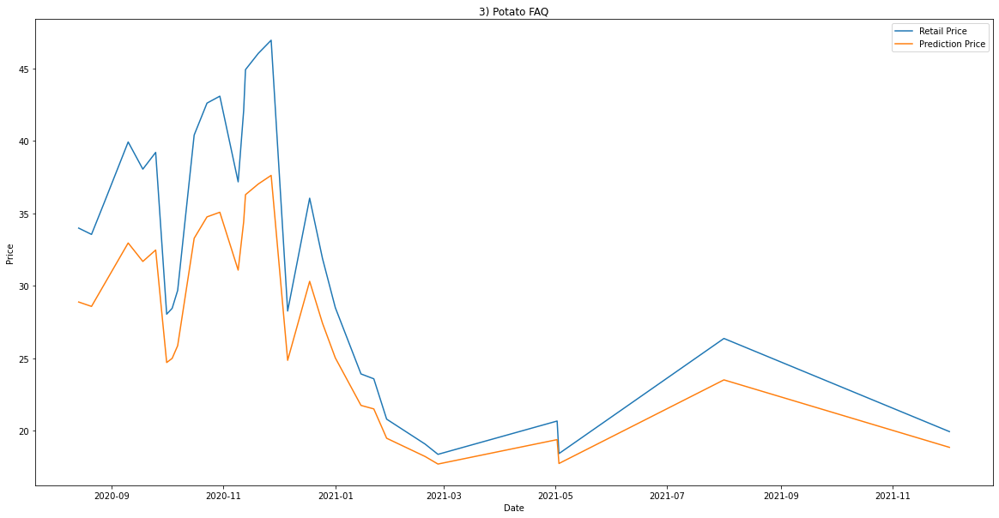

Accuracy :  0.9405840605698755
     Retail Price       Date  Prediction Price
389     40.200000 2020-08-14         40.237650
596     39.733333 2020-08-21         39.789179
814     40.967742 2020-08-28         40.974898
252     40.533333 2020-09-10         40.557831
508     39.800000 2020-09-18         39.853262
723     41.466667 2020-09-25         41.453621
260     37.285714 2020-10-01         37.433027
268     40.272727 2020-10-04         40.307519
276     39.965517 2020-10-07         40.012342
452     40.966667 2020-10-16         40.973866
661     40.300000 2020-10-23         40.333718
881     40.482759 2020-10-30         40.509260
308     39.733333 2020-11-09         39.789179
316     39.038462 2020-11-12         39.120937
370     40.033333 2020-11-13         40.077511
575     40.033333 2020-11-20         40.077511
793     41.354839 2020-11-27         41.346348
329     40.100000 2020-12-06         40.141571
516     38.730769 2020-12-18         38.824865
732     40.222222 2020-12-25 

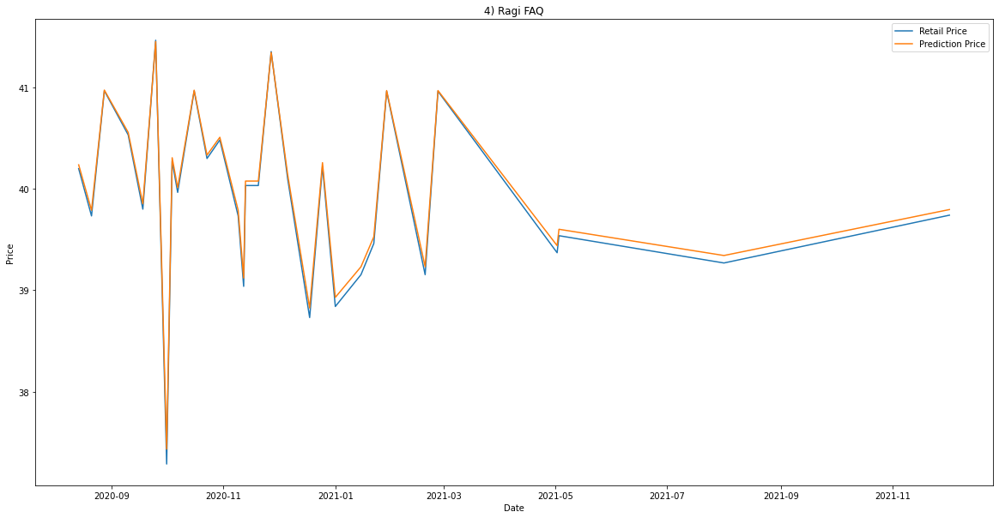

Accuracy :  0.8758021476369127
     Retail Price       Date  Prediction Price
395     26.815789 2020-08-14         26.762289
604     26.798246 2020-08-21         26.745701
824     26.906780 2020-08-28         26.848314
255     28.525000 2020-09-10         28.376155
516     28.059322 2020-09-18         27.936895
733     28.191667 2020-09-25         28.061766
264     26.062500 2020-10-01         26.049642
272     25.607143 2020-10-04         25.618458
280     26.851852 2020-10-07         26.796385
459     28.762295 2020-10-16         28.599858
670     28.860656 2020-10-23         28.692559
891     28.732759 2020-10-30         28.572018
312     28.025000 2020-11-09         27.904507
320     29.296610 2020-11-12         29.103241
375     29.208333 2020-11-13         29.020106
583     29.341667 2020-11-20         29.145669
803     29.385246 2020-11-27         29.186702
333     27.091667 2020-12-06         27.023075
524     29.313559 2020-12-18         29.119202
742     29.415254 2020-12-25 

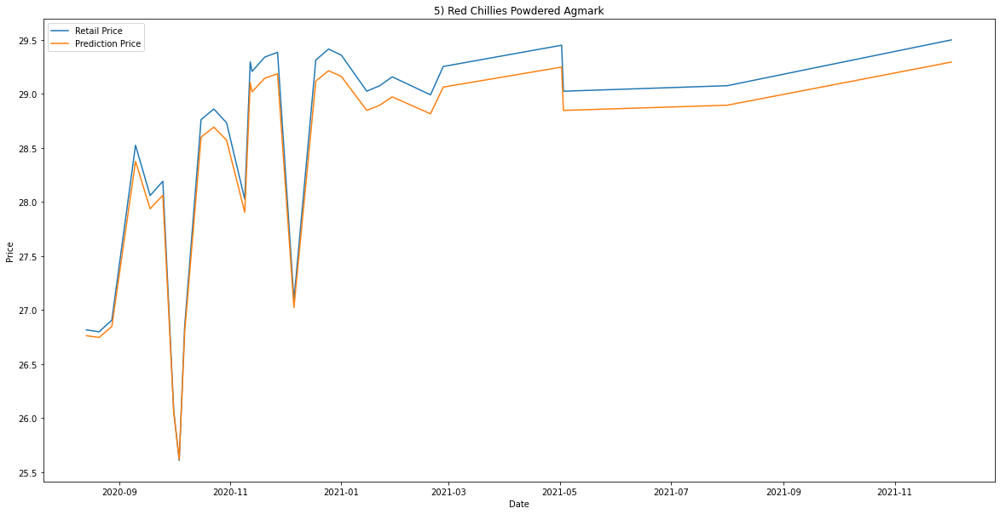

Accuracy :  0.9828079116194623
     Retail Price       Date  Prediction Price
391     32.542373 2020-08-14         32.939816
599     32.375000 2020-08-21         32.780617
817     32.295082 2020-08-28         32.704561
254     32.483871 2020-09-10         32.884185
511     32.451613 2020-09-18         32.853503
726     32.603175 2020-09-25         32.997620
262     31.686567 2020-10-01         32.124583
270     33.162791 2020-10-04         33.528914
278     32.892857 2020-10-07         33.272805
454     32.444444 2020-10-16         32.846685
664     32.444444 2020-10-23         32.846685
884     32.557377 2020-10-30         32.954082
310     32.403226 2020-11-09         32.807473
318     32.887097 2020-11-12         33.267337
373     32.619048 2020-11-13         33.012708
579     32.460317 2020-11-20         32.861783
796     32.421875 2020-11-27         32.825215
332     32.612903 2020-12-06         33.006867
519     32.870968 2020-12-18         33.252024
735     32.951613 2020-12-25 

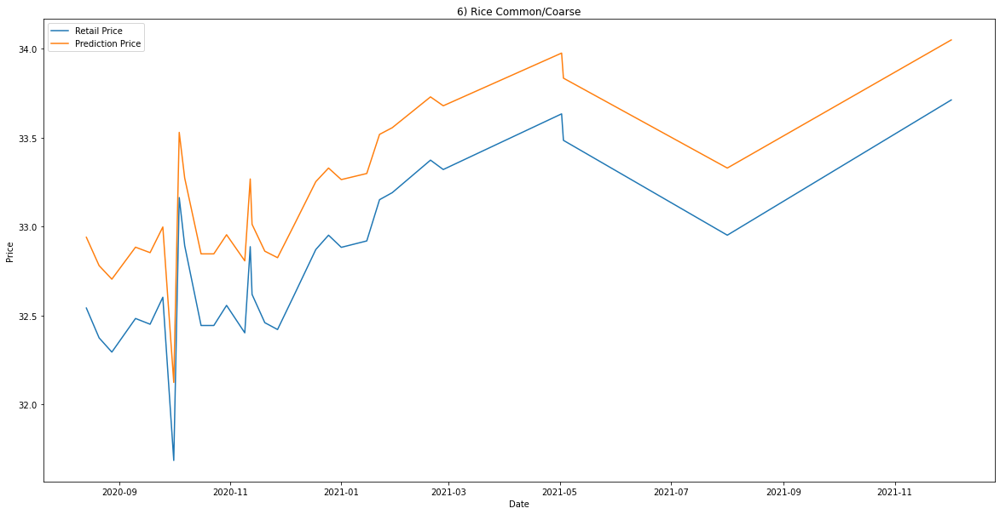

Accuracy :  0.9568683775196034
     Retail Price       Date  Prediction Price
391     47.067797 2020-08-14         47.243963
599     46.542373 2020-08-21         46.759554
817     46.868852 2020-08-28         47.060671
254     46.241935 2020-09-10         46.482100
511     46.311475 2020-09-18         46.546351
726     46.634921 2020-09-25         46.844953
262     44.121212 2020-10-01         44.514055
270     47.068182 2020-10-04         47.244318
278     47.589286 2020-10-07         47.723707
454     46.015873 2020-10-16         46.273108
664     46.031746 2020-10-23         46.287789
884     46.466667 2020-10-30         46.689671
310     46.274194 2020-11-09         46.511907
318     46.311475 2020-11-12         46.546351
373     46.209677 2020-11-13         46.452290
579     46.096774 2020-11-20         46.347923
796     46.380952 2020-11-27         46.610525
332     46.435484 2020-12-06         46.660881
519     46.295082 2020-12-18         46.531206
735     46.721311 2020-12-25 

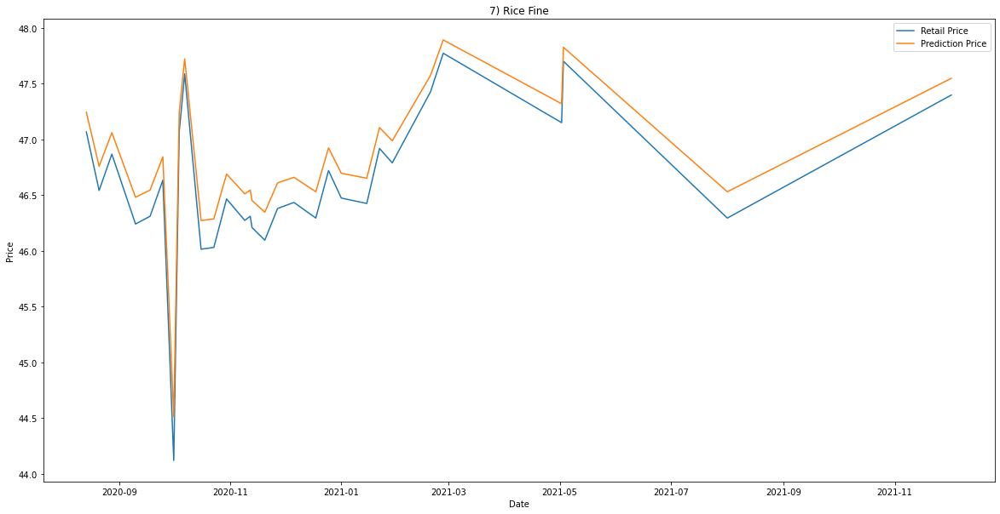

Accuracy :  0.39896251051727094
     Retail Price       Date  Prediction Price
395     10.519231 2020-08-14         10.737928
604     10.711538 2020-08-21         10.929378
824     10.888889 2020-08-28         11.105918
255     10.716981 2020-09-10         10.934796
516     10.519231 2020-09-18         10.737928
733     10.981481 2020-09-25         11.198080
264     10.517241 2020-10-01         10.735947
272     10.820513 2020-10-04         11.037857
280     10.734694 2020-10-07         10.952429
459     10.763636 2020-10-16         10.981240
670     10.763636 2020-10-23         10.981240
891     10.653846 2020-10-30         10.871945
312     10.740741 2020-11-09         10.958448
320     10.641509 2020-11-12         10.859664
375     10.592593 2020-11-13         10.810965
583     10.592593 2020-11-20         10.810965
803     10.727273 2020-11-27         10.945041
333     10.703704 2020-12-06         10.921579
524     10.660377 2020-12-18         10.878447
742     10.884615 2020-12-25

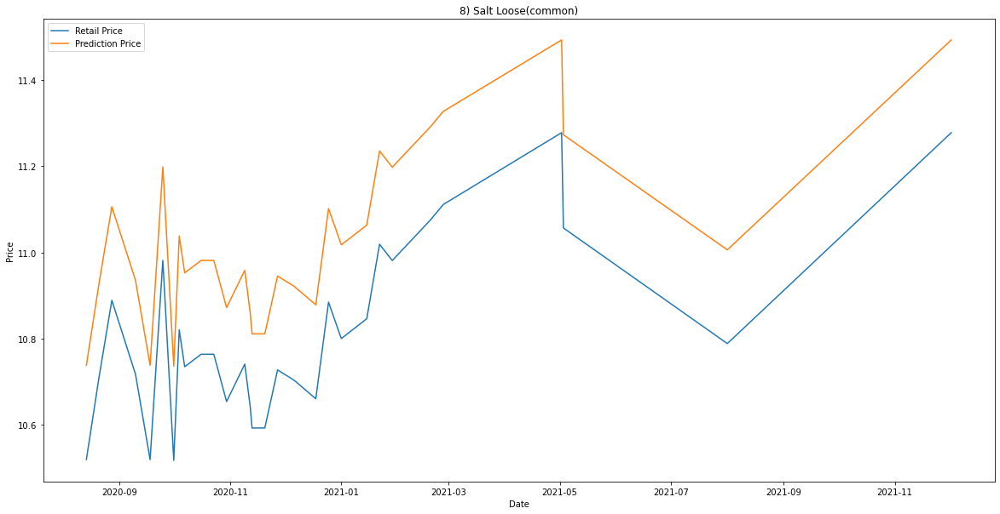

Accuracy :  0.9348674685451415
     Retail Price       Date  Prediction Price
401    102.204082 2020-08-14        101.551386
615    102.591837 2020-08-21        101.852013
835    103.240000 2020-08-28        102.351774
260    105.326531 2020-09-10        103.936970
525    103.529412 2020-09-18        102.573805
744    104.411765 2020-09-25        103.246448
268     96.696429 2020-10-01         97.149684
276     94.921053 2020-10-04         95.679300
285     97.847826 2020-10-07         98.089994
467    104.320000 2020-10-16        103.176794
682    104.320000 2020-10-23        103.176794
902    104.979592 2020-10-30        103.675900
318    103.235294 2020-11-09        102.348158
326    106.102041 2020-11-12        104.516897
382    104.240000 2020-11-13        103.116013
594    105.000000 2020-11-20        103.691285
814    105.254902 2020-11-27        103.883152
340     97.615385 2020-12-06         97.901014
533    107.265306 2020-12-18        105.377317
753    108.020408 2020-12-25 

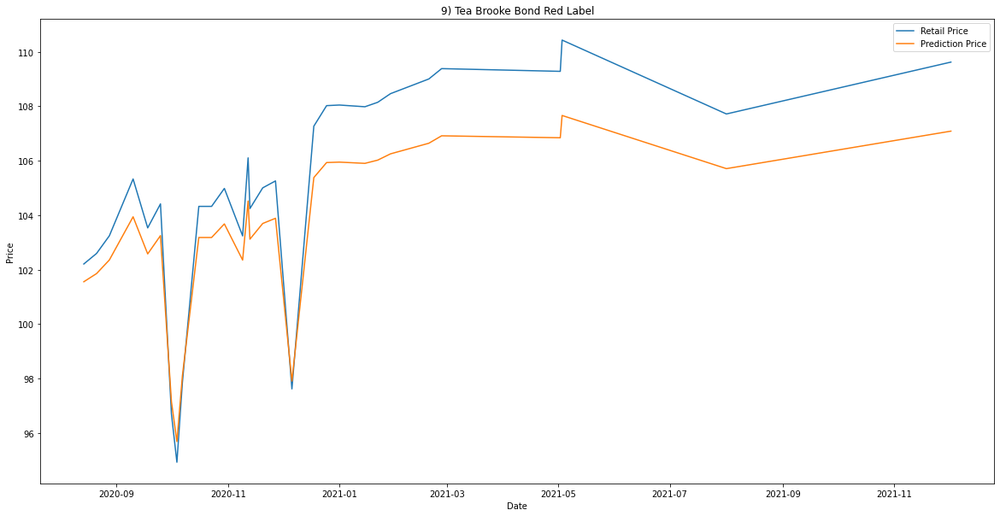

Accuracy :  0.9615215007136679
     Retail Price       Date  Prediction Price
391    245.882353 2020-08-14        240.296106
593    247.211538 2020-08-21        240.994106
789    243.888889 2020-08-28        239.215059
253    256.773585 2020-09-10        245.463523
511    252.096154 2020-09-18        243.399733
710    253.442308 2020-09-25        244.017994
261    232.368421 2020-10-01        232.191086
269    231.410256 2020-10-04        231.549503
278    243.617021 2020-10-07        239.064470
455    257.111111 2020-10-16        245.603218
656    259.518519 2020-10-23        246.563146
846    260.942308 2020-10-30        247.100605
309    251.442308 2020-11-09        243.092410
317    267.000000 2020-11-12        249.132669
372    264.188679 2020-11-13        248.241167
574    266.113208 2020-11-20        248.861153
771    264.888889 2020-11-27        248.471599
331    240.584906 2020-12-06        237.334249
519    266.711538 2020-12-18        249.045332
718    265.750000 2020-12-25 

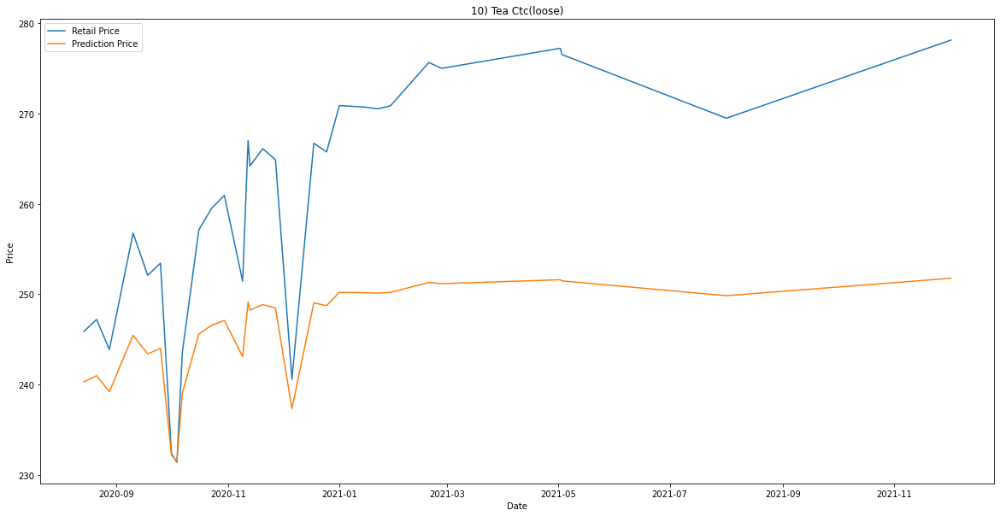

Accuracy :  0.9268265535532063
     Retail Price       Date  Prediction Price
381     73.107143 2020-08-14         72.747309
577     73.061404 2020-08-21         72.707961
771     73.017241 2020-08-28         72.669959
247     71.949153 2020-09-10         71.747922
497     71.025424 2020-09-18         70.945983
692     71.833333 2020-09-25         71.647602
255     67.423077 2020-10-01         67.779264
263     72.219512 2020-10-04         71.981844
271     72.666667 2020-10-07         72.367943
442     71.633333 2020-10-16         71.474212
638     71.783333 2020-10-23         71.604273
828     71.879310 2020-10-30         71.687434
301     71.728814 2020-11-09         71.557013
309     71.822034 2020-11-12         71.637811
363     71.750000 2020-11-13         71.575380
559     71.533333 2020-11-20         71.387443
753     71.442623 2020-11-27         71.308693
323     71.677966 2020-12-06         71.512923
505     71.906780 2020-12-18         71.711227
700     71.093220 2020-12-25 

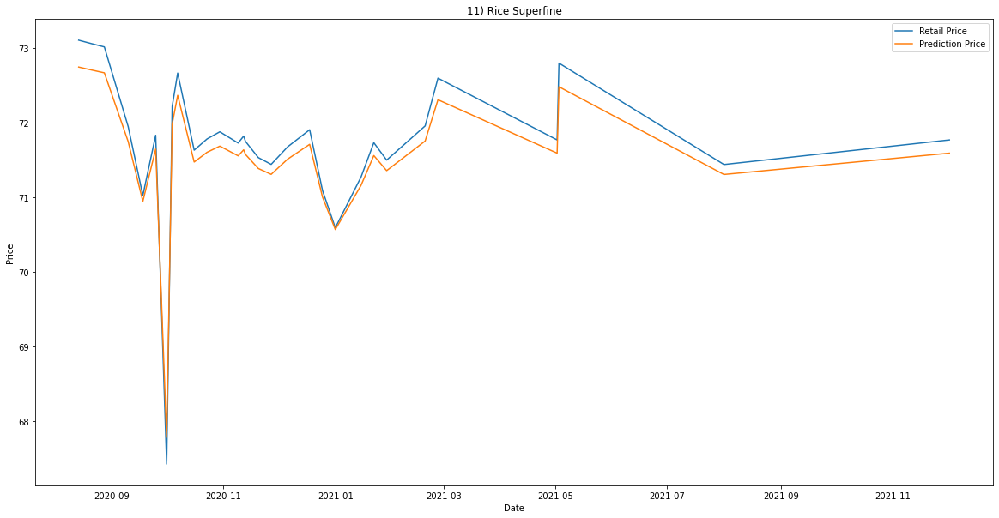

Accuracy :  0.985872325551492
     Retail Price       Date  Prediction Price
385     18.724138 2020-08-14         19.033921
582     18.719298 2020-08-21         19.029163
778     18.745763 2020-08-28         19.055179
248     18.933333 2020-09-10         19.239547
502     18.783333 2020-09-18         19.092111
699     18.833333 2020-09-25         19.141259
257     18.078125 2020-10-01         18.398645
265     18.441860 2020-10-04         18.756387
273     18.545455 2020-10-07         18.858250
447     19.016393 2020-10-16         19.321177
644     19.000000 2020-10-23         19.305067
835     19.016949 2020-10-30         19.321723
303     18.866667 2020-11-09         19.174023
311     19.250000 2020-11-12         19.550724
365     19.032787 2020-11-13         19.337288
563     19.098361 2020-11-20         19.401726
760     19.096774 2020-11-27         19.400167
324     18.733333 2020-12-06         19.042960
510     19.266667 2020-12-18         19.567098
707     19.300000 2020-12-25  

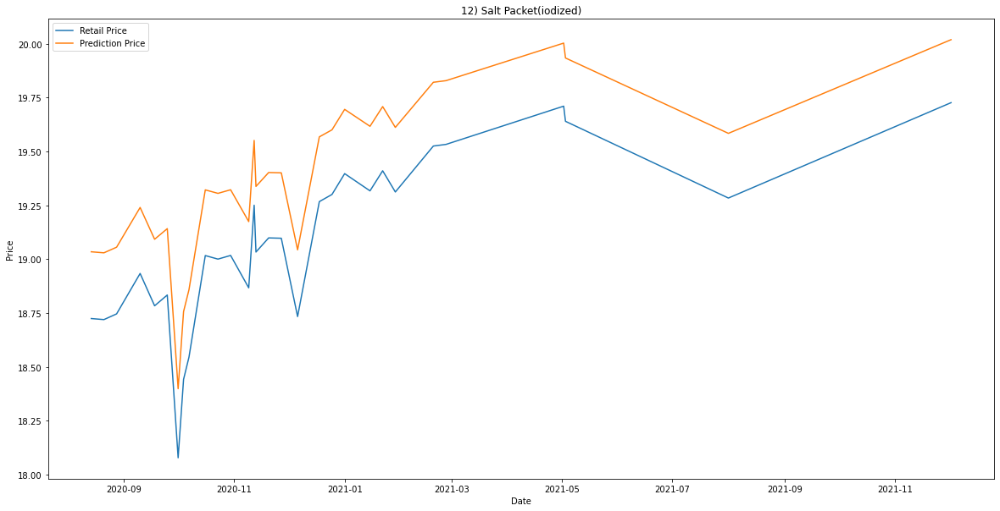

Accuracy :  0.6420634642663581
     Retail Price       Date  Prediction Price
389     93.983333 2020-08-14         93.562990
595     93.350000 2020-08-21         93.019717
813     93.770492 2020-08-28         93.380607
253    104.698413 2020-09-10        102.482104
508     95.451613 2020-09-18         94.815795
722     96.968750 2020-09-25         96.100346
261     91.268657 2020-10-01         91.222295
269     96.204545 2020-10-04         95.454572
277     93.896552 2020-10-07         93.488651
452    107.265625 2020-10-16        104.539030
660    109.187500 2020-10-23        106.057689
880    109.790323 2020-10-30        106.530242
309     95.888889 2020-11-09         95.187078
317    106.142857 2020-11-12        103.643386
371    109.843750 2020-11-13        106.572035
575    108.906250 2020-11-20        105.836594
792    108.215385 2020-11-27        105.291819
330     95.225806 2020-12-06         94.623739
516    104.507937 2020-12-18        102.328215
731    103.793651 2020-12-25 

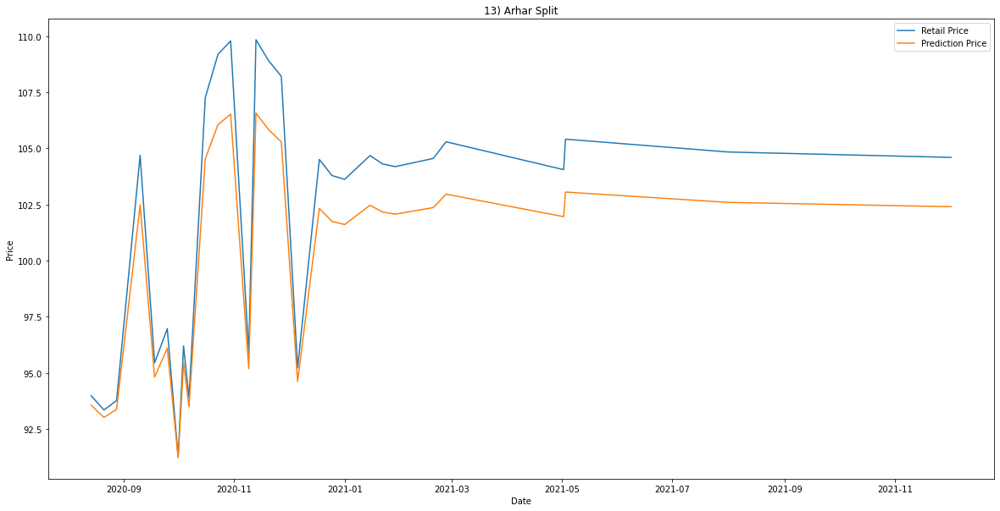

Accuracy :  0.972764244733046
     Retail Price       Date  Prediction Price
390     32.196429 2020-08-14         32.339048
597     31.964286 2020-08-21         32.115965
815     32.172414 2020-08-28         32.315973
253     31.932203 2020-09-10         32.085130
509     31.379310 2020-09-18         31.553587
724     31.700000 2020-09-25         31.861929
261     31.354839 2020-10-01         31.530054
269     32.350000 2020-10-04         32.486597
277     31.981132 2020-10-07         32.132156
453     31.866667 2020-10-16         32.022140
662     31.583333 2020-10-23         31.749766
882     31.140351 2020-10-30         31.323765
309     31.898305 2020-11-09         32.052549
317     30.862069 2020-11-12         31.056058
371     31.406780 2020-11-13         31.580002
576     31.135593 2020-11-20         31.319189
794     31.100000 2020-11-27         31.284952
330     32.355932 2020-12-06         32.492297
517     30.879310 2020-12-18         31.072647
733     30.741379 2020-12-25  

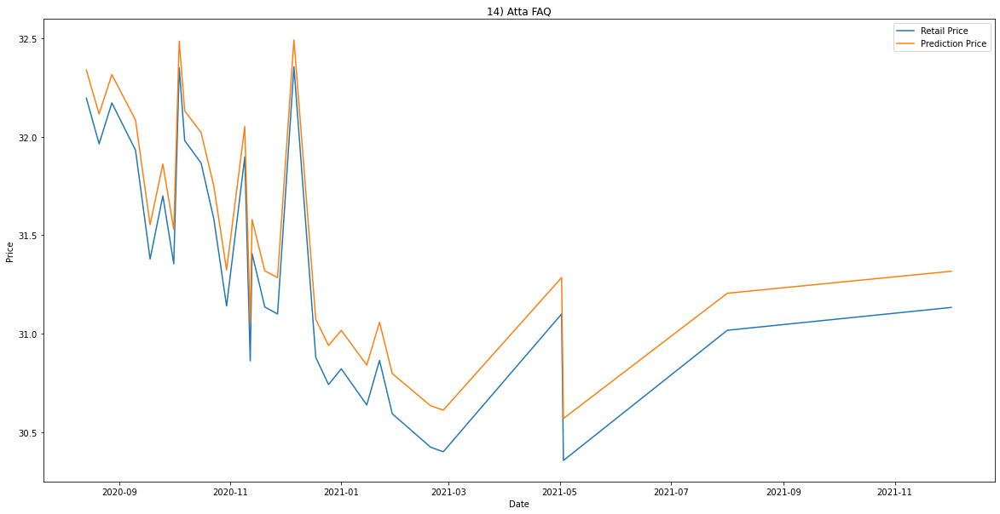

Accuracy :  0.9632921544345714
     Retail Price       Date  Prediction Price
390     26.615385 2020-08-14         26.392603
598     26.225000 2020-08-21         26.040194
816     25.950000 2020-08-28         25.791435
252     25.337500 2020-09-10         25.235866
509     25.538462 2020-09-18         25.418378
725     25.564103 2020-09-25         25.441649
260     28.204545 2020-10-01         27.818317
268     28.258065 2020-10-04         27.866083
276     27.131579 2020-10-07         26.857269
453     25.312500 2020-10-16         25.213146
663     25.337500 2020-10-23         25.235866
883     25.474359 2020-10-30         25.360185
308     25.500000 2020-11-09         25.383465
316     25.333333 2020-11-12         25.232080
371     25.337500 2020-11-13         25.235866
577     25.256410 2020-11-20         25.162158
795     25.304878 2020-11-27         25.206218
330     27.075000 2020-12-06         26.806411
517     25.000000 2020-12-18         24.928848
734     25.087500 2020-12-25 

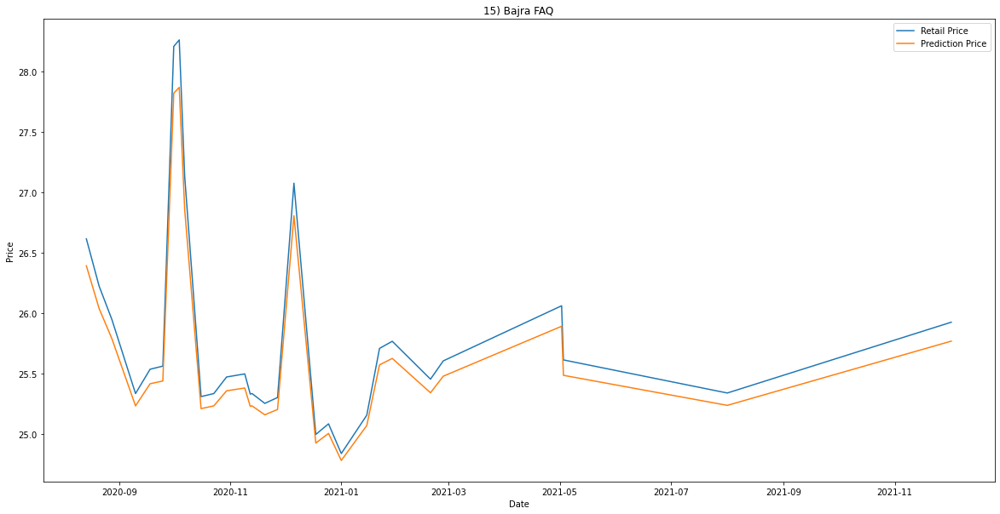

Accuracy :  0.9488330985842188
     Retail Price       Date  Prediction Price
401     46.344828 2020-08-14         45.815590
615     45.672414 2020-08-21         45.244125
835     46.983333 2020-08-28         46.355182
260     45.048387 2020-09-10         44.710841
525     45.426230 2020-09-18         45.034077
744     47.000000 2020-09-25         46.369226
268     44.045455 2020-10-01         43.847848
276     41.186047 2020-10-04         41.347863
285     45.200000 2020-10-07         44.840667
467     45.904762 2020-10-16         45.441963
682     46.190476 2020-10-23         45.684702
902     44.983333 2020-10-30         44.655084
318     46.491803 2020-11-09         45.940061
326     43.868852 2020-11-12         43.695136
382     45.209677 2020-11-13         44.848948
594     45.161290 2020-11-20         44.807536
814     44.968254 2020-11-27         44.642156
340     46.639344 2020-12-06         46.064852
533     43.573770 2020-12-18         43.439473
753     42.885246 2020-12-25 

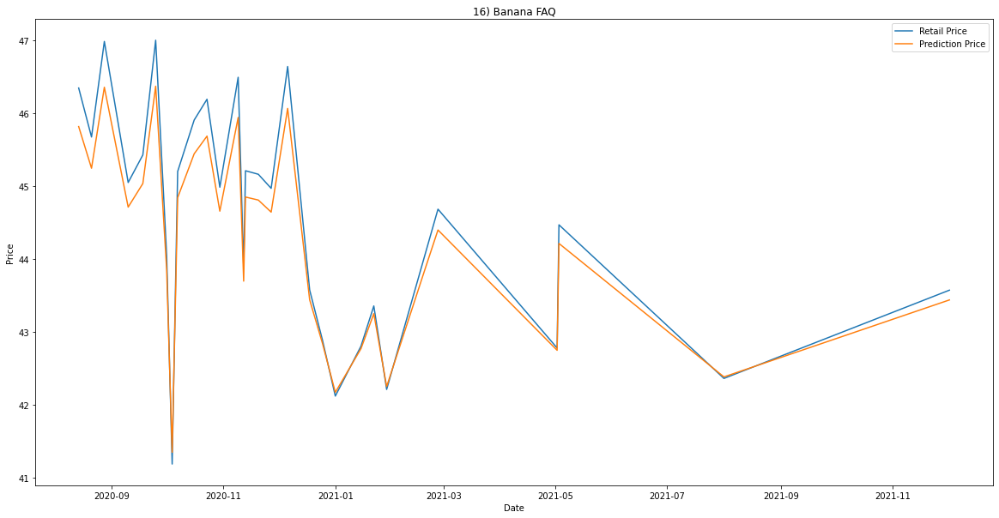

Accuracy :  0.7018004250815508
     Retail Price       Date  Prediction Price
387      7.698113 2020-08-14          7.674102
593      8.075472 2020-08-21          8.022470
811      8.145455 2020-08-28          8.087049
251      8.660714 2020-09-10          8.562250
506      8.218182 2020-09-18          8.154151
720      8.107143 2020-09-25          8.051697
259      7.881356 2020-10-01          7.843299
267      7.585366 2020-10-04          7.569968
275      7.660000 2020-10-07          7.638903
450      8.649123 2020-10-16          8.551565
658      8.649123 2020-10-23          8.551565
878      8.092593 2020-10-30          8.038270
307      8.187500 2020-11-09          8.125844
315      8.272727 2020-11-12          8.204471
369      8.267857 2020-11-13          8.199979
573      8.267857 2020-11-20          8.199979
790      8.298246 2020-11-27          8.228011
328      8.053571 2020-12-06          8.002259
514      8.272727 2020-12-18          8.204471
729      8.327273 2020-12-25 

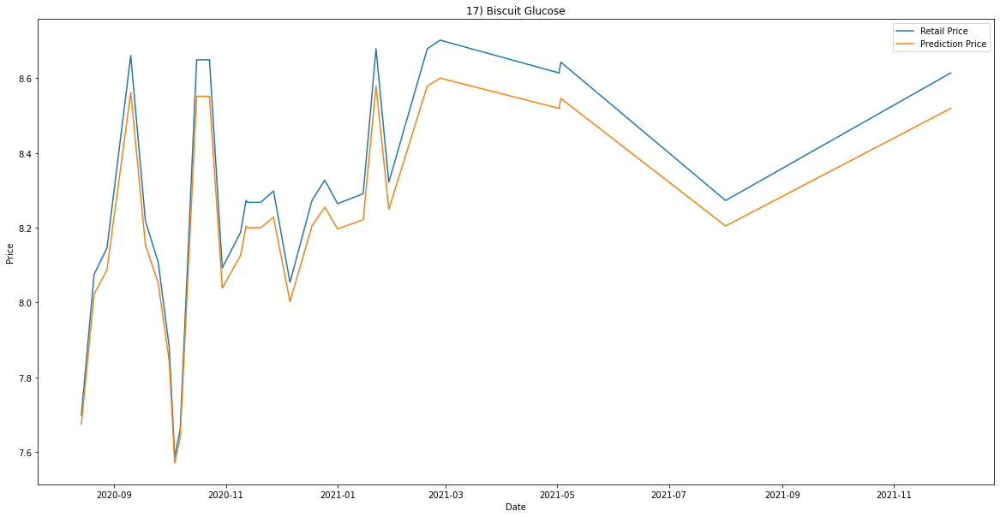

Accuracy :  0.5139740197364497
     Retail Price       Date  Prediction Price
391    142.254237 2020-08-14        117.420106
593    136.086207 2020-08-21        117.463957
789    136.300000 2020-08-28        117.472479
253    118.419355 2020-09-10        114.257144
511    126.852459 2020-09-18        116.405052
710    125.838710 2020-09-25        116.206437
261    102.045455 2020-10-01        106.894087
269    128.214286 2020-10-04        116.646206
278    142.836364 2020-10-07        117.385047
455    116.174603 2020-10-16        113.495903
656    115.079365 2020-10-23        113.095667
846    111.950000 2020-10-30        111.848236
309    132.548387 2020-11-09        117.217925
317    111.508197 2020-11-12        111.659757
372    112.419355 2020-11-13        112.045121
574    110.403226 2020-11-20        111.175001
771    111.476190 2020-11-27        111.645984
331    142.000000 2020-12-06        117.433749
519    113.000000 2020-12-18        112.283914
718    114.442623 2020-12-25 

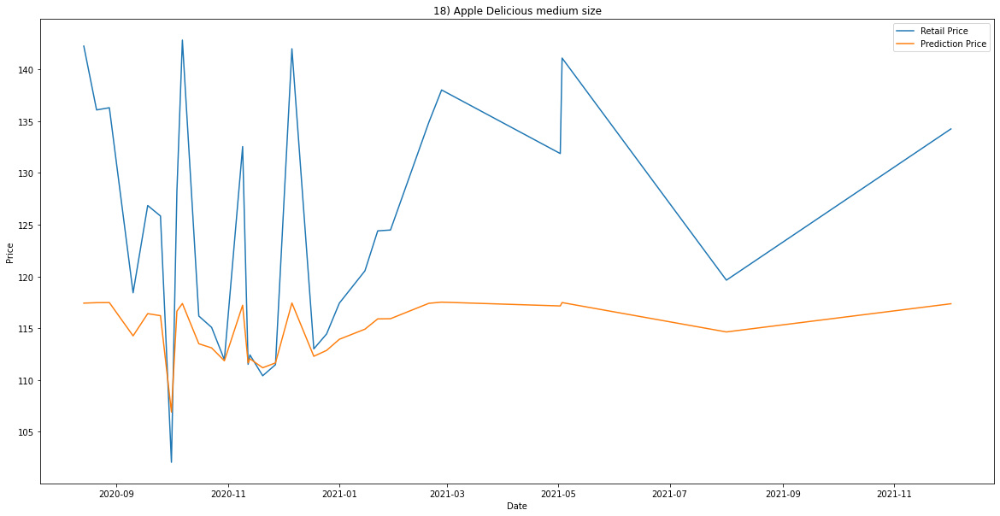

Accuracy :  0.9264952311029038
     Retail Price       Date  Prediction Price
387     53.813559 2020-08-14         52.537042
593     52.114754 2020-08-21         51.269311
811     55.016393 2020-08-28         53.414657
251     55.750000 2020-09-10         53.941728
506     53.158730 2020-09-18         52.052282
720     55.765625 2020-09-25         53.952886
259     49.441176 2020-10-01         49.207766
267     49.704545 2020-10-04         49.414426
275     50.392857 2020-10-07         49.950844
450     55.569231 2020-10-16         53.812429
658     55.492308 2020-10-23         53.757293
878     52.357143 2020-10-30         51.452208
307     55.333333 2020-11-09         53.643130
315     51.671875 2020-11-12         50.933407
369     53.623077 2020-11-13         52.396537
573     53.346154 2020-11-20         52.191531
790     53.696970 2020-11-27         52.451092
328     53.396825 2020-12-06         52.229108
514     51.242188 2020-12-18         50.605380
729     51.320312 2020-12-25 

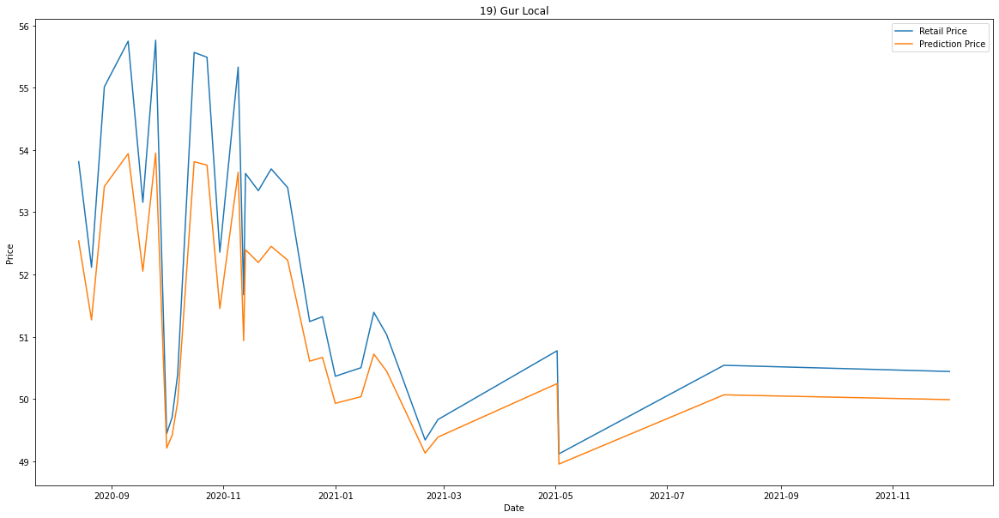

Accuracy :  0.9782283467246643
     Retail Price       Date  Prediction Price
390     34.769231 2020-08-14         35.018717
598     34.589744 2020-08-21         34.847584
816     33.650000 2020-08-28         33.950275
253     34.025641 2020-09-10         34.309215
509     33.666667 2020-09-18         33.966208
725     33.794872 2020-09-25         34.088747
261     34.317073 2020-10-01         34.587451
269     33.800000 2020-10-04         34.093648
277     34.105263 2020-10-07         34.385252
453     33.974359 2020-10-16         34.260233
663     33.743590 2020-10-23         34.039736
883     33.894737 2020-10-30         34.184170
309     33.358974 2020-11-09         33.671952
317     32.815789 2020-11-12         33.151927
371     33.666667 2020-11-13         33.966208
577     32.846154 2020-11-20         33.181015
795     32.925000 2020-11-27         33.256538
330     33.923077 2020-12-06         34.211245
517     32.894737 2020-12-18         33.227552
734     32.692308 2020-12-25 

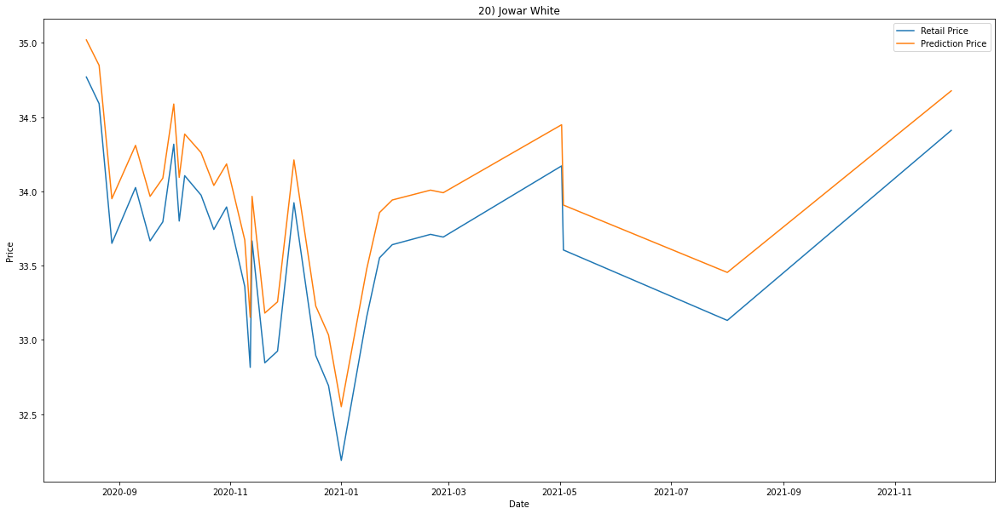

Accuracy :  0.9205801746408745
     Retail Price       Date  Prediction Price
387     25.541667 2020-08-14         25.600586
593     25.270000 2020-08-21         25.345279
811     25.060000 2020-08-28         25.147807
251     24.333333 2020-09-10         24.463710
506     24.755102 2020-09-18         24.860918
720     24.960000 2020-09-25         25.053738
259     27.759259 2020-10-01         27.678078
267     27.371429 2020-10-04         27.315606
275     26.244444 2020-10-07         26.260238
450     24.450980 2020-10-16         24.574547
658     24.411765 2020-10-23         24.537605
878     24.312500 2020-10-30         24.444079
307     25.060000 2020-11-09         25.147807
315     24.877551 2020-11-12         24.976161
369     24.540000 2020-11-13         24.658393
573     24.460000 2020-11-20         24.583043
790     24.568627 2020-11-27         24.685353
328     26.686275 2020-12-06         26.674356
514     24.938776 2020-12-18         25.033769
729     25.081633 2020-12-25 

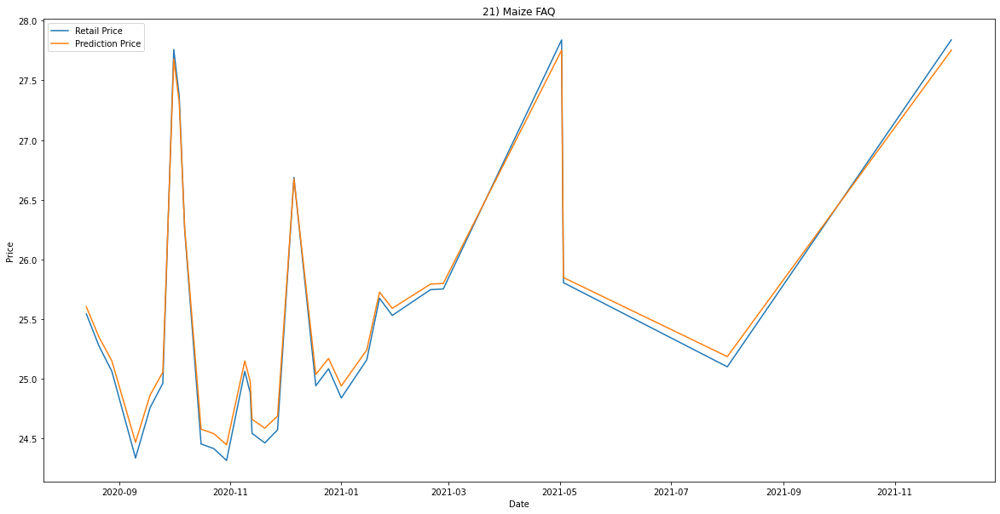

Accuracy :  0.8755663500318668
     Retail Price       Date  Prediction Price
389     76.932203 2020-08-14         77.832474
595     76.866667 2020-08-21         77.775972
813     77.098361 2020-08-28         77.975618
253     80.126984 2020-09-10         80.556957
508     78.196721 2020-09-18         78.917882
722     79.349206 2020-09-25         79.899111
261     70.500000 2020-10-01         72.172490
269     72.659091 2020-10-04         74.097825
277     76.175439 2020-10-07         77.178539
452     80.875000 2020-10-16         81.186293
660     80.640625 2020-10-23         80.989457
880     79.721311 2020-10-30         80.214278
309     78.142857 2020-11-09         78.871834
317     79.451613 2020-11-12         79.985928
371     80.095238 2020-11-13         80.530175
575     80.142857 2020-11-20         80.570345
792     80.468750 2020-11-27         80.844905
330     77.746032 2020-12-06         78.532080
516     78.935484 2020-12-18         79.547751
731     79.483871 2020-12-25 

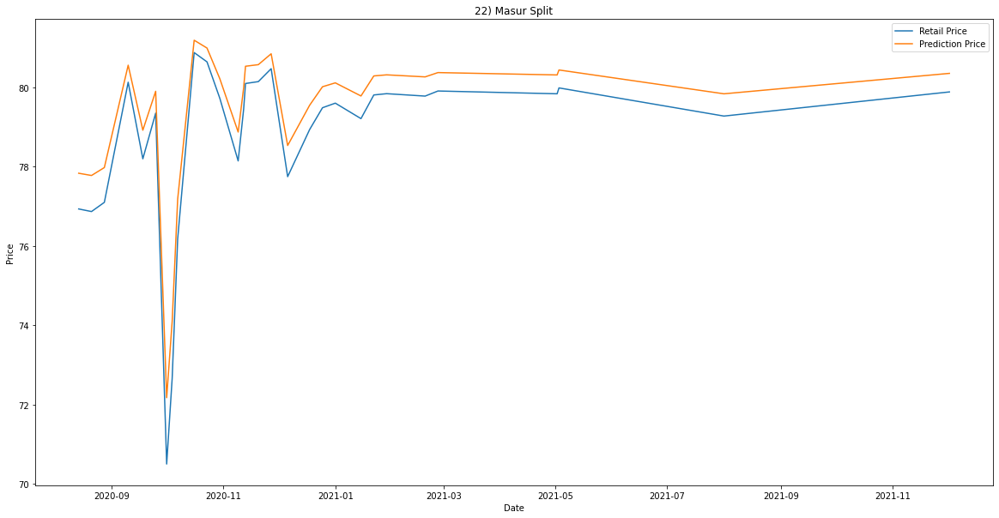

Accuracy :  0.8860482624830791
     Retail Price       Date  Prediction Price
407    607.666667 2020-08-14        621.966714
620    603.771930 2020-08-21        619.736883
843    603.813559 2020-08-28        619.761563
263    597.295082 2020-09-10        615.680508
531    603.166667 2020-09-18        619.376021
749    595.163934 2020-09-25        614.253865
272    525.923077 2020-10-01        549.363855
280    575.689655 2020-10-04        599.285855
288    596.320755 2020-10-07        615.033798
472    595.238095 2020-10-16        614.304256
687    593.253968 2020-10-23        612.937775
910    595.833333 2020-10-30        614.706770
322    603.629032 2020-11-09        619.652031
330    610.737705 2020-11-12        623.610280
386    601.774194 2020-11-13        618.531395
599    603.548387 2020-11-20        619.604050
820    602.666667 2020-11-27        619.075045
343    600.172414 2020-12-06        617.535181
539    611.721311 2020-12-18        624.114912
758    614.262295 2020-12-25 

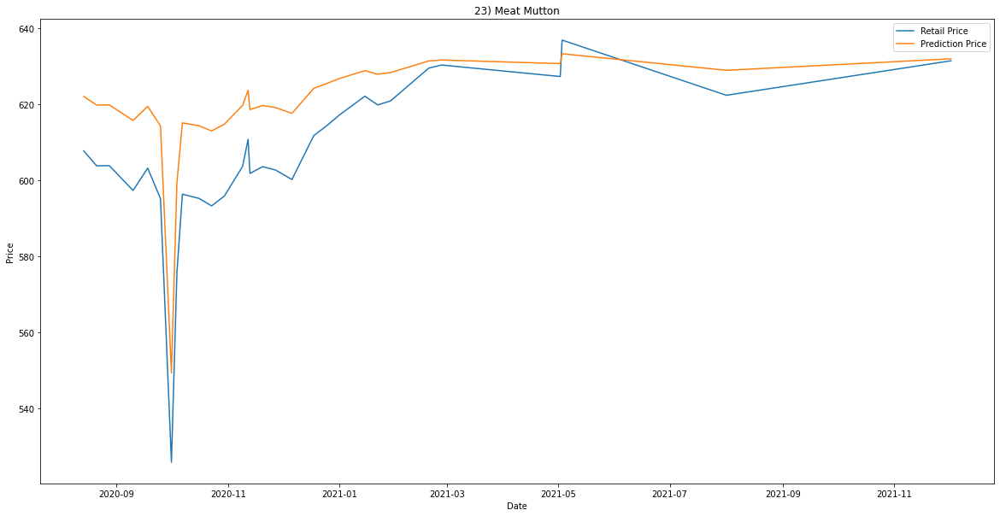

Accuracy :  0.9929994803729015
     Retail Price       Date  Prediction Price
407     51.474576 2020-08-14         51.885360
620     51.389831 2020-08-21         51.811545
843     51.639344 2020-08-28         52.028726
263     51.645161 2020-09-10         52.033784
531     51.065574 2020-09-18         51.528630
749     51.806452 2020-09-25         52.173925
272     49.784615 2020-10-01         50.403536
280     49.930233 2020-10-04         50.532032
288     50.964286 2020-10-07         51.440099
472     51.603175 2020-10-16         51.997271
687     51.571429 2020-10-23         51.969656
910     51.466667 2020-10-30         51.878473
322     51.612903 2020-11-09         52.005733
330     51.573770 2020-11-12         51.971693
386     51.564516 2020-11-13         51.963642
599     51.612903 2020-11-20         52.005733
820     51.587302 2020-11-27         51.983465
343     51.403226 2020-12-06         51.823216
539     51.524590 2020-12-18         51.928898
758     51.442623 2020-12-25 

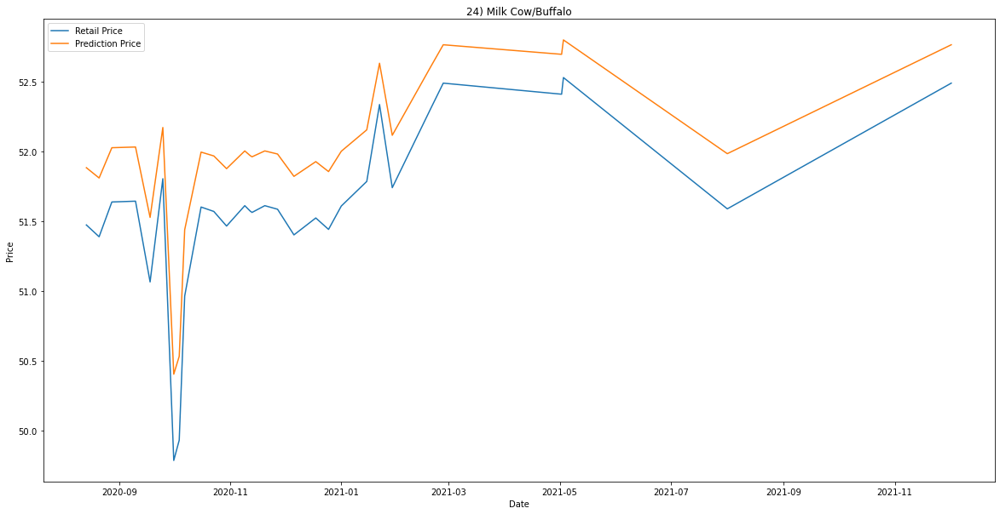

Accuracy :  0.9910115009315585
     Retail Price       Date  Prediction Price
407     49.075472 2020-08-14         49.168056
620     48.826923 2020-08-21         48.963155
843     49.092593 2020-08-28         49.182147
263     49.236364 2020-09-10         49.300367
531     48.563636 2020-09-18         48.745438
749     49.109091 2020-09-25         49.195724
272     48.084746 2020-10-01         48.347680
280     47.473684 2020-10-04         47.836864
288     48.200000 2020-10-07         48.443615
472     49.107143 2020-10-16         49.194121
687     49.071429 2020-10-23         49.164727
910     49.037037 2020-10-30         49.136411
322     48.927273 2020-11-09         49.045956
330     49.200000 2020-11-12         49.270485
386     49.142857 2020-11-13         49.223502
599     49.178571 2020-11-20         49.252870
820     49.192982 2020-11-27         49.264717
343     48.800000 2020-12-06         48.940923
539     49.200000 2020-12-18         49.270485
758     49.000000 2020-12-25 

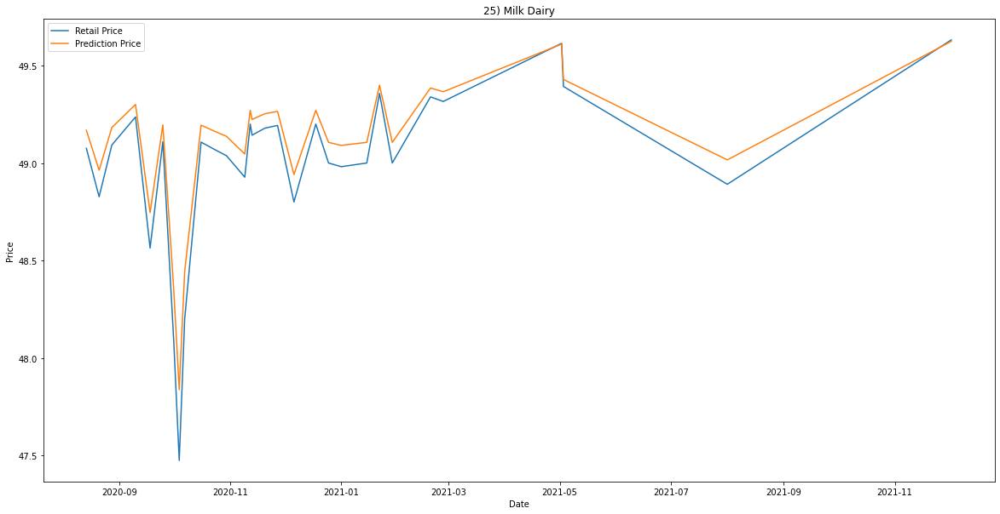

Accuracy :  0.8888530085300909
     Retail Price       Date  Prediction Price
395     23.811321 2020-08-14         23.806851
604     23.830189 2020-08-21         23.824548
824     24.072727 2020-08-28         24.051963
255     24.767857 2020-09-10         24.702973
516     24.490909 2020-09-18         24.443741
733     24.750000 2020-09-25         24.686264
264     24.033333 2020-10-01         24.015035
272     23.210526 2020-10-04         23.242903
280     23.980000 2020-10-07         23.965034
459     24.964912 2020-10-16         24.887312
670     24.982456 2020-10-23         24.903719
891     24.833333 2020-10-30         24.764234
312     24.571429 2020-11-09         24.519128
320     24.672727 2020-11-12         24.613949
375     24.964286 2020-11-13         24.886726
583     24.928571 2020-11-20         24.853323
803     24.964912 2020-11-27         24.887312
333     24.339286 2020-12-06         24.301739
524     24.727273 2020-12-18         24.664996
742     24.781818 2020-12-25 

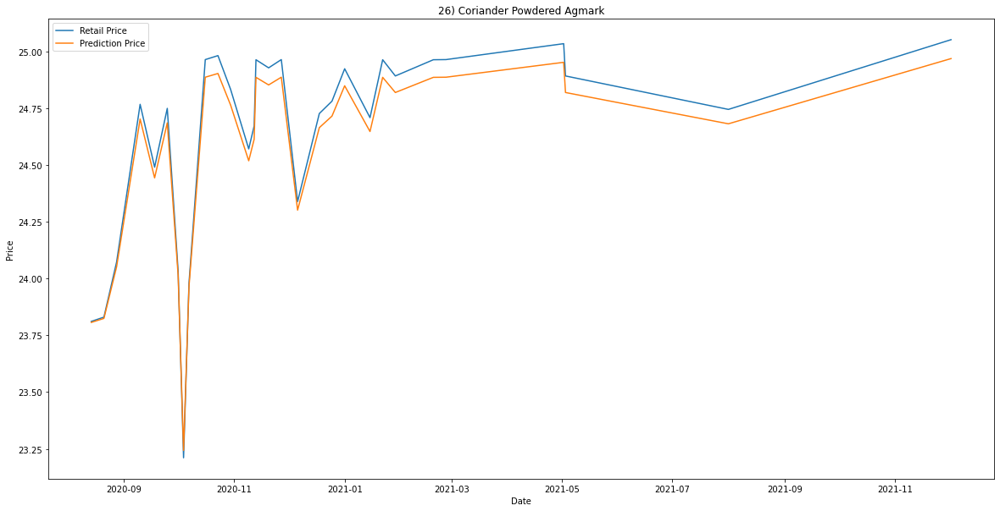

Accuracy :  0.9393793863976404
     Retail Price       Date  Prediction Price
395    248.800000 2020-08-14        248.612226
604    246.734694 2020-08-21        247.132137
824    246.862745 2020-08-28        247.224801
255    247.549020 2020-09-10        247.719407
516    248.803922 2020-09-18        248.615007
733    249.500000 2020-09-25        249.106840
264    253.333333 2020-10-01        251.751423
272    240.263158 2020-10-04        242.297519
280    250.957447 2020-10-07        250.125129
459    248.750000 2020-10-16        248.576760
670    248.557692 2020-10-23        248.440181
891    247.900000 2020-10-30        247.971047
312    248.250000 2020-11-09        248.221094
320    240.470588 2020-11-12        242.457022
375    247.788462 2020-11-13        247.891175
583    247.352941 2020-11-20        247.578438
803    248.773585 2020-11-27        248.593492
333    251.470588 2020-12-06        250.479924
524    240.098039 2020-12-18        242.170340
742    239.607843 2020-12-25 

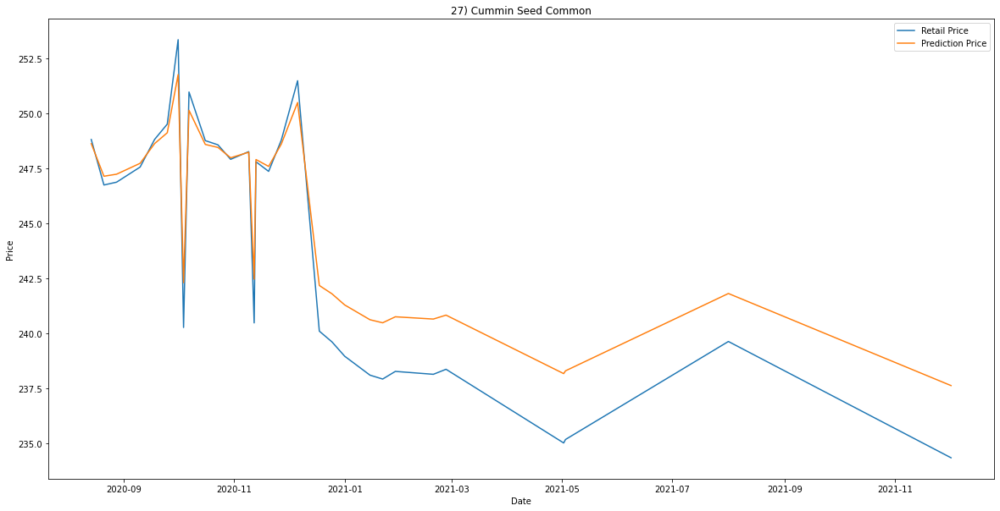

Accuracy :  0.980878881249132
     Retail Price       Date  Prediction Price
407    209.673913 2020-08-14        206.649942
620    206.250000 2020-08-21        204.217188
843    206.666667 2020-08-28        204.516326
263    209.096154 2020-09-10        206.243500
531    208.060000 2020-09-18        205.510441
749    206.960784 2020-09-25        204.726969
272    196.929825 2020-10-01        197.306091
280    192.307692 2020-10-04        193.725912
288    196.222222 2020-10-07        196.764463
472    204.037037 2020-10-16        202.614191
687    204.407407 2020-10-23        202.884139
910    201.431373 2020-10-30        200.696232
322    208.384615 2020-11-09        205.740672
330    206.576923 2020-11-12        204.451969
386    204.962264 2020-11-13        203.287303
599    204.584906 2020-11-20        203.013274
820    203.944444 2020-11-27        202.546599
343    206.900000 2020-12-06        204.683471
539    204.673077 2020-12-18        203.077364
758    206.627451 2020-12-25  

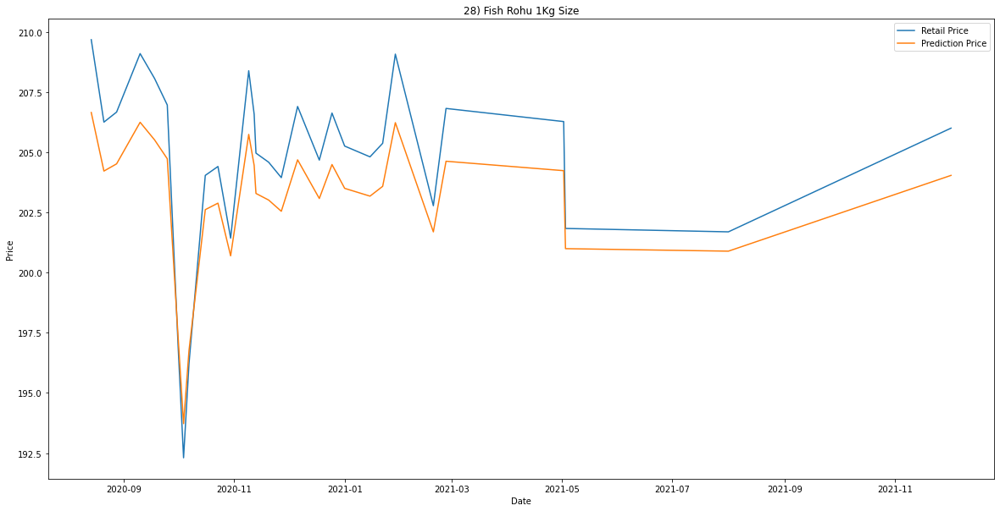

Accuracy :  0.986266293975974
     Retail Price       Date  Prediction Price
407    521.714286 2020-08-14        524.205104
620    522.517857 2020-08-21        524.781879
843    519.824561 2020-08-28        522.834058
263    525.982759 2020-09-10        527.225063
531    527.966102 2020-09-18        528.590697
749    518.965517 2020-09-25        522.204101
272    515.562500 2020-10-01        519.668598
280    538.785714 2020-10-04        535.590386
288    532.754717 2020-10-07        531.785011
472    525.881356 2020-10-16        527.154590
687    525.542373 2020-10-23        526.918547
910    520.724138 2020-10-30        523.489272
322    527.586207 2020-11-09        528.331013
330    529.396552 2020-11-12        529.560351
386    525.966102 2020-11-13        527.213491
599    525.932203 2020-11-20        527.189936
820    526.583333 2020-11-27        527.641159
343    529.672414 2020-12-06        529.745853
539    528.189655 2020-12-18        528.743089
758    528.620690 2020-12-25  

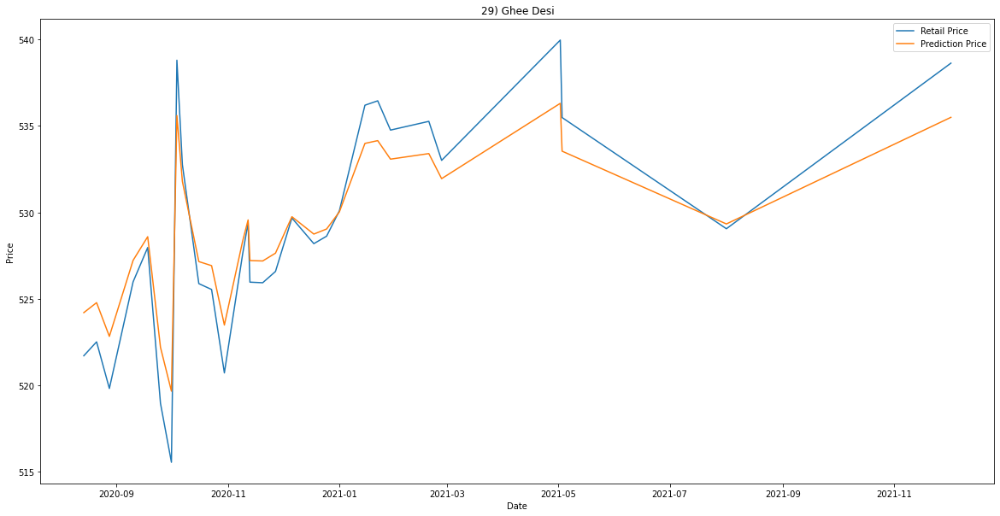

Accuracy :  0.7514729841713633
     Retail Price       Date  Prediction Price
389     69.482759 2020-08-14         69.381787
595     70.135593 2020-08-21         69.884413
813     70.016667 2020-08-28         69.793204
253     74.934426 2020-09-10         73.431908
508     72.311475 2020-09-18         71.525186
722     72.786885 2020-09-25         71.876579
261     70.392308 2020-10-01         70.080758
269     72.068182 2020-10-04         71.344371
277     70.035714 2020-10-07         69.807823
452     75.580645 2020-10-16         73.889611
660     76.838710 2020-10-23         74.766896
880     77.183333 2020-10-30         75.004024
309     71.754098 2020-11-09         71.109956
317     76.516667 2020-11-12         74.544063
371     77.524590 2020-11-13         75.237481
575     77.573770 2020-11-20         75.271015
792     77.338710 2020-11-27         75.110486
330     71.774194 2020-12-06         71.124987
516     75.737705 2020-12-18         74.000129
731     75.564516 2020-12-25 

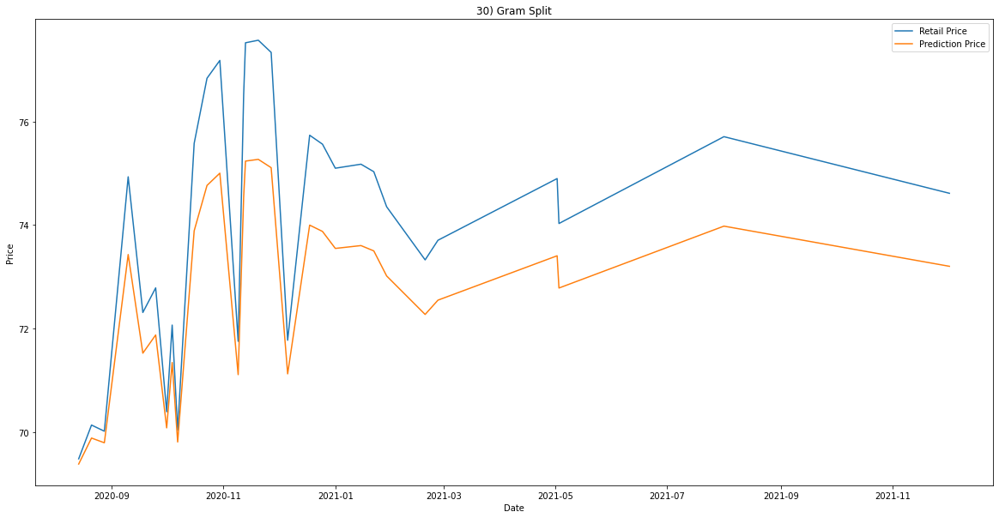

Accuracy :  0.6474617222516904
     Retail Price       Date  Prediction Price
389     64.690909 2020-08-14         64.283537
595     64.421053 2020-08-21         64.085059
813     65.017544 2020-08-28         64.522525
253     68.915254 2020-09-10         67.267881
508     66.172414 2020-09-18         65.356491
722     66.950000 2020-09-25         65.908300
261     63.857143 2020-10-01         63.667294
269     66.102564 2020-10-04         65.306539
277     63.886792 2020-10-07         63.689361
452     69.100000 2020-10-16         67.393096
660     69.800000 2020-10-23         67.863470
880     69.551724 2020-10-30         67.697374
309     65.898305 2020-11-09         65.160106
317     69.525424 2020-11-12         67.679732
371     70.075000 2020-11-13         68.046498
575     70.016667 2020-11-20         68.007757
792     69.819672 2020-11-27         67.876596
330     65.635593 2020-12-06         64.970976
516     69.103448 2020-12-18         67.395429
731     68.879310 2020-12-25 

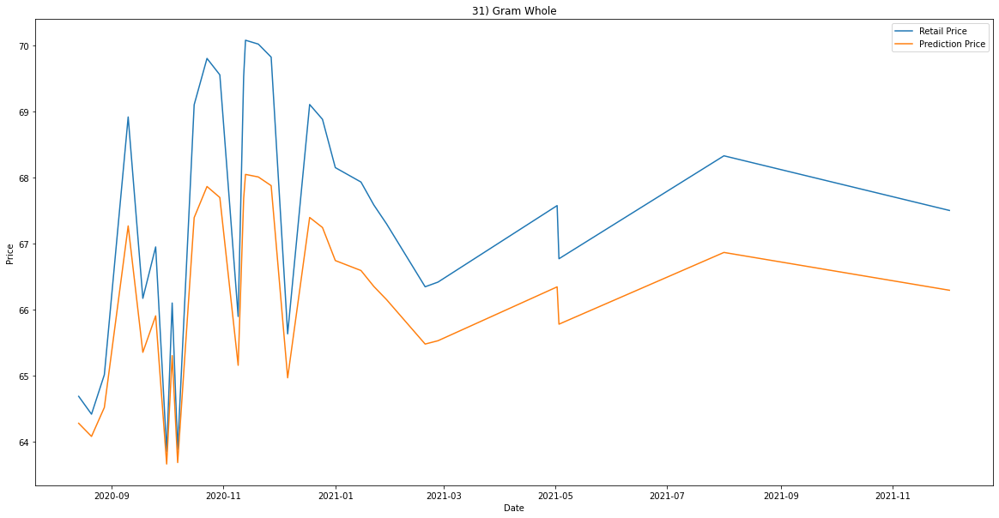

Accuracy :  0.9257237286328283
     Retail Price       Date  Prediction Price
397    335.500000 2020-08-14        331.802167
598    329.090909 2020-08-21        327.125836
797    331.739130 2020-08-28        329.059230
256    326.666667 2020-09-10        325.353806
517    336.000000 2020-09-18        332.166689
715    330.454545 2020-09-25        328.121651
265    310.600000 2020-10-01        313.513159
273    257.272727 2020-10-04        271.133243
281    328.235294 2020-10-07        326.500682
460    356.521739 2020-10-16        347.165829
661    349.565217 2020-10-23        342.065126
854    358.863636 2020-10-30        348.889471
313    325.909091 2020-11-09        324.799526
321    349.090909 2020-11-12        341.718222
376    358.409091 2020-11-13        348.554630
579    354.545455 2020-11-20        345.714044
777    353.478261 2020-11-27        344.931045
334    347.045455 2020-12-06        340.223206
525    349.090909 2020-12-18        341.718222
723    349.090909 2020-12-25 

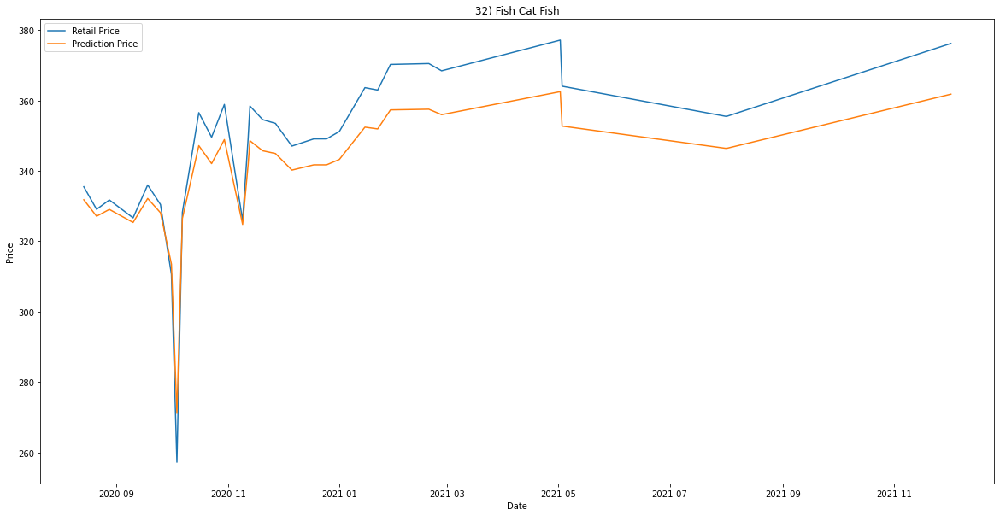

Accuracy :  0.9460304220111347
     Retail Price       Date  Prediction Price
397    518.000000 2020-08-14        503.572857
598    506.538462 2020-08-21        497.766774
797    503.571429 2020-08-28        496.065056
256    476.851852 2020-09-10        477.618736
517    525.357143 2020-09-18        506.608862
715    502.586207 2020-09-25        495.482916
265    454.558824 2020-10-01        458.940722
273    567.333333 2020-10-04        511.900644
281    542.083333 2020-10-07        511.291416
460    471.379310 2020-10-16        473.257633
661    467.413793 2020-10-23        469.997913
854    483.269231 2020-10-30        482.508087
313    506.333333 2020-11-09        497.651645
321    486.785714 2020-11-12        485.074705
376    493.965517 2020-11-13        490.044010
579    478.620690 2020-11-20        478.991686
777    481.000000 2020-11-27        480.808529
334    503.392857 2020-12-06        495.960167
525    483.214286 2020-12-18        482.467329
723    504.285714 2020-12-25 

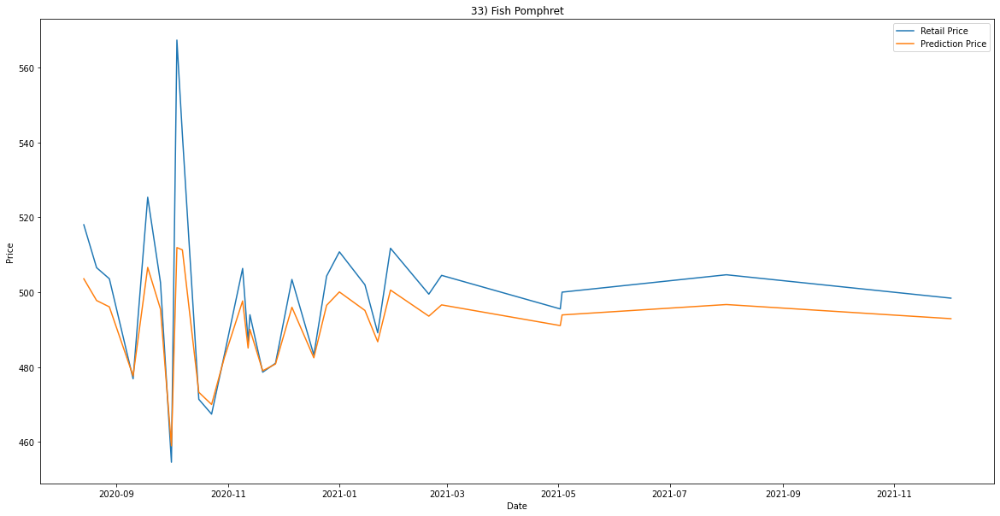

Accuracy :  0.9661228742586226
     Retail Price       Date  Prediction Price
395    654.912281 2020-08-14        651.334106
604    650.701754 2020-08-21        647.366887
824    652.118644 2020-08-28        648.698916
255    646.166667 2020-09-10        643.124196
516    648.050847 2020-09-18        644.883015
733    651.750000 2020-09-25        648.352057
264    673.828125 2020-10-01        669.468878
272    630.357143 2020-10-04        628.593480
280    660.094340 2020-10-07        656.252717
459    652.295082 2020-10-16        648.865000
670    651.885246 2020-10-23        648.479287
891    650.775862 2020-10-30        647.436481
312    654.000000 2020-11-09        650.472283
320    652.796610 2020-11-12        649.337354
375    650.250000 2020-11-13        646.942834
583    650.333333 2020-11-20        647.021034
803    649.344262 2020-11-27        646.093577
333    666.864407 2020-12-06        662.735979
524    652.203390 2020-12-18        648.778683
742    652.372881 2020-12-25 

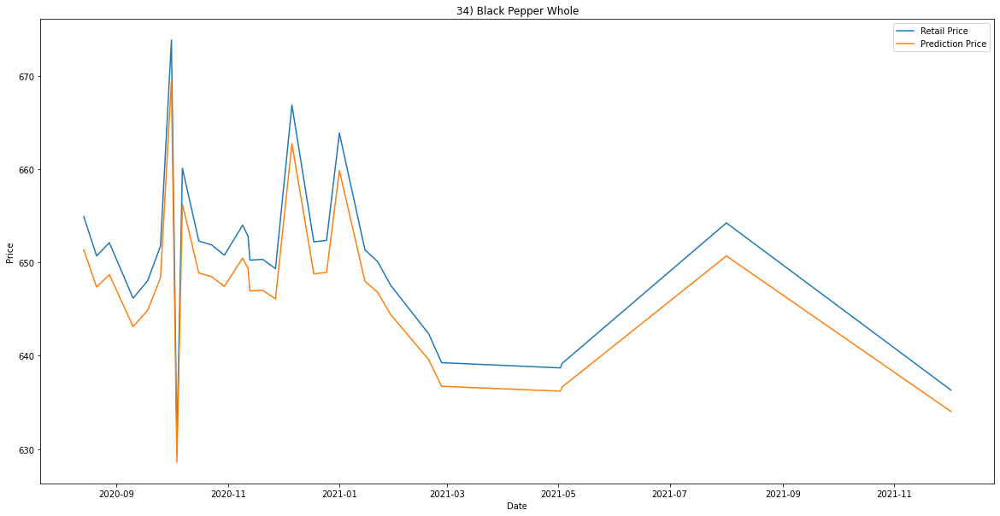

Accuracy :  0.9854612220347596
     Retail Price       Date  Prediction Price
387     30.070175 2020-08-14         30.505951
593     30.333333 2020-08-21         30.759450
811     30.813559 2020-08-28         31.221494
251     30.950000 2020-09-10         31.352638
506     30.118644 2020-09-18         30.552656
720     30.850000 2020-09-25         31.256526
259     28.809524 2020-10-01         29.288614
267     29.024390 2020-10-04         29.496441
275     30.092593 2020-10-07         30.527553
450     30.836066 2020-10-16         31.243131
658     30.836066 2020-10-23         31.243131
878     30.103448 2020-10-30         30.538014
307     30.783333 2020-11-09         31.192434
315     30.338983 2020-11-12         30.764890
369     30.383333 2020-11-13         30.807590
573     30.416667 2020-11-20         30.839680
790     30.573770 2020-11-27         30.990874
328     30.423729 2020-12-06         30.846478
514     30.288136 2020-12-18         30.715926
729     30.423729 2020-12-25 

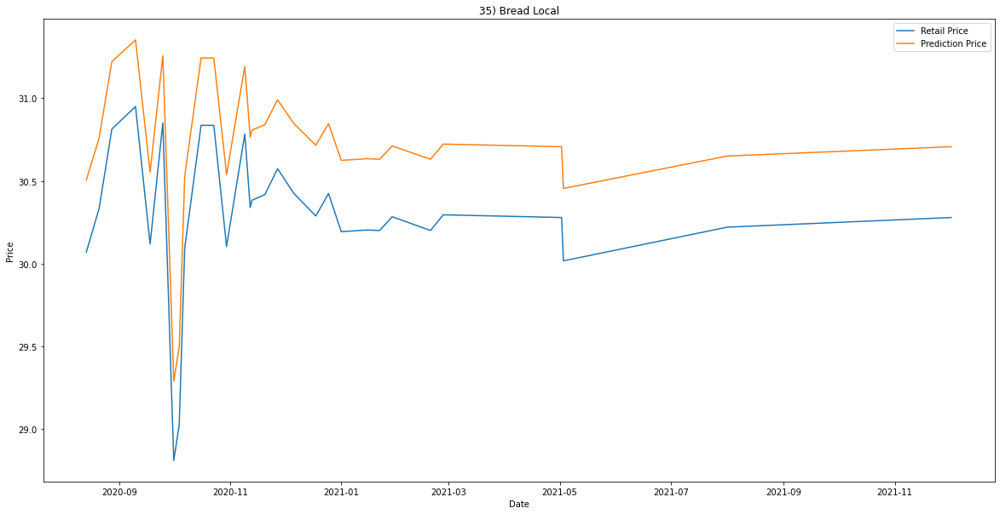

Accuracy :  0.732204744597877
     Retail Price       Date  Prediction Price
401     36.067797 2020-08-14         34.744320
615     36.559322 2020-08-21         35.145567
835     39.229508 2020-08-28         37.299182
260     42.725806 2020-09-10         40.051255
525     39.524590 2020-09-18         37.534446
744     41.387097 2020-09-25         39.006695
268     34.000000 2020-10-01         33.040140
276     30.604651 2020-10-04         30.186049
285     32.196429 2020-10-07         31.532627
467     42.714286 2020-10-16         40.042315
682     42.730159 2020-10-23         40.054633
902     41.733333 2020-10-30         39.277954
318     40.032258 2020-11-09         37.937917
326     34.590164 2020-11-12         33.529177
382     40.370968 2020-11-13         38.206203
594     39.951613 2020-11-20         37.873933
814     38.047619 2020-11-27         36.351413
340     31.096774 2020-12-06         30.603963
533     33.098361 2020-12-18         32.288944
753     32.393443 2020-12-25  

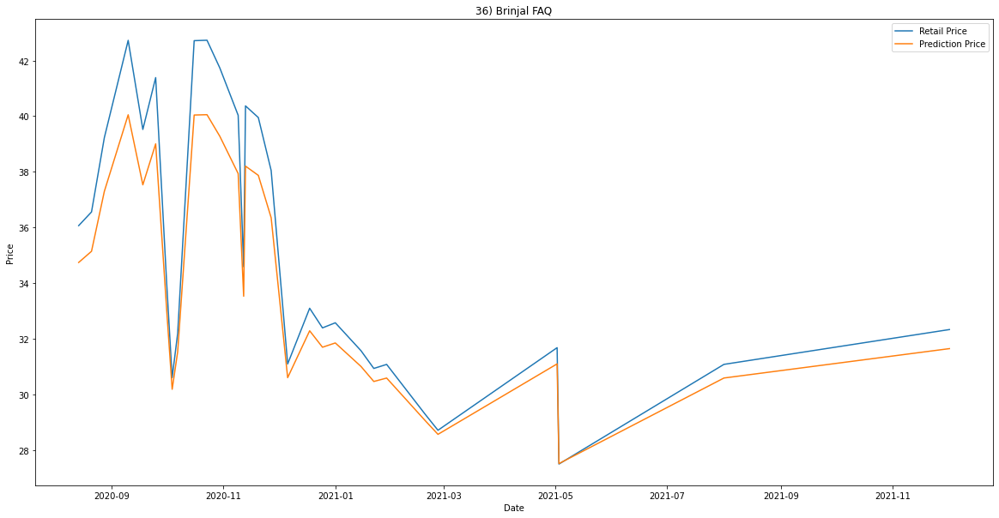

Accuracy :  0.8306946536067401
     Retail Price       Date  Prediction Price
407     46.827273 2020-08-14         47.174221
620     46.790909 2020-08-21         47.140398
843     46.883929 2020-08-28         47.226913
263     47.198276 2020-09-10         47.519139
531     47.359649 2020-09-18         47.669072
749     47.370690 2020-09-25         47.679328
272     46.483607 2020-10-01         46.854450
280     47.562500 2020-10-04         47.857460
288     47.153846 2020-10-07         47.477849
472     47.211864 2020-10-16         47.531767
687     47.211864 2020-10-23         47.531767
910     47.276786 2020-10-30         47.592090
322     47.370690 2020-11-09         47.679328
330     47.745614 2020-11-12         48.027439
386     47.232759 2020-11-13         47.551182
599     47.318966 2020-11-20         47.631278
820     47.296610 2020-11-27         47.610509
343     47.060345 2020-12-06         47.390941
539     47.657895 2020-12-18         47.946021
758     47.745614 2020-12-25 

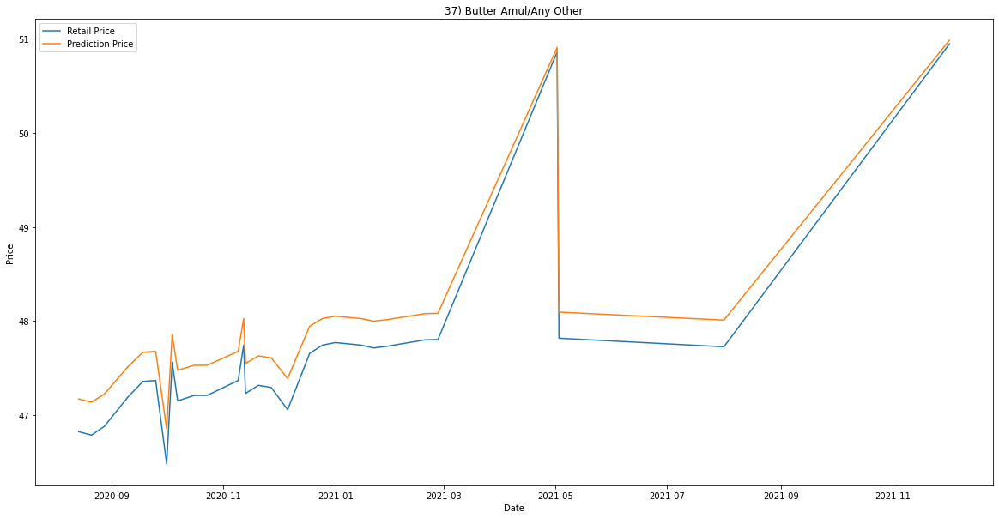

Accuracy :  0.6880894559783359
     Retail Price       Date  Prediction Price
407    191.107143 2020-08-14        179.270954
620    183.392857 2020-08-21        176.035745
843    184.862069 2020-08-28        176.698754
263    191.750000 2020-09-10        179.512944
531    190.389831 2020-09-18        178.995892
749    189.016667 2020-09-25        178.454525
272    179.138462 2020-10-01        173.993079
280    126.093750 2020-10-04        134.595914
288    195.358491 2020-10-07        180.791637
472    190.612903 2020-10-16        179.082001
687    190.241935 2020-10-23        178.938519
910    189.491525 2020-10-30        178.643935
322    191.163934 2020-11-09        179.292504
330    183.466667 2020-11-12        176.069575
386    186.983607 2020-11-13        177.617394
599    184.590164 2020-11-20        176.577703
820    183.516129 2020-11-27        176.092215
343    202.413793 2020-12-06        182.898101
539    184.916667 2020-12-18        176.722970
758    184.100000 2020-12-25 

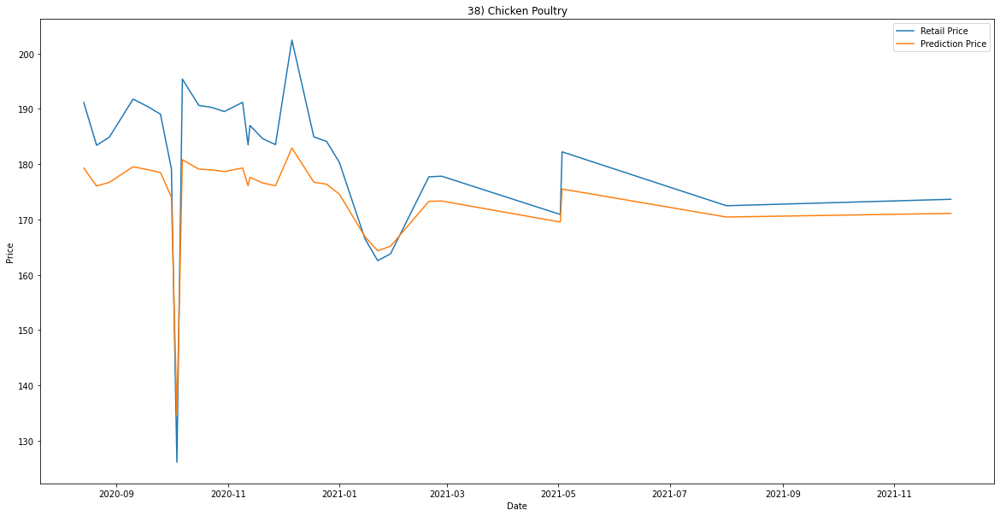

Accuracy :  0.9178035531042286
     Retail Price       Date  Prediction Price
401    189.000000 2020-08-14        192.230791
615    183.960000 2020-08-21        187.576174
835    183.038462 2020-08-28        186.711091
260    188.056604 2020-09-10        191.369672
525    184.134615 2020-09-18        187.739618
744    188.075472 2020-09-25        191.386942
268    174.245283 2020-10-01        178.257926
276    195.750000 2020-10-04        198.247053
285    197.340426 2020-10-07        199.625843
467    186.185185 2020-10-16        189.647475
682    186.518519 2020-10-23        189.955573
902    189.313725 2020-10-30        192.516089
318    185.679245 2020-11-09        189.178739
326    194.215686 2020-11-12        196.902560
382    193.096154 2020-11-13        195.912812
594    194.596154 2020-11-20        197.237255
814    191.113208 2020-11-27        194.142076
340    185.584906 2020-12-06        189.091192
533    193.882353 2020-12-18        196.608632
753    190.176471 2020-12-25 

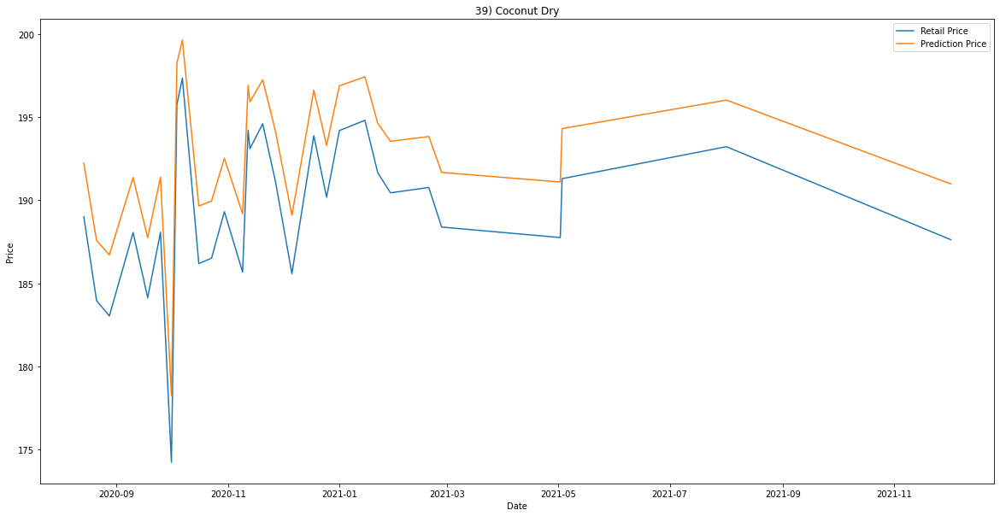

Accuracy :  0.617864866815284
     Retail Price       Date  Prediction Price
401    826.814815 2020-08-14        899.519439
615    902.000000 2020-08-21        969.538388
835    881.214286 2020-08-28        961.505317
260   1049.656250 2020-09-10        779.251622
525    893.851852 2020-09-18        967.574273
744    910.137931 2020-09-25        969.932148
268    967.448276 2020-10-01        928.970398
276    954.500000 2020-10-04        944.561632
285    855.961538 2020-10-07        939.195910
467   1050.906250 2020-10-16        776.769366
682   1052.468750 2020-10-23        773.677222
902   1028.633333 2020-10-30        821.544760
318    879.071429 2020-11-09        960.123200
326   1032.466667 2020-11-12        813.820796
382   1012.548387 2020-11-13        853.386983
594   1012.548387 2020-11-20        853.386983
814   1012.870968 2020-11-27        852.762571
340    896.035714 2020-12-06        968.253137
533   1035.133333 2020-12-18        808.437434
753   1036.466667 2020-12-25  

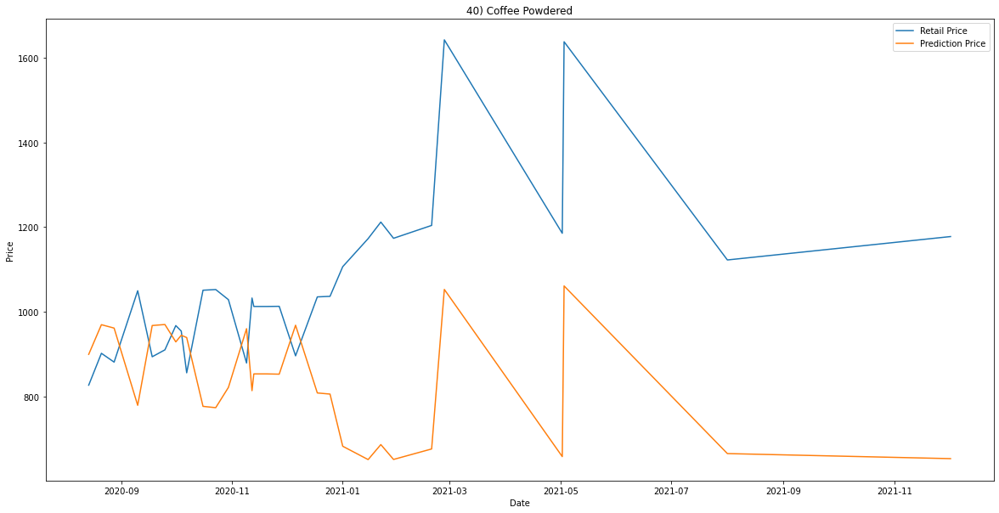

Accuracy :  0.7723894732243656
     Retail Price       Date  Prediction Price
391     31.689655 2020-08-14         31.859154
593     31.431034 2020-08-21         31.609123
789     31.816667 2020-08-28         31.982015
253     33.700000 2020-09-10         33.809032
511     32.050000 2020-09-18         32.207842
710     33.475410 2020-09-25         33.590651
261     30.569231 2020-10-01         30.777311
269     27.418605 2020-10-04         27.754744
278     32.127273 2020-10-07         32.282662
455     34.049180 2020-10-16         34.148828
656     34.360656 2020-10-23         34.452206
846     33.189655 2020-10-30         33.312992
309     32.737705 2020-11-09         32.874299
317     33.474576 2020-11-12         33.589841
372     33.933333 2020-11-13         34.036058
574     34.033333 2020-11-20         34.133400
771     34.180328 2020-11-27         34.276535
331     32.672131 2020-12-06         32.810695
519     33.559322 2020-12-18         33.672227
718     33.491525 2020-12-25 

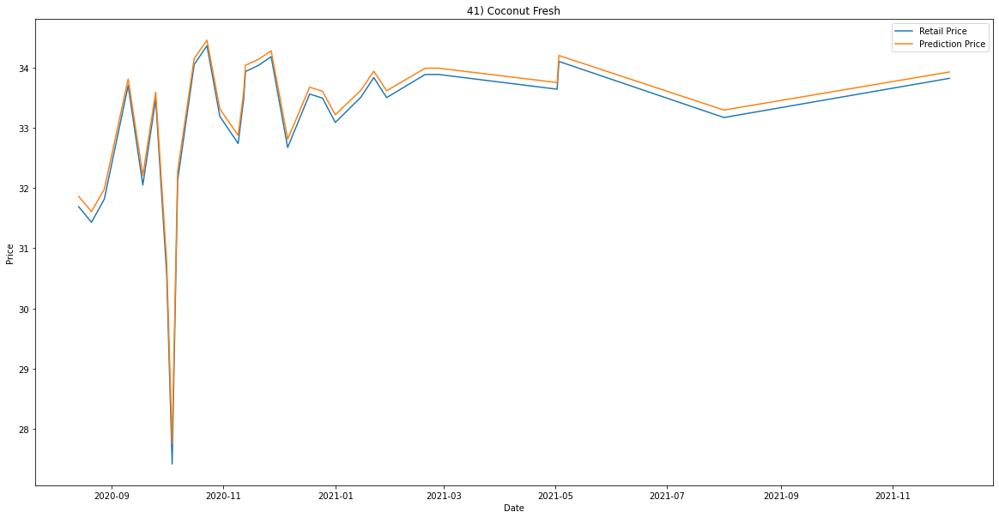

Accuracy :  0.8619881584819891
     Retail Price       Date  Prediction Price
391    744.302326 2020-08-14        719.960828
593    759.659091 2020-08-21        730.200823
789    751.955556 2020-08-28        725.102723
253    709.840909 2020-09-10        696.308285
511    730.391304 2020-09-18        710.476149
710    720.391304 2020-09-25        703.592544
261    656.591837 2020-10-01        659.885276
269    773.000000 2020-10-04        738.787380
278    714.146341 2020-10-07        699.281683
455    711.066667 2020-10-16        697.154793
656    708.844444 2020-10-23        695.620179
846    707.733333 2020-10-30        694.852986
309    733.434783 2020-11-09        712.562689
317    698.760870 2020-11-12        688.663872
372    708.400000 2020-11-13        695.313290
574    707.733333 2020-11-20        694.852986
771    714.086957 2020-11-27        699.240672
331    746.086957 2020-12-06        721.165739
519    703.108696 2020-12-18        691.661272
718    720.391304 2020-12-25 

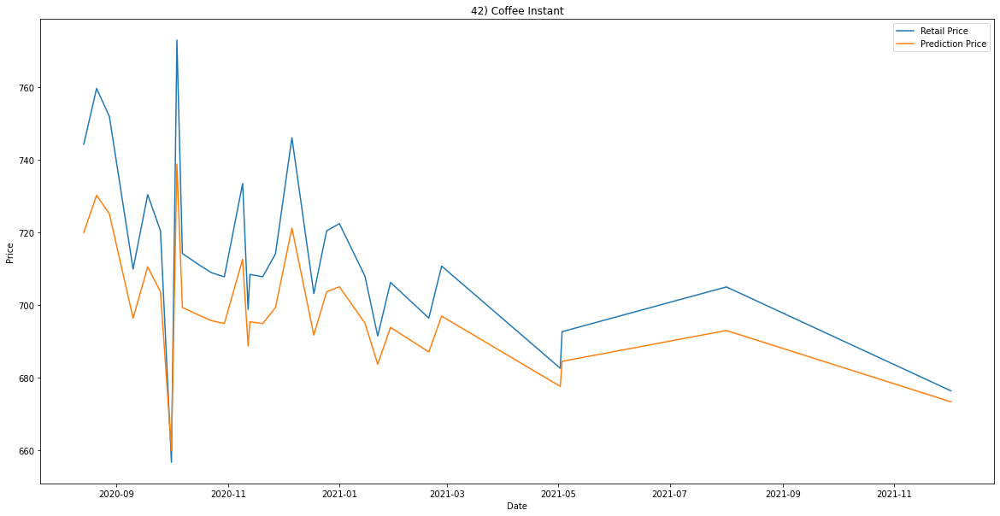

Accuracy :  0.08410380895136504
     Retail Price       Date  Prediction Price
401     47.983333 2020-08-14         27.582223
615     46.557377 2020-08-21         27.364636
835     51.741935 2020-08-28         28.064336
260     49.312500 2020-09-10         27.767861
525     55.741935 2020-09-18         28.431934
744     55.109375 2020-09-25         28.383777
268     27.279412 2020-10-01         22.557816
276     22.886364 2020-10-04         20.981315
285     48.948276 2020-10-07         27.718641
467     49.923077 2020-10-16         27.847582
682     49.584615 2020-10-23         27.803822
902     46.774194 2020-10-30         27.398950
318     56.437500 2020-11-09         28.480566
326     40.301587 2020-11-12         26.184759
382     45.156250 2020-11-13         27.132257
594     45.171875 2020-11-20         27.134950
814     43.138462 2020-11-27         26.765256
340     26.078125 2020-12-06         22.144248
533     35.095238 2020-12-18         24.923695
753     31.238095 2020-12-25

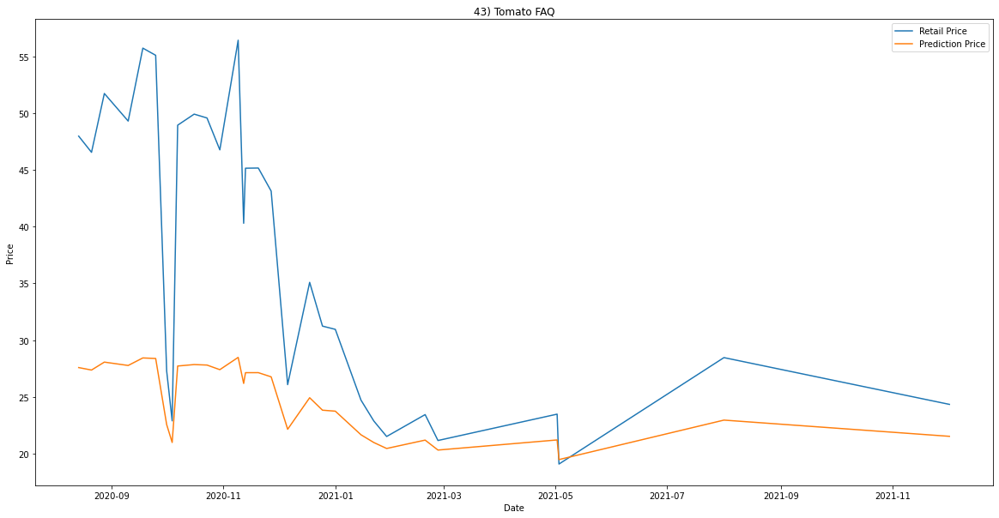

Accuracy :  0.9156523521948396
     Retail Price       Date  Prediction Price
395     23.284483 2020-08-14         23.237304
604     23.198276 2020-08-21         23.156106
824     23.375000 2020-08-28         23.322540
255     23.450820 2020-09-10         23.393918
516     23.275000 2020-09-18         23.228373
733     23.631148 2020-09-25         23.563617
264     23.176923 2020-10-01         23.135991
272     22.267442 2020-10-04         22.278042
280     23.745455 2020-10-07         23.671139
459     23.491935 2020-10-16         23.432618
670     23.556452 2020-10-23         23.493335
891     23.398305 2020-10-30         23.344481
312     23.434426 2020-11-09         23.378486
320     23.308333 2020-11-12         23.259765
375     23.500000 2020-11-13         23.440208
583     23.598361 2020-11-20         23.532769
803     23.620968 2020-11-27         23.554040
333     23.516393 2020-12-06         23.455637
524     23.258333 2020-12-18         23.212676
742     23.291667 2020-12-25 

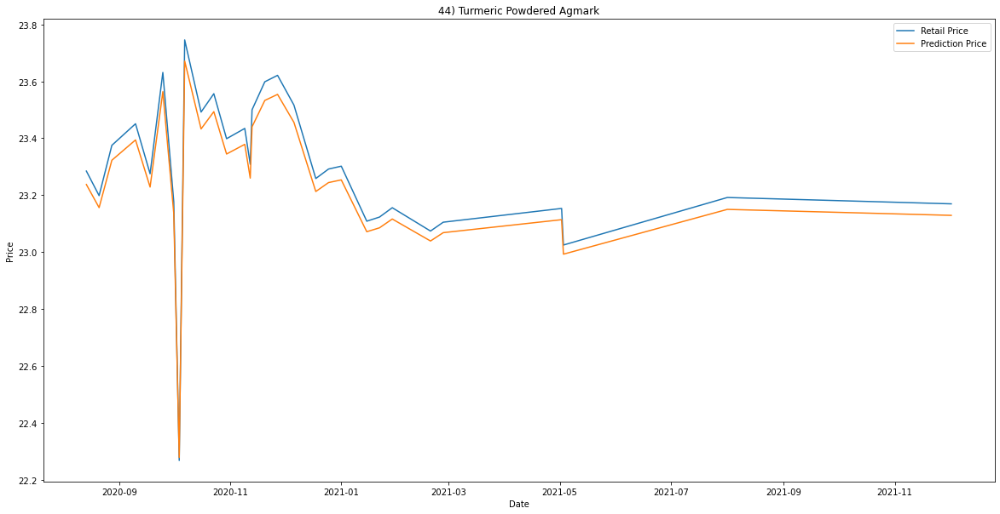

Accuracy :  0.7473561501644297
     Retail Price       Date  Prediction Price
389    107.220339 2020-08-14        106.719922
595    106.338983 2020-08-21        105.971867
813    106.600000 2020-08-28        106.193864
253    108.241379 2020-09-10        107.580995
508    104.368421 2020-09-18        104.283644
722    105.525424 2020-09-25        105.277479
261    104.298507 2020-10-01        104.223355
269    104.372093 2020-10-04        104.286810
277    103.701754 2020-10-07        103.707679
452    109.644068 2020-10-16        108.754060
660    110.610169 2020-10-23        109.555254
880    110.526316 2020-10-30        109.485935
309    106.677419 2020-11-09        106.259636
317    110.051724 2020-11-12        109.092810
371    111.898305 2020-11-13        110.614788
575    112.203390 2020-11-20        110.864251
792    111.750000 2020-11-27        110.493315
330    106.852459 2020-12-06        106.408217
516    109.413793 2020-12-18        108.562274
731    108.293103 2020-12-25 

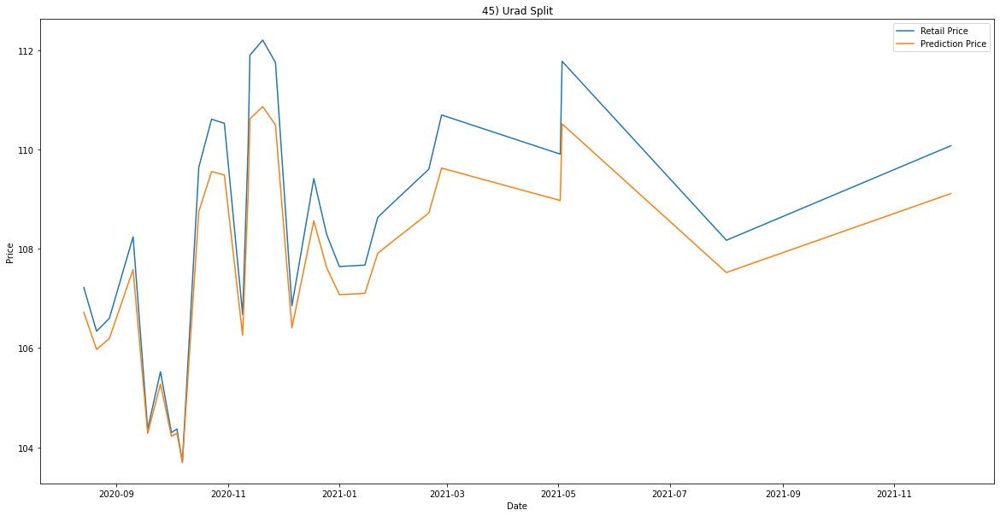

Accuracy :  0.8916457129328954
     Retail Price       Date  Prediction Price
389     29.062500 2020-08-14         29.265774
596     29.166667 2020-08-21         29.365556
814     28.937500 2020-08-28         29.146011
252     29.836735 2020-09-10         30.006954
508     29.080000 2020-09-18         29.282539
723     29.755102 2020-09-25         29.928857
260     28.066038 2020-10-01         28.310294
268     29.702703 2020-10-04         29.878721
276     29.577778 2020-10-07         29.759173
452     29.800000 2020-10-16         29.971812
661     29.740000 2020-10-23         29.914408
881     29.979592 2020-10-30         30.143593
308     29.163265 2020-11-09         29.362298
316     29.163265 2020-11-12         29.362298
371     29.780000 2020-11-13         29.952678
576     29.640000 2020-11-20         29.818721
793     29.620000 2020-11-27         29.799581
330     29.020408 2020-12-06         29.225449
516     29.183673 2020-12-18         29.381845
732     29.163265 2020-12-25 

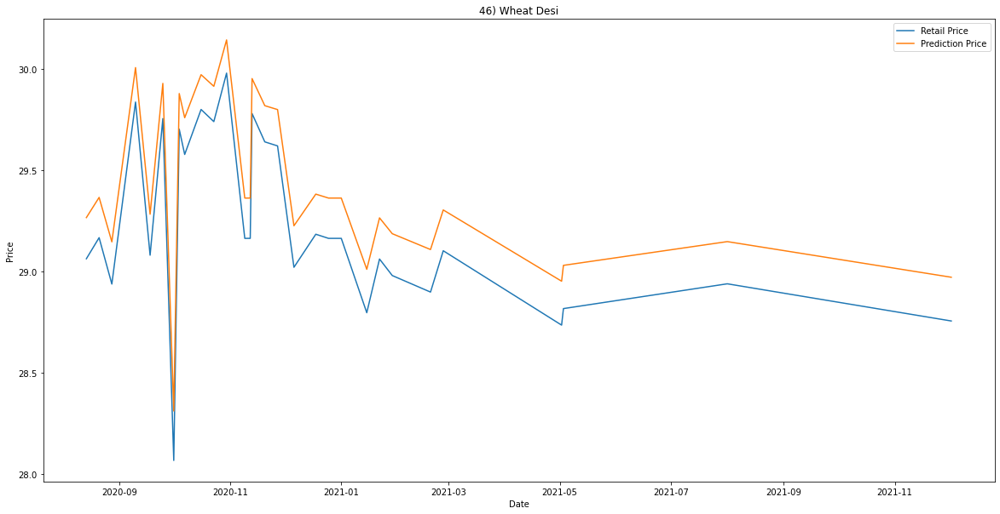

Accuracy :  0.9739175722964315
     Retail Price       Date  Prediction Price
389     29.428571 2020-08-14         29.729541
595     29.092157 2020-08-21         29.404334
813     28.941176 2020-08-28         29.258350
252     28.941176 2020-09-10         29.258350
508     29.084906 2020-09-18         29.397323
722     28.900000 2020-09-25         29.218533
260     29.113725 2020-10-01         29.425187
268     29.631579 2020-10-04         29.925735
276     29.021739 2020-10-07         29.336249
452     29.028846 2020-10-16         29.343121
660     29.234615 2020-10-23         29.542059
880     29.344231 2020-10-30         29.648020
308     29.000000 2020-11-09         29.315229
316     29.469231 2020-11-12         29.768839
371     29.352830 2020-11-13         29.656332
575     29.371698 2020-11-20         29.674570
792     29.324074 2020-11-27         29.628536
330     28.892157 2020-12-06         29.210948
516     29.440385 2020-12-18         29.740959
731     29.216981 2020-12-25 

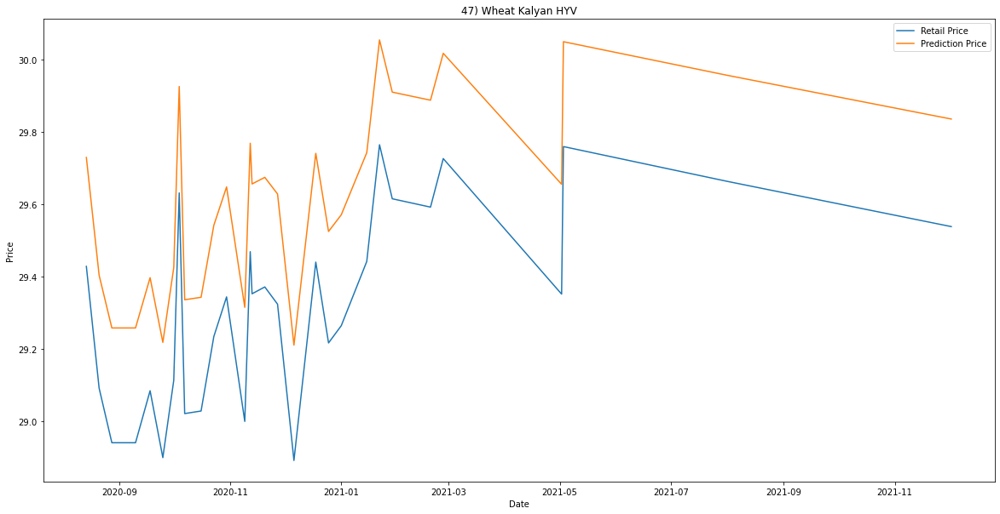

In [80]:
varieties_dw=(dm['Commodity']+"+"+dm['Variety']).unique()             #looping through all the varieties
i=1
for item in varieties_dw:
    itemName=item.split("+")
    C=itemName[0]                                                   #extracting the name of commodity and variety
    V=itemName[1]
    dw_item=dw[(dw['Commodity']==C) & (dw['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dw_item['Date']
    item_specific_dp['Retail Price']=dw_item['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    column_names = ["Date","Retail Price"]
    dw_data=pd.DataFrame(columns=columns)
    dw_data['Date']=item_specific_sorted['Date']
    dw_data['Retail Price']=item_specific_sorted['Retail Price']
    dw_data['Prediction Prices']=dw_data[['Retail Price']].shift(-30)
    X=(dw_data.drop(['Date','Prediction Prices'],axis=1))
    X=X[:-30]
    y=(dw_data['Prediction Prices'])
    y=y[:-30]
    #splitting data into 80% training and 20% testing
    from sklearn.model_selection import train_test_split
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.09)
    #prediction days array is last 30 rows data from original data set
    prediction_days_array=(dw_data.drop(['Date','Prediction Prices'],axis=1)).tail(30)
    from sklearn.svm import SVR
    #create and train the support vector machine (regression) using radial basis function
    svr_rbf=SVR(kernel='rbf',C=1e3,gamma=0.00001)
    svr_rbf.fit(x_train,y_train)
    #test the model
    svr_rbf_confidence=svr_rbf.score(x_test,y_test)
    print("Accuracy : ",svr_rbf_confidence)
    svm_prediction=svr_rbf.predict(x_test)
    svm_prediction=svr_rbf.predict(prediction_days_array)
    column_names = ["Date","Retail Price","Prediction Price"]
    data=pd.DataFrame(columns=columns)
    data['Date']=item_specific_sorted['Date'].tail(30)
    data['Retail Price']=item_specific_sorted['Retail Price'].tail(30)
    data['Prediction Price']=svm_prediction
    print(data)
    #plotting the prediction prices and actual price
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.plot(data['Date'], data['Retail Price'])
    plt.plot(data['Date'], data['Prediction Price'])
    plt.legend(["Retail Price","Prediction Price"])
    plt.show()

<h3>Monthly Non-Food Commodities<h3>

Accuracy :  0.28328116585110885
     Retail Price       Date  Prediction Price
60     289.545455 2014-01-01        370.633272
48     279.166667 2014-02-01        358.722166
98     313.272727 2014-03-01        394.510449
11     273.190476 2014-04-01        351.494170
111    291.047619 2014-05-01        372.286621
86     311.125000 2014-06-01        392.552697
73     302.350000 2014-07-01        384.124415
25     306.250000 2014-08-01        387.954660
149    308.333333 2014-09-01        389.945661
137    293.526316 2014-10-01        374.974460
126    331.588235 2014-11-01        409.466962
37     340.944444 2014-12-01        415.874985
61     331.000000 2015-01-01        409.035898
49     365.909091 2015-02-01        428.803232
99     306.416667 2015-03-01        388.115360
12     351.923077 2015-04-01        422.309712
112    313.000000 2015-05-01        394.264170
87     382.909091 2015-06-01        434.150258
74     282.500000 2015-07-01        362.638616
150    350.000000 2015-09-01

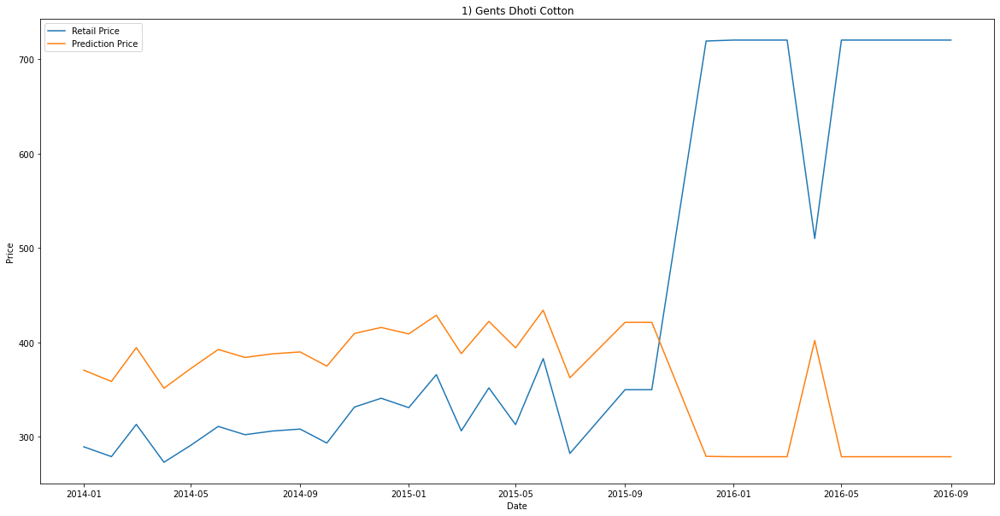

Accuracy :  0.235563228914363
     Retail Price       Date  Prediction Price
98      19.113636 2013-05-01         18.287918
76      19.722222 2013-06-01         18.664226
65      17.777778 2013-07-01         17.461677
22      18.555556 2013-08-01         17.942776
133     18.368421 2013-09-01         17.827032
121     18.250000 2013-10-01         17.753784
110     18.785714 2013-11-01         18.085123
33      17.738095 2013-12-01         17.437129
55      17.840909 2014-01-01         17.500731
44      17.684211 2014-02-01         17.403794
88      17.500000 2014-03-01         17.289835
10      18.375000 2014-04-01         17.831101
99      17.200000 2014-05-01         17.104233
77      23.413043 2014-06-01         20.944391
66      16.976190 2014-07-01         16.965762
23      24.916667 2014-08-01         21.872060
134     26.441176 2014-09-01         22.811679
122     26.666667 2014-10-01         22.950570
111     26.250000 2014-11-01         22.693905
34      26.805556 2014-12-01  

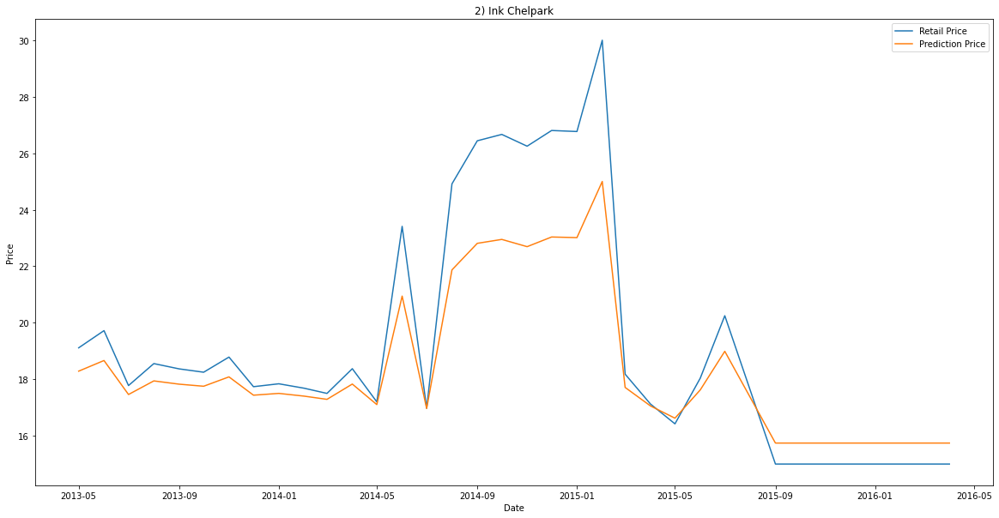

Accuracy :  0.46265318810499445
     Retail Price       Date  Prediction Price
57     291.739130 2014-01-01        267.629053
45     297.368421 2014-02-01        266.353651
93     282.500000 2014-03-01        268.962867
10     299.750000 2014-04-01        265.710287
105    295.238095 2014-05-01        266.877048
81     288.636364 2014-06-01        268.183019
69     304.650000 2014-07-01        264.195334
23     307.631579 2014-08-01        263.149186
141    317.058824 2014-09-01        259.238063
129    328.333333 2014-10-01        253.405318
118    342.187500 2014-11-01        244.637533
34     301.529412 2014-12-01        265.189753
58     316.000000 2015-01-01        259.722208
46     339.000000 2015-02-01        246.802674
94     337.583333 2015-03-01        247.737308
11     331.230769 2015-04-01        251.712625
106    301.428571 2015-05-01        265.220159
82     265.909091 2015-06-01        268.940425
70     206.666667 2015-07-01        243.796694
142    448.000000 2015-09-01

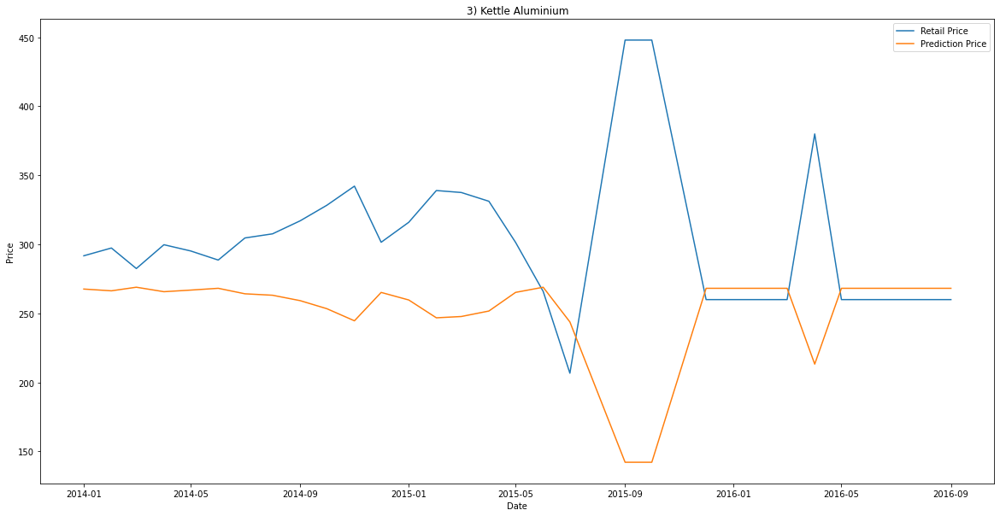

Accuracy :  0.4751752972688993
     Retail Price       Date  Prediction Price
60     202.304348 2014-01-01        243.192119
48     201.650000 2014-02-01        242.227803
98     222.863636 2014-03-01        273.156583
11     207.285714 2014-04-01        250.518302
111    204.428571 2014-05-01        246.319727
86     235.541667 2014-06-01        291.099697
73     194.190476 2014-07-01        231.214663
25     215.095238 2014-08-01        261.930575
149    218.789474 2014-09-01        267.287330
137    236.050000 2014-10-01        291.807359
126    239.222222 2014-11-01        296.200293
37     224.526316 2014-12-01        275.538949
61     222.583333 2015-01-01        272.754185
49     228.333333 2015-02-01        280.962783
99     210.538462 2015-03-01        255.284356
12     244.357143 2015-04-01        303.221385
112    223.733333 2015-05-01        274.403708
87     241.333333 2015-06-01        299.100758
74     205.000000 2015-07-01        247.160243
150    210.000000 2015-09-01 

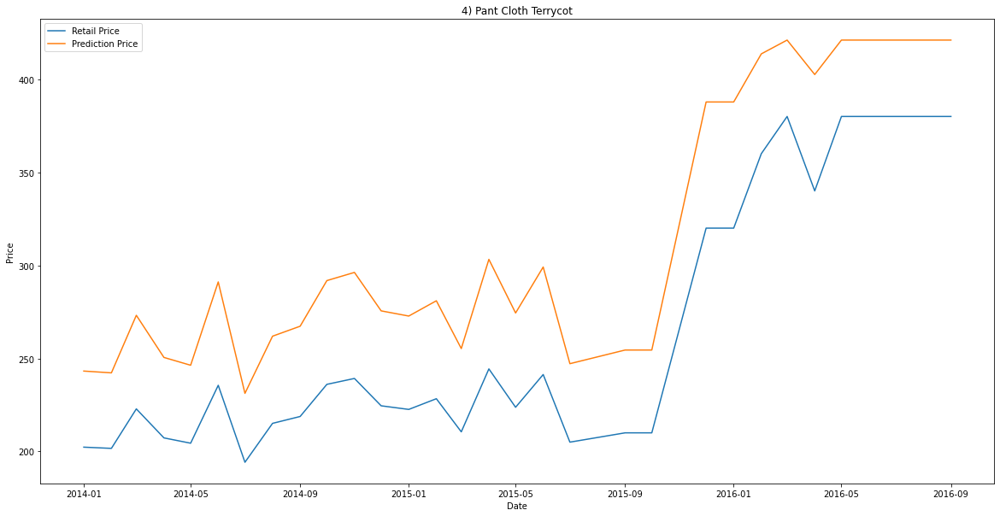

Accuracy :  0.3272404657131628
     Retail Price       Date  Prediction Price
57      36.238095 2014-01-01         37.012891
45      39.647059 2014-02-01         39.254754
93      27.900000 2014-03-01         31.567133
10      40.388889 2014-04-01         39.743539
105     40.222222 2014-05-01         39.633697
81      43.857143 2014-06-01         42.032406
69      39.473684 2014-07-01         39.140563
23      39.210526 2014-08-01         38.967272
141     34.294118 2014-09-01         35.738022
129     42.666667 2014-10-01         41.246127
118     45.800000 2014-11-01         43.316797
34      41.611111 2014-12-01         40.549489
58      48.000000 2015-01-01         44.772629
46      57.700000 2015-02-01         51.199105
94      42.416667 2015-03-01         41.081087
11      50.692308 2015-04-01         46.555727
106     39.500000 2015-05-01         39.157895
82      51.833333 2015-06-01         47.311738
70      45.000000 2015-07-01         42.787766
142     25.000000 2015-09-01 

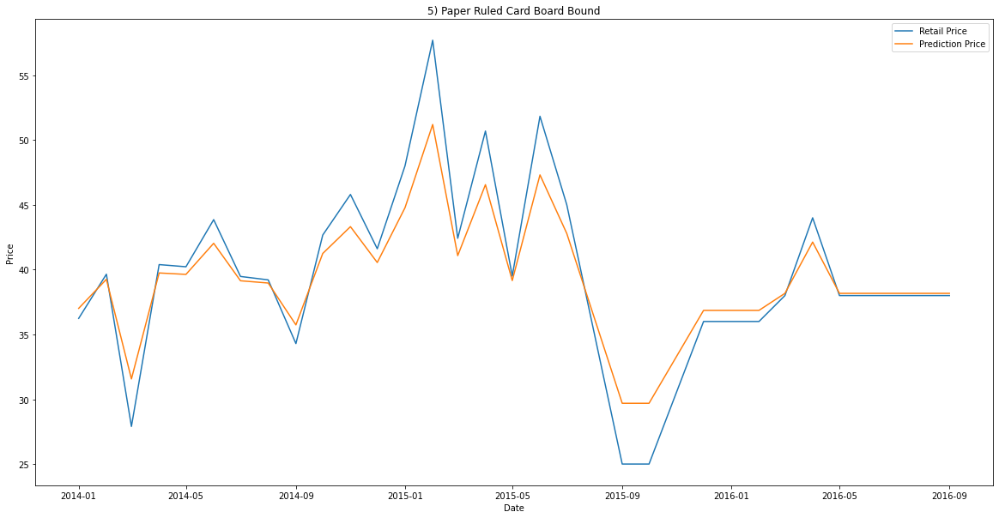

Accuracy :  0.20892433797805943
     Retail Price       Date  Prediction Price
60     268.045455 2014-01-01        385.870527
48     254.000000 2014-02-01        355.592191
98     267.238095 2014-03-01        384.128621
11     246.100000 2014-04-01        338.688745
111    256.100000 2014-05-01        360.107983
86     307.363636 2014-06-01        468.626867
73     287.473684 2014-07-01        427.477205
25     325.263158 2014-08-01        503.461230
149    309.444444 2014-09-01        472.799798
137    310.111111 2014-10-01        474.130493
126    334.235294 2014-11-01        519.894011
37     327.176471 2014-12-01        507.028411
61     333.083333 2015-01-01        517.827079
49     360.000000 2015-02-01        562.418252
99     275.166667 2015-03-01        401.209147
12     340.416667 2015-04-01        530.756910
112    295.857143 2015-05-01        445.068369
87     317.363636 2015-06-01        488.397679
74     248.333333 2015-07-01        343.451021
150    366.000000 2015-09-01

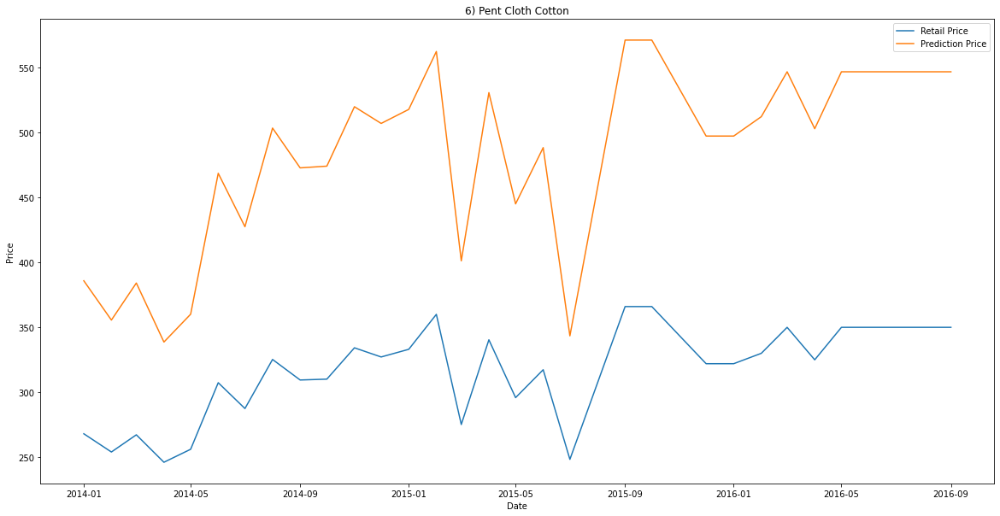

Accuracy :  0.6837215619579726
     Retail Price       Date  Prediction Price
63     377.817727 2014-01-01        389.231787
49     388.052632 2014-02-01        394.018442
103    377.952381 2014-03-01        389.299981
12     371.473684 2014-04-01        385.866145
117    376.399500 2014-05-01        388.505267
89     353.666667 2014-06-01        374.913934
76     358.315789 2014-07-01        377.975789
26     364.444444 2014-08-01        381.798316
156    370.750000 2014-09-01        385.463506
143    367.058824 2014-10-01        383.351736
131    356.400000 2014-11-01        376.730552
38     345.000000 2014-12-01        368.858647
64     362.636364 2015-01-01        380.696625
50     324.666667 2015-02-01        353.136372
104    367.083333 2015-03-01        383.366075
13     397.333333 2015-04-01        397.642455
118    407.857143 2015-05-01        400.898647
90     381.090909 2015-06-01        390.850527
77     382.833333 2015-07-01        391.678812
157    299.000000 2015-09-01 

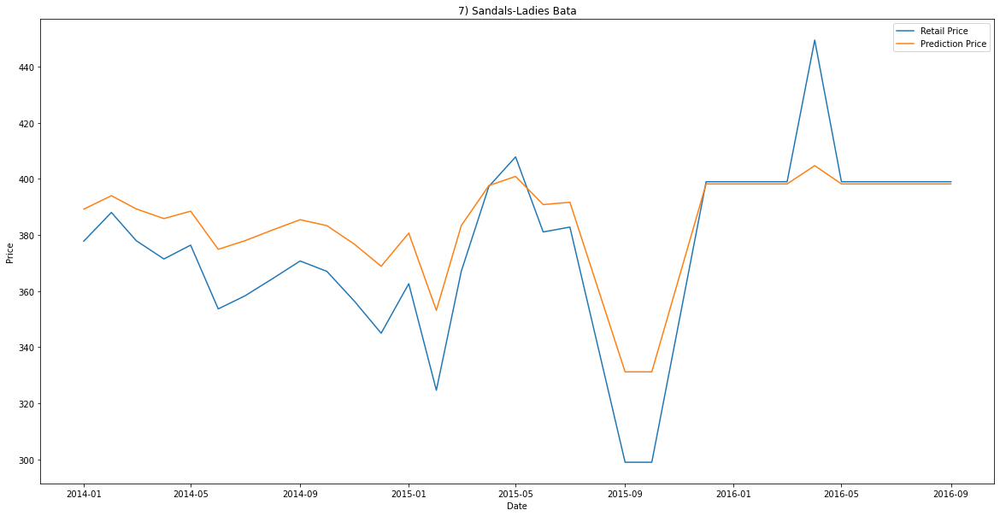

Accuracy :  0.7387999566909529
     Retail Price       Date  Prediction Price
60     371.000000 2014-01-01        487.458816
48     386.111111 2014-02-01        519.208755
98     384.761905 2014-03-01        516.385466
11     401.842105 2014-04-01        551.771667
111    416.700000 2014-05-01        581.608080
86     397.227273 2014-06-01        542.301108
73     427.578947 2014-07-01        602.644639
25     418.105263 2014-08-01        584.368281
149    341.176471 2014-09-01        425.318993
137    364.166667 2014-10-01        473.079598
126    376.875000 2014-11-01        499.826608
37     375.882353 2014-12-01        497.737915
61     421.818182 2015-01-01        591.602120
49     461.000000 2015-02-01        661.354409
99     389.090909 2015-03-01        525.430796
12     429.583333 2015-04-01        606.431682
112    357.692308 2015-05-01        459.500230
87     391.000000 2015-06-01        529.406144
74     415.000000 2015-07-01        578.253278
150    320.000000 2015-09-01 

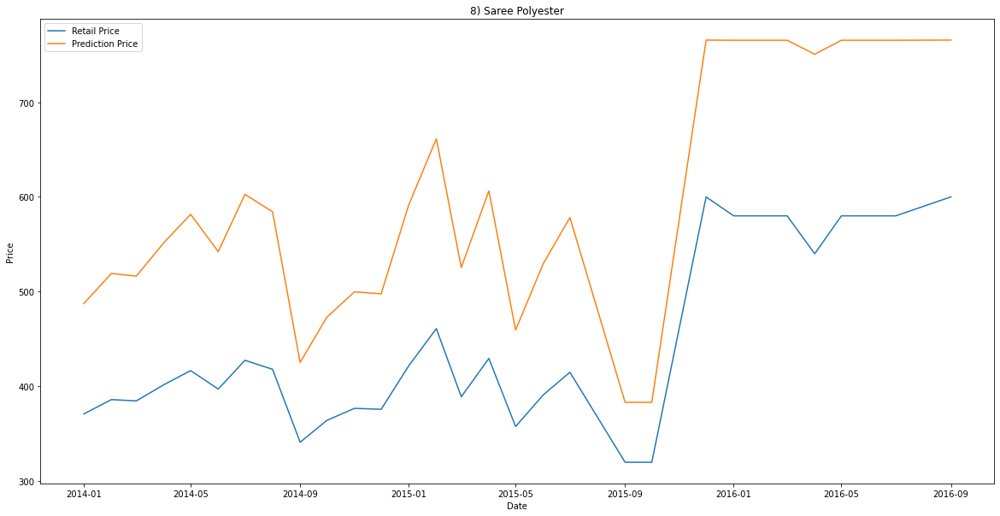

Accuracy :  -0.2652936354344171
     Retail Price       Date  Prediction Price
60     396.086957 2014-01-01        546.502939
48     393.947368 2014-02-01        543.499861
98     416.136364 2014-03-01        572.342838
11     404.000000 2014-04-01        557.209301
111    398.333333 2014-05-01        549.607032
86     418.260870 2014-06-01        574.824771
73     416.100000 2014-07-01        572.299913
25     404.350000 2014-08-01        557.667934
149    390.388889 2014-09-01        538.406807
137    433.789474 2014-10-01        591.383640
126    452.058824 2014-11-01        607.169033
37     446.777778 2014-12-01        603.025102
61     480.583333 2015-01-01        623.607874
49     420.000000 2015-02-01        576.818416
99     454.750000 2015-03-01        609.148555
12     424.000000 2015-04-01        581.272240
112    432.142857 2015-05-01        589.762275
87     504.545455 2015-06-01        629.829026
74     479.166667 2015-07-01        623.026799
150    322.000000 2015-09-01

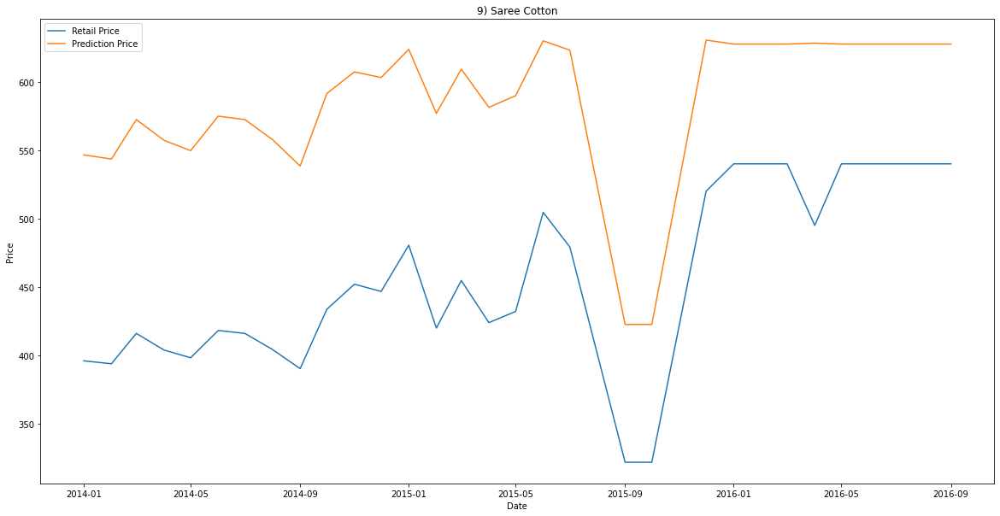

Accuracy :  0.900850548779746
     Retail Price       Date  Prediction Price
60     129.347826 2014-01-01        210.676565
48     120.100000 2014-02-01        190.400695
98     130.000000 2014-03-01        212.096953
11     123.333333 2014-04-01        197.515564
111    135.909091 2014-05-01        224.896094
86     155.416667 2014-06-01        265.974966
73     154.571429 2014-07-01        264.240464
25     150.761905 2014-08-01        256.366634
149    159.263158 2014-09-01        273.807937
137    136.050000 2014-10-01        225.199633
126    128.611111 2014-11-01        209.070357
37     131.842105 2014-12-01        216.100982
61     121.153846 2015-01-01        192.722287
49     133.750000 2015-02-01        220.234962
99     147.076923 2015-03-01        248.667045
12     144.785714 2015-04-01        243.841150
112    143.000000 2015-05-01        240.060634
87     135.833333 2015-06-01        224.732867
74     114.166667 2015-07-01        177.290705
150    199.000000 2015-09-01  

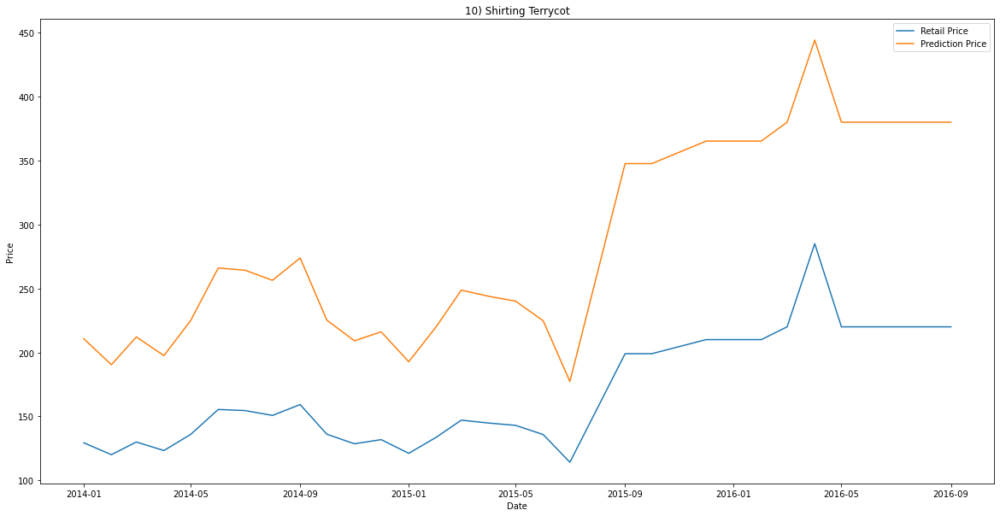

Accuracy :  0.6694911954093632
     Retail Price       Date  Prediction Price
60     143.181818 2014-01-01        185.807907
48     135.016500 2014-02-01        174.997545
98     138.333182 2014-03-01        179.401603
11     147.634762 2014-04-01        191.650594
111    154.560455 2014-05-01        200.642349
86     169.057826 2014-06-01        218.979853
73     163.866500 2014-07-01        212.499193
25     159.315789 2014-08-01        206.736795
149    164.611111 2014-09-01        213.435047
137    155.175263 2014-10-01        201.434191
126    142.725294 2014-11-01        185.206558
37     154.240556 2014-12-01        200.229898
61     136.194167 2015-01-01        176.563095
49     148.272727 2015-02-01        192.484015
99     146.486923 2015-03-01        190.148690
12     156.071429 2015-04-01        202.586390
112    146.688667 2015-05-01        190.412883
87     136.944167 2015-06-01        177.559123
74     109.666667 2015-07-01        141.099557
150    231.000000 2015-09-01 

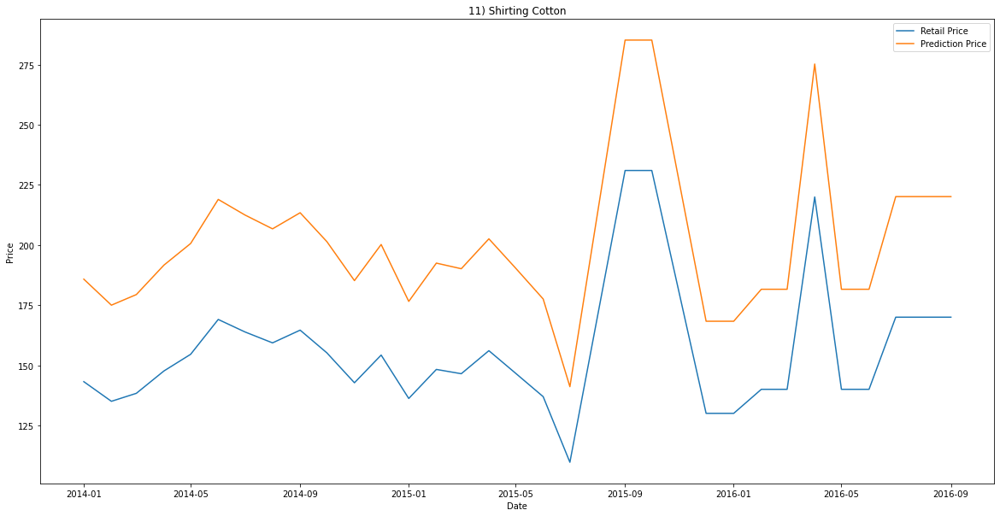

Accuracy :  0.6650934848448502
     Retail Price       Date  Prediction Price
63     874.315263 2014-01-01        941.649405
49     838.555556 2014-02-01        916.328906
103    862.523810 2014-03-01        932.360902
12     853.368421 2014-04-01        925.818677
117    831.999500 2014-05-01        912.502164
89     861.619048 2014-06-01        931.689262
76     858.789474 2014-07-01        929.624944
26     839.888889 2014-08-01        917.133088
156    826.312500 2014-09-01        909.339008
143    862.705882 2014-10-01        932.496748
131    951.533333 2014-11-01       1029.209259
38     866.687500 2014-12-01        935.525739
64     884.363636 2015-01-01        950.389768
50     764.555556 2015-02-01        878.674555
104    897.833333 2015-03-01        963.360236
13     852.333333 2015-04-01        925.113406
118    885.000000 2015-05-01        950.969853
90     919.818182 2015-06-01        987.676360
77     694.400000 2015-07-01        828.533056
157    999.000000 2015-09-01 

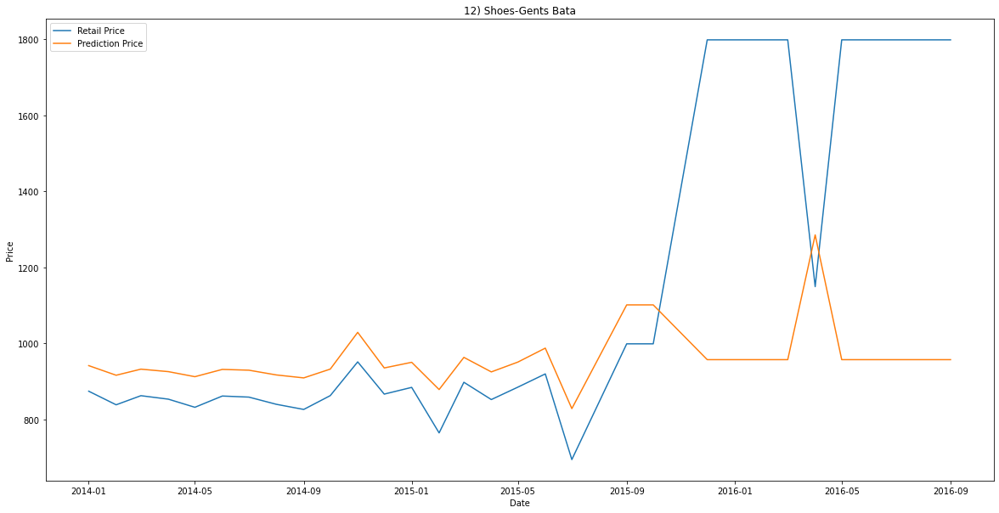

Accuracy :  0.663687363818046
     Retail Price       Date  Prediction Price
57     130.217391 2014-01-01        168.461967
45     127.894737 2014-02-01        165.406246
93     130.238095 2014-03-01        168.489215
10     128.750000 2014-04-01        166.531160
105    127.619048 2014-05-01        165.043717
81     132.272727 2014-06-01        171.167616
69     133.850000 2014-07-01        173.244521
23     155.105263 2014-08-01        201.122397
141    159.529412 2014-09-01        206.858505
129    162.611111 2014-10-01        210.831887
118    171.562500 2014-11-01        222.247504
34     148.833333 2014-12-01        192.938157
58     136.166667 2015-01-01        176.295238
46     147.500000 2015-02-01        191.191957
94     151.166667 2015-03-01        195.989104
11     151.000000 2015-04-01        195.771403
106    130.000000 2015-05-01        168.175868
82     126.538462 2015-06-01        163.623182
70     121.666667 2015-07-01        157.229511
142    224.000000 2015-09-01  

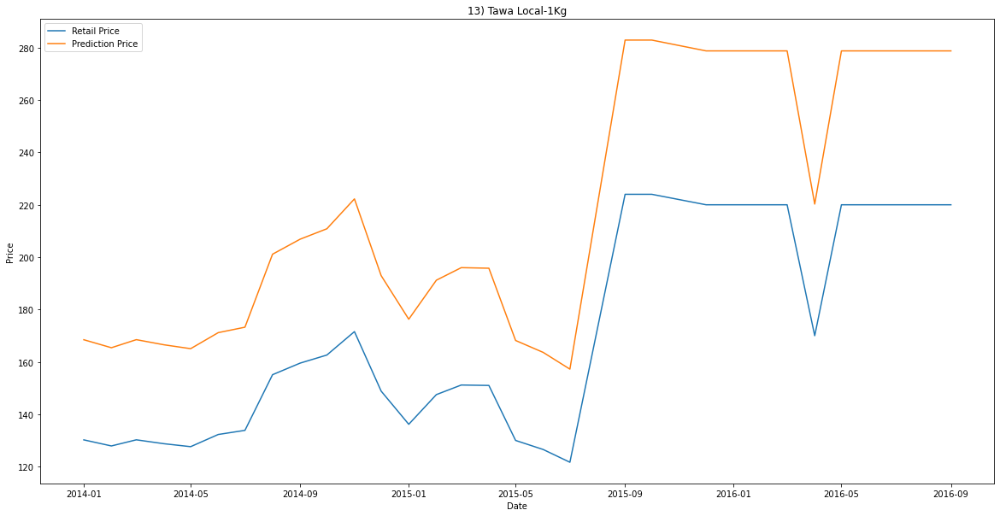

Accuracy :  0.745076929581749
     Retail Price       Date  Prediction Price
58      40.875000 2014-01-01         45.146149
45      43.500000 2014-02-01         47.763260
97      39.636364 2014-03-01         43.909511
10      43.476190 2014-04-01         47.739547
110     42.590909 2014-05-01         46.857509
84      41.739130 2014-06-01         46.008263
71      41.714286 2014-07-01         45.983484
23      40.904762 2014-08-01         45.175851
146     43.947368 2014-09-01         48.208730
134     42.800000 2014-10-01         47.065892
123     45.888889 2014-11-01         50.139910
34      42.894737 2014-12-01         47.160296
59      47.230769 2015-01-01         51.472485
46      49.916667 2015-02-01         54.133821
98      48.615385 2015-03-01         52.845475
11      47.785714 2015-04-01         52.023026
111     47.333333 2015-05-01         51.574260
85      41.615385 2015-06-01         45.884839
72      35.666667 2015-07-01         39.940380
147     39.000000 2015-09-01  

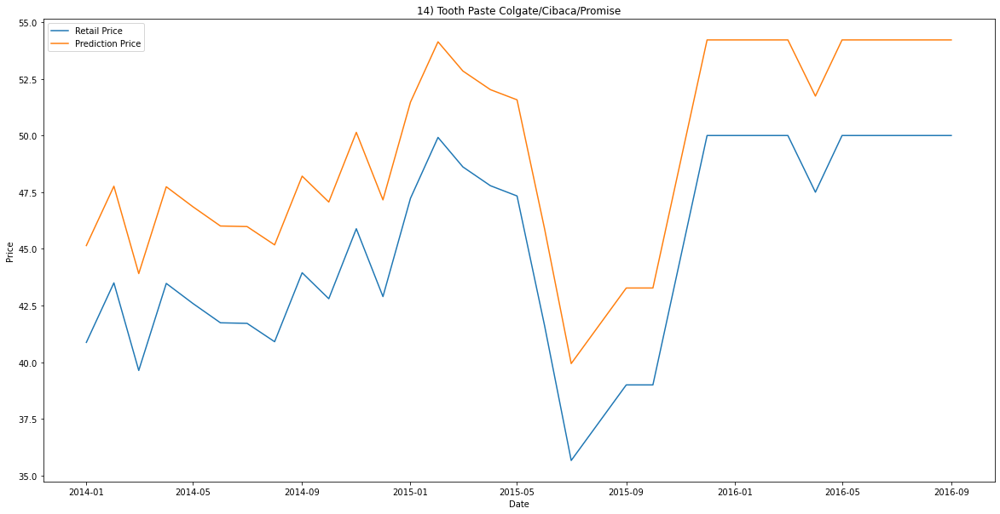

Accuracy :  -0.4726762475515398
     Retail Price       Date  Prediction Price
103     32.956522 2013-05-01         32.608459
79      33.833333 2013-06-01         33.141930
67      31.277778 2013-07-01         31.586712
22      32.578947 2013-08-01         32.378691
138     32.842105 2013-09-01         32.538835
126     34.333333 2013-10-01         33.446070
115     30.933333 2013-11-01         31.377024
33      33.600000 2013-12-01         32.999980
56      33.190476 2014-01-01         32.750817
44      31.722222 2014-02-01         31.857258
92      32.000000 2014-03-01         32.026335
10      32.888889 2014-04-01         32.567304
104     32.055556 2014-05-01         32.060149
80      32.150000 2014-06-01         32.117632
68      32.235294 2014-07-01         32.169545
23      30.352941 2014-08-01         31.023669
139     34.800000 2014-09-01         33.729882
127     31.705882 2014-10-01         31.847311
116     35.214286 2014-11-01         33.981793
34      29.812500 2014-12-01

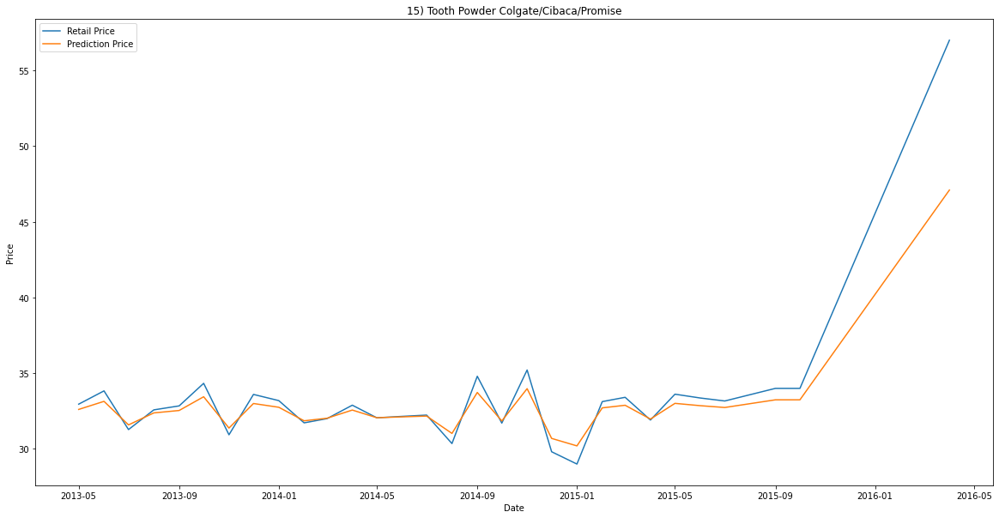

Accuracy :  0.2711171815377805
     Retail Price       Date  Prediction Price
57     128.477273 2014-01-01        160.081960
45     141.750000 2014-02-01        178.520567
93     124.075000 2014-03-01        154.108669
10     140.078947 2014-04-01        176.168340
105    152.325000 2014-05-01        193.564136
81     146.204545 2014-06-01        184.826801
69     145.184211 2014-07-01        183.378000
23     159.815789 2014-08-01        204.343144
141    158.029412 2014-09-01        201.765979
129    174.250000 2014-10-01        225.237272
118    132.100000 2014-11-01        165.054929
34     141.500000 2014-12-01        178.168166
58     129.576923 2015-01-01        161.586213
46     112.954545 2015-02-01        139.408768
94     174.875000 2015-03-01        226.142275
11     160.678571 2015-04-01        205.589041
106    181.892857 2015-05-01        236.286943
82     156.269231 2015-06-01        199.230272
70     102.916667 2015-07-01        126.694698
142    238.000000 2015-09-01 

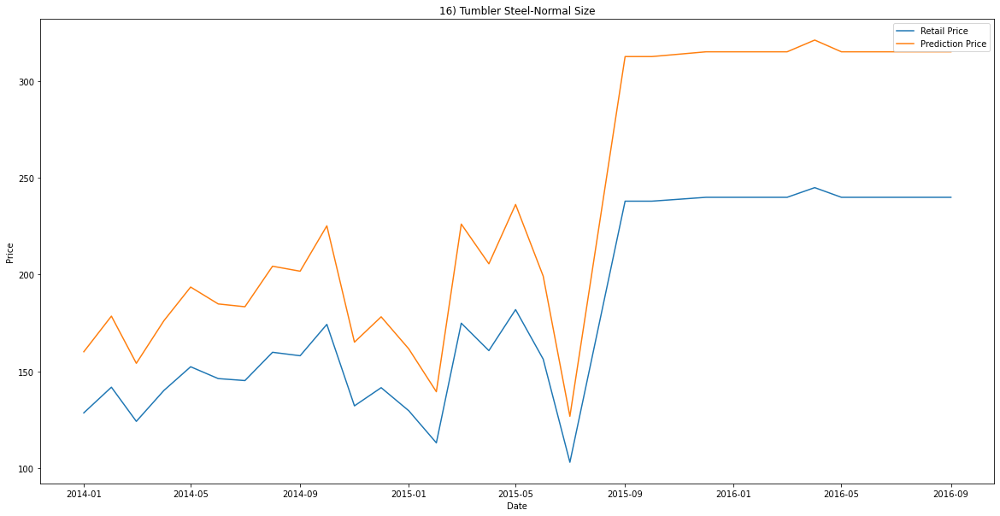

Accuracy :  0.9038369032461492
     Retail Price       Date  Prediction Price
34      22.045455 2013-12-01         24.757554
59      21.956522 2014-01-01         24.673638
46      21.473684 2014-02-01         24.217967
96      23.666667 2014-03-01         26.286534
11      22.000000 2014-04-01         24.714664
109     22.473684 2014-05-01         25.161566
83      22.954545 2014-06-01         25.615113
71      23.550000 2014-07-01         26.176556
24      23.421053 2014-08-01         26.054992
146     26.250000 2014-09-01         28.719432
134     25.777778 2014-10-01         28.275062
123     25.125000 2014-11-01         27.660515
35      24.888889 2014-12-01         27.438158
60      25.250000 2015-01-01         27.778218
47      25.200000 2015-02-01         27.731138
97      25.000000 2015-03-01         27.542802
12      25.846154 2015-04-01         28.339415
110     24.142857 2015-05-01         26.735335
84      23.846154 2015-06-01         26.455714
72      23.666667 2015-07-01 

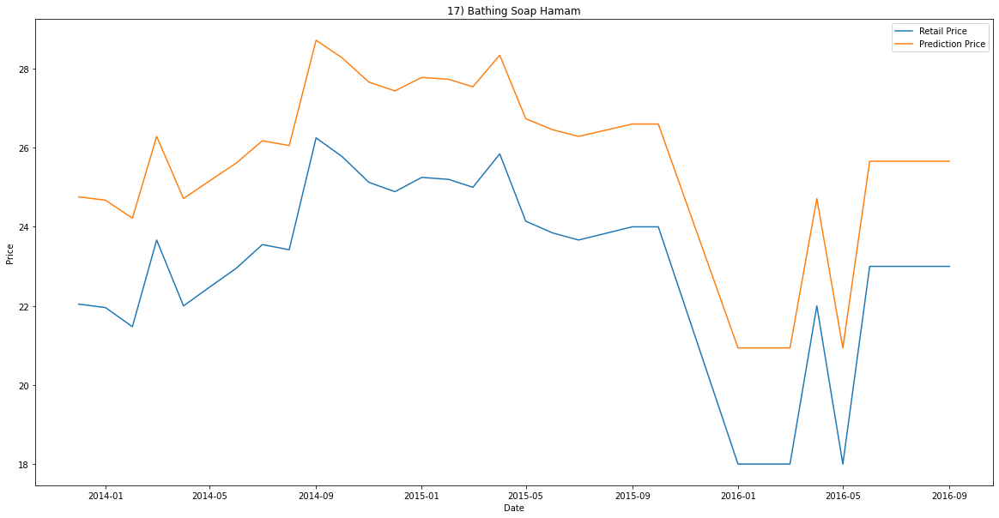

Accuracy :  -0.062291949608605846
     Retail Price       Date  Prediction Price
60      18.791667 2014-01-01         20.954856
47      18.600000 2014-02-01         20.771919
97      18.090909 2014-03-01         20.285714
11      18.809524 2014-04-01         20.971896
110     18.714286 2014-05-01         20.881007
84      18.458333 2014-06-01         20.636665
72      20.619048 2014-07-01         22.695787
24      19.523810 2014-08-01         21.653068
147     21.500000 2014-09-01         23.532918
135     19.900000 2014-10-01         22.011460
124     22.055556 2014-11-01         24.060096
35      20.947368 2014-12-01         23.007943
61      22.153846 2015-01-01         24.153305
48      21.250000 2015-02-01         23.295499
98      21.923077 2015-03-01         23.934437
12      20.571429 2015-04-01         22.650496
111     21.133333 2015-05-01         23.184664
85      21.846154 2015-06-01         23.861459
73      21.666667 2015-07-01         23.691132
148     23.000000 2015-09-

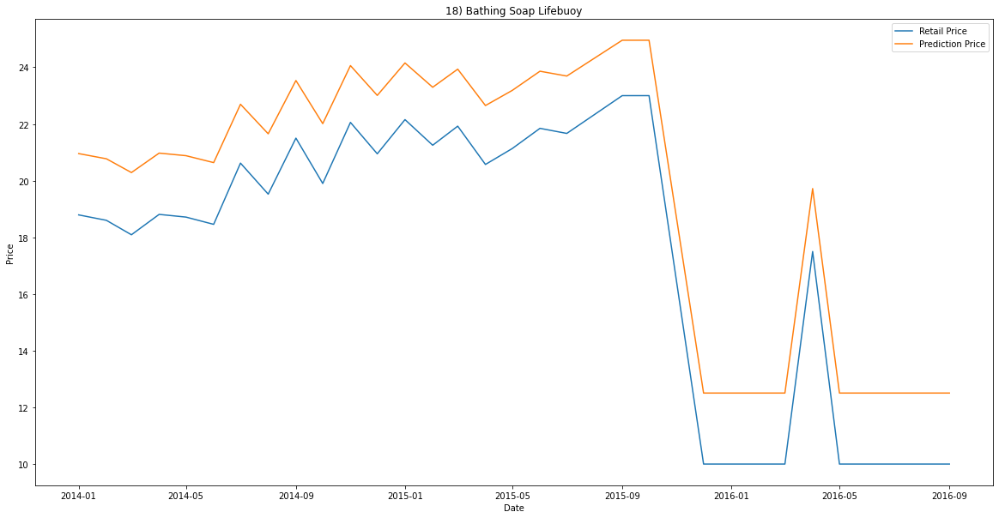

Accuracy :  0.6636720701062611
     Retail Price       Date  Prediction Price
60     304.380476 2014-01-01        308.639408
47     311.947368 2014-02-01        311.858062
98     301.150000 2014-03-01        307.132346
11     289.055556 2014-04-01        300.813037
111    284.899500 2014-05-01        298.405357
86     276.650000 2014-06-01        293.291313
73     317.444444 2014-07-01        313.915895
25     343.235294 2014-08-01        320.298053
149    365.800000 2014-09-01        321.386085
136    332.176471 2014-10-01        318.230987
124    291.400000 2014-11-01        302.119200
36     256.466667 2014-12-01        279.102429
61     300.272727 2015-01-01        306.709623
48     248.444444 2015-02-01        272.901618
99     329.000000 2015-03-01        317.450425
12     293.000000 2015-04-01        302.988614
112    338.461538 2015-05-01        319.530013
87     283.300000 2015-06-01        297.448005
74     409.400000 2015-07-01        312.357136
150    299.000000 2015-09-01 

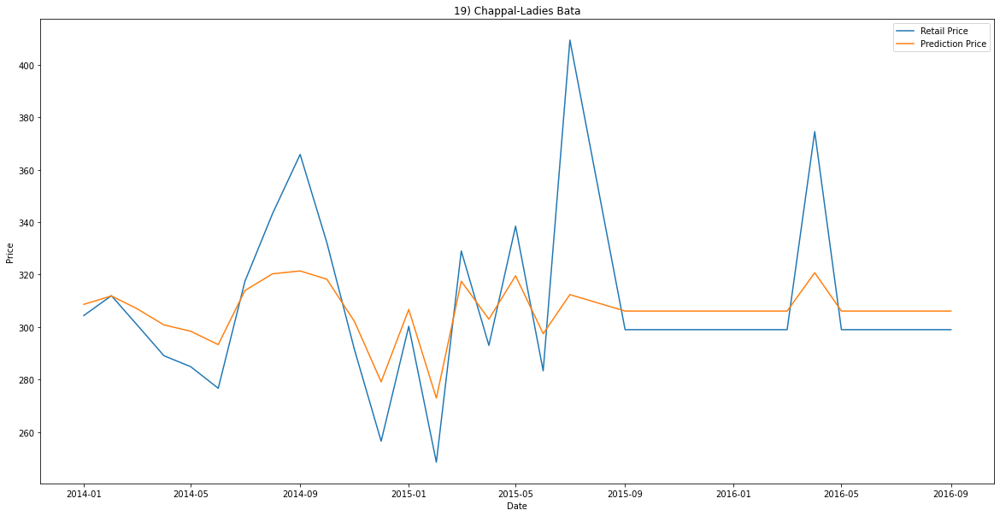

Accuracy :  0.58473464565197
     Retail Price       Date  Prediction Price
63     191.285238 2014-01-01        198.013171
49     206.444444 2014-02-01        191.154459
103    166.100000 2014-03-01        199.804952
12     195.444444 2014-04-01        196.550412
117    195.420526 2014-05-01        196.559743
89     208.368421 2014-06-01        189.988427
76     186.611111 2014-07-01        199.269471
26     205.882353 2014-08-01        191.482830
156    216.866667 2014-09-01        184.074265
143    210.875000 2014-10-01        188.372498
131    212.857143 2014-11-01        187.017979
38     174.133333 2014-12-01        200.572858
64     203.300000 2015-01-01        192.919441
50     231.875000 2015-02-01        170.739231
104    262.545455 2015-03-01        133.521940
13     199.000000 2015-04-01        195.046189
118    218.307692 2015-05-01        182.950646
90     189.000000 2015-06-01        198.678993
77     194.400000 2015-07-01        196.948002
157    100.000000 2015-09-01   

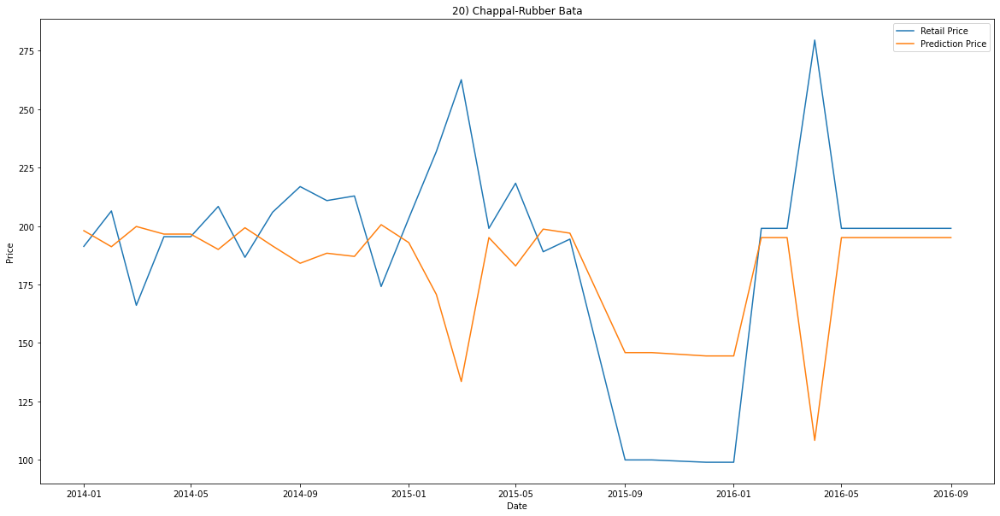

Accuracy :  0.5291799880977257
     Retail Price       Date  Prediction Price
60      52.727273 2014-01-01         56.352536
47      57.263158 2014-02-01         59.734481
97      53.500000 2014-03-01         56.931620
11      58.500000 2014-04-01         60.649188
110     59.142857 2014-05-01         61.123291
84      54.826087 2014-06-01         57.922629
72      58.850000 2014-07-01         60.907424
24      57.700000 2014-08-01         60.057926
147     64.055556 2014-09-01         64.715210
135     64.894737 2014-10-01         65.323047
124     70.764706 2014-11-01         69.524888
35      54.777778 2014-12-01         57.886589
61      52.166667 2015-01-01         55.931688
48      62.363636 2015-02-01         63.484535
98      59.916667 2015-03-01         61.692752
12      62.846154 2015-04-01         63.836208
111     55.285714 2015-05-01         58.265286
85      51.666667 2015-06-01         55.555828
73      46.500000 2015-07-01         51.645167
148     84.000000 2015-09-01 

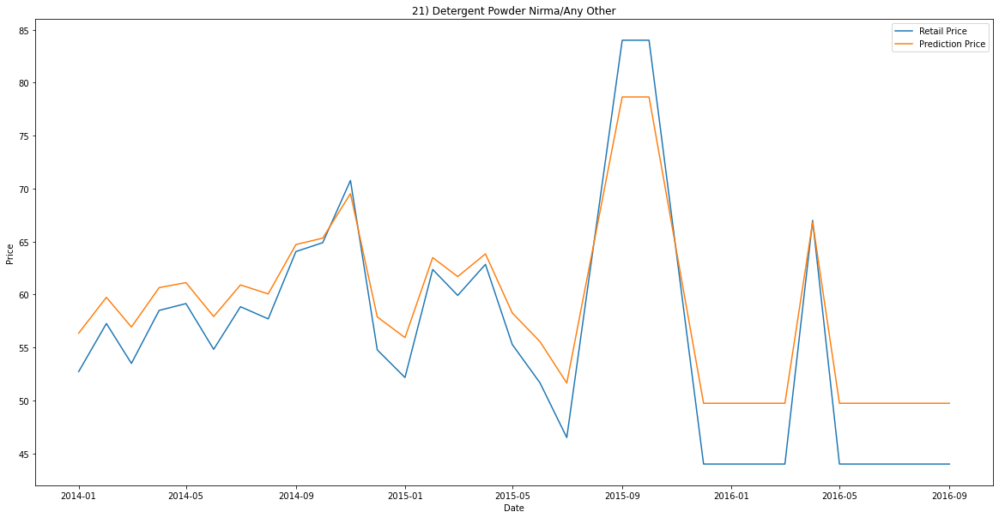

In [78]:
varieties_dm_nf=(dm_nf['Commodity']+"+"+dm_nf['Variety']).unique()           #looping through all the varieties
i=1
for item in varieties_dm_nf:
    itemName=item.split("+")
    C=itemName[0]                                                        #extracting the name of commodity and variety
    V=itemName[1]
    dm_nf_item=dm_nf[(dm_nf['Commodity']==C) & (dm_nf['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dm_nf_item['Date']
    item_specific_dp['Retail Price']=dm_nf_item['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    column_names = ["Date","Retail Price"]
    dm_nf_data=pd.DataFrame(columns=columns)
    dm_nf_data['Date']=item_specific_sorted['Date']
    dm_nf_data['Retail Price']=item_specific_sorted['Retail Price']
    dm_nf_data['Prediction Prices']=dm_nf_data[['Retail Price']].shift(-30)
    X=(dm_nf_data.drop(['Date','Prediction Prices'],axis=1))
    X=X[:-30]
    y=(dm_nf_data['Prediction Prices'])
    y=y[:-30]
    #splitting data into 80% training and 20% testing
    from sklearn.model_selection import train_test_split
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.09)
    #prediction days array is last 30 rows data from original data set
    prediction_days_array=(dm_nf_data.drop(['Date','Prediction Prices'],axis=1)).tail(30)
    from sklearn.svm import SVR
    #create and train the support vector machine (regression) using radial basis function
    svr_rbf=SVR(kernel='rbf',C=1e3,gamma=0.00001)
    svr_rbf.fit(x_train,y_train)
    #test the model
    svr_rbf_confidence=svr_rbf.score(x_test,y_test)
    print("Accuracy : ",svr_rbf_confidence)
    svm_prediction=svr_rbf.predict(x_test)
    svm_prediction=svr_rbf.predict(prediction_days_array)
    column_names = ["Date","Retail Price","Prediction Price"]
    data=pd.DataFrame(columns=columns)
    data['Date']=item_specific_sorted['Date'].tail(30)
    data['Retail Price']=item_specific_sorted['Retail Price'].tail(30)
    data['Prediction Price']=svm_prediction
    print(data)
    #plotting the prediction prices and actual price
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.plot(data['Date'], data['Retail Price'])
    plt.plot(data['Date'], data['Prediction Price'])
    plt.legend(["Retail Price","Prediction Price"])
    plt.show()

<h3>Weekly Non-Food Commodities<h3>

Accuracy :  0.911216948055673
     Retail Price       Date  Prediction Price
73      22.045455 2013-12-27         24.874452
137     21.956522 2014-01-31         24.789694
77      21.473684 2014-02-28         24.329446
80      23.666667 2014-03-28         26.418797
20      22.000000 2014-04-25         24.831132
122     22.473684 2014-05-30         25.282524
66      22.954545 2014-06-27         25.740628
25      23.550000 2014-07-25         26.307713
110     23.421053 2014-08-29         26.184928
45      26.250000 2014-09-26         28.876153
146     25.777778 2014-10-31         28.427315
92      25.125000 2014-11-28         27.806589
52      24.888889 2014-12-26         27.581997
116     25.250000 2015-01-30         27.925475
56      25.200000 2015-02-27         27.877922
58      25.000000 2015-03-27         27.687692
5       25.846154 2015-04-24         28.492315
103     24.142857 2015-05-29         26.872108
40      23.846154 2015-06-26         26.589677
141     23.666667 2015-07-31  

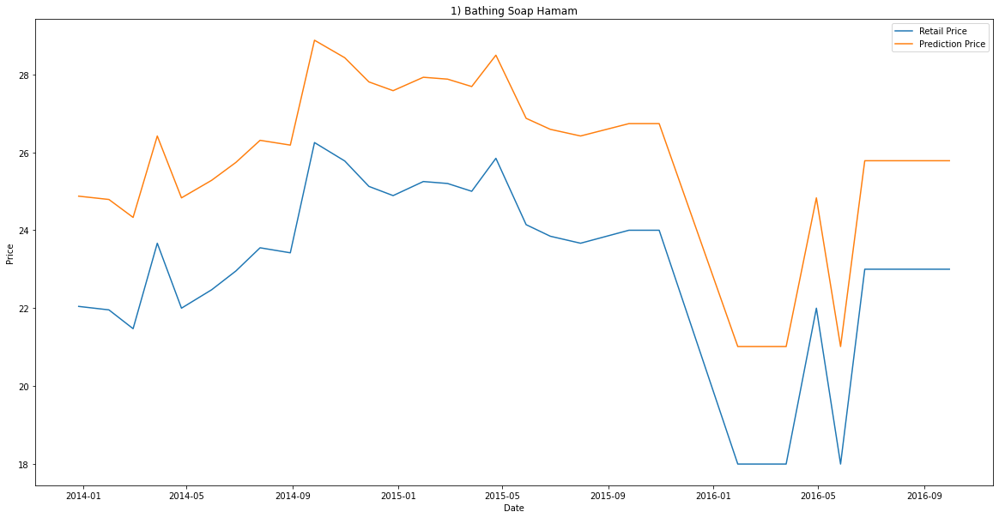

Accuracy :  0.9517336456716151
     Retail Price       Date  Prediction Price
138     18.791667 2014-01-31         20.785746
78      18.600000 2014-02-28         20.606879
81      18.090909 2014-03-28         20.131477
20      18.809524 2014-04-25         20.802407
123     18.714286 2014-05-30         20.713540
67      18.458333 2014-06-27         20.474632
25      20.619048 2014-07-25         22.487804
111     19.523810 2014-08-29         21.468399
46      21.500000 2014-09-26         23.306149
147     19.900000 2014-10-31         21.818789
93      22.055556 2014-11-28         23.821466
53      20.947368 2014-12-26         22.792962
117     22.153846 2015-01-30         23.912576
57      21.250000 2015-02-27         23.074065
59      21.923077 2015-03-27         23.698637
5       20.571429 2015-04-24         22.443528
104     21.133333 2015-05-29         22.965718
41      21.846154 2015-06-26         23.627301
142     21.666667 2015-07-31         23.460806
28      23.000000 2015-09-25 

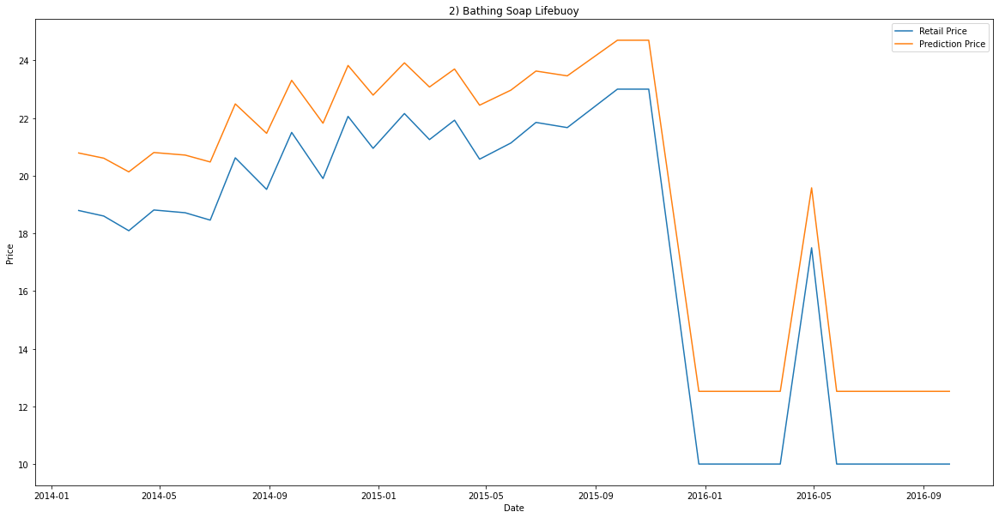

Accuracy :  0.6646846521880221
     Retail Price       Date  Prediction Price
140    304.380476 2014-01-31        308.851281
79     311.947368 2014-02-28        312.072572
81     301.150000 2014-03-28        307.341606
19     289.055556 2014-04-25        301.005180
124    284.899500 2014-05-30        298.589145
68     276.650000 2014-06-27        293.455187
24     317.444444 2014-07-25        314.129121
112    343.235294 2014-08-29        320.466549
48     365.800000 2014-09-26        321.460525
149    332.176471 2014-10-31        318.426703
94     291.400000 2014-11-28        302.315521
54     256.466667 2014-12-26        279.202420
118    300.272727 2015-01-30        306.918024
58     248.444444 2015-02-27        272.971923
60     329.000000 2015-03-27        317.651699
5      293.000000 2015-04-24        303.187558
105    338.461538 2015-05-29        319.711771
42     283.300000 2015-06-26        297.628267
144    409.400000 2015-07-31        312.111680
27     299.000000 2015-09-25 

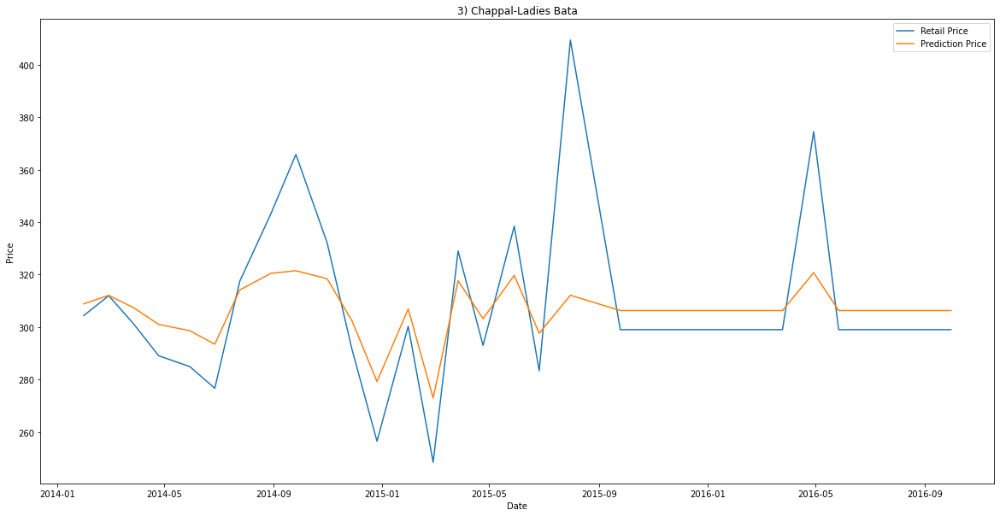

Accuracy :  -1.0129297139812903
     Retail Price       Date  Prediction Price
146    191.285238 2014-01-31        212.341871
82     206.444444 2014-02-28        208.559667
85     166.100000 2014-03-28        209.598482
21     195.444444 2014-04-25        211.699686
130    195.420526 2014-05-30        211.704245
70     208.368421 2014-06-27        207.800142
26     186.611111 2014-07-25        212.698799
117    205.882353 2014-08-29        208.769916
50     216.866667 2014-09-26        203.719985
156    210.875000 2014-10-31        206.718783
98     212.857143 2014-11-28        205.790846
56     174.133333 2014-12-26        211.727344
124    203.300000 2015-01-30        209.667661
60     231.875000 2015-02-27        193.756631
62     262.545455 2015-03-27        163.770153
5      199.000000 2015-04-24        210.911447
110    218.307692 2015-05-29        202.913195
44     189.000000 2015-06-26        212.564902
151    194.400000 2015-07-31        211.889468
29     100.000000 2015-09-25

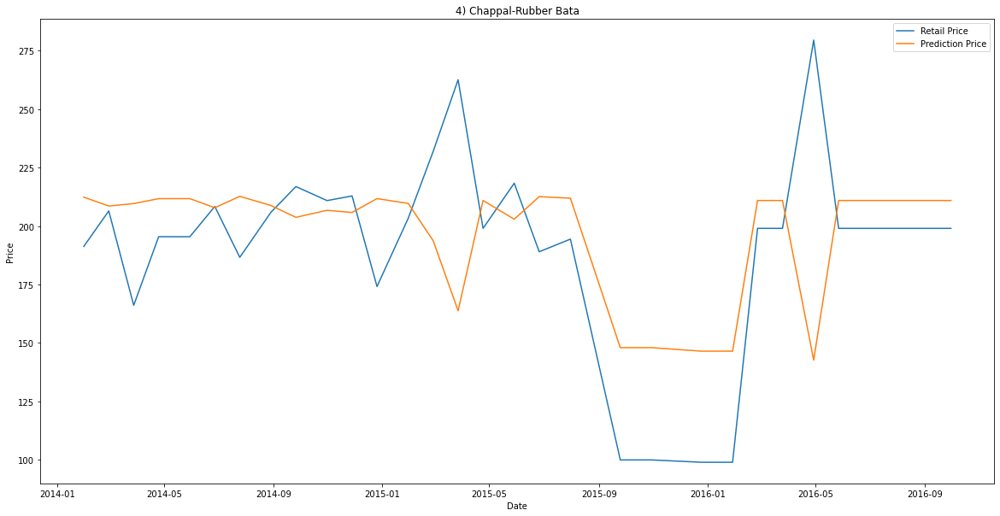

Accuracy :  0.42925760020763226
     Retail Price       Date  Prediction Price
138     52.727273 2014-01-31         56.659932
78      57.263158 2014-02-28         60.079933
81      53.500000 2014-03-28         57.245115
20      58.500000 2014-04-25         61.005956
123     59.142857 2014-05-30         61.486100
67      54.826087 2014-06-27         58.246958
25      58.850000 2014-07-25         61.267468
111     57.700000 2014-08-29         60.407329
46      64.055556 2014-09-26         65.127719
147     64.894737 2014-10-31         65.744669
93      70.764706 2014-11-28         70.015252
53      54.777778 2014-12-26         58.210515
117     52.166667 2015-01-30         56.234758
57      62.363636 2015-02-27         63.879223
59      59.916667 2015-03-27         62.062974
5       62.846154 2015-04-24         64.235903
104     55.285714 2015-05-29         58.593479
41      51.666667 2015-06-26         55.855111
142     46.500000 2015-07-31         51.909225
28      84.000000 2015-09-25

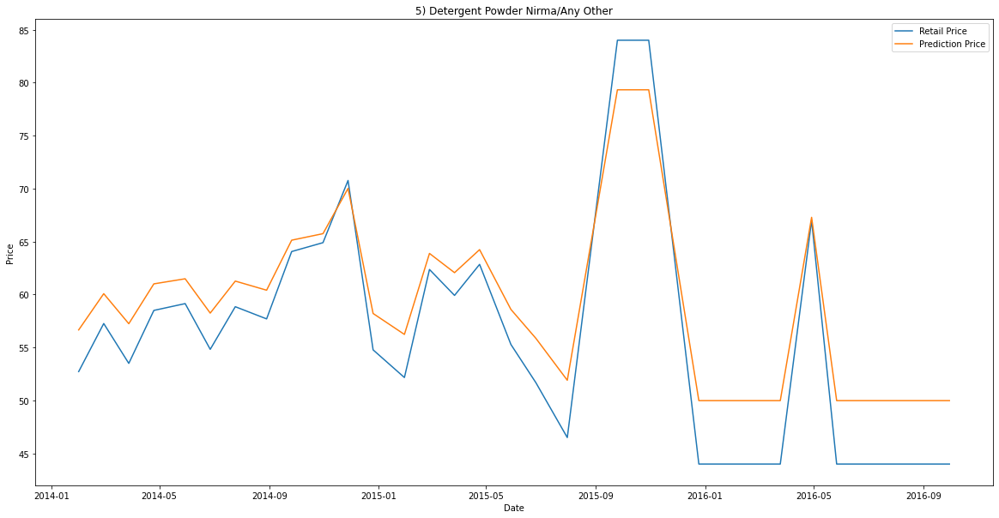

Accuracy :  0.1594529238278093
     Retail Price       Date  Prediction Price
146    377.817727 2014-01-31        389.313554
82     388.052632 2014-02-28        394.111128
85     377.952381 2014-03-28        389.381052
21     371.473684 2014-04-25        386.005463
130    376.399500 2014-05-30        388.595711
70     353.666667 2014-06-27        375.459369
26     358.315789 2014-07-25        378.382240
117    364.444444 2014-08-29        382.056361
50     370.750000 2014-09-26        385.612422
156    367.058824 2014-10-31        383.559042
98     356.400000 2014-11-28        377.191591
56     345.000000 2014-12-26        369.719690
124    362.636364 2015-01-30        380.994213
60     324.666667 2015-02-27        354.981838
62     367.083333 2015-03-27        383.572942
5      397.333333 2015-04-24        397.859560
110    407.857143 2015-05-29        401.391311
44     381.090909 2015-06-26        390.921639
151    382.833333 2015-07-31        391.749639
29     299.000000 2015-09-25 

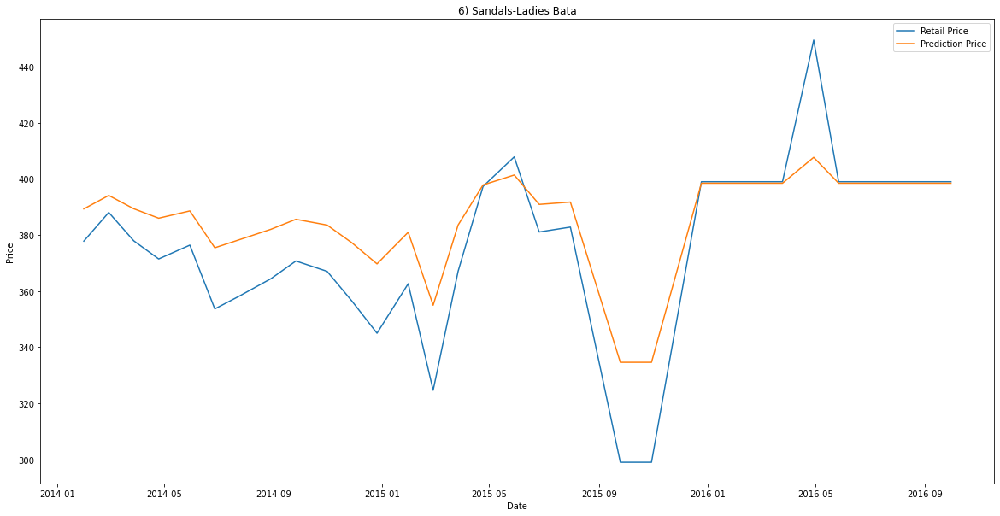

Accuracy :  0.7280039433021654
     Retail Price       Date  Prediction Price
139    371.000000 2014-01-31        484.749039
79     386.111111 2014-02-28        517.222841
81     384.761905 2014-03-28        514.326350
19     401.842105 2014-04-25        550.753055
124    416.700000 2014-05-30        581.675875
68     397.227273 2014-06-27        540.977839
24     427.578947 2014-07-25        603.597527
112    418.105263 2014-08-29        584.546471
47     341.176471 2014-09-26        421.859398
149    364.166667 2014-10-31        470.115155
94     376.875000 2014-11-28        497.372714
54     375.882353 2014-12-26        495.238449
119    421.818182 2015-01-30        592.077774
58     461.000000 2015-02-27        665.364615
60     389.090909 2015-03-27        523.612229
5      429.583333 2015-04-24        607.554820
105    357.692308 2015-05-29        456.338745
41     391.000000 2015-06-26        527.698825
144    415.000000 2015-07-31        578.189186
27     320.000000 2015-09-25 

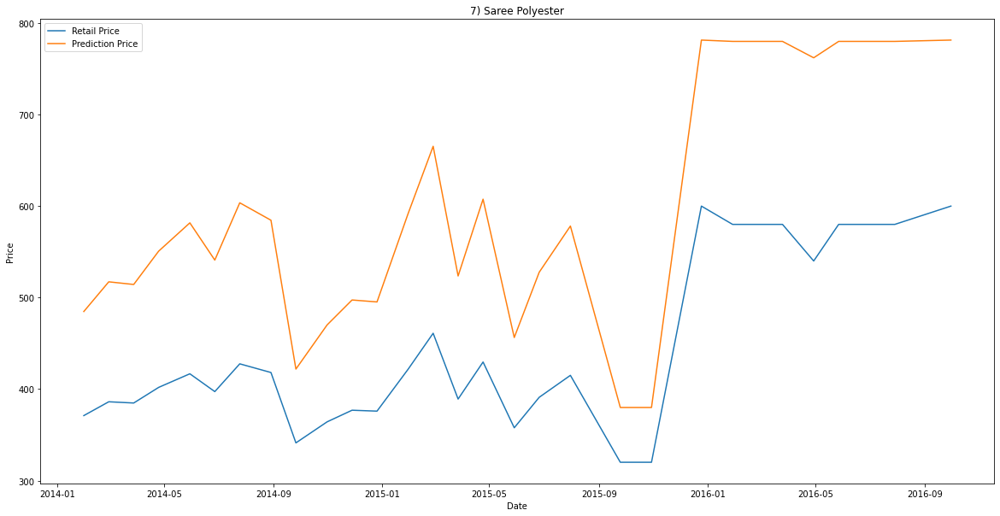

Accuracy :  0.7189862388162611
     Retail Price       Date  Prediction Price
139    396.086957 2014-01-31        546.409050
79     393.947368 2014-02-28        543.410778
81     416.136364 2014-03-28        572.227477
19     404.000000 2014-04-25        557.101728
124    398.333333 2014-05-30        549.508596
68     418.260870 2014-06-27        574.709765
24     416.100000 2014-07-25        572.184552
112    404.350000 2014-08-29        557.559909
47     390.388889 2014-09-26        538.326719
149    433.789474 2014-10-31        591.287431
94     452.058824 2014-11-28        607.132419
54     446.777778 2014-12-26        602.967060
119    480.583333 2015-01-30        623.744687
58     420.000000 2015-02-27        576.704091
60     454.750000 2015-03-27        609.124171
5      424.000000 2015-04-24        581.160830
105    432.142857 2015-05-29        589.662700
41     504.545455 2015-06-26        630.180663
144    479.166667 2015-07-31        623.152783
27     322.000000 2015-09-25 

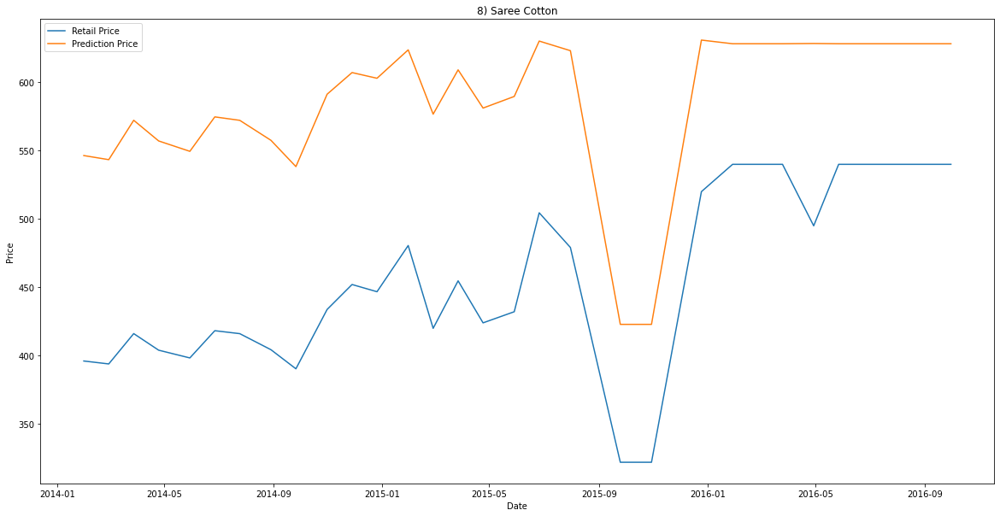

Accuracy :  -0.011600310581832085
     Retail Price       Date  Prediction Price
139    129.347826 2014-01-31        218.926418
79     120.100000 2014-02-28        197.379502
81     130.000000 2014-03-28        220.437413
19     123.333333 2014-04-25        204.935653
124    135.909091 2014-05-30        234.062440
68     155.416667 2014-06-27        277.911139
24     154.571429 2014-07-25        276.055839
112    150.761905 2014-08-29        267.638043
47     159.263158 2014-09-26        286.294083
149    136.050000 2014-10-31        234.385772
94     128.611111 2014-11-28        217.217997
54     131.842105 2014-12-26        224.697981
119    121.153846 2015-01-30        199.844526
58     133.750000 2015-02-27        229.098568
60     147.076923 2015-03-27        259.413370
5      144.785714 2015-04-24        254.261744
105    143.000000 2015-05-29        250.227848
41     135.833333 2015-06-26        233.888573
144    114.166667 2015-07-31        183.469651
27     199.000000 2015-09-

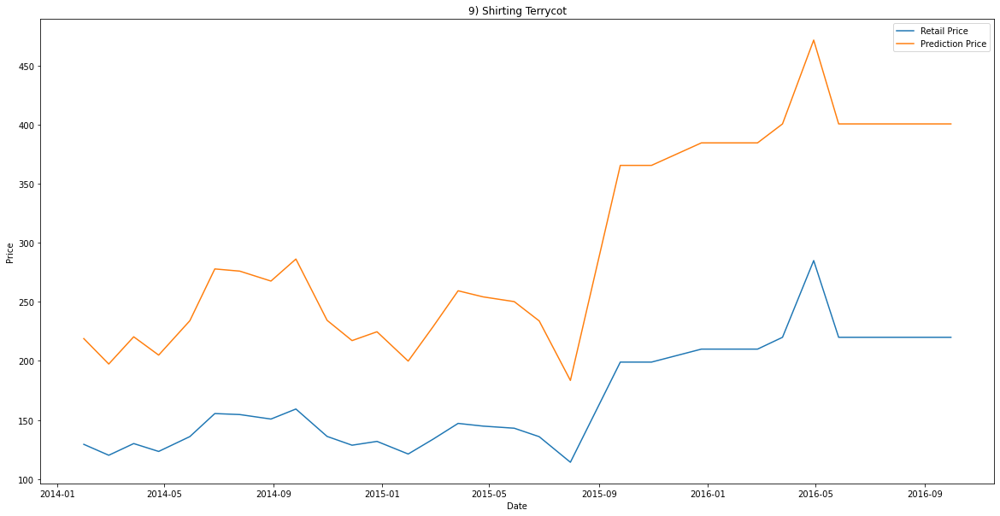

Accuracy :  0.7459203386735469
     Retail Price       Date  Prediction Price
139    143.181818 2014-01-31        185.557474
79     135.016500 2014-02-28        174.923746
81     138.333182 2014-03-28        179.259134
19     147.634762 2014-04-25        191.293356
124    154.560455 2014-05-30        200.105147
68     169.057826 2014-06-27        218.016024
24     163.866500 2014-07-25        211.695426
112    159.315789 2014-08-29        206.066775
47     164.611111 2014-09-26        212.608802
149    155.175263 2014-10-31        200.880230
94     142.725294 2014-11-28        184.966666
54     154.240556 2014-12-26        199.701366
119    136.194167 2015-01-30        176.465403
58     148.272727 2015-02-27        192.110893
60     146.486923 2015-03-27        189.819668
5      156.071429 2015-04-24        202.007777
105    146.688667 2015-05-29        190.078936
41     136.944167 2015-06-26        177.445934
144    109.666667 2015-07-31        141.399857
27     231.000000 2015-09-25 

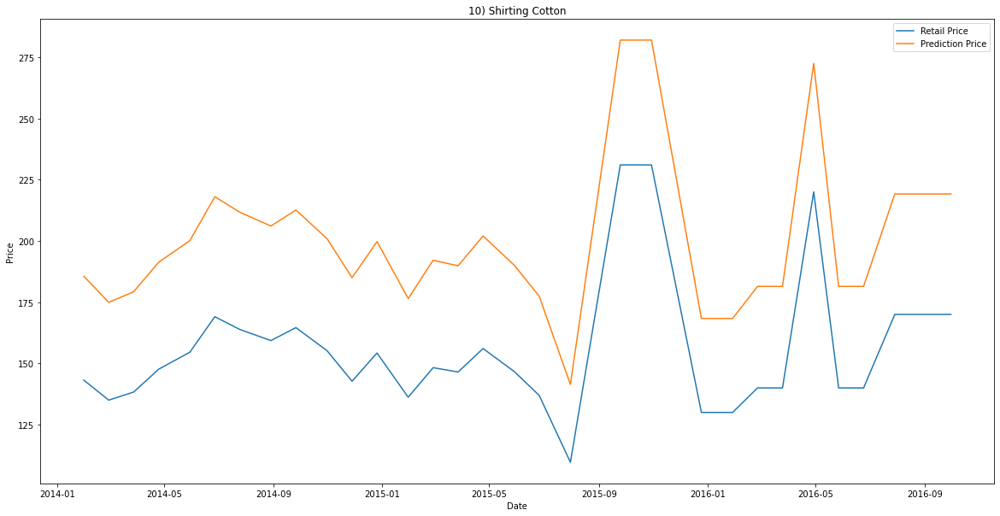

Accuracy :  0.2723045824479132
     Retail Price       Date  Prediction Price
146    874.315263 2014-01-31        899.335784
82     838.555556 2014-02-28        890.625585
85     862.523810 2014-03-28        895.874027
21     853.368421 2014-04-25        893.631542
130    831.999500 2014-05-30        889.465666
70     861.619048 2014-06-27        895.636500
26     858.789474 2014-07-25        894.917079
117    839.888889 2014-08-29        890.871691
50     826.312500 2014-09-26        888.509090
156    862.705882 2014-10-31        895.922278
98     951.533333 2014-11-28        944.742111
56     866.687500 2014-12-26        897.016430
124    884.363636 2015-01-30        902.889631
60     764.555556 2015-02-27        874.983347
62     897.833333 2015-03-27        908.653858
5      852.333333 2015-04-24        893.398946
110    885.000000 2015-05-29        903.135273
44     919.818182 2015-06-26        920.812905
151    694.400000 2015-07-31        830.641329
29     999.000000 2015-09-25 

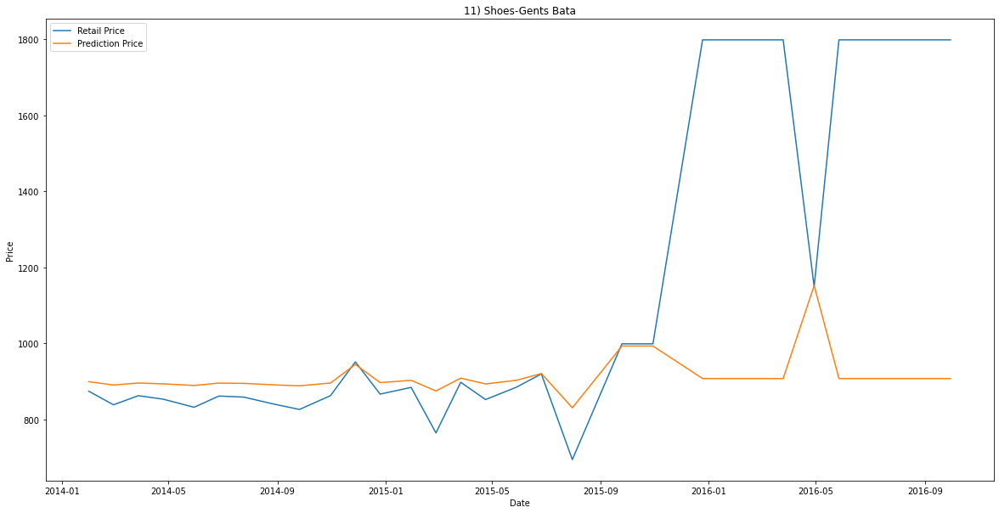

Accuracy :  0.7506372836763724
     Retail Price       Date  Prediction Price
132    130.217391 2014-01-31        179.932906
75     127.894737 2014-02-28        176.384036
77     130.238095 2014-03-28        179.964556
19     128.750000 2014-04-25        177.690391
118    127.619048 2014-05-30        175.963060
65     132.272727 2014-06-27        183.075947
24     133.850000 2014-07-25        185.489066
107    155.105263 2014-08-29        217.917634
45     159.529412 2014-09-26        224.598535
141    162.611111 2014-10-31        229.228025
89     171.562500 2014-11-28        242.536141
51     148.833333 2014-12-26        208.390293
113    136.166667 2015-01-30        189.034368
55     147.500000 2015-02-27        206.358282
57     151.166667 2015-03-27        211.941244
5      151.000000 2015-04-24        211.687838
100    130.000000 2015-05-29        179.600597
40     126.538462 2015-06-26        174.313625
136    121.666667 2015-07-31        166.892136
27     224.000000 2015-09-25 

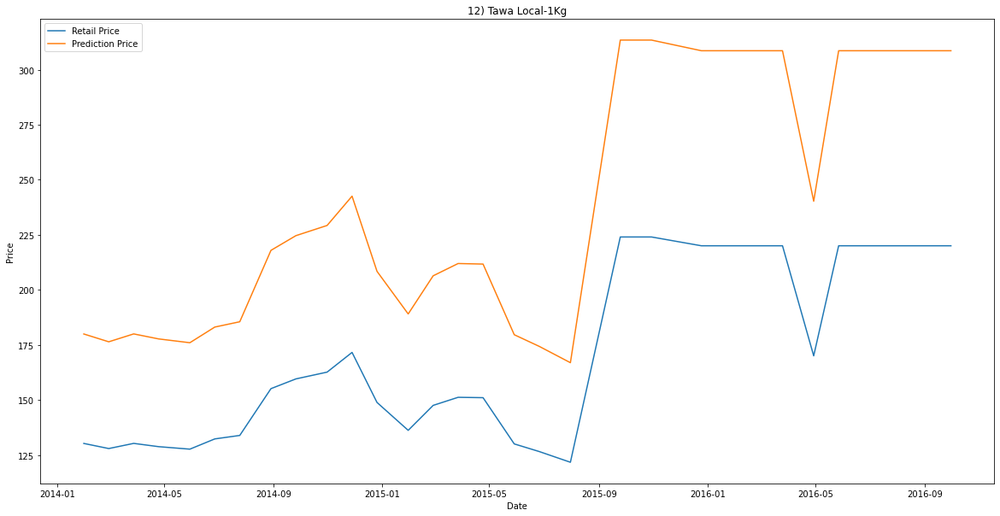

Accuracy :  0.5049611840846446
     Retail Price       Date  Prediction Price
139    289.545455 2014-01-31        368.033767
79     279.166667 2014-02-28        356.843053
81     313.272727 2014-03-28        389.996478
19     273.190476 2014-04-25        349.994545
124    291.047619 2014-05-30        369.576625
68     311.125000 2014-06-27        388.226048
24     302.350000 2014-07-25        380.535244
112    306.250000 2014-08-29        384.043379
47     308.333333 2014-09-26        385.858569
149    293.526316 2014-10-31        372.078811
94     331.588235 2014-11-28        403.257905
54     340.944444 2014-12-26        408.741194
119    331.000000 2015-01-30        402.883771
58     365.909091 2015-02-27        419.061773
60     306.416667 2015-03-27        384.190109
5      351.923077 2015-04-24        414.050356
105    313.000000 2015-05-29        389.774129
41     382.909091 2015-06-26        422.563393
144    282.500000 2015-07-31        360.536474
27     350.000000 2015-09-25 

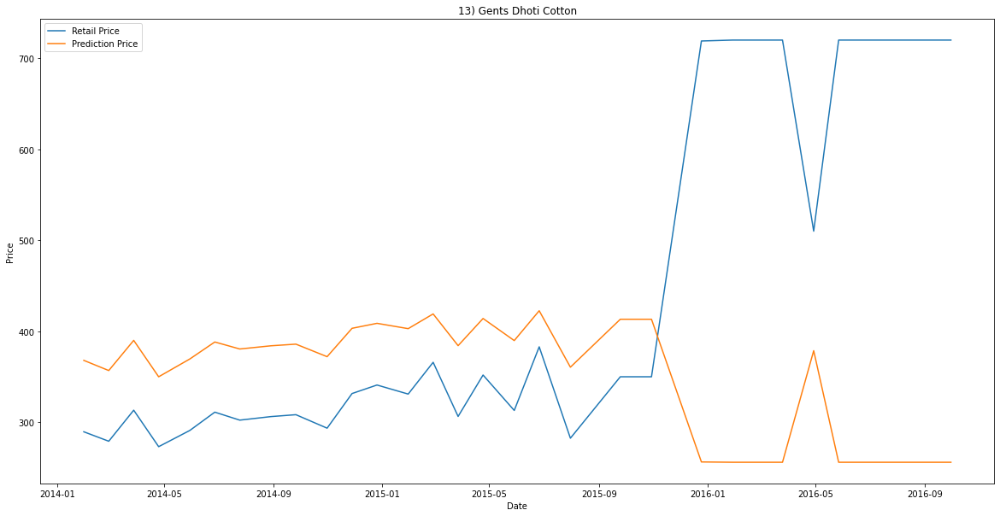

Accuracy :  0.0830516948226423
     Retail Price       Date  Prediction Price
126     19.113636 2013-05-31         18.336935
75      19.722222 2013-06-28         18.709839
37      17.777778 2013-07-26         17.518185
114     18.555556 2013-08-30         17.994920
64      18.368421 2013-09-27         17.880225
26      18.250000 2013-10-25         17.807641
103     18.785714 2013-11-29         18.135977
67      17.738095 2013-12-27         17.493859
124     17.840909 2014-01-31         17.556884
70      17.684211 2014-02-28         17.460828
72      17.500000 2014-03-28         17.347903
17      18.375000 2014-04-25         17.884257
111     17.200000 2014-05-30         17.163988
60      23.413043 2014-06-27         20.969468
22      16.976190 2014-07-25         17.026775
100     24.916667 2014-08-29         21.888828
41      26.441176 2014-09-26         22.820059
133     26.666667 2014-10-31         22.957712
84      26.250000 2014-11-28         22.703335
47      26.805556 2014-12-26 

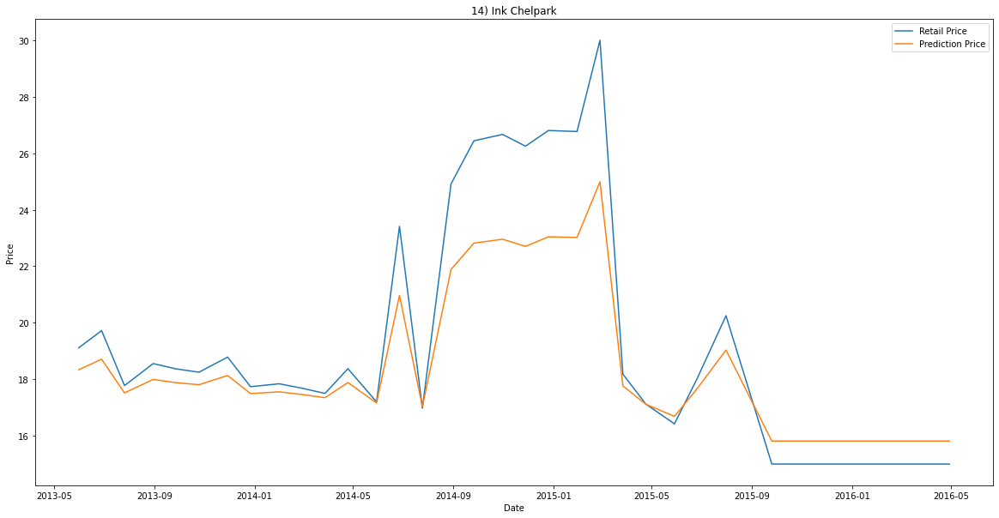

Accuracy :  0.5548874019335293
     Retail Price       Date  Prediction Price
132    291.739130 2014-01-31        264.427830
75     297.368421 2014-02-28        262.671165
77     282.500000 2014-03-28        266.489610
19     299.750000 2014-04-25        261.815899
118    295.238095 2014-05-30        263.379963
65     288.636364 2014-06-27        265.234995
24     304.650000 2014-07-25        259.849922
107    307.631579 2014-08-29        258.519683
45     317.058824 2014-09-26        253.664620
141    328.333333 2014-10-31        246.618742
89     342.187500 2014-11-28        236.251187
51     301.529412 2014-12-26        261.133895
113    316.000000 2015-01-30        254.258123
55     339.000000 2015-02-27        238.793952
57     337.583333 2015-03-27        239.894677
5      331.230769 2015-04-24        244.600770
100    301.428571 2015-05-29        261.173522
40     265.909091 2015-06-26        267.570789
136    206.666667 2015-07-31        244.097210
27     448.000000 2015-09-25 

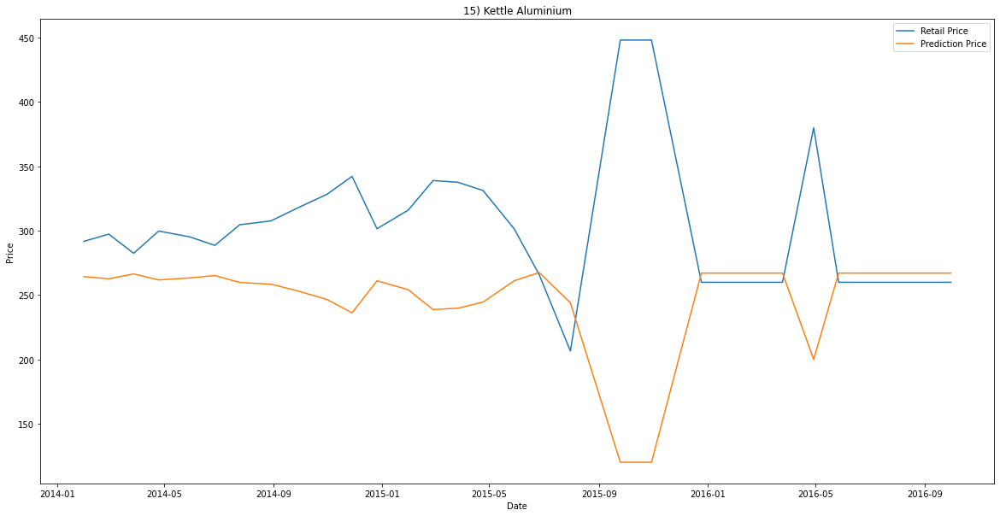

Accuracy :  0.512016994677033
     Retail Price       Date  Prediction Price
139    202.304348 2014-01-31        246.262345
79     201.650000 2014-02-28        245.272565
81     222.863636 2014-03-28        277.002025
19     207.285714 2014-04-25        253.780929
124    204.428571 2014-05-30        249.472318
68     235.541667 2014-06-27        295.394435
24     194.190476 2014-07-25        233.966302
112    215.095238 2014-08-29        265.489217
47     218.789474 2014-09-26        270.983369
149    236.050000 2014-10-31        296.119583
94     239.222222 2014-11-28        300.620665
54     224.526316 2014-12-26        279.444694
119    222.583333 2015-01-30        276.589422
58     228.333333 2015-02-27        285.005082
60     210.538462 2015-03-27        258.671153
5      244.357143 2015-04-24        307.813150
105    223.733333 2015-05-29        278.280743
41     241.333333 2015-06-26        303.592153
144    205.000000 2015-07-31        250.334912
27     210.000000 2015-09-25  

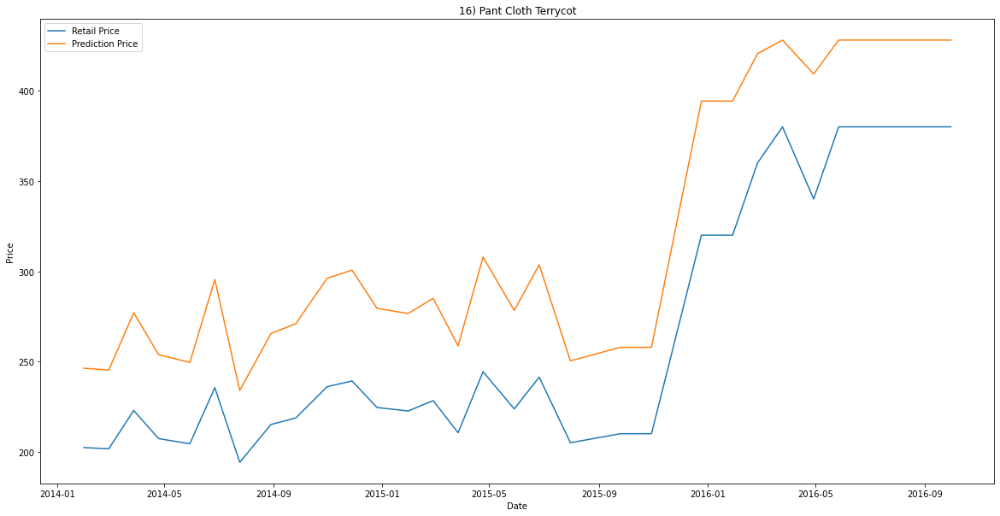

Accuracy :  0.4324237772412185
     Retail Price       Date  Prediction Price
132     36.238095 2014-01-31         37.159443
75      39.647059 2014-02-28         39.539714
77      27.900000 2014-03-28         31.370263
19      40.388889 2014-04-25         40.058450
118     40.222222 2014-05-30         39.941885
65      43.857143 2014-06-27         42.486499
24      39.473684 2014-07-25         39.418515
107     39.210526 2014-08-29         39.234579
45      34.294118 2014-09-26         35.805101
141     42.666667 2014-10-31         41.652606
89      45.800000 2014-11-28         43.848224
51      41.611111 2014-12-26         40.913608
113     48.000000 2015-01-30         45.391051
55      57.700000 2015-02-27         52.193220
57      42.416667 2015-03-27         41.477545
5       50.692308 2015-04-24         47.279748
100     39.500000 2015-05-29         39.436911
40      51.833333 2015-06-26         48.080214
136     45.000000 2015-07-31         43.287407
27      25.000000 2015-09-25 

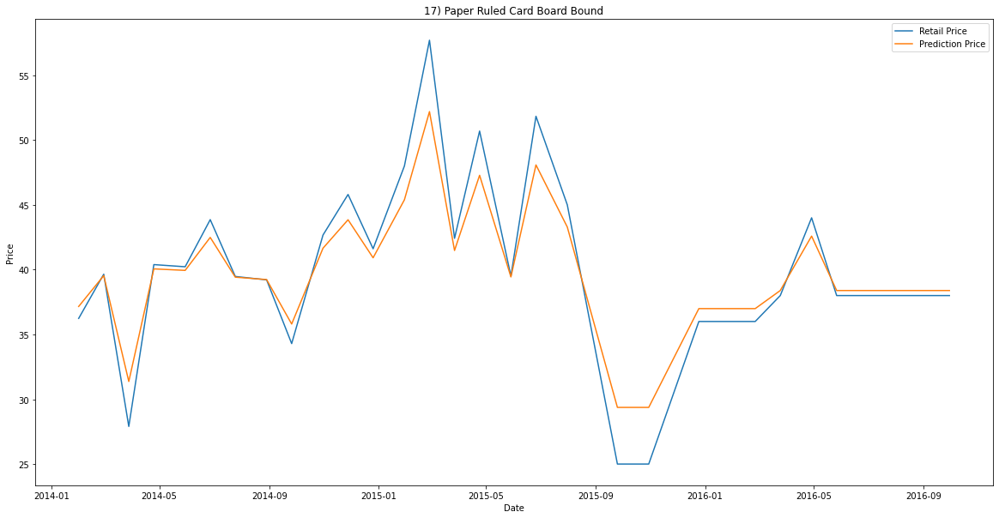

Accuracy :  0.744145005106345
     Retail Price       Date  Prediction Price
139    268.045455 2014-01-31        376.973671
79     254.000000 2014-02-28        347.078309
81     267.238095 2014-03-28        375.248439
19     246.100000 2014-04-25        330.475431
124    256.100000 2014-05-30        351.524405
68     307.363636 2014-06-27        459.715192
24     287.473684 2014-07-25        418.378188
112    325.263158 2014-08-29        495.046634
47     309.444444 2014-09-26        463.930293
149    310.111111 2014-10-31        465.275385
94     334.235294 2014-11-28        511.838703
54     327.176471 2014-12-26        498.684473
119    333.083333 2015-01-30        509.721713
58     360.000000 2015-02-27        555.761089
60     275.166667 2015-03-27        392.193742
5      340.416667 2015-04-24        522.989348
105    295.857143 2015-05-29        436.000187
41     317.363636 2015-06-26        479.726637
144    248.333333 2015-07-31        335.146642
27     366.000000 2015-09-25  

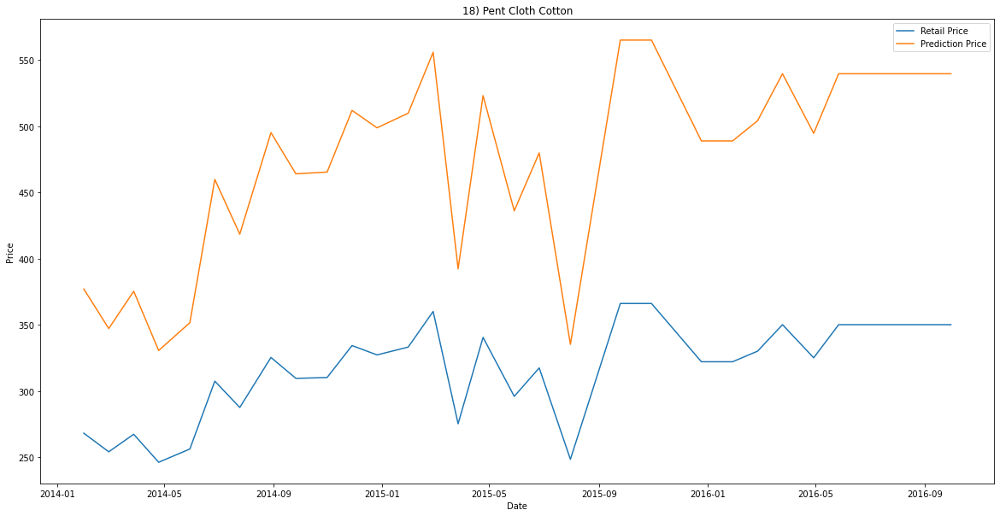

Accuracy :  0.33700568424240274
     Retail Price       Date  Prediction Price
136     40.875000 2014-01-31         45.120024
77      43.500000 2014-02-28         47.718517
79      39.636364 2014-03-28         43.891817
20      43.476190 2014-04-25         47.694977
122     42.590909 2014-05-30         46.819328
67      41.739130 2014-06-27         45.976120
25      41.714286 2014-07-25         45.951516
111     40.904762 2014-08-29         45.149519
47      43.947368 2014-09-26         48.160713
146     42.800000 2014-10-31         47.026212
92      45.888889 2014-11-28         50.077346
53      42.894737 2014-12-26         47.119935
117     47.230769 2015-01-30         51.399547
57      49.916667 2015-02-27         54.039339
59      48.615385 2015-03-27         52.761561
5       47.785714 2015-04-24         51.945722
104     47.333333 2015-05-29         51.500519
41      41.615385 2015-06-26         45.853565
141     35.666667 2015-07-31         39.948175
28      39.000000 2015-09-25

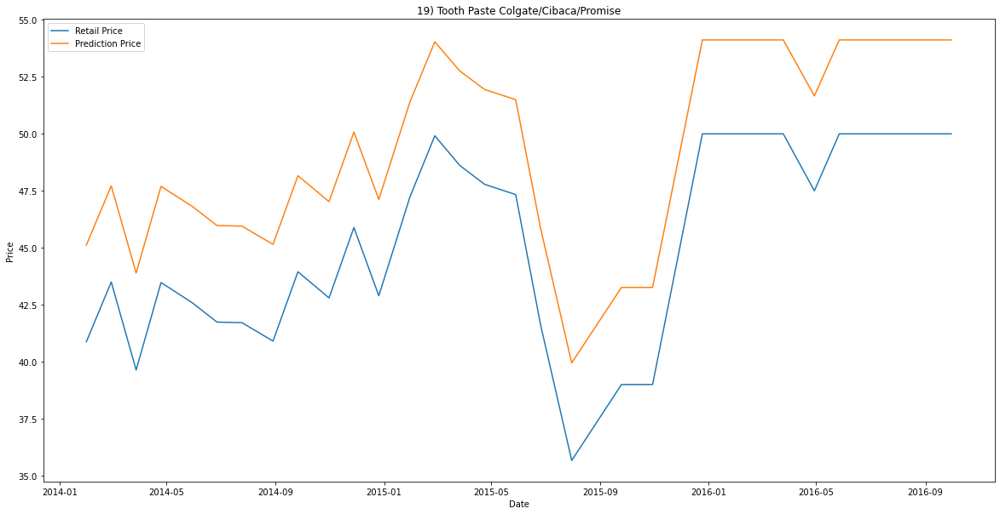

Accuracy :  -0.23569808143239324
     Retail Price       Date  Prediction Price
131     32.956522 2013-05-31         32.728307
78      33.833333 2013-06-28         33.268209
39      31.277778 2013-07-26         31.694266
118     32.578947 2013-08-30         32.495771
66      32.842105 2013-09-27         32.657844
27      34.333333 2013-10-25         33.576020
107     30.933333 2013-11-29         31.482059
69      33.600000 2013-12-27         33.124547
128     33.190476 2014-01-31         32.872380
72      31.722222 2014-02-28         31.968063
74      32.000000 2014-03-28         32.139174
18      32.888889 2014-04-25         32.686656
115     32.055556 2014-05-30         32.173395
62      32.150000 2014-06-27         32.231570
23      32.235294 2014-07-25         32.284107
104     30.352941 2014-08-29         31.124463
43      34.800000 2014-09-26         33.863260
138     31.705882 2014-10-31         31.957998
87      35.214286 2014-11-28         34.118216
49      29.812500 2014-12-2

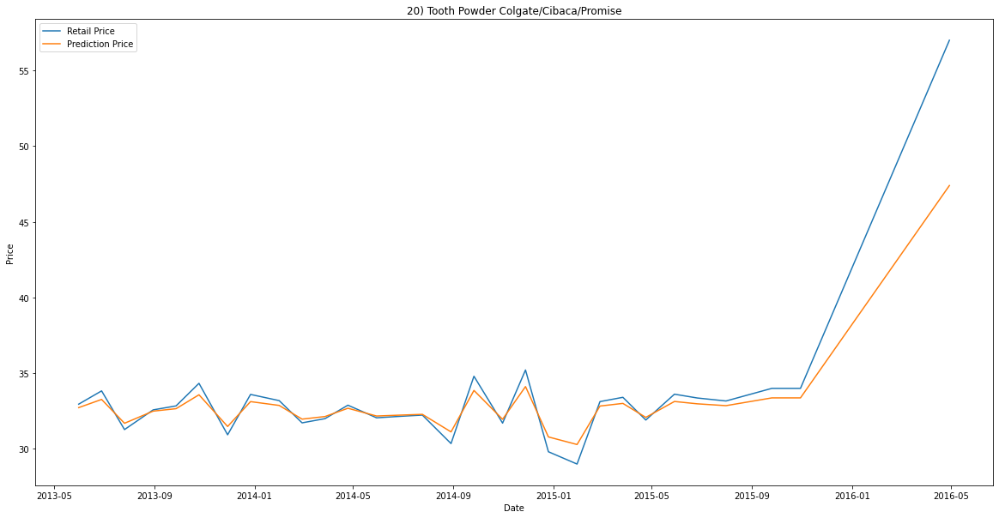

Accuracy :  0.30283441611447703
     Retail Price       Date  Prediction Price
132    128.477273 2014-01-31        154.683514
75     141.750000 2014-02-28        172.006448
77     124.075000 2014-03-28        149.146367
19     140.078947 2014-04-25        169.778061
118    152.325000 2014-05-30        186.378319
65     146.204545 2014-06-27        178.006130
24     145.184211 2014-07-25        176.624515
107    159.815789 2014-08-29        196.798814
45     158.029412 2014-09-26        194.298320
141    174.250000 2014-10-31        217.274925
89     132.100000 2014-11-28        159.322111
51     141.500000 2014-12-26        171.672267
113    129.576923 2015-01-30        156.083919
55     112.954545 2015-02-27        135.691408
57     174.875000 2015-03-27        218.169865
5      160.678571 2015-04-24        198.009657
100    181.892857 2015-05-29        228.246676
40     156.269231 2015-06-26        191.843564
136    102.916667 2015-07-31        124.272110
27     238.000000 2015-09-25

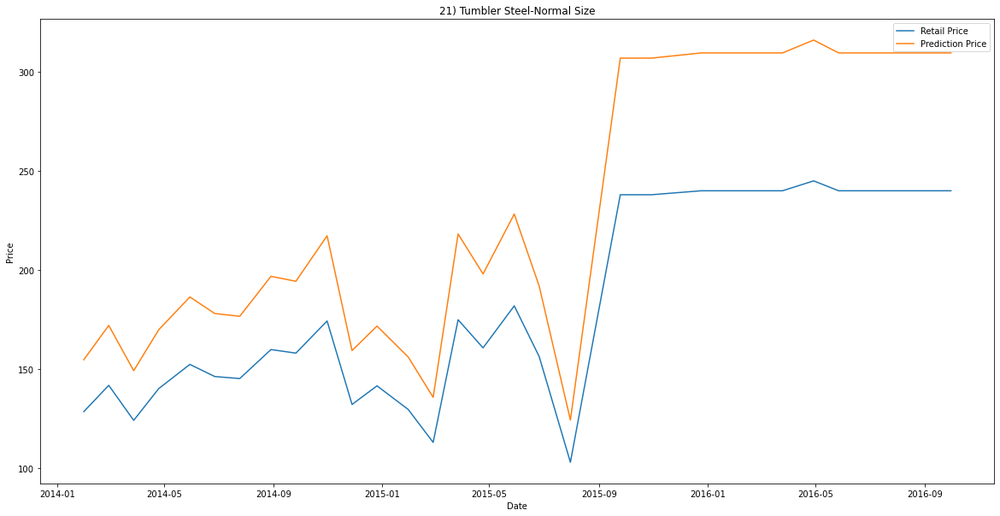

In [76]:
varieties_dw_nf=(dw_nf['Commodity']+"+"+dw_nf['Variety']).unique()                #looping through all the varieties
i=1 
for item in varieties_dw_nf:
    itemName=item.split("+")
    C=itemName[0]                                                            #extracting the name of commodity and variety
    V=itemName[1]
    dw_nf_item=dw_nf[(dw_nf['Commodity']==C) & (dw_nf['Variety']==V)]
    column_names = ["Date", "Retail Price"]
    item_specific_dp=pd.DataFrame(columns=column_names)
    item_specific_dp['Date']=dw_nf_item['Date']
    item_specific_dp['Retail Price']=dw_nf_item['Retail Price']
    from datetime import datetime
    item_specific_dp_grouped=(item_specific_dp.groupby('Date').mean())['Retail Price'].reset_index()
    item_specific_dp_grouped['Date'] = pd.to_datetime(item_specific_dp_grouped['Date'])
    item_specific_sorted = item_specific_dp_grouped.sort_values(by='Date', ascending=True)
    column_names = ["Date","Retail Price"]
    dw_nf_data=pd.DataFrame(columns=columns)
    dw_nf_data['Date']=item_specific_sorted['Date']
    dw_nf_data['Retail Price']=item_specific_sorted['Retail Price']
    dw_nf_data['Prediction Prices']=dw_nf_data[['Retail Price']].shift(-30)
    X=(dw_nf_data.drop(['Date','Prediction Prices'],axis=1))
    X=X[:-30]
    y=(dw_nf_data['Prediction Prices'])
    y=y[:-30]
    #splitting data into 80% training and 20% testing
    from sklearn.model_selection import train_test_split
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.09)
    #prediction days array is last 30 rows data from original data set
    prediction_days_array=(dw_nf_data.drop(['Date','Prediction Prices'],axis=1)).tail(30)
    from sklearn.svm import SVR
    #create and train the support vector machine (regression) using radial basis function
    svr_rbf=SVR(kernel='rbf',C=1e3,gamma=0.00001)
    svr_rbf.fit(x_train,y_train)
    #test the model
    svr_rbf_confidence=svr_rbf.score(x_test,y_test)
    print("Accuracy : ",svr_rbf_confidence)
    svm_prediction=svr_rbf.predict(x_test)
    svm_prediction=svr_rbf.predict(prediction_days_array)
    column_names = ["Date","Retail Price","Prediction Price"]
    data=pd.DataFrame(columns=columns)
    data['Date']=item_specific_sorted['Date'].tail(30)
    data['Retail Price']=item_specific_sorted['Retail Price'].tail(30)
    data['Prediction Price']=svm_prediction
    print(data)
    #plotting the prediction prices and actual price
    plt.figure(figsize = (20, 10))
    plt.title(str(i)+") "+C+" "+V)
    i = i + 1
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.plot(data['Date'], data['Retail Price'])
    plt.plot(data['Date'], data['Prediction Price'])
    plt.legend(["Retail Price","Prediction Price"])
    plt.show()